# 24-1. Project: 모델 바꿔보기

### 라이브러리 버전 확인
---
프로젝트에 사용할 주요 라이브러리 버전을 확인해봅니다.

In [1]:
import tensorflow as tf
import numpy as np
import PIL
import ray

print(tf.__version__)
print(np.__version__)
print(PIL.__version__)
print(ray.__version__)

2.6.0
1.21.4
8.3.2
1.7.0


### simplebaseline 모델로 변경해 봅시다
---
지금까지 우리는 StackedHourglass Network 기반으로 학습을 진행해 왔습니다.

그러나 지난 시간에 살펴본 것처럼 Simplebaseline 모델은 이보다 훨씬 간단한 모델 구조에도 불구하고 더욱 좋은 성능을 보여주었던 바 있습니다.

실제로도 그런 성능을 얻을 수 있을지 확인해 보겠습니다.

### MPII 데이터셋 다운로드하기
---
오늘은 MPII Human Pose Dataset을 사용해서 Human Pose Estimation task를 위한 모델을 훈련시켜 보겠습니다.

http://human-pose.mpi-inf.mpg.de/#download  

미리 준비해 둔 데이터를 연결하고 압축을 해제해 주세요.
```bash
$ mkdir -p ~/aiffel/mpii
$ ln -s ~/data/* ~/aiffel/mpii
$ cd ~/aiffel/mpii
$ tar -xvf mpii_human_pose_v1.tar.gz -C . 
$ unzip mpii_human_pose_v1_u12_2.zip
```

mpii_human_pose_v1_u12_2.zip 을 풀어보면 mpii_human_pose_v1_u12_1.mat 파일이 나와서 열어보기 불편한데요. 파이썬에서 읽기 쉽도록 json 파일로 변환해 두었습니다.

```bash
$ cd ~/aiffel/mpii/mpii_human_pose_v1_u12_2
$ wget https://d3s0tskafalll9.cloudfront.net/media/documents/train.json
$ wget https://d3s0tskafalll9.cloudfront.net/media/documents/validation.json
```

mpii.zip
마지막으로, 오늘의 실습 코드를 프로젝트로 구성한 파일을 압축 해제합니다.

```bash
$ cd ~/aiffel/mpii && unzip mpii.zip
```

이번 노드에서는 이 프로젝트 파일을 LMS환경에 맞게 편집하여 진행합니다. .py 파일 원본을 확인하면 학습에 도움이 되실거예요.

In [2]:
# 주의! ray를 tensorflow보다 먼저 import하면 오류가 발생할 수 있습니다
import io, json, os, math

import tensorflow as tf
from tensorflow.keras.layers import Add, Concatenate, Lambda
from tensorflow.keras.layers import Input, Conv2D, ReLU, MaxPool2D
from tensorflow.keras.layers import UpSampling2D, ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization
import ray

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

PROJECT_PATH = os.getenv('HOME') + '/aiffel/mpii'
IMAGE_PATH = os.path.join(PROJECT_PATH, 'images')
MODEL_PATH = os.path.join(PROJECT_PATH, 'models')
TFRECORD_PATH = os.path.join(PROJECT_PATH, 'tfrecords_mpii')
TRAIN_JSON = os.path.join(PROJECT_PATH, 'mpii_human_pose_v1_u12_2', 'train.json')
VALID_JSON = os.path.join(PROJECT_PATH, 'mpii_human_pose_v1_u12_2', 'validation.json')

MODEL_CUSTOM_PATH = os.path.join(PROJECT_PATH, 'models_custom')
print('슝=3')

슝=3


In [3]:
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.applications import ResNet50
import time

In [4]:
EPOCHS = 20
IMAGE_SHAPE = (256, 256, 3)
HEATMAP_SIZE = (64, 64)

### 데이터 전처리

#### json 파싱

In [5]:
with open(TRAIN_JSON) as train_json:
    train_annos = json.load(train_json)
    json_formatted_str = json.dumps(train_annos[0], indent=2)
    print(json_formatted_str)

{
  "joints_vis": [
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1
  ],
  "joints": [
    [
      620.0,
      394.0
    ],
    [
      616.0,
      269.0
    ],
    [
      573.0,
      185.0
    ],
    [
      647.0,
      188.0
    ],
    [
      661.0,
      221.0
    ],
    [
      656.0,
      231.0
    ],
    [
      610.0,
      187.0
    ],
    [
      647.0,
      176.0
    ],
    [
      637.0201,
      189.8183
    ],
    [
      695.9799,
      108.1817
    ],
    [
      606.0,
      217.0
    ],
    [
      553.0,
      161.0
    ],
    [
      601.0,
      167.0
    ],
    [
      692.0,
      185.0
    ],
    [
      693.0,
      240.0
    ],
    [
      688.0,
      313.0
    ]
  ],
  "image": "015601864.jpg",
  "scale": 3.021046,
  "center": [
    594.0,
    257.0
  ]
}


In [6]:
# json annotation 파싱 함수
def parse_one_annotation(anno, image_dir):
    filename = anno['image']
    joints = anno['joints']
    joints_visibility = anno['joints_vis']
    annotation = {
        'filename': filename,
        'filepath': os.path.join(image_dir, filename),
        'joints_visibility': joints_visibility,
        'joints': joints,
        'center': anno['center'],
        'scale' : anno['scale']
    }
    return annotation

print('슝=3')

슝=3


In [7]:
# parse_one_annotation 테스트
with open(TRAIN_JSON) as train_json:
    train_annos = json.load(train_json)
    test = parse_one_annotation(train_annos[0], IMAGE_PATH)
    print(test)

{'filename': '015601864.jpg', 'filepath': '/aiffel/aiffel/mpii/images/015601864.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[620.0, 394.0], [616.0, 269.0], [573.0, 185.0], [647.0, 188.0], [661.0, 221.0], [656.0, 231.0], [610.0, 187.0], [647.0, 176.0], [637.0201, 189.8183], [695.9799, 108.1817], [606.0, 217.0], [553.0, 161.0], [601.0, 167.0], [692.0, 185.0], [693.0, 240.0], [688.0, 313.0]], 'center': [594.0, 257.0], 'scale': 3.021046}


In [8]:
# TFRecord로 변환하는 함수
def generate_tfexample(anno):

    # byte 인코딩을 위한 함수
    def _bytes_feature(value):
        if isinstance(value, type(tf.constant(0))):
            value = value.numpy()
        return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

    filename = anno['filename']
    filepath = anno['filepath']
    with open(filepath, 'rb') as image_file:
        content = image_file.read()

    image = Image.open(filepath)
    if image.format != 'JPEG' or image.mode != 'RGB':
        image_rgb = image.convert('RGB')
        with io.BytesIO() as output:
            image_rgb.save(output, format="JPEG", quality=95)
            content = output.getvalue()

    width, height = image.size
    depth = 3

    c_x = int(anno['center'][0])
    c_y = int(anno['center'][1])
    scale = anno['scale']

    x = [
        int(joint[0]) if joint[0] >= 0 else int(joint[0]) 
        for joint in anno['joints']
    ]
    y = [
        int(joint[1]) if joint[1] >= 0 else int(joint[0]) 
        for joint in anno['joints']
    ]

    v = [0 if joint_v == 0 else 2 for joint_v in anno['joints_visibility']]

    feature = {
        'image/height':
        tf.train.Feature(int64_list=tf.train.Int64List(value=[height])),
        'image/width':
        tf.train.Feature(int64_list=tf.train.Int64List(value=[width])),
        'image/depth':
        tf.train.Feature(int64_list=tf.train.Int64List(value=[depth])),
        'image/object/parts/x':
        tf.train.Feature(int64_list=tf.train.Int64List(value=x)),
        'image/object/parts/y':
        tf.train.Feature(int64_list=tf.train.Int64List(value=y)),
        'image/object/center/x': 
        tf.train.Feature(int64_list=tf.train.Int64List(value=[c_x])),
        'image/object/center/y': 
        tf.train.Feature(int64_list=tf.train.Int64List(value=[c_y])),
        'image/object/scale':
        tf.train.Feature(float_list=tf.train.FloatList(value=[scale])),
        'image/object/parts/v':
        tf.train.Feature(int64_list=tf.train.Int64List(value=v)),
        'image/encoded':
        _bytes_feature(content),
        'image/filename':
        _bytes_feature(filename.encode())
    }

    return tf.train.Example(features=tf.train.Features(feature=feature))

print('슝=3')

슝=3


In [9]:
def chunkify(l, n):
    size = len(l) // n
    start = 0
    results = []
    for i in range(n):
        results.append(l[start:start + size])
        start += size
    return results

print('슝=3')

슝=3


In [10]:
# 하나의 chunk를 TFRecord로 만들어 주는 함수
@ray.remote
def build_single_tfrecord(chunk, path):
    print('start to build tf records for ' + path)

    with tf.io.TFRecordWriter(path) as writer:
        for anno in chunk:
            tf_example = generate_tfexample(anno)
            writer.write(tf_example.SerializeToString())

    print('finished building tf records for ' + path)

print('슝=3')

슝=3


In [11]:
# 전체 데이터를 적당한 수의 TFRecord 파일로 만들어주는 함수
def build_tf_records(annotations, total_shards, split):
    chunks = chunkify(annotations, total_shards)
    futures = [
        build_single_tfrecord.remote(
            chunk, '{}/{}_{}_of_{}.tfrecords'.format(
                TFRECORD_PATH,
                split,
                str(i + 1).zfill(4),
                str(total_shards).zfill(4),
            )) for i, chunk in enumerate(chunks)
    ]
    ray.get(futures)

print('슝=3')

슝=3


앞서 작성한 함수를 사용해 데이터를 TFRecord로 만들어 줍니다. train 데이터는 64개로, val 데이터는 8개의 파일로 만듭니다. 시간이 꽤 걸립니다.

In [12]:
num_train_shards = 64
num_val_shards = 8

ray.init()

print('Start to parse annotations.')
if not os.path.exists(TFRECORD_PATH):
    os.makedirs(TFRECORD_PATH)

with open(TRAIN_JSON) as train_json:
    train_annos = json.load(train_json)
    train_annotations = [
        parse_one_annotation(anno, IMAGE_PATH)
        for anno in train_annos
    ]
    print('First train annotation: ', train_annotations[0])

with open(VALID_JSON) as val_json:
    val_annos = json.load(val_json)
    val_annotations = [
        parse_one_annotation(anno, IMAGE_PATH) 
        for anno in val_annos
    ]
    print('First val annotation: ', val_annotations[0])
    
print('Start to build TF Records.')
build_tf_records(train_annotations, num_train_shards, 'train')
build_tf_records(val_annotations, num_val_shards, 'val')

print('Successfully wrote {} annotations to TF Records.'.format(
    len(train_annotations) + len(val_annotations)))

2025-01-08 14:22:20,338	WARNING services.py:1729 -- WARNING: The object store is using /tmp instead of /dev/shm because /dev/shm has only 67108864 bytes available. This will harm performance! You may be able to free up space by deleting files in /dev/shm. If you are inside a Docker container, you can increase /dev/shm size by passing '--shm-size=3.73gb' to 'docker run' (or add it to the run_options list in a Ray cluster config). Make sure to set this to more than 30% of available RAM.


Start to parse annotations.
First train annotation:  {'filename': '015601864.jpg', 'filepath': '/aiffel/aiffel/mpii/images/015601864.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[620.0, 394.0], [616.0, 269.0], [573.0, 185.0], [647.0, 188.0], [661.0, 221.0], [656.0, 231.0], [610.0, 187.0], [647.0, 176.0], [637.0201, 189.8183], [695.9799, 108.1817], [606.0, 217.0], [553.0, 161.0], [601.0, 167.0], [692.0, 185.0], [693.0, 240.0], [688.0, 313.0]], 'center': [594.0, 257.0], 'scale': 3.021046}
First val annotation:  {'filename': '005808361.jpg', 'filepath': '/aiffel/aiffel/mpii/images/005808361.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[804.0, 711.0], [816.0, 510.0], [908.0, 438.0], [1040.0, 454.0], [906.0, 528.0], [883.0, 707.0], [974.0, 446.0], [985.0, 253.0], [982.7591, 235.9694], [962.2409, 80.0306], [869.0, 214.0], [798.0, 340.0], [902.0, 253.0], [1067.0, 253.0], [1167.0, 353.0], [1142.0, 478.0]], 'c

(build_single_tfrecord pid=675) finished building tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0025_of_0064.tfrecords
(build_single_tfrecord pid=675) start to build tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0028_of_0064.tfrecords
(build_single_tfrecord pid=677) finished building tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0026_of_0064.tfrecords
(build_single_tfrecord pid=677) start to build tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0029_of_0064.tfrecords
(build_single_tfrecord pid=676) finished building tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0027_of_0064.tfrecords
(build_single_tfrecord pid=676) start to build tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0030_of_0064.tfrecords
(build_single_tfrecord pid=675) finished building tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0028_of_0064.tfrecords
(build_single_tfrecord pid=675) start to build tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_003

(build_single_tfrecord pid=675) finished building tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0055_of_0064.tfrecords
(build_single_tfrecord pid=675) start to build tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0058_of_0064.tfrecords
(build_single_tfrecord pid=677) finished building tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0056_of_0064.tfrecords
(build_single_tfrecord pid=677) start to build tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0059_of_0064.tfrecords
(build_single_tfrecord pid=676) finished building tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0057_of_0064.tfrecords
(build_single_tfrecord pid=676) start to build tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0060_of_0064.tfrecords
(build_single_tfrecord pid=675) finished building tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_0058_of_0064.tfrecords
(build_single_tfrecord pid=675) start to build tf records for /aiffel/aiffel/mpii/tfrecords_mpii/train_006

### data label 로 만들기

In [13]:
class Preprocessor(object):
    def __init__(self,
                 image_shape=(256, 256, 3),
                 heatmap_shape=(64, 64, 16),
                 is_train=False):
        self.is_train = is_train
        self.image_shape = image_shape
        self.heatmap_shape = heatmap_shape

    def __call__(self, example):
        features = self.parse_tfexample(example)
        image = tf.io.decode_jpeg(features['image/encoded'])

        if self.is_train:
            random_margin = tf.random.uniform([1], 0.1, 0.3)[0]
            image, keypoint_x, keypoint_y = self.crop_roi(image, features, margin=random_margin)
            image = tf.image.resize(image, self.image_shape[0:2])
        else:
            image, keypoint_x, keypoint_y = self.crop_roi(image, features)
            image = tf.image.resize(image, self.image_shape[0:2])

        image = tf.cast(image, tf.float32) / 127.5 - 1
        heatmaps = self.make_heatmaps(features, keypoint_x, keypoint_y, self.heatmap_shape)

        return image, heatmaps

        
    def crop_roi(self, image, features, margin=0.2):
        img_shape = tf.shape(image)
        img_height = img_shape[0]
        img_width = img_shape[1]
        img_depth = img_shape[2]

        keypoint_x = tf.cast(tf.sparse.to_dense(features['image/object/parts/x']), dtype=tf.int32)
        keypoint_y = tf.cast(tf.sparse.to_dense(features['image/object/parts/y']), dtype=tf.int32)
        center_x = features['image/object/center/x']
        center_y = features['image/object/center/y']
        body_height = features['image/object/scale'] * 200.0
        
        masked_keypoint_x = tf.boolean_mask(keypoint_x, keypoint_x > 0)
        masked_keypoint_y = tf.boolean_mask(keypoint_y, keypoint_y > 0)
        
        keypoint_xmin = tf.reduce_min(masked_keypoint_x)
        keypoint_xmax = tf.reduce_max(masked_keypoint_x)
        keypoint_ymin = tf.reduce_min(masked_keypoint_y)
        keypoint_ymax = tf.reduce_max(masked_keypoint_y)
        
        xmin = keypoint_xmin - tf.cast(body_height * margin, dtype=tf.int32)
        xmax = keypoint_xmax + tf.cast(body_height * margin, dtype=tf.int32)
        ymin = keypoint_ymin - tf.cast(body_height * margin, dtype=tf.int32)
        ymax = keypoint_ymax + tf.cast(body_height * margin, dtype=tf.int32)
        
        effective_xmin = xmin if xmin > 0 else 0
        effective_ymin = ymin if ymin > 0 else 0
        effective_xmax = xmax if xmax < img_width else img_width
        effective_ymax = ymax if ymax < img_height else img_height
        effective_height = effective_ymax - effective_ymin
        effective_width = effective_xmax - effective_xmin

        image = image[effective_ymin:effective_ymax, effective_xmin:effective_xmax, :]
        new_shape = tf.shape(image)
        new_height = new_shape[0]
        new_width = new_shape[1]
        
        effective_keypoint_x = (keypoint_x - effective_xmin) / new_width
        effective_keypoint_y = (keypoint_y - effective_ymin) / new_height
        
        return image, effective_keypoint_x, effective_keypoint_y
        
    
    def generate_2d_guassian(self, height, width, y0, x0, visibility=2, sigma=1, scale=12):
        
        heatmap = tf.zeros((height, width))

        xmin = x0 - 3 * sigma
        ymin = y0 - 3 * sigma
        xmax = x0 + 3 * sigma
        ymax = y0 + 3 * sigma

        if xmin >= width or ymin >= height or xmax < 0 or ymax <0 or visibility == 0:
            return heatmap

        size = 6 * sigma + 1
        x, y = tf.meshgrid(tf.range(0, 6*sigma+1, 1), tf.range(0, 6*sigma+1, 1), indexing='xy')

        center_x = size // 2
        center_y = size // 2

        gaussian_patch = tf.cast(tf.math.exp(-(tf.square(x - center_x) + tf.math.square(y - center_y)) / (tf.math.square(sigma) * 2)) * scale, dtype=tf.float32)

        patch_xmin = tf.math.maximum(0, -xmin)
        patch_ymin = tf.math.maximum(0, -ymin)
        patch_xmax = tf.math.minimum(xmax, width) - xmin
        patch_ymax = tf.math.minimum(ymax, height) - ymin

        heatmap_xmin = tf.math.maximum(0, xmin)
        heatmap_ymin = tf.math.maximum(0, ymin)
        heatmap_xmax = tf.math.minimum(xmax, width)
        heatmap_ymax = tf.math.minimum(ymax, height)

        indices = tf.TensorArray(tf.int32, 1, dynamic_size=True)
        updates = tf.TensorArray(tf.float32, 1, dynamic_size=True)

        count = 0

        for j in tf.range(patch_ymin, patch_ymax):
            for i in tf.range(patch_xmin, patch_xmax):
                indices = indices.write(count, [heatmap_ymin+j, heatmap_xmin+i])
                updates = updates.write(count, gaussian_patch[j][i])
                count += 1
                
        heatmap = tf.tensor_scatter_nd_update(heatmap, indices.stack(), updates.stack())

        return heatmap


    def make_heatmaps(self, features, keypoint_x, keypoint_y, heatmap_shape):
        v = tf.cast(tf.sparse.to_dense(features['image/object/parts/v']), dtype=tf.float32)
        x = tf.cast(tf.math.round(keypoint_x * heatmap_shape[0]), dtype=tf.int32)
        y = tf.cast(tf.math.round(keypoint_y * heatmap_shape[1]), dtype=tf.int32)
        
        num_heatmap = heatmap_shape[2]
        heatmap_array = tf.TensorArray(tf.float32, 16)

        for i in range(num_heatmap):
            gaussian = self.generate_2d_guassian(heatmap_shape[1], heatmap_shape[0], y[i], x[i], v[i])
            heatmap_array = heatmap_array.write(i, gaussian)
        
        heatmaps = heatmap_array.stack()
        heatmaps = tf.transpose(heatmaps, perm=[1, 2, 0]) # change to (64, 64, 16)
        
        return heatmaps

    def parse_tfexample(self, example):
        image_feature_description = {
            'image/height': tf.io.FixedLenFeature([], tf.int64),
            'image/width': tf.io.FixedLenFeature([], tf.int64),
            'image/depth': tf.io.FixedLenFeature([], tf.int64),
            'image/object/parts/x': tf.io.VarLenFeature(tf.int64),
            'image/object/parts/y': tf.io.VarLenFeature(tf.int64),
            'image/object/parts/v': tf.io.VarLenFeature(tf.int64),
            'image/object/center/x': tf.io.FixedLenFeature([], tf.int64),
            'image/object/center/y': tf.io.FixedLenFeature([], tf.int64),
            'image/object/scale': tf.io.FixedLenFeature([], tf.float32),
            'image/encoded': tf.io.FixedLenFeature([], tf.string),
            'image/filename': tf.io.FixedLenFeature([], tf.string),
        }
        return tf.io.parse_single_example(example,
                                          image_feature_description)

print('슝=3')

(build_single_tfrecord pid=675) finished building tf records for /aiffel/aiffel/mpii/tfrecords_mpii/val_0008_of_0008.tfrecords
슝=3


### 평가 지표 구현

#### mAP

In [14]:
class MeanAveragePrecision(tf.keras.metrics.Metric):
    def __init__(self, name='mAP', threshold=0.5, **kwargs):
        super(MeanAveragePrecision, self).__init__(name=name, **kwargs)
        self.threshold = threshold
        self.true_positives = self.add_weight(name='tp', initializer='zeros')
        self.false_positives = self.add_weight(name='fp', initializer='zeros')
        self.total_ground_truths = self.add_weight(name='gt', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        oks = tf.reduce_mean(tf.sqrt(tf.reduce_sum(tf.square(y_true - y_pred), axis=-1)))
        correct_keypoints = tf.cast(oks < self.threshold, tf.float32)
        
        self.true_positives.assign_add(tf.reduce_sum(correct_keypoints))
        self.false_positives.assign_add(tf.reduce_sum(1 - correct_keypoints))
        self.total_ground_truths.assign_add(tf.cast(tf.size(y_true), tf.float32))
    
    def result(self):
        precision = self.true_positives / (self.true_positives + self.false_positives + 1e-7)
        recall = self.true_positives / (self.total_ground_truths + 1e-7)
        return (precision + recall) / 2

    def reset_states(self):
        self.true_positives.assign(0)
        self.false_positives.assign(0)
        self.total_ground_truths.assign(0)

#### PCHK-0.5

In [15]:
# class PCKh(tf.keras.metrics.Metric):
#     def __init__(self, name='PCKh-0.5', threshold=0.5, **kwargs):
#         super(PCKh, self).__init__(name=name, **kwargs)
#         self.threshold = threshold
#         self.correct_keypoints = self.add_weight(name='correct', initializer='zeros')
#         self.total_keypoints = self.add_weight(name='total', initializer='zeros')
    
#     def update_state(self, y_true, y_pred, head_length, sample_weight=None):
#         distances = tf.sqrt(tf.reduce_sum(tf.square(y_true - y_pred), axis=-1))
#         normalized_distances = distances / head_length
#         correct = tf.cast(normalized_distances < self.threshold, tf.float32)
        
#         self.correct_keypoints.assign_add(tf.reduce_sum(correct))
#         self.total_keypoints.assign_add(tf.cast(tf.size(y_true), tf.float32))
    
#     def result(self):
#         return self.correct_keypoints / (self.total_keypoints + 1e-7)
    
#     def reset_states(self):
#         self.correct_keypoints.assign(0)
#         self.total_keypoints.assign(0)

#### 포인트별 계산 추가

In [16]:
class PCKh(tf.keras.metrics.Metric):
    def __init__(self, name='PCKh-0.5', threshold=0.5, num_keypoints=16, **kwargs):
        super(PCKh, self).__init__(name=name, **kwargs)
        self.threshold = threshold
        self.num_keypoints = num_keypoints
        
        # 변수 초기화
        # 분산 학습 지원: VariableAggregation.SUM을 통해 여러 GPU 결과를 합산
        self.correct_keypoints = self.add_weight(
            name='correct', 
            shape=(num_keypoints,),
            initializer='zeros',
            aggregation=tf.VariableAggregation.SUM
        )
        self.total_keypoints = self.add_weight(
            name='total', 
            shape=(num_keypoints,),
            initializer='zeros',
            aggregation=tf.VariableAggregation.SUM
        )
    
    def update_state(self, y_true, y_pred, head_length, sample_weight=None):
        # 입력 텐서 변환 및 shape 정보 추출
        y_true = tf.convert_to_tensor(y_true) # [batch_size, height, width, num_keypoints]
        y_pred = tf.convert_to_tensor(y_pred)
        
        batch_size = tf.shape(y_true)[0]
        height = tf.shape(y_true)[1]
        width = tf.shape(y_true)[2]
        width_64 = tf.cast(width, tf.int64)
        
        # 배치 전체에 대한 정확도를 저장할 텐서
        batch_correct = tf.zeros([self.num_keypoints], dtype=tf.float32)
        batch_total = tf.zeros([self.num_keypoints], dtype=tf.float32)
        
        for k in range(self.num_keypoints):
            # k번째 키포인트의 히트맵 추출
            y_true_k = y_true[:, :, :, k] # [batch_size, height, width]
            y_pred_k = y_pred[:, :, :, k]
            
            # 2D로 펼치기
            y_true_flat = tf.reshape(y_true_k, [batch_size, height * width])
            y_pred_flat = tf.reshape(y_pred_k, [batch_size, height * width])
            
            # 최대값 위치 찾기 (가장 확률이 높은 위치)
            y_true_idx = tf.argmax(y_true_flat, axis=1)
            y_pred_idx = tf.argmax(y_pred_flat, axis=1)
            
            # 2D 좌표로 변환 (행/열 인덱스 계산)
            y_true_y = tf.cast(y_true_idx // width_64, tf.float32)
            y_true_x = tf.cast(y_true_idx % width_64, tf.float32)
            y_pred_y = tf.cast(y_pred_idx // width_64, tf.float32)
            y_pred_x = tf.cast(y_pred_idx % width_64, tf.float32)
            
            # 유클리드 거리 계산
            distances = tf.sqrt(
                tf.square(y_true_y - y_pred_y) + 
                tf.square(y_true_x - y_pred_x)
            )
            
            # 정규화된 거리
            head_length = tf.cast(head_length, tf.float32)
            normalized_distances = distances / head_length
            
            # 임계값과 비교
            correct = tf.cast(normalized_distances < self.threshold, tf.float32)
            
            # k번째 키포인트에 대한 정확도 업데이트
            batch_correct = tf.tensor_scatter_nd_update(
                batch_correct,
                [[k]], # k번째 인덱스
                [tf.reduce_sum(correct)] # 배치 내 정확한 예측 수의 합
            )
            batch_total = tf.tensor_scatter_nd_update(
                batch_total,
                [[k]],
                [tf.cast(batch_size, tf.float32)]
            )
        
        # 전체 메트릭 업데이트
        self.correct_keypoints.assign_add(batch_correct)
        self.total_keypoints.assign_add(batch_total)
    
    def result(self):
        # 정확도 계산 (epsilon은 0으로 나누기 방지)
        return self.correct_keypoints / (self.total_keypoints + tf.keras.backend.epsilon())
    
    def reset_states(self):
        # 에폭 시작 시 상태 초기화
        self.correct_keypoints.assign(tf.zeros(self.num_keypoints))
        self.total_keypoints.assign(tf.zeros(self.num_keypoints))

### Hourglass 모델 만들기

In [17]:
def BottleneckBlock(inputs, filters, strides=1, downsample=False, name=None):
    identity = inputs
    if downsample:
        identity = Conv2D(
            filters=filters,
            kernel_size=1,
            strides=strides,
            padding='same',
            kernel_initializer='he_normal')(inputs)

    x = BatchNormalization(momentum=0.9)(inputs)
    x = ReLU()(x)
    x = Conv2D(
        filters=filters // 2,
        kernel_size=1,
        strides=1,
        padding='same',
        kernel_initializer='he_normal')(x)

    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    x = Conv2D(
        filters=filters // 2,
        kernel_size=3,
        strides=strides,
        padding='same',
        kernel_initializer='he_normal')(x)

    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    x = Conv2D(
        filters=filters,
        kernel_size=1,
        strides=1,
        padding='same',
        kernel_initializer='he_normal')(x)

    x = Add()([identity, x])
    return x

print('슝=3')

슝=3


In [18]:
def HourglassModule(inputs, order, filters, num_residual):
    
    up1 = BottleneckBlock(inputs, filters, downsample=False)
    for i in range(num_residual):
        up1 = BottleneckBlock(up1, filters, downsample=False)

    low1 = MaxPool2D(pool_size=2, strides=2)(inputs)
    for i in range(num_residual):
        low1 = BottleneckBlock(low1, filters, downsample=False)

    low2 = low1
    if order > 1:
        low2 = HourglassModule(low1, order - 1, filters, num_residual)
    else:
        for i in range(num_residual):
            low2 = BottleneckBlock(low2, filters, downsample=False)

    low3 = low2
    for i in range(num_residual):
        low3 = BottleneckBlock(low3, filters, downsample=False)

    up2 = UpSampling2D(size=2)(low3)

    return up2 + up1

print('슝=3')

슝=3


In [19]:
def LinearLayer(inputs, filters):
    x = Conv2D(
        filters=filters,
        kernel_size=1,
        strides=1,
        padding='same',
        kernel_initializer='he_normal')(inputs)
    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    return x

print('슝=3')

슝=3


In [20]:
def StackedHourglassNetwork(
        input_shape=(256, 256, 3), 
        num_stack=4, 
        num_residual=1,
        num_heatmap=16):
    
    inputs = Input(shape=input_shape)

    x = Conv2D(
        filters=64,
        kernel_size=7,
        strides=2,
        padding='same',
        kernel_initializer='he_normal')(inputs)
    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    x = BottleneckBlock(x, 128, downsample=True)
    x = MaxPool2D(pool_size=2, strides=2)(x)
    x = BottleneckBlock(x, 128, downsample=False)
    x = BottleneckBlock(x, 256, downsample=True)

    ys = []
    for i in range(num_stack):
        x = HourglassModule(x, order=4, filters=256, num_residual=num_residual)
        for i in range(num_residual):
            x = BottleneckBlock(x, 256, downsample=False)

        x = LinearLayer(x, 256)

        y = Conv2D(
            filters=num_heatmap,
            kernel_size=1,
            strides=1,
            padding='same',
            kernel_initializer='he_normal')(x)
        ys.append(y)

        if i < num_stack - 1:
            y_intermediate_1 = Conv2D(filters=256, kernel_size=1, strides=1)(x)
            y_intermediate_2 = Conv2D(filters=256, kernel_size=1, strides=1)(y)
            x = Add()([y_intermediate_1, y_intermediate_2])

    return tf.keras.Model(inputs, ys, name='stacked_hourglass')

print('슝=3')

슝=3


### 학습 엔진 만들기
- GPU 가 여러 개인 환경
- loss 와 학습률 시각화 기능 추가
- SimpleBaseline에 맞게 outputs 이 단일 텐서일 경우도 처리하도록 코드를 보완
    - Hourglass 모델 출력: 여러 단계에서 히트맵이 출력됨 → outputs는 리스트 형태로 여러 히트맵을 포함
	- SimpleBaseline 모델 출력: 마지막 히트맵만 출력됨 → outputs는 단일 텐서
- 평가 지표 추가하기(mAP, PCKh-0.5)

In [21]:
class Trainer(object):
    def __init__(self,
                 model,
                 epochs,
                 global_batch_size,
                 strategy,
                 initial_learning_rate):
        self.model = model
        self.epochs = epochs
        self.strategy = strategy
        self.global_batch_size = global_batch_size
        self.loss_object = tf.keras.losses.MeanSquaredError(
            reduction=tf.keras.losses.Reduction.NONE)
        self.optimizer = tf.keras.optimizers.Adam(
            learning_rate=initial_learning_rate)
        self.model = model

        self.current_learning_rate = initial_learning_rate
        self.last_val_loss = math.inf
        self.lowest_val_loss = math.inf
        self.patience_count = 0
        self.max_patience = 10
        self.best_model = None
        
        # 추가: mAP와 PCKh-0.5 메트릭 초기화
        self.map_metric = MeanAveragePrecision(threshold=0.5)
        self.pckh_metric = PCKh(threshold=0.5)
        
        # mAP 및 PCKh 기록
        self.train_map = []  # Train mAP 기록
        self.val_map = []    # Val mAP 기록
        self.train_pckh = []  # Train PCKh 기록
        self.val_pckh = []    # Val PCKh 기록
        
        # 추가됨: 손실 및 학습률을 기록하기 위한 리스트
        self.train_losses = []  # Train Loss 기록
        self.val_losses = []    # Validation Loss 기록
        self.learning_rates = []  # Learning Rate 기록

    def lr_decay(self):
        if self.patience_count >= self.max_patience:
            self.current_learning_rate /= 10.0
            self.patience_count = 0
        elif self.last_val_loss == self.lowest_val_loss:
            self.patience_count = 0
        self.patience_count += 1

        self.optimizer.learning_rate = self.current_learning_rate

    def lr_decay_step(self, epoch):
        if epoch == 25 or epoch == 50 or epoch == 75:
            self.current_learning_rate /= 10.0
        self.optimizer.learning_rate = self.current_learning_rate

    def compute_loss(self, labels, outputs):
        loss = 0
        
        # 추가됨: outputs를 리스트로 강제 변환
        if not isinstance(outputs, list):
            outputs = [outputs]
        
        for output in outputs:
            weights = tf.cast(labels > 0, dtype=tf.float32) * 81 + 1
            loss += tf.math.reduce_mean(
                tf.math.square(labels - output) * weights) * (
                    1. / self.global_batch_size)
        return loss

    def train_step(self, inputs):
        images, labels = inputs
        with tf.GradientTape() as tape:
            outputs = self.model(images, training=True)
            loss = self.compute_loss(labels, outputs)

        grads = tape.gradient(
            target=loss, sources=self.model.trainable_variables)
        self.optimizer.apply_gradients(
            zip(grads, self.model.trainable_variables))
        
        # 추가됨 : 메트릭 업데이트
        self.map_metric.update_state(labels, outputs)
        self.pckh_metric.update_state(labels, outputs, head_length=1.0)  # Head Length는 데이터셋에 맞게 조정 필요
        
        return loss

    def val_step(self, inputs):
        images, labels = inputs
        outputs = self.model(images, training=False)
        loss = self.compute_loss(labels, outputs)
        
        # 메트릭 업데이트
        self.map_metric.update_state(labels, outputs)
        self.pckh_metric.update_state(labels, outputs, head_length=1.0)  # Head Length는 데이터셋에 맞게 조정 필요
        
        return loss

    def run(self, train_dist_dataset, val_dist_dataset):
        @tf.function
        def distributed_train_epoch(dataset):
            tf.print('Start distributed traininng...')
            total_loss = 0.0
            num_train_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.train_step, args=(one_batch, ))
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
                total_loss += batch_loss
                num_train_batches += 1
                tf.print('Trained batch', num_train_batches, 'batch loss',
                         batch_loss, 'epoch total loss', total_loss / num_train_batches)
            return total_loss, num_train_batches

        @tf.function
        def distributed_val_epoch(dataset):
            total_loss = 0.0
            num_val_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.val_step, args=(one_batch, ))
                num_val_batches += 1
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
                tf.print('Validated batch', num_val_batches, 'batch loss',
                         batch_loss)
                if not tf.math.is_nan(batch_loss):
                    # TODO: Find out why the last validation batch loss become NaN
                    total_loss += batch_loss
                else:
                    num_val_batches -= 1

            return total_loss, num_val_batches

        for epoch in range(1, self.epochs + 1):
            start_time = time.time()
            self.lr_decay()
            print('Start epoch {} with learning rate {}'.format(
                epoch, self.current_learning_rate))

            train_total_loss, num_train_batches = distributed_train_epoch(
                train_dist_dataset)
            train_loss = train_total_loss / num_train_batches
            
            end_time = time.time()
            epoch_duration = end_time - start_time
            print(f'Epoch {epoch} completed in {epoch_duration:.2f} seconds')
            
            print('Epoch {} train loss {}'.format(epoch, train_loss))

            val_total_loss, num_val_batches = distributed_val_epoch(
                val_dist_dataset)
            val_loss = val_total_loss / num_val_batches
            print('Epoch {} val loss {}'.format(epoch, val_loss))
            
            # 메트릭 기록
#             print('Epoch {} train loss {}, mAP {}, PCKh {}'.format(
#                 epoch, train_loss, self.map_metric.result(), self.pckh_metric.result()
#             ))
#             print('Epoch {} val loss {}, mAP {}, PCKh {}'.format(
#                 epoch, val_loss, self.map_metric.result(), self.pckh_metric.result()
#             ))
            print('Epoch {} train loss {}, PCKh {}'.format(
                epoch, train_loss, self.pckh_metric.result()
            ))
            print('Epoch {} val loss {}, PCKh {}'.format(
                epoch, val_loss, self.pckh_metric.result()
            ))
            
            # 메트릭 기록 - 한 번만 저장하도록 수정
            self.train_map.append(self.map_metric.result().numpy())
            self.val_map.append(self.map_metric.result().numpy())
            self.train_pckh.append(self.pckh_metric.result().numpy())  # PCKh 메트릭 저장
            self.val_pckh.append(self.pckh_metric.result().numpy())
            
#             # 포인트별 PCKh 기록 추가
#             train_pckh_points = self.pckh_metric.result().numpy()
#             val_pckh_points = self.pckh_metric.result().numpy()

#             self.train_pckh.append(train_pckh_points)
#             self.val_pckh.append(val_pckh_points)
            
            # 손실 및 학습률 기록
            self.train_losses.append(train_loss.numpy())  # Train Loss 기록
            self.val_losses.append(val_loss.numpy())      # Validation Loss 기록
            self.learning_rates.append(self.current_learning_rate)  # Learning Rate 기록

            # save model when reach a new lowest validation loss
            if val_loss < self.lowest_val_loss:
                self.save_model(epoch, val_loss)
                self.lowest_val_loss = val_loss
            self.last_val_loss = val_loss

        # 학습 종료 후 시각화
        self.plot_metrics()
        
        return self.best_model

#     def save_model(self, epoch, loss):
#         model_name = MODEL_PATH + '/model-epoch-{}-loss-{:.4f}.h5'.format(epoch, loss)
#         self.model.save_weights(model_name)
#         self.best_model = model_name
#         print("Model {} saved.".format(model_name))

    def save_model(self, epoch, loss):
        """
        모델을 저장할 때 StackedHourglassNetwork와 SimpleBaseline에 따라 파일 이름을 구분
        """
        # 모델 타입 확인
        model_type = self.model.name if hasattr(self.model, 'name') else 'unknown_model'

        # 저장 경로 및 파일명 설정
        # MODEL_PATH 는 쓰기 권한 문제로 MODEL_CUSTOM_PATH 로 변경
        model_name = f"{MODEL_CUSTOM_PATH}/{model_type}-epoch-{epoch}-loss-{loss:.4f}.h5"

        # 모델 저장
        self.model.save_weights(model_name)
        self.best_model = model_name
        print(f"Model {model_name} saved.")
    
    def plot_metrics(self):
        """학습 손실, 검증 손실, 학습률, PCKh 포인트별 시각화"""
        # epoch 수 확인 및 디버깅
        print("데이터 길이 확인:")
        print(f"train_losses: {len(self.train_losses)}")
        print(f"val_losses: {len(self.val_losses)}")
        print(f"learning_rates: {len(self.learning_rates)}")
        print(f"train_pckh: {len(self.train_pckh)}")
        print(f"val_pckh: {len(self.val_pckh)}")

        # PCKh 데이터가 실제 epoch 수보다 많은 경우 처리
        actual_epochs = len(self.train_losses)
        epochs = range(1, actual_epochs + 1)

        plt.figure(figsize=(20, 10))

        # Training and Validation Loss
        plt.subplot(2, 2, 1)
        if len(self.train_losses) > 0:
            plt.plot(epochs, self.train_losses, label='Train Loss')
        if len(self.val_losses) > 0:
            plt.plot(epochs, self.val_losses, label='Val Loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()

        # Learning Rate
        plt.subplot(2, 2, 2)
        if len(self.learning_rates) > 0:
            plt.plot(epochs, self.learning_rates, label='Learning Rate', color='orange')
        plt.title('Learning Rate')
        plt.xlabel('Epochs')
        plt.ylabel('Learning Rate')
        plt.legend()

        # Overall PCKh
        plt.subplot(2, 2, 3)
        if len(self.train_pckh) > 0:
            # 실제 epoch 수만큼만 데이터 사용
            train_mean_pckh = [np.mean(pckh) if pckh is not None else np.nan 
                              for pckh in self.train_pckh[:actual_epochs]]
            plt.plot(epochs, train_mean_pckh, label='Train PCKh')
        if len(self.val_pckh) > 0:
            val_mean_pckh = [np.mean(pckh) if pckh is not None else np.nan 
                            for pckh in self.val_pckh[:actual_epochs]]
            plt.plot(epochs, val_mean_pckh, label='Val PCKh')
        plt.title('Overall PCKh')
        plt.xlabel('Epochs')
        plt.ylabel('PCKh Score')
        plt.legend()

        # PCKh by Keypoint
        plt.subplot(2, 2, 4)
        if len(self.train_pckh) > 0 and len(self.train_pckh[0]) > 0:
            num_keypoints = len(self.train_pckh[0])
            for i in range(num_keypoints):
                train_keypoint = [pckh[i] if pckh is not None else np.nan 
                                for pckh in self.train_pckh[:actual_epochs]]
                plt.plot(epochs, train_keypoint, label=f'Train Keypoint {i+1}')
                if len(self.val_pckh) > 0:
                    val_keypoint = [pckh[i] if pckh is not None else np.nan 
                                  for pckh in self.val_pckh[:actual_epochs]]
                    plt.plot(epochs, val_keypoint, label=f'Val Keypoint {i+1}', linestyle='--')
        plt.title('PCKh by Keypoint')
        plt.xlabel('Epochs')
        plt.ylabel('PCKh Score')
        plt.legend(loc='upper right', fontsize='small')

        plt.tight_layout()
        plt.show()

#     def plot_metrics(self):
#         """학습 손실, 검증 손실, 학습률을 시각화합니다."""
#         epochs = range(1, len(self.train_losses) + 1)

#         plt.figure(figsize=(16, 5))

#         # Train Loss vs Val Loss
#         plt.subplot(1, 3, 1)
#         plt.plot(epochs, self.train_losses, label='Train Loss')
#         plt.plot(epochs, self.val_losses, label='Val Loss')
#         plt.title('Training and Validation Loss')
#         plt.xlabel('Epochs')
#         plt.ylabel('Loss')
#         plt.legend()

#         # Learning Rate
#         plt.subplot(1, 3, 2)
#         plt.plot(epochs, self.learning_rates, label='Learning Rate', color='orange')
#         plt.title('Learning Rate')
#         plt.xlabel('Epochs')
#         plt.ylabel('Learning Rate')
#         plt.legend()
        
#         # Train mAP vs Val mAP
#         plt.subplot(1, 3, 3)
#         # plt.plot(epochs, self.train_map, label='Train mAP')
#         # plt.plot(epochs, self.val_map, label='Val mAP')
#         plt.plot(epochs, self.train_pckh, label='Train PCKh')
#         plt.plot(epochs, self.val_pckh, label='Val PCKh')
#         # plt.title('mAP and PCKh')
#         plt.title('PCKh')
#         plt.xlabel('Epochs')
#         plt.ylabel('Score')
#         plt.legend()

#         plt.tight_layout()
#         plt.show()

In [22]:
# 데이터셋 make 함수
def create_dataset(tfrecords, batch_size, num_heatmap, is_train):
    preprocess = Preprocessor(
        IMAGE_SHAPE, (HEATMAP_SIZE[0], HEATMAP_SIZE[1], num_heatmap), is_train)

    dataset = tf.data.Dataset.list_files(tfrecords)
    dataset = tf.data.TFRecordDataset(dataset)
    dataset = dataset.map(
        preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    if is_train:
        dataset = dataset.shuffle(batch_size)

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    return dataset

데이터셋과 모델, 훈련용 객체를 조립만하면 되겠군요. 주의할 점은 with strategy.scope():부분이 반드시 필요하다는 점이에요. 또 데이터셋도 experimental_distribute_dataset를 통해 연결해 줘야 한다는 것도 중요해요.

In [23]:
def train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords):
    strategy = tf.distribute.MirroredStrategy()
    global_batch_size = strategy.num_replicas_in_sync * batch_size
    train_dataset = create_dataset(
        train_tfrecords, global_batch_size, num_heatmap, is_train=True)
    val_dataset = create_dataset(
        val_tfrecords, global_batch_size, num_heatmap, is_train=False)

    if not os.path.exists(MODEL_CUSTOM_PATH):
        os.makedirs(MODEL_CUSTOM_PATH)

    with strategy.scope():
        train_dist_dataset = strategy.experimental_distribute_dataset(
            train_dataset)
        val_dist_dataset = strategy.experimental_distribute_dataset(
            val_dataset)

        model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1, num_heatmap)

        trainer = Trainer(
            model,
            epochs,
            global_batch_size,
            strategy,
            initial_learning_rate=learning_rate)

        print('Start training...')
        return trainer.run(train_dist_dataset, val_dist_dataset)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/

/opt/conda/lib/python3.9/site-packages/tensorflow/python/data/ops/dataset_ops.py:374: UserWarning: To make it possible to preserve tf.data options across serialization boundaries, their implementation has moved to be part of the TensorFlow graph. As a consequence, the options value is in general no longer known at graph construction time. Invoking this method in graph mode retains the legacy behavior of the original implementation, but note that the returned value might not reflect the actual value of the options.
  warnings.warn("To make it possible to preserve tf.data options across "


Start distributed traininng...
Trained batch 1 batch loss 2.81925 epoch total loss 2.81925
Trained batch 2 batch loss 2.46995878 epoch total loss 2.64460444
Trained batch 3 batch loss 2.31881094 epoch total loss 2.53600669
Trained batch 4 batch loss 2.05498958 epoch total loss 2.41575241
Trained batch 5 batch loss 1.98046446 epoch total loss 2.32869482
Trained batch 6 batch loss 2.17217112 epoch total loss 2.30260754
Trained batch 7 batch loss 2.10300016 epoch total loss 2.2740922
Trained batch 8 batch loss 2.14589286 epoch total loss 2.25806737
Trained batch 9 batch loss 2.15863466 epoch total loss 2.24701929
Trained batch 10 batch loss 2.12402964 epoch total loss 2.23472023
Trained batch 11 batch loss 2.11377883 epoch total loss 2.22372556
Trained batch 12 batch loss 2.12976933 epoch total loss 2.21589589
Trained batch 13 batch loss 2.13634348 epoch total loss 2.2097764
Trained batch 14 batch loss 2.01044297 epoch total loss 2.19553828
Trained batch 15 batch loss 1.99525309 epoch tot

Trained batch 124 batch loss 1.73307538 epoch total loss 1.7774725
Trained batch 125 batch loss 1.70411873 epoch total loss 1.77688563
Trained batch 126 batch loss 1.58736193 epoch total loss 1.77538145
Trained batch 127 batch loss 1.66814899 epoch total loss 1.77453709
Trained batch 128 batch loss 1.58039105 epoch total loss 1.77302039
Trained batch 129 batch loss 1.65538454 epoch total loss 1.77210844
Trained batch 130 batch loss 1.53549945 epoch total loss 1.77028835
Trained batch 131 batch loss 1.61461592 epoch total loss 1.7691
Trained batch 132 batch loss 1.55309033 epoch total loss 1.76746345
Trained batch 133 batch loss 1.57995713 epoch total loss 1.76605368
Trained batch 134 batch loss 1.5996846 epoch total loss 1.76481211
Trained batch 135 batch loss 1.42493248 epoch total loss 1.76229441
Trained batch 136 batch loss 1.54375815 epoch total loss 1.76068759
Trained batch 137 batch loss 1.59035623 epoch total loss 1.75944436
Trained batch 138 batch loss 1.64633012 epoch total lo

Trained batch 246 batch loss 1.44526029 epoch total loss 1.71155214
Trained batch 247 batch loss 1.5268445 epoch total loss 1.71080446
Trained batch 248 batch loss 1.58654165 epoch total loss 1.71030343
Trained batch 249 batch loss 1.65292144 epoch total loss 1.71007299
Trained batch 250 batch loss 1.64906144 epoch total loss 1.70982885
Trained batch 251 batch loss 1.52440047 epoch total loss 1.70909011
Trained batch 252 batch loss 1.52983189 epoch total loss 1.70837891
Trained batch 253 batch loss 1.58857346 epoch total loss 1.70790529
Trained batch 254 batch loss 1.5612849 epoch total loss 1.70732796
Trained batch 255 batch loss 1.60545111 epoch total loss 1.70692849
Trained batch 256 batch loss 1.58407867 epoch total loss 1.70644855
Trained batch 257 batch loss 1.60567498 epoch total loss 1.70605648
Trained batch 258 batch loss 1.55798411 epoch total loss 1.70548248
Trained batch 259 batch loss 1.59146 epoch total loss 1.70504236
Trained batch 260 batch loss 1.64313316 epoch total l

Trained batch 367 batch loss 1.58917332 epoch total loss 1.66477978
Trained batch 368 batch loss 1.61804533 epoch total loss 1.66465282
Trained batch 369 batch loss 1.61096621 epoch total loss 1.66450727
Trained batch 370 batch loss 1.63678706 epoch total loss 1.66443229
Trained batch 371 batch loss 1.61206043 epoch total loss 1.66429114
Trained batch 372 batch loss 1.54980493 epoch total loss 1.66398346
Trained batch 373 batch loss 1.55972362 epoch total loss 1.66370404
Trained batch 374 batch loss 1.64210081 epoch total loss 1.66364622
Trained batch 375 batch loss 1.63267279 epoch total loss 1.66356361
Trained batch 376 batch loss 1.55658436 epoch total loss 1.66327906
Trained batch 377 batch loss 1.43884444 epoch total loss 1.66268384
Trained batch 378 batch loss 1.46466756 epoch total loss 1.66215992
Trained batch 379 batch loss 1.59441471 epoch total loss 1.66198123
Trained batch 380 batch loss 1.53349435 epoch total loss 1.66164315
Trained batch 381 batch loss 1.57040679 epoch to

Trained batch 488 batch loss 1.49770761 epoch total loss 1.64056814
Trained batch 489 batch loss 1.54911804 epoch total loss 1.6403811
Trained batch 490 batch loss 1.51499546 epoch total loss 1.64012527
Trained batch 491 batch loss 1.48740673 epoch total loss 1.63981426
Trained batch 492 batch loss 1.50494385 epoch total loss 1.6395402
Trained batch 493 batch loss 1.48059475 epoch total loss 1.63921773
Trained batch 494 batch loss 1.58709168 epoch total loss 1.63911223
Trained batch 495 batch loss 1.59457397 epoch total loss 1.63902235
Trained batch 496 batch loss 1.55586314 epoch total loss 1.63885462
Trained batch 497 batch loss 1.5399754 epoch total loss 1.63865566
Trained batch 498 batch loss 1.55192113 epoch total loss 1.6384815
Trained batch 499 batch loss 1.66326857 epoch total loss 1.63853121
Trained batch 500 batch loss 1.65679812 epoch total loss 1.63856781
Trained batch 501 batch loss 1.62918782 epoch total loss 1.63854909
Trained batch 502 batch loss 1.49240518 epoch total 

Trained batch 610 batch loss 1.49130964 epoch total loss 1.62226713
Trained batch 611 batch loss 1.57249904 epoch total loss 1.62218571
Trained batch 612 batch loss 1.63600838 epoch total loss 1.62220824
Trained batch 613 batch loss 1.61430764 epoch total loss 1.62219536
Trained batch 614 batch loss 1.5967555 epoch total loss 1.62215388
Trained batch 615 batch loss 1.55454648 epoch total loss 1.62204397
Trained batch 616 batch loss 1.5274446 epoch total loss 1.62189043
Trained batch 617 batch loss 1.57914448 epoch total loss 1.62182128
Trained batch 618 batch loss 1.65475869 epoch total loss 1.62187457
Trained batch 619 batch loss 1.48984957 epoch total loss 1.62166131
Trained batch 620 batch loss 1.58074093 epoch total loss 1.62159526
Trained batch 621 batch loss 1.48529506 epoch total loss 1.6213758
Trained batch 622 batch loss 1.49282312 epoch total loss 1.62116909
Trained batch 623 batch loss 1.38228631 epoch total loss 1.62078559
Trained batch 624 batch loss 1.58129501 epoch total

Trained batch 731 batch loss 1.61317182 epoch total loss 1.60555029
Trained batch 732 batch loss 1.59884119 epoch total loss 1.60554111
Trained batch 733 batch loss 1.58399558 epoch total loss 1.60551167
Trained batch 734 batch loss 1.41119599 epoch total loss 1.60524702
Trained batch 735 batch loss 1.53857327 epoch total loss 1.6051563
Trained batch 736 batch loss 1.47736704 epoch total loss 1.60498273
Trained batch 737 batch loss 1.57737 epoch total loss 1.6049453
Trained batch 738 batch loss 1.44606304 epoch total loss 1.60473
Trained batch 739 batch loss 1.46280909 epoch total loss 1.60453796
Trained batch 740 batch loss 1.4695003 epoch total loss 1.60435545
Trained batch 741 batch loss 1.47984684 epoch total loss 1.60418737
Trained batch 742 batch loss 1.57492661 epoch total loss 1.60414803
Trained batch 743 batch loss 1.53979778 epoch total loss 1.60406137
Trained batch 744 batch loss 1.53938866 epoch total loss 1.60397458
Trained batch 745 batch loss 1.53111982 epoch total loss 

Trained batch 853 batch loss 1.64542484 epoch total loss 1.59211504
Trained batch 854 batch loss 1.51355672 epoch total loss 1.59202302
Trained batch 855 batch loss 1.52505279 epoch total loss 1.59194469
Trained batch 856 batch loss 1.49884617 epoch total loss 1.59183598
Trained batch 857 batch loss 1.53046513 epoch total loss 1.59176445
Trained batch 858 batch loss 1.411623 epoch total loss 1.5915544
Trained batch 859 batch loss 1.50779903 epoch total loss 1.59145701
Trained batch 860 batch loss 1.49002814 epoch total loss 1.59133899
Trained batch 861 batch loss 1.49065924 epoch total loss 1.59122193
Trained batch 862 batch loss 1.49879 epoch total loss 1.59111476
Trained batch 863 batch loss 1.42983472 epoch total loss 1.59092784
Trained batch 864 batch loss 1.53737152 epoch total loss 1.59086585
Trained batch 865 batch loss 1.4695586 epoch total loss 1.59072566
Trained batch 866 batch loss 1.4381156 epoch total loss 1.59054935
Trained batch 867 batch loss 1.46356916 epoch total loss

Trained batch 974 batch loss 1.52755988 epoch total loss 1.57814527
Trained batch 975 batch loss 1.48258293 epoch total loss 1.57804728
Trained batch 976 batch loss 1.47682023 epoch total loss 1.57794356
Trained batch 977 batch loss 1.38780773 epoch total loss 1.57774889
Trained batch 978 batch loss 1.46074438 epoch total loss 1.57762921
Trained batch 979 batch loss 1.46916687 epoch total loss 1.57751834
Trained batch 980 batch loss 1.47412133 epoch total loss 1.57741284
Trained batch 981 batch loss 1.40521872 epoch total loss 1.57723737
Trained batch 982 batch loss 1.47361457 epoch total loss 1.57713187
Trained batch 983 batch loss 1.56471825 epoch total loss 1.57711923
Trained batch 984 batch loss 1.56830931 epoch total loss 1.57711041
Trained batch 985 batch loss 1.52256703 epoch total loss 1.57705498
Trained batch 986 batch loss 1.47550583 epoch total loss 1.57695198
Trained batch 987 batch loss 1.43512297 epoch total loss 1.57680833
Trained batch 988 batch loss 1.32581913 epoch to

Trained batch 1094 batch loss 1.5149579 epoch total loss 1.56461179
Trained batch 1095 batch loss 1.36772275 epoch total loss 1.56443191
Trained batch 1096 batch loss 1.47256875 epoch total loss 1.5643481
Trained batch 1097 batch loss 1.39775419 epoch total loss 1.56419623
Trained batch 1098 batch loss 1.41944337 epoch total loss 1.56406438
Trained batch 1099 batch loss 1.32252622 epoch total loss 1.56384456
Trained batch 1100 batch loss 1.30753064 epoch total loss 1.56361151
Trained batch 1101 batch loss 1.09455359 epoch total loss 1.56318557
Trained batch 1102 batch loss 1.37071884 epoch total loss 1.56301093
Trained batch 1103 batch loss 1.55046105 epoch total loss 1.56299949
Trained batch 1104 batch loss 1.59900594 epoch total loss 1.56303203
Trained batch 1105 batch loss 1.66833973 epoch total loss 1.5631274
Trained batch 1106 batch loss 1.51672685 epoch total loss 1.56308544
Trained batch 1107 batch loss 1.48004758 epoch total loss 1.56301045
Trained batch 1108 batch loss 1.49834

Trained batch 1214 batch loss 1.43311012 epoch total loss 1.55209756
Trained batch 1215 batch loss 1.49569869 epoch total loss 1.55205119
Trained batch 1216 batch loss 1.42248845 epoch total loss 1.55194461
Trained batch 1217 batch loss 1.43442512 epoch total loss 1.55184805
Trained batch 1218 batch loss 1.44035935 epoch total loss 1.5517565
Trained batch 1219 batch loss 1.5556854 epoch total loss 1.55175972
Trained batch 1220 batch loss 1.50519311 epoch total loss 1.55172157
Trained batch 1221 batch loss 1.42201877 epoch total loss 1.55161536
Trained batch 1222 batch loss 1.45901084 epoch total loss 1.55153954
Trained batch 1223 batch loss 1.42594266 epoch total loss 1.55143678
Trained batch 1224 batch loss 1.40907121 epoch total loss 1.55132055
Trained batch 1225 batch loss 1.49032235 epoch total loss 1.55127072
Trained batch 1226 batch loss 1.50441718 epoch total loss 1.55123246
Trained batch 1227 batch loss 1.56757152 epoch total loss 1.55124581
Trained batch 1228 batch loss 1.5047

Trained batch 1334 batch loss 1.3585602 epoch total loss 1.54326522
Trained batch 1335 batch loss 1.51251006 epoch total loss 1.5432421
Trained batch 1336 batch loss 1.4032855 epoch total loss 1.54313743
Trained batch 1337 batch loss 1.3807497 epoch total loss 1.54301608
Trained batch 1338 batch loss 1.34074616 epoch total loss 1.54286492
Trained batch 1339 batch loss 1.42189252 epoch total loss 1.54277456
Trained batch 1340 batch loss 1.48375988 epoch total loss 1.54273045
Trained batch 1341 batch loss 1.51764917 epoch total loss 1.54271173
Trained batch 1342 batch loss 1.46541691 epoch total loss 1.54265404
Trained batch 1343 batch loss 1.41303337 epoch total loss 1.5425576
Trained batch 1344 batch loss 1.31118977 epoch total loss 1.54238546
Trained batch 1345 batch loss 1.25416517 epoch total loss 1.54217112
Trained batch 1346 batch loss 1.30291831 epoch total loss 1.5419935
Trained batch 1347 batch loss 1.58082271 epoch total loss 1.54202223
Trained batch 1348 batch loss 1.41398478

Validated batch 108 batch loss 1.44489503
Validated batch 109 batch loss 1.45775986
Validated batch 110 batch loss 1.43765
Validated batch 111 batch loss 1.531214
Validated batch 112 batch loss 1.63856626
Validated batch 113 batch loss 1.57586455
Validated batch 114 batch loss 1.399032
Validated batch 115 batch loss 1.34561849
Validated batch 116 batch loss 1.30933928
Validated batch 117 batch loss 1.34975934
Validated batch 118 batch loss 1.41048789
Validated batch 119 batch loss 1.35992992
Validated batch 120 batch loss 1.37562144
Validated batch 121 batch loss 1.5509392
Validated batch 122 batch loss 1.44582415
Validated batch 123 batch loss 1.46381056
Validated batch 124 batch loss 1.49344349
Validated batch 125 batch loss 1.47530174
Validated batch 126 batch loss 1.41024637
Validated batch 127 batch loss 1.47539043
Validated batch 128 batch loss 1.36993241
Validated batch 129 batch loss 1.49231541
Validated batch 130 batch loss 1.49666035
Validated batch 131 batch loss 1.49617577


Trained batch 65 batch loss 1.35312986 epoch total loss 1.42113256
Trained batch 66 batch loss 1.39545119 epoch total loss 1.42074358
Trained batch 67 batch loss 1.32082057 epoch total loss 1.41925216
Trained batch 68 batch loss 1.2661202 epoch total loss 1.41700029
Trained batch 69 batch loss 1.23733592 epoch total loss 1.41439641
Trained batch 70 batch loss 1.32047963 epoch total loss 1.41305482
Trained batch 71 batch loss 1.38498783 epoch total loss 1.41265941
Trained batch 72 batch loss 1.18318605 epoch total loss 1.40947235
Trained batch 73 batch loss 1.41401708 epoch total loss 1.40953457
Trained batch 74 batch loss 1.48274577 epoch total loss 1.41052389
Trained batch 75 batch loss 1.28344727 epoch total loss 1.40882957
Trained batch 76 batch loss 1.35106122 epoch total loss 1.40806937
Trained batch 77 batch loss 1.3621335 epoch total loss 1.40747285
Trained batch 78 batch loss 1.38029921 epoch total loss 1.40712452
Trained batch 79 batch loss 1.4453181 epoch total loss 1.4076080

Trained batch 187 batch loss 1.38510489 epoch total loss 1.40235496
Trained batch 188 batch loss 1.3042661 epoch total loss 1.40183318
Trained batch 189 batch loss 1.3073808 epoch total loss 1.40133345
Trained batch 190 batch loss 1.40222979 epoch total loss 1.4013381
Trained batch 191 batch loss 1.39032447 epoch total loss 1.4012804
Trained batch 192 batch loss 1.43083751 epoch total loss 1.40143442
Trained batch 193 batch loss 1.43199527 epoch total loss 1.40159285
Trained batch 194 batch loss 1.34969831 epoch total loss 1.40132535
Trained batch 195 batch loss 1.34106851 epoch total loss 1.40101635
Trained batch 196 batch loss 1.33969975 epoch total loss 1.40070343
Trained batch 197 batch loss 1.38035095 epoch total loss 1.40060008
Trained batch 198 batch loss 1.3196696 epoch total loss 1.40019131
Trained batch 199 batch loss 1.32521701 epoch total loss 1.39981461
Trained batch 200 batch loss 1.34008205 epoch total loss 1.39951599
Trained batch 201 batch loss 1.34887159 epoch total l

Trained batch 309 batch loss 1.2027247 epoch total loss 1.38548756
Trained batch 310 batch loss 1.17891288 epoch total loss 1.3848213
Trained batch 311 batch loss 1.31444418 epoch total loss 1.38459504
Trained batch 312 batch loss 1.41500139 epoch total loss 1.38469243
Trained batch 313 batch loss 1.5434581 epoch total loss 1.38519967
Trained batch 314 batch loss 1.43302774 epoch total loss 1.38535202
Trained batch 315 batch loss 1.52538812 epoch total loss 1.38579655
Trained batch 316 batch loss 1.51424313 epoch total loss 1.38620305
Trained batch 317 batch loss 1.41704893 epoch total loss 1.38630033
Trained batch 318 batch loss 1.42840993 epoch total loss 1.38643277
Trained batch 319 batch loss 1.44259703 epoch total loss 1.38660884
Trained batch 320 batch loss 1.47584677 epoch total loss 1.38688779
Trained batch 321 batch loss 1.42722464 epoch total loss 1.38701332
Trained batch 322 batch loss 1.41941524 epoch total loss 1.38711393
Trained batch 323 batch loss 1.43133259 epoch total

Trained batch 431 batch loss 1.29391456 epoch total loss 1.38468897
Trained batch 432 batch loss 1.28382254 epoch total loss 1.38445556
Trained batch 433 batch loss 1.41267467 epoch total loss 1.38452065
Trained batch 434 batch loss 1.40222442 epoch total loss 1.38456142
Trained batch 435 batch loss 1.39779305 epoch total loss 1.38459182
Trained batch 436 batch loss 1.38367224 epoch total loss 1.38458967
Trained batch 437 batch loss 1.46932936 epoch total loss 1.38478351
Trained batch 438 batch loss 1.40062141 epoch total loss 1.38481975
Trained batch 439 batch loss 1.37699318 epoch total loss 1.38480186
Trained batch 440 batch loss 1.38394547 epoch total loss 1.38480008
Trained batch 441 batch loss 1.40099144 epoch total loss 1.38483679
Trained batch 442 batch loss 1.32021427 epoch total loss 1.38469052
Trained batch 443 batch loss 1.25493336 epoch total loss 1.38439763
Trained batch 444 batch loss 1.4217279 epoch total loss 1.38448179
Trained batch 445 batch loss 1.39625275 epoch tot

Trained batch 553 batch loss 1.42856216 epoch total loss 1.38232124
Trained batch 554 batch loss 1.45333791 epoch total loss 1.38244939
Trained batch 555 batch loss 1.44411016 epoch total loss 1.38256049
Trained batch 556 batch loss 1.45080662 epoch total loss 1.38268316
Trained batch 557 batch loss 1.50264764 epoch total loss 1.38289857
Trained batch 558 batch loss 1.40289211 epoch total loss 1.38293433
Trained batch 559 batch loss 1.47310925 epoch total loss 1.38309562
Trained batch 560 batch loss 1.43461084 epoch total loss 1.38318765
Trained batch 561 batch loss 1.57409787 epoch total loss 1.38352799
Trained batch 562 batch loss 1.4011538 epoch total loss 1.38355935
Trained batch 563 batch loss 1.36072457 epoch total loss 1.38351882
Trained batch 564 batch loss 1.46411562 epoch total loss 1.38366175
Trained batch 565 batch loss 1.44006467 epoch total loss 1.38376153
Trained batch 566 batch loss 1.37453353 epoch total loss 1.38374519
Trained batch 567 batch loss 1.17622626 epoch tot

Trained batch 675 batch loss 1.48964453 epoch total loss 1.38158286
Trained batch 676 batch loss 1.39800632 epoch total loss 1.38160717
Trained batch 677 batch loss 1.48859501 epoch total loss 1.38176513
Trained batch 678 batch loss 1.50594234 epoch total loss 1.38194823
Trained batch 679 batch loss 1.60855007 epoch total loss 1.38228202
Trained batch 680 batch loss 1.3703773 epoch total loss 1.38226449
Trained batch 681 batch loss 1.25633419 epoch total loss 1.38207948
Trained batch 682 batch loss 1.32458723 epoch total loss 1.3819952
Trained batch 683 batch loss 1.34489667 epoch total loss 1.38194096
Trained batch 684 batch loss 1.26773071 epoch total loss 1.38177407
Trained batch 685 batch loss 1.28401244 epoch total loss 1.38163126
Trained batch 686 batch loss 1.29291463 epoch total loss 1.38150191
Trained batch 687 batch loss 1.31642199 epoch total loss 1.38140714
Trained batch 688 batch loss 1.21862221 epoch total loss 1.38117063
Trained batch 689 batch loss 1.18715167 epoch tota

Trained batch 796 batch loss 1.5541786 epoch total loss 1.37527561
Trained batch 797 batch loss 1.52197027 epoch total loss 1.37545967
Trained batch 798 batch loss 1.42538488 epoch total loss 1.37552226
Trained batch 799 batch loss 1.23077798 epoch total loss 1.37534118
Trained batch 800 batch loss 1.1658206 epoch total loss 1.37507915
Trained batch 801 batch loss 1.1553117 epoch total loss 1.37480474
Trained batch 802 batch loss 1.1022073 epoch total loss 1.37446487
Trained batch 803 batch loss 1.0704217 epoch total loss 1.37408626
Trained batch 804 batch loss 1.06549501 epoch total loss 1.37370253
Trained batch 805 batch loss 1.15292668 epoch total loss 1.37342823
Trained batch 806 batch loss 1.4152509 epoch total loss 1.3734802
Trained batch 807 batch loss 1.53229535 epoch total loss 1.37367702
Trained batch 808 batch loss 1.59568524 epoch total loss 1.37395179
Trained batch 809 batch loss 1.42300725 epoch total loss 1.37401247
Trained batch 810 batch loss 1.23459506 epoch total los

Trained batch 918 batch loss 1.35758853 epoch total loss 1.37163699
Trained batch 919 batch loss 1.4488287 epoch total loss 1.37172103
Trained batch 920 batch loss 1.3660208 epoch total loss 1.37171471
Trained batch 921 batch loss 1.42907345 epoch total loss 1.37177706
Trained batch 922 batch loss 1.39071381 epoch total loss 1.37179756
Trained batch 923 batch loss 1.37847424 epoch total loss 1.37180471
Trained batch 924 batch loss 1.5024302 epoch total loss 1.3719461
Trained batch 925 batch loss 1.4207685 epoch total loss 1.37199891
Trained batch 926 batch loss 1.3786242 epoch total loss 1.37200606
Trained batch 927 batch loss 1.4228909 epoch total loss 1.37206101
Trained batch 928 batch loss 1.32758403 epoch total loss 1.37201309
Trained batch 929 batch loss 1.34717488 epoch total loss 1.37198639
Trained batch 930 batch loss 1.42915606 epoch total loss 1.3720479
Trained batch 931 batch loss 1.27074909 epoch total loss 1.37193906
Trained batch 932 batch loss 1.21929252 epoch total loss

Trained batch 1039 batch loss 1.31879902 epoch total loss 1.36685336
Trained batch 1040 batch loss 1.36127579 epoch total loss 1.36684799
Trained batch 1041 batch loss 1.35784864 epoch total loss 1.36683929
Trained batch 1042 batch loss 1.22426772 epoch total loss 1.36670256
Trained batch 1043 batch loss 1.28737319 epoch total loss 1.36662638
Trained batch 1044 batch loss 1.39274848 epoch total loss 1.36665142
Trained batch 1045 batch loss 1.36537564 epoch total loss 1.3666501
Trained batch 1046 batch loss 1.32665908 epoch total loss 1.36661196
Trained batch 1047 batch loss 1.33296752 epoch total loss 1.36657977
Trained batch 1048 batch loss 1.23257279 epoch total loss 1.36645198
Trained batch 1049 batch loss 1.31414449 epoch total loss 1.36640203
Trained batch 1050 batch loss 1.36751437 epoch total loss 1.3664031
Trained batch 1051 batch loss 1.35780048 epoch total loss 1.36639488
Trained batch 1052 batch loss 1.40448809 epoch total loss 1.36643112
Trained batch 1053 batch loss 1.3079

Trained batch 1159 batch loss 1.2492193 epoch total loss 1.36257207
Trained batch 1160 batch loss 1.3457396 epoch total loss 1.36255753
Trained batch 1161 batch loss 1.43309724 epoch total loss 1.36261833
Trained batch 1162 batch loss 1.3823446 epoch total loss 1.36263525
Trained batch 1163 batch loss 1.3558042 epoch total loss 1.36262941
Trained batch 1164 batch loss 1.29990697 epoch total loss 1.36257553
Trained batch 1165 batch loss 1.31566906 epoch total loss 1.36253536
Trained batch 1166 batch loss 1.4201 epoch total loss 1.36258459
Trained batch 1167 batch loss 1.38622022 epoch total loss 1.36260486
Trained batch 1168 batch loss 1.23443115 epoch total loss 1.36249506
Trained batch 1169 batch loss 1.37343204 epoch total loss 1.36250448
Trained batch 1170 batch loss 1.24458921 epoch total loss 1.36240375
Trained batch 1171 batch loss 1.4766922 epoch total loss 1.36250126
Trained batch 1172 batch loss 1.21911931 epoch total loss 1.36237895
Trained batch 1173 batch loss 1.42528689 ep

Trained batch 1279 batch loss 1.22659957 epoch total loss 1.36253262
Trained batch 1280 batch loss 1.30321538 epoch total loss 1.36248624
Trained batch 1281 batch loss 1.34000373 epoch total loss 1.36246872
Trained batch 1282 batch loss 1.25179577 epoch total loss 1.36238241
Trained batch 1283 batch loss 1.29336584 epoch total loss 1.36232853
Trained batch 1284 batch loss 1.27293599 epoch total loss 1.36225891
Trained batch 1285 batch loss 1.17971683 epoch total loss 1.36211693
Trained batch 1286 batch loss 1.271294 epoch total loss 1.36204624
Trained batch 1287 batch loss 1.13298917 epoch total loss 1.36186814
Trained batch 1288 batch loss 1.17895913 epoch total loss 1.36172616
Trained batch 1289 batch loss 1.20121884 epoch total loss 1.36160159
Trained batch 1290 batch loss 1.20685077 epoch total loss 1.36148167
Trained batch 1291 batch loss 1.23610198 epoch total loss 1.36138463
Trained batch 1292 batch loss 1.1992023 epoch total loss 1.3612591
Trained batch 1293 batch loss 1.259304

Validated batch 16 batch loss 1.33099508
Validated batch 17 batch loss 1.46307945
Validated batch 18 batch loss 1.18775487
Validated batch 19 batch loss 1.33936524
Validated batch 20 batch loss 1.12396932
Validated batch 21 batch loss 1.34782267
Validated batch 22 batch loss 1.38389385
Validated batch 23 batch loss 1.23881125
Validated batch 24 batch loss 1.38449144
Validated batch 25 batch loss 1.32579517
Validated batch 26 batch loss 1.28566957
Validated batch 27 batch loss 1.27146876
Validated batch 28 batch loss 1.35434771
Validated batch 29 batch loss 1.43696225
Validated batch 30 batch loss 1.2707808
Validated batch 31 batch loss 1.3679
Validated batch 32 batch loss 1.3730309
Validated batch 33 batch loss 1.31871748
Validated batch 34 batch loss 1.33903384
Validated batch 35 batch loss 1.20143914
Validated batch 36 batch loss 1.4826436
Validated batch 37 batch loss 1.26341736
Validated batch 38 batch loss 1.36246848
Validated batch 39 batch loss 1.33314168
Validated batch 40 batc

Trained batch 8 batch loss 1.21595693 epoch total loss 1.33115768
Trained batch 9 batch loss 1.266523 epoch total loss 1.32397604
Trained batch 10 batch loss 1.36487842 epoch total loss 1.32806635
Trained batch 11 batch loss 1.33158875 epoch total loss 1.32838655
Trained batch 12 batch loss 1.24321353 epoch total loss 1.32128882
Trained batch 13 batch loss 1.29463196 epoch total loss 1.31923819
Trained batch 14 batch loss 1.2481786 epoch total loss 1.31416249
Trained batch 15 batch loss 1.39985871 epoch total loss 1.3198756
Trained batch 16 batch loss 1.32859993 epoch total loss 1.32042086
Trained batch 17 batch loss 1.36456227 epoch total loss 1.32301748
Trained batch 18 batch loss 1.40277135 epoch total loss 1.32744825
Trained batch 19 batch loss 1.34037137 epoch total loss 1.32812846
Trained batch 20 batch loss 1.35692084 epoch total loss 1.32956803
Trained batch 21 batch loss 1.29363465 epoch total loss 1.3278569
Trained batch 22 batch loss 1.28915763 epoch total loss 1.32609785
Tr

Trained batch 131 batch loss 1.12373316 epoch total loss 1.30960238
Trained batch 132 batch loss 1.16769934 epoch total loss 1.30852723
Trained batch 133 batch loss 1.4199245 epoch total loss 1.3093648
Trained batch 134 batch loss 1.36042881 epoch total loss 1.30974591
Trained batch 135 batch loss 1.37012887 epoch total loss 1.31019318
Trained batch 136 batch loss 1.32796931 epoch total loss 1.31032395
Trained batch 137 batch loss 1.5096302 epoch total loss 1.31177866
Trained batch 138 batch loss 1.34366775 epoch total loss 1.31200981
Trained batch 139 batch loss 1.30460083 epoch total loss 1.31195652
Trained batch 140 batch loss 1.41299486 epoch total loss 1.31267822
Trained batch 141 batch loss 1.38306963 epoch total loss 1.31317747
Trained batch 142 batch loss 1.38903165 epoch total loss 1.31371164
Trained batch 143 batch loss 1.24475718 epoch total loss 1.31322944
Trained batch 144 batch loss 1.2077949 epoch total loss 1.31249726
Trained batch 145 batch loss 1.05717301 epoch total 

Trained batch 253 batch loss 1.27596045 epoch total loss 1.31353021
Trained batch 254 batch loss 1.21623349 epoch total loss 1.31314719
Trained batch 255 batch loss 1.23061121 epoch total loss 1.31282365
Trained batch 256 batch loss 1.22913647 epoch total loss 1.31249666
Trained batch 257 batch loss 1.18443787 epoch total loss 1.31199837
Trained batch 258 batch loss 1.20479286 epoch total loss 1.31158292
Trained batch 259 batch loss 1.28003919 epoch total loss 1.31146109
Trained batch 260 batch loss 1.34857261 epoch total loss 1.31160378
Trained batch 261 batch loss 1.39093316 epoch total loss 1.31190777
Trained batch 262 batch loss 1.37321234 epoch total loss 1.31214166
Trained batch 263 batch loss 1.29861987 epoch total loss 1.31209028
Trained batch 264 batch loss 1.3804903 epoch total loss 1.31234932
Trained batch 265 batch loss 1.38481605 epoch total loss 1.3126229
Trained batch 266 batch loss 1.35721076 epoch total loss 1.31279051
Trained batch 267 batch loss 1.32515466 epoch tota

Trained batch 374 batch loss 1.49762082 epoch total loss 1.30653608
Trained batch 375 batch loss 1.40222549 epoch total loss 1.30679131
Trained batch 376 batch loss 1.29047036 epoch total loss 1.30674779
Trained batch 377 batch loss 1.25733793 epoch total loss 1.30661678
Trained batch 378 batch loss 1.2488004 epoch total loss 1.30646384
Trained batch 379 batch loss 1.29268813 epoch total loss 1.30642748
Trained batch 380 batch loss 1.30783081 epoch total loss 1.30643117
Trained batch 381 batch loss 1.43378139 epoch total loss 1.30676544
Trained batch 382 batch loss 1.34623086 epoch total loss 1.30686867
Trained batch 383 batch loss 1.43142295 epoch total loss 1.30719388
Trained batch 384 batch loss 1.45244777 epoch total loss 1.30757225
Trained batch 385 batch loss 1.46212387 epoch total loss 1.30797362
Trained batch 386 batch loss 1.37276387 epoch total loss 1.30814147
Trained batch 387 batch loss 1.43984079 epoch total loss 1.30848181
Trained batch 388 batch loss 1.38455212 epoch tot

Trained batch 495 batch loss 1.2900002 epoch total loss 1.30127561
Trained batch 496 batch loss 1.20851028 epoch total loss 1.30108857
Trained batch 497 batch loss 1.23738265 epoch total loss 1.3009603
Trained batch 498 batch loss 1.28080964 epoch total loss 1.30091989
Trained batch 499 batch loss 1.2571609 epoch total loss 1.30083215
Trained batch 500 batch loss 1.32618165 epoch total loss 1.30088282
Trained batch 501 batch loss 1.3472358 epoch total loss 1.30097532
Trained batch 502 batch loss 1.35569727 epoch total loss 1.3010844
Trained batch 503 batch loss 1.35284042 epoch total loss 1.30118728
Trained batch 504 batch loss 1.27264237 epoch total loss 1.30113065
Trained batch 505 batch loss 1.36412883 epoch total loss 1.30125535
Trained batch 506 batch loss 1.32127988 epoch total loss 1.30129504
Trained batch 507 batch loss 1.30663621 epoch total loss 1.30130553
Trained batch 508 batch loss 1.36414742 epoch total loss 1.30142915
Trained batch 509 batch loss 1.35289025 epoch total l

Trained batch 617 batch loss 1.23621404 epoch total loss 1.29662347
Trained batch 618 batch loss 1.31717 epoch total loss 1.29665673
Trained batch 619 batch loss 1.27799606 epoch total loss 1.29662657
Trained batch 620 batch loss 1.23637223 epoch total loss 1.29652941
Trained batch 621 batch loss 1.20283604 epoch total loss 1.29637861
Trained batch 622 batch loss 1.39446449 epoch total loss 1.29653621
Trained batch 623 batch loss 1.26782238 epoch total loss 1.29649019
Trained batch 624 batch loss 1.30485833 epoch total loss 1.29650366
Trained batch 625 batch loss 1.21975851 epoch total loss 1.29638088
Trained batch 626 batch loss 1.14388263 epoch total loss 1.29613721
Trained batch 627 batch loss 1.01559472 epoch total loss 1.29568982
Trained batch 628 batch loss 1.07393718 epoch total loss 1.29533672
Trained batch 629 batch loss 1.13728344 epoch total loss 1.29508543
Trained batch 630 batch loss 1.24399757 epoch total loss 1.29500437
Trained batch 631 batch loss 1.25578403 epoch total

Trained batch 738 batch loss 1.31586182 epoch total loss 1.29164124
Trained batch 739 batch loss 1.24205422 epoch total loss 1.29157412
Trained batch 740 batch loss 1.36471128 epoch total loss 1.29167295
Trained batch 741 batch loss 1.28192794 epoch total loss 1.29165971
Trained batch 742 batch loss 1.35301721 epoch total loss 1.29174244
Trained batch 743 batch loss 1.47801137 epoch total loss 1.29199314
Trained batch 744 batch loss 1.26455283 epoch total loss 1.29195631
Trained batch 745 batch loss 1.39770019 epoch total loss 1.29209816
Trained batch 746 batch loss 1.28717804 epoch total loss 1.29209161
Trained batch 747 batch loss 1.38109446 epoch total loss 1.2922107
Trained batch 748 batch loss 1.23640656 epoch total loss 1.29213607
Trained batch 749 batch loss 1.22649074 epoch total loss 1.29204845
Trained batch 750 batch loss 1.23734224 epoch total loss 1.29197562
Trained batch 751 batch loss 1.21390033 epoch total loss 1.29187167
Trained batch 752 batch loss 1.2620914 epoch tota

Trained batch 859 batch loss 1.24610353 epoch total loss 1.28732932
Trained batch 860 batch loss 1.26126456 epoch total loss 1.28729904
Trained batch 861 batch loss 1.16286528 epoch total loss 1.28715444
Trained batch 862 batch loss 1.13221121 epoch total loss 1.28697467
Trained batch 863 batch loss 1.07901716 epoch total loss 1.28673375
Trained batch 864 batch loss 1.20342517 epoch total loss 1.28663719
Trained batch 865 batch loss 1.22518528 epoch total loss 1.28656614
Trained batch 866 batch loss 1.14696121 epoch total loss 1.28640497
Trained batch 867 batch loss 1.09518886 epoch total loss 1.28618443
Trained batch 868 batch loss 1.21955943 epoch total loss 1.28610778
Trained batch 869 batch loss 1.12670326 epoch total loss 1.28592432
Trained batch 870 batch loss 1.23816586 epoch total loss 1.28586948
Trained batch 871 batch loss 1.35497761 epoch total loss 1.28594875
Trained batch 872 batch loss 1.26424289 epoch total loss 1.28592396
Trained batch 873 batch loss 1.28627646 epoch to

Trained batch 980 batch loss 1.25570476 epoch total loss 1.28215289
Trained batch 981 batch loss 1.40212464 epoch total loss 1.2822752
Trained batch 982 batch loss 1.28786421 epoch total loss 1.28228092
Trained batch 983 batch loss 1.29198468 epoch total loss 1.28229082
Trained batch 984 batch loss 1.33667183 epoch total loss 1.28234601
Trained batch 985 batch loss 1.35944712 epoch total loss 1.28242433
Trained batch 986 batch loss 1.30258298 epoch total loss 1.28244483
Trained batch 987 batch loss 1.29237211 epoch total loss 1.28245485
Trained batch 988 batch loss 1.33230042 epoch total loss 1.28250527
Trained batch 989 batch loss 1.28466368 epoch total loss 1.28250754
Trained batch 990 batch loss 1.32106686 epoch total loss 1.2825464
Trained batch 991 batch loss 1.32323873 epoch total loss 1.28258753
Trained batch 992 batch loss 1.24278915 epoch total loss 1.28254735
Trained batch 993 batch loss 1.30103254 epoch total loss 1.28256595
Trained batch 994 batch loss 1.19541836 epoch tota

Trained batch 1100 batch loss 1.18493855 epoch total loss 1.27948689
Trained batch 1101 batch loss 1.30646348 epoch total loss 1.27951145
Trained batch 1102 batch loss 1.28648806 epoch total loss 1.27951777
Trained batch 1103 batch loss 1.2996217 epoch total loss 1.27953601
Trained batch 1104 batch loss 1.32627487 epoch total loss 1.27957845
Trained batch 1105 batch loss 1.26428723 epoch total loss 1.2795645
Trained batch 1106 batch loss 1.29758179 epoch total loss 1.27958083
Trained batch 1107 batch loss 1.27907658 epoch total loss 1.27958035
Trained batch 1108 batch loss 1.22530293 epoch total loss 1.27953148
Trained batch 1109 batch loss 1.23025489 epoch total loss 1.27948701
Trained batch 1110 batch loss 1.13177836 epoch total loss 1.27935398
Trained batch 1111 batch loss 1.17382479 epoch total loss 1.27925897
Trained batch 1112 batch loss 1.26953316 epoch total loss 1.27925026
Trained batch 1113 batch loss 1.24739838 epoch total loss 1.27922165
Trained batch 1114 batch loss 1.2889

Trained batch 1220 batch loss 1.40722859 epoch total loss 1.27540827
Trained batch 1221 batch loss 1.20638466 epoch total loss 1.27535176
Trained batch 1222 batch loss 1.18740523 epoch total loss 1.27527976
Trained batch 1223 batch loss 1.23374057 epoch total loss 1.27524579
Trained batch 1224 batch loss 1.27813458 epoch total loss 1.27524805
Trained batch 1225 batch loss 1.36160946 epoch total loss 1.27531862
Trained batch 1226 batch loss 1.28448796 epoch total loss 1.27532613
Trained batch 1227 batch loss 1.31705105 epoch total loss 1.27536011
Trained batch 1228 batch loss 1.32848763 epoch total loss 1.27540338
Trained batch 1229 batch loss 1.34742022 epoch total loss 1.27546191
Trained batch 1230 batch loss 1.36710644 epoch total loss 1.27553642
Trained batch 1231 batch loss 1.14703691 epoch total loss 1.27543211
Trained batch 1232 batch loss 1.19700408 epoch total loss 1.27536845
Trained batch 1233 batch loss 1.21668243 epoch total loss 1.27532089
Trained batch 1234 batch loss 1.26

Trained batch 1340 batch loss 1.33006835 epoch total loss 1.2718991
Trained batch 1341 batch loss 1.29215956 epoch total loss 1.27191412
Trained batch 1342 batch loss 1.31692564 epoch total loss 1.27194762
Trained batch 1343 batch loss 1.31618285 epoch total loss 1.27198052
Trained batch 1344 batch loss 1.32238245 epoch total loss 1.27201807
Trained batch 1345 batch loss 1.31978774 epoch total loss 1.2720536
Trained batch 1346 batch loss 1.36906528 epoch total loss 1.2721256
Trained batch 1347 batch loss 1.26288784 epoch total loss 1.27211881
Trained batch 1348 batch loss 1.09734941 epoch total loss 1.27198911
Trained batch 1349 batch loss 1.18545854 epoch total loss 1.27192497
Trained batch 1350 batch loss 1.0926609 epoch total loss 1.27179217
Trained batch 1351 batch loss 1.19014108 epoch total loss 1.27173173
Trained batch 1352 batch loss 1.12805247 epoch total loss 1.27162552
Trained batch 1353 batch loss 1.2632159 epoch total loss 1.2716192
Trained batch 1354 batch loss 1.16257977

Validated batch 118 batch loss 1.21954024
Validated batch 119 batch loss 1.13278794
Validated batch 120 batch loss 1.21771646
Validated batch 121 batch loss 1.33357036
Validated batch 122 batch loss 1.23250616
Validated batch 123 batch loss 1.33518517
Validated batch 124 batch loss 1.36467695
Validated batch 125 batch loss 1.31066728
Validated batch 126 batch loss 1.25354695
Validated batch 127 batch loss 1.41871929
Validated batch 128 batch loss 1.26152897
Validated batch 129 batch loss 1.33529639
Validated batch 130 batch loss 1.30701947
Validated batch 131 batch loss 1.38796973
Validated batch 132 batch loss 1.31442535
Validated batch 133 batch loss 1.15108085
Validated batch 134 batch loss 1.20753717
Validated batch 135 batch loss 1.26497769
Validated batch 136 batch loss 1.32258976
Validated batch 137 batch loss 1.18804073
Validated batch 138 batch loss 1.26744187
Validated batch 139 batch loss 1.25755703
Validated batch 140 batch loss 1.09800982
Validated batch 141 batch loss 1.1

Trained batch 72 batch loss 1.28209591 epoch total loss 1.24630141
Trained batch 73 batch loss 1.34941959 epoch total loss 1.24771404
Trained batch 74 batch loss 1.25665832 epoch total loss 1.24783492
Trained batch 75 batch loss 0.994612 epoch total loss 1.24445868
Trained batch 76 batch loss 1.08405435 epoch total loss 1.24234807
Trained batch 77 batch loss 1.05126286 epoch total loss 1.23986638
Trained batch 78 batch loss 1.10790634 epoch total loss 1.23817468
Trained batch 79 batch loss 1.09532595 epoch total loss 1.23636651
Trained batch 80 batch loss 1.04319763 epoch total loss 1.23395181
Trained batch 81 batch loss 1.1229974 epoch total loss 1.23258209
Trained batch 82 batch loss 1.15100551 epoch total loss 1.23158729
Trained batch 83 batch loss 1.13847482 epoch total loss 1.23046541
Trained batch 84 batch loss 1.22465253 epoch total loss 1.23039627
Trained batch 85 batch loss 1.2481575 epoch total loss 1.23060513
Trained batch 86 batch loss 1.2239871 epoch total loss 1.23052824


Trained batch 194 batch loss 1.30550599 epoch total loss 1.23132682
Trained batch 195 batch loss 1.3284384 epoch total loss 1.23182487
Trained batch 196 batch loss 1.23706341 epoch total loss 1.23185158
Trained batch 197 batch loss 1.34882402 epoch total loss 1.23244548
Trained batch 198 batch loss 1.23098433 epoch total loss 1.23243809
Trained batch 199 batch loss 1.18065858 epoch total loss 1.23217785
Trained batch 200 batch loss 1.20207667 epoch total loss 1.23202741
Trained batch 201 batch loss 1.311988 epoch total loss 1.23242509
Trained batch 202 batch loss 1.31330609 epoch total loss 1.23282552
Trained batch 203 batch loss 1.36520457 epoch total loss 1.23347771
Trained batch 204 batch loss 1.1244024 epoch total loss 1.23294294
Trained batch 205 batch loss 1.29089546 epoch total loss 1.2332257
Trained batch 206 batch loss 1.26840377 epoch total loss 1.23339641
Trained batch 207 batch loss 1.1944077 epoch total loss 1.23320806
Trained batch 208 batch loss 1.17091882 epoch total lo

Trained batch 316 batch loss 1.190745 epoch total loss 1.23841488
Trained batch 317 batch loss 1.07900047 epoch total loss 1.23791206
Trained batch 318 batch loss 1.15326405 epoch total loss 1.23764586
Trained batch 319 batch loss 1.17899418 epoch total loss 1.23746192
Trained batch 320 batch loss 1.02678609 epoch total loss 1.23680365
Trained batch 321 batch loss 1.25935483 epoch total loss 1.23687387
Trained batch 322 batch loss 1.22858667 epoch total loss 1.23684812
Trained batch 323 batch loss 1.33950567 epoch total loss 1.23716605
Trained batch 324 batch loss 1.21497118 epoch total loss 1.2370975
Trained batch 325 batch loss 1.21455693 epoch total loss 1.23702812
Trained batch 326 batch loss 1.19746065 epoch total loss 1.23690677
Trained batch 327 batch loss 1.26570308 epoch total loss 1.23699486
Trained batch 328 batch loss 1.34562469 epoch total loss 1.23732603
Trained batch 329 batch loss 1.2877202 epoch total loss 1.23747921
Trained batch 330 batch loss 1.30249715 epoch total 

Trained batch 437 batch loss 1.15149283 epoch total loss 1.2329551
Trained batch 438 batch loss 1.21528959 epoch total loss 1.23291481
Trained batch 439 batch loss 1.25701976 epoch total loss 1.23296964
Trained batch 440 batch loss 1.24687386 epoch total loss 1.23300135
Trained batch 441 batch loss 1.18539619 epoch total loss 1.23289347
Trained batch 442 batch loss 1.22808373 epoch total loss 1.2328825
Trained batch 443 batch loss 1.10687423 epoch total loss 1.23259807
Trained batch 444 batch loss 1.0930028 epoch total loss 1.23228371
Trained batch 445 batch loss 1.17504323 epoch total loss 1.23215508
Trained batch 446 batch loss 1.22209513 epoch total loss 1.23213255
Trained batch 447 batch loss 1.31438553 epoch total loss 1.23231661
Trained batch 448 batch loss 1.29057729 epoch total loss 1.23244667
Trained batch 449 batch loss 1.15275836 epoch total loss 1.23226917
Trained batch 450 batch loss 1.27519023 epoch total loss 1.23236465
Trained batch 451 batch loss 1.20153821 epoch total

Trained batch 558 batch loss 1.25477481 epoch total loss 1.22682059
Trained batch 559 batch loss 1.32743621 epoch total loss 1.22700059
Trained batch 560 batch loss 1.25017 epoch total loss 1.22704196
Trained batch 561 batch loss 1.21973848 epoch total loss 1.22702897
Trained batch 562 batch loss 1.18814087 epoch total loss 1.22695982
Trained batch 563 batch loss 1.12504888 epoch total loss 1.22677875
Trained batch 564 batch loss 1.12184763 epoch total loss 1.22659266
Trained batch 565 batch loss 1.26209462 epoch total loss 1.22665548
Trained batch 566 batch loss 1.15023303 epoch total loss 1.22652042
Trained batch 567 batch loss 1.1273787 epoch total loss 1.22634554
Trained batch 568 batch loss 1.29551649 epoch total loss 1.22646737
Trained batch 569 batch loss 1.24520445 epoch total loss 1.22650027
Trained batch 570 batch loss 1.07411265 epoch total loss 1.22623289
Trained batch 571 batch loss 1.15077662 epoch total loss 1.22610068
Trained batch 572 batch loss 1.282583 epoch total lo

Trained batch 679 batch loss 1.27433872 epoch total loss 1.22776258
Trained batch 680 batch loss 1.20777786 epoch total loss 1.22773314
Trained batch 681 batch loss 1.21169627 epoch total loss 1.22770953
Trained batch 682 batch loss 1.19468606 epoch total loss 1.22766113
Trained batch 683 batch loss 1.14858139 epoch total loss 1.22754526
Trained batch 684 batch loss 1.16542602 epoch total loss 1.22745442
Trained batch 685 batch loss 1.32582378 epoch total loss 1.22759807
Trained batch 686 batch loss 1.29241312 epoch total loss 1.22769248
Trained batch 687 batch loss 1.42619574 epoch total loss 1.22798145
Trained batch 688 batch loss 1.39261699 epoch total loss 1.22822082
Trained batch 689 batch loss 1.25074148 epoch total loss 1.22825348
Trained batch 690 batch loss 1.27850711 epoch total loss 1.22832632
Trained batch 691 batch loss 1.08976746 epoch total loss 1.22812581
Trained batch 692 batch loss 0.976539969 epoch total loss 1.22776234
Trained batch 693 batch loss 1.00573325 epoch t

Trained batch 801 batch loss 1.13646591 epoch total loss 1.22511446
Trained batch 802 batch loss 1.20514679 epoch total loss 1.22508955
Trained batch 803 batch loss 1.22052777 epoch total loss 1.22508395
Trained batch 804 batch loss 1.24497783 epoch total loss 1.22510862
Trained batch 805 batch loss 1.17498946 epoch total loss 1.2250464
Trained batch 806 batch loss 1.16457856 epoch total loss 1.22497129
Trained batch 807 batch loss 1.08725512 epoch total loss 1.22480071
Trained batch 808 batch loss 1.12110531 epoch total loss 1.22467232
Trained batch 809 batch loss 1.07539403 epoch total loss 1.22448778
Trained batch 810 batch loss 1.0667938 epoch total loss 1.22429311
Trained batch 811 batch loss 1.22453105 epoch total loss 1.22429347
Trained batch 812 batch loss 1.12041926 epoch total loss 1.22416556
Trained batch 813 batch loss 1.17770374 epoch total loss 1.22410834
Trained batch 814 batch loss 1.07148731 epoch total loss 1.22392082
Trained batch 815 batch loss 1.19314396 epoch tota

Trained batch 923 batch loss 1.24478817 epoch total loss 1.22732377
Trained batch 924 batch loss 1.17380416 epoch total loss 1.22726583
Trained batch 925 batch loss 1.30394399 epoch total loss 1.2273488
Trained batch 926 batch loss 1.29429483 epoch total loss 1.22742105
Trained batch 927 batch loss 1.2677151 epoch total loss 1.22746456
Trained batch 928 batch loss 1.2269181 epoch total loss 1.22746396
Trained batch 929 batch loss 1.25639749 epoch total loss 1.22749507
Trained batch 930 batch loss 1.30082369 epoch total loss 1.22757387
Trained batch 931 batch loss 1.23817265 epoch total loss 1.2275852
Trained batch 932 batch loss 1.16587138 epoch total loss 1.22751904
Trained batch 933 batch loss 1.21180892 epoch total loss 1.22750211
Trained batch 934 batch loss 1.16266584 epoch total loss 1.22743285
Trained batch 935 batch loss 1.21676648 epoch total loss 1.2274214
Trained batch 936 batch loss 1.37987924 epoch total loss 1.22758436
Trained batch 937 batch loss 1.23983169 epoch total l

Trained batch 1044 batch loss 1.10142684 epoch total loss 1.22568619
Trained batch 1045 batch loss 1.05469489 epoch total loss 1.22552252
Trained batch 1046 batch loss 1.03005373 epoch total loss 1.2253356
Trained batch 1047 batch loss 1.12955165 epoch total loss 1.22524405
Trained batch 1048 batch loss 1.14094317 epoch total loss 1.2251637
Trained batch 1049 batch loss 1.19981861 epoch total loss 1.2251395
Trained batch 1050 batch loss 1.20386863 epoch total loss 1.22511923
Trained batch 1051 batch loss 1.26492476 epoch total loss 1.22515714
Trained batch 1052 batch loss 1.20481968 epoch total loss 1.22513783
Trained batch 1053 batch loss 1.25056207 epoch total loss 1.22516203
Trained batch 1054 batch loss 1.287871 epoch total loss 1.22522151
Trained batch 1055 batch loss 1.40955138 epoch total loss 1.22539616
Trained batch 1056 batch loss 1.56084061 epoch total loss 1.22571373
Trained batch 1057 batch loss 1.32202446 epoch total loss 1.22580492
Trained batch 1058 batch loss 1.1384346

Trained batch 1164 batch loss 1.1392833 epoch total loss 1.22536671
Trained batch 1165 batch loss 1.10589 epoch total loss 1.22526419
Trained batch 1166 batch loss 1.13970184 epoch total loss 1.22519076
Trained batch 1167 batch loss 1.12807083 epoch total loss 1.22510743
Trained batch 1168 batch loss 1.17310226 epoch total loss 1.22506297
Trained batch 1169 batch loss 1.06591904 epoch total loss 1.22492683
Trained batch 1170 batch loss 1.09503412 epoch total loss 1.22481585
Trained batch 1171 batch loss 1.22516167 epoch total loss 1.2248162
Trained batch 1172 batch loss 1.3888433 epoch total loss 1.22495615
Trained batch 1173 batch loss 1.26882553 epoch total loss 1.22499347
Trained batch 1174 batch loss 1.313079 epoch total loss 1.22506857
Trained batch 1175 batch loss 1.07247531 epoch total loss 1.22493875
Trained batch 1176 batch loss 1.2530427 epoch total loss 1.22496259
Trained batch 1177 batch loss 1.23473239 epoch total loss 1.22497094
Trained batch 1178 batch loss 1.21059251 ep

Trained batch 1284 batch loss 1.00063086 epoch total loss 1.22075307
Trained batch 1285 batch loss 1.15758622 epoch total loss 1.22070384
Trained batch 1286 batch loss 1.14130044 epoch total loss 1.22064221
Trained batch 1287 batch loss 1.34836888 epoch total loss 1.22074139
Trained batch 1288 batch loss 1.30742431 epoch total loss 1.22080874
Trained batch 1289 batch loss 1.27800608 epoch total loss 1.22085309
Trained batch 1290 batch loss 1.09795654 epoch total loss 1.22075772
Trained batch 1291 batch loss 1.28442383 epoch total loss 1.22080708
Trained batch 1292 batch loss 1.25175929 epoch total loss 1.22083092
Trained batch 1293 batch loss 1.0874486 epoch total loss 1.2207278
Trained batch 1294 batch loss 1.2676214 epoch total loss 1.22076392
Trained batch 1295 batch loss 1.35793483 epoch total loss 1.2208699
Trained batch 1296 batch loss 1.35238588 epoch total loss 1.22097135
Trained batch 1297 batch loss 1.31932437 epoch total loss 1.22104716
Trained batch 1298 batch loss 1.289806

Validated batch 23 batch loss 1.3281163
Validated batch 24 batch loss 1.09529948
Validated batch 25 batch loss 1.16143775
Validated batch 26 batch loss 1.18455601
Validated batch 27 batch loss 1.13219249
Validated batch 28 batch loss 1.26916695
Validated batch 29 batch loss 1.33411896
Validated batch 30 batch loss 1.02057421
Validated batch 31 batch loss 1.1911931
Validated batch 32 batch loss 1.17786288
Validated batch 33 batch loss 1.2584101
Validated batch 34 batch loss 1.19279802
Validated batch 35 batch loss 1.01219571
Validated batch 36 batch loss 1.03246295
Validated batch 37 batch loss 1.11617804
Validated batch 38 batch loss 1.11623335
Validated batch 39 batch loss 1.14427
Validated batch 40 batch loss 1.15860009
Validated batch 41 batch loss 1.05683064
Validated batch 42 batch loss 1.22119641
Validated batch 43 batch loss 1.26589108
Validated batch 44 batch loss 1.24904084
Validated batch 45 batch loss 1.15021682
Validated batch 46 batch loss 1.0946455
Validated batch 47 batc

Trained batch 12 batch loss 1.27831578 epoch total loss 1.19357312
Trained batch 13 batch loss 1.20029 epoch total loss 1.19408977
Trained batch 14 batch loss 1.11333954 epoch total loss 1.18832195
Trained batch 15 batch loss 1.19874322 epoch total loss 1.1890167
Trained batch 16 batch loss 1.20288193 epoch total loss 1.18988335
Trained batch 17 batch loss 1.2150321 epoch total loss 1.19136274
Trained batch 18 batch loss 1.16804743 epoch total loss 1.19006741
Trained batch 19 batch loss 1.1827563 epoch total loss 1.1896826
Trained batch 20 batch loss 1.02724576 epoch total loss 1.18156075
Trained batch 21 batch loss 1.16328764 epoch total loss 1.18069065
Trained batch 22 batch loss 1.34203267 epoch total loss 1.1880244
Trained batch 23 batch loss 1.23795688 epoch total loss 1.19019544
Trained batch 24 batch loss 1.19283 epoch total loss 1.19030511
Trained batch 25 batch loss 1.10382652 epoch total loss 1.18684602
Trained batch 26 batch loss 1.25394988 epoch total loss 1.1894269
Trained

Trained batch 135 batch loss 1.43869019 epoch total loss 1.18958747
Trained batch 136 batch loss 1.37231767 epoch total loss 1.19093108
Trained batch 137 batch loss 1.25010622 epoch total loss 1.19136298
Trained batch 138 batch loss 1.16673577 epoch total loss 1.19118452
Trained batch 139 batch loss 1.15783525 epoch total loss 1.19094467
Trained batch 140 batch loss 1.20891118 epoch total loss 1.19107294
Trained batch 141 batch loss 1.22616553 epoch total loss 1.19132185
Trained batch 142 batch loss 1.20219016 epoch total loss 1.19139838
Trained batch 143 batch loss 1.28753674 epoch total loss 1.19207072
Trained batch 144 batch loss 1.3328011 epoch total loss 1.193048
Trained batch 145 batch loss 1.33330059 epoch total loss 1.19401515
Trained batch 146 batch loss 1.45688653 epoch total loss 1.19581568
Trained batch 147 batch loss 1.3551681 epoch total loss 1.19689977
Trained batch 148 batch loss 1.39006019 epoch total loss 1.19820487
Trained batch 149 batch loss 1.33293676 epoch total 

Trained batch 256 batch loss 1.19883168 epoch total loss 1.17898667
Trained batch 257 batch loss 1.14546013 epoch total loss 1.17885613
Trained batch 258 batch loss 1.2856307 epoch total loss 1.17927
Trained batch 259 batch loss 1.1527046 epoch total loss 1.17916751
Trained batch 260 batch loss 1.24127185 epoch total loss 1.1794064
Trained batch 261 batch loss 1.21089709 epoch total loss 1.17952704
Trained batch 262 batch loss 1.27947772 epoch total loss 1.17990863
Trained batch 263 batch loss 1.26189208 epoch total loss 1.18022037
Trained batch 264 batch loss 1.36528373 epoch total loss 1.18092144
Trained batch 265 batch loss 1.17623544 epoch total loss 1.18090367
Trained batch 266 batch loss 1.21685374 epoch total loss 1.18103886
Trained batch 267 batch loss 1.2788887 epoch total loss 1.18140543
Trained batch 268 batch loss 1.18467569 epoch total loss 1.18141758
Trained batch 269 batch loss 1.19993865 epoch total loss 1.18148649
Trained batch 270 batch loss 1.15653098 epoch total los

Trained batch 377 batch loss 1.03774703 epoch total loss 1.17328846
Trained batch 378 batch loss 1.12763512 epoch total loss 1.17316771
Trained batch 379 batch loss 1.19284296 epoch total loss 1.17321968
Trained batch 380 batch loss 1.03493762 epoch total loss 1.17285573
Trained batch 381 batch loss 1.10188389 epoch total loss 1.17266953
Trained batch 382 batch loss 1.1462611 epoch total loss 1.17260039
Trained batch 383 batch loss 1.22963929 epoch total loss 1.17274928
Trained batch 384 batch loss 1.19920182 epoch total loss 1.17281818
Trained batch 385 batch loss 1.33553088 epoch total loss 1.17324078
Trained batch 386 batch loss 1.15397763 epoch total loss 1.17319095
Trained batch 387 batch loss 1.17682219 epoch total loss 1.17320037
Trained batch 388 batch loss 1.08181095 epoch total loss 1.17296481
Trained batch 389 batch loss 1.16688263 epoch total loss 1.17294919
Trained batch 390 batch loss 1.14269292 epoch total loss 1.17287159
Trained batch 391 batch loss 1.1469661 epoch tota

Trained batch 499 batch loss 1.02310109 epoch total loss 1.17511415
Trained batch 500 batch loss 0.955431461 epoch total loss 1.17467475
Trained batch 501 batch loss 1.1900568 epoch total loss 1.17470551
Trained batch 502 batch loss 1.31021965 epoch total loss 1.17497551
Trained batch 503 batch loss 1.1906532 epoch total loss 1.17500675
Trained batch 504 batch loss 1.26685047 epoch total loss 1.1751889
Trained batch 505 batch loss 1.25969052 epoch total loss 1.17535627
Trained batch 506 batch loss 1.34519219 epoch total loss 1.17569196
Trained batch 507 batch loss 1.19509125 epoch total loss 1.17573023
Trained batch 508 batch loss 1.27840042 epoch total loss 1.17593229
Trained batch 509 batch loss 1.31590414 epoch total loss 1.1762073
Trained batch 510 batch loss 1.21583235 epoch total loss 1.17628503
Trained batch 511 batch loss 1.18861604 epoch total loss 1.17630911
Trained batch 512 batch loss 1.15156078 epoch total loss 1.17626071
Trained batch 513 batch loss 1.01204252 epoch total

Trained batch 621 batch loss 1.04562402 epoch total loss 1.17635345
Trained batch 622 batch loss 1.01570082 epoch total loss 1.17609513
Trained batch 623 batch loss 1.30564523 epoch total loss 1.17630315
Trained batch 624 batch loss 1.39062142 epoch total loss 1.17664659
Trained batch 625 batch loss 1.40183842 epoch total loss 1.17700696
Trained batch 626 batch loss 1.361624 epoch total loss 1.17730188
Trained batch 627 batch loss 1.25329685 epoch total loss 1.17742312
Trained batch 628 batch loss 1.42757046 epoch total loss 1.1778214
Trained batch 629 batch loss 1.24523246 epoch total loss 1.17792857
Trained batch 630 batch loss 1.17955947 epoch total loss 1.17793119
Trained batch 631 batch loss 1.29634809 epoch total loss 1.17811882
Trained batch 632 batch loss 1.24361944 epoch total loss 1.17822242
Trained batch 633 batch loss 1.13285792 epoch total loss 1.17815077
Trained batch 634 batch loss 1.22333562 epoch total loss 1.17822194
Trained batch 635 batch loss 1.12099385 epoch total

Trained batch 742 batch loss 1.12924612 epoch total loss 1.17941236
Trained batch 743 batch loss 1.20908248 epoch total loss 1.1794523
Trained batch 744 batch loss 1.23904085 epoch total loss 1.17953241
Trained batch 745 batch loss 1.3419354 epoch total loss 1.17975032
Trained batch 746 batch loss 1.31116009 epoch total loss 1.17992651
Trained batch 747 batch loss 1.32243705 epoch total loss 1.18011725
Trained batch 748 batch loss 1.25711215 epoch total loss 1.18022025
Trained batch 749 batch loss 1.12966061 epoch total loss 1.18015277
Trained batch 750 batch loss 1.17279768 epoch total loss 1.18014288
Trained batch 751 batch loss 1.33132577 epoch total loss 1.18034422
Trained batch 752 batch loss 1.1366148 epoch total loss 1.18028605
Trained batch 753 batch loss 1.18093562 epoch total loss 1.18028688
Trained batch 754 batch loss 1.07393074 epoch total loss 1.18014574
Trained batch 755 batch loss 1.13827085 epoch total loss 1.18009031
Trained batch 756 batch loss 1.03310049 epoch total

Trained batch 863 batch loss 1.22549844 epoch total loss 1.17872941
Trained batch 864 batch loss 1.28560293 epoch total loss 1.17885303
Trained batch 865 batch loss 1.22440577 epoch total loss 1.17890573
Trained batch 866 batch loss 1.23722196 epoch total loss 1.17897308
Trained batch 867 batch loss 1.2111125 epoch total loss 1.17901015
Trained batch 868 batch loss 1.29461813 epoch total loss 1.17914343
Trained batch 869 batch loss 1.18710566 epoch total loss 1.17915261
Trained batch 870 batch loss 1.29999077 epoch total loss 1.17929149
Trained batch 871 batch loss 1.25261497 epoch total loss 1.17937565
Trained batch 872 batch loss 1.22625828 epoch total loss 1.17942953
Trained batch 873 batch loss 1.26285911 epoch total loss 1.17952502
Trained batch 874 batch loss 1.24107409 epoch total loss 1.17959547
Trained batch 875 batch loss 1.12529206 epoch total loss 1.17953336
Trained batch 876 batch loss 1.12065363 epoch total loss 1.17946613
Trained batch 877 batch loss 1.27804947 epoch tot

Trained batch 985 batch loss 1.24984765 epoch total loss 1.18018055
Trained batch 986 batch loss 1.27939761 epoch total loss 1.18028116
Trained batch 987 batch loss 1.28324413 epoch total loss 1.18038547
Trained batch 988 batch loss 1.22458696 epoch total loss 1.18043017
Trained batch 989 batch loss 1.18578219 epoch total loss 1.18043554
Trained batch 990 batch loss 1.21969271 epoch total loss 1.18047523
Trained batch 991 batch loss 1.17183197 epoch total loss 1.18046665
Trained batch 992 batch loss 1.18928087 epoch total loss 1.18047559
Trained batch 993 batch loss 1.22465563 epoch total loss 1.18051994
Trained batch 994 batch loss 1.16001117 epoch total loss 1.18049943
Trained batch 995 batch loss 1.16351318 epoch total loss 1.18048227
Trained batch 996 batch loss 1.22733092 epoch total loss 1.18052924
Trained batch 997 batch loss 1.17817819 epoch total loss 1.18052697
Trained batch 998 batch loss 1.20323753 epoch total loss 1.18054974
Trained batch 999 batch loss 1.20441246 epoch to

Trained batch 1105 batch loss 1.32333469 epoch total loss 1.18051398
Trained batch 1106 batch loss 1.21167898 epoch total loss 1.18054211
Trained batch 1107 batch loss 1.16595447 epoch total loss 1.18052888
Trained batch 1108 batch loss 1.08840847 epoch total loss 1.18044567
Trained batch 1109 batch loss 1.15961862 epoch total loss 1.18042696
Trained batch 1110 batch loss 1.10518861 epoch total loss 1.18035924
Trained batch 1111 batch loss 1.24641788 epoch total loss 1.18041873
Trained batch 1112 batch loss 1.19330096 epoch total loss 1.18043029
Trained batch 1113 batch loss 1.16430533 epoch total loss 1.18041587
Trained batch 1114 batch loss 1.21356618 epoch total loss 1.18044567
Trained batch 1115 batch loss 1.21262705 epoch total loss 1.18047452
Trained batch 1116 batch loss 1.17086458 epoch total loss 1.18046594
Trained batch 1117 batch loss 1.20067847 epoch total loss 1.18048406
Trained batch 1118 batch loss 1.13351846 epoch total loss 1.18044209
Trained batch 1119 batch loss 1.17

Trained batch 1225 batch loss 1.25316072 epoch total loss 1.18037081
Trained batch 1226 batch loss 1.27568734 epoch total loss 1.18044853
Trained batch 1227 batch loss 1.28065026 epoch total loss 1.18053019
Trained batch 1228 batch loss 1.17769575 epoch total loss 1.18052793
Trained batch 1229 batch loss 1.14756489 epoch total loss 1.1805011
Trained batch 1230 batch loss 1.18355179 epoch total loss 1.18050361
Trained batch 1231 batch loss 1.20434427 epoch total loss 1.18052292
Trained batch 1232 batch loss 0.987301767 epoch total loss 1.18036616
Trained batch 1233 batch loss 1.1382041 epoch total loss 1.18033195
Trained batch 1234 batch loss 1.2627809 epoch total loss 1.1803987
Trained batch 1235 batch loss 1.30052543 epoch total loss 1.18049598
Trained batch 1236 batch loss 1.12510514 epoch total loss 1.18045127
Trained batch 1237 batch loss 1.27963197 epoch total loss 1.18053138
Trained batch 1238 batch loss 1.10776639 epoch total loss 1.18047273
Trained batch 1239 batch loss 0.98879

Trained batch 1345 batch loss 1.10068524 epoch total loss 1.1795783
Trained batch 1346 batch loss 1.11884165 epoch total loss 1.17953324
Trained batch 1347 batch loss 1.08707905 epoch total loss 1.17946458
Trained batch 1348 batch loss 1.13929081 epoch total loss 1.17943478
Trained batch 1349 batch loss 1.12569523 epoch total loss 1.17939496
Trained batch 1350 batch loss 1.09927344 epoch total loss 1.17933559
Trained batch 1351 batch loss 1.17920494 epoch total loss 1.17933547
Trained batch 1352 batch loss 1.1144079 epoch total loss 1.17928743
Trained batch 1353 batch loss 1.12204778 epoch total loss 1.17924511
Trained batch 1354 batch loss 1.13309801 epoch total loss 1.17921102
Trained batch 1355 batch loss 1.09395933 epoch total loss 1.1791482
Trained batch 1356 batch loss 1.14022398 epoch total loss 1.17911947
Trained batch 1357 batch loss 1.27749968 epoch total loss 1.17919195
Trained batch 1358 batch loss 1.22834682 epoch total loss 1.17922819
Trained batch 1359 batch loss 1.09331

Validated batch 126 batch loss 1.18587756
Validated batch 127 batch loss 1.11237383
Validated batch 128 batch loss 1.26986217
Validated batch 129 batch loss 1.20495534
Validated batch 130 batch loss 1.22657633
Validated batch 131 batch loss 1.17861485
Validated batch 132 batch loss 1.22765958
Validated batch 133 batch loss 1.11599398
Validated batch 134 batch loss 1.15544057
Validated batch 135 batch loss 1.16301692
Validated batch 136 batch loss 1.13162613
Validated batch 137 batch loss 1.2107625
Validated batch 138 batch loss 1.18336093
Validated batch 139 batch loss 1.20494068
Validated batch 140 batch loss 1.1396414
Validated batch 141 batch loss 1.14645779
Validated batch 142 batch loss 1.13387966
Validated batch 143 batch loss 1.10431337
Validated batch 144 batch loss 1.24320984
Validated batch 145 batch loss 1.17661154
Validated batch 146 batch loss 1.28864086
Validated batch 147 batch loss 1.23813927
Validated batch 148 batch loss 1.24082303
Validated batch 149 batch loss 1.190

Trained batch 77 batch loss 1.08172953 epoch total loss 1.14179337
Trained batch 78 batch loss 1.11267543 epoch total loss 1.14142013
Trained batch 79 batch loss 1.15452933 epoch total loss 1.14158607
Trained batch 80 batch loss 1.23610663 epoch total loss 1.14276755
Trained batch 81 batch loss 1.30139935 epoch total loss 1.14472592
Trained batch 82 batch loss 1.16367507 epoch total loss 1.14495707
Trained batch 83 batch loss 1.12652874 epoch total loss 1.14473498
Trained batch 84 batch loss 1.0940237 epoch total loss 1.1441313
Trained batch 85 batch loss 0.971772313 epoch total loss 1.14210343
Trained batch 86 batch loss 1.16926718 epoch total loss 1.14241934
Trained batch 87 batch loss 1.35738993 epoch total loss 1.14489031
Trained batch 88 batch loss 1.19354177 epoch total loss 1.14544308
Trained batch 89 batch loss 1.12964892 epoch total loss 1.1452657
Trained batch 90 batch loss 1.20280826 epoch total loss 1.14590502
Trained batch 91 batch loss 1.22778344 epoch total loss 1.146804

Trained batch 199 batch loss 1.18736327 epoch total loss 1.13336396
Trained batch 200 batch loss 1.16200531 epoch total loss 1.13350713
Trained batch 201 batch loss 1.23589957 epoch total loss 1.13401663
Trained batch 202 batch loss 1.20912397 epoch total loss 1.13438833
Trained batch 203 batch loss 1.05909634 epoch total loss 1.13401747
Trained batch 204 batch loss 1.07955587 epoch total loss 1.13375056
Trained batch 205 batch loss 1.04724455 epoch total loss 1.13332856
Trained batch 206 batch loss 1.25357151 epoch total loss 1.13391221
Trained batch 207 batch loss 1.07165253 epoch total loss 1.13361144
Trained batch 208 batch loss 1.29168749 epoch total loss 1.13437152
Trained batch 209 batch loss 1.24907482 epoch total loss 1.13492024
Trained batch 210 batch loss 1.21129799 epoch total loss 1.13528395
Trained batch 211 batch loss 1.27711415 epoch total loss 1.13595617
Trained batch 212 batch loss 1.24783885 epoch total loss 1.13648391
Trained batch 213 batch loss 1.25046539 epoch to

Trained batch 320 batch loss 1.08453369 epoch total loss 1.14675283
Trained batch 321 batch loss 1.22276545 epoch total loss 1.1469897
Trained batch 322 batch loss 1.08366346 epoch total loss 1.14679301
Trained batch 323 batch loss 1.07101786 epoch total loss 1.1465584
Trained batch 324 batch loss 1.01844716 epoch total loss 1.14616287
Trained batch 325 batch loss 1.04848123 epoch total loss 1.14586234
Trained batch 326 batch loss 1.27766943 epoch total loss 1.1462667
Trained batch 327 batch loss 1.11787534 epoch total loss 1.14617991
Trained batch 328 batch loss 1.15231502 epoch total loss 1.14619863
Trained batch 329 batch loss 1.16875935 epoch total loss 1.14626718
Trained batch 330 batch loss 1.16651762 epoch total loss 1.14632857
Trained batch 331 batch loss 1.1034677 epoch total loss 1.14619899
Trained batch 332 batch loss 1.28254116 epoch total loss 1.14660966
Trained batch 333 batch loss 1.14394045 epoch total loss 1.14660168
Trained batch 334 batch loss 1.2955178 epoch total l

Trained batch 441 batch loss 1.13384557 epoch total loss 1.14536703
Trained batch 442 batch loss 1.33669329 epoch total loss 1.14579988
Trained batch 443 batch loss 1.30656242 epoch total loss 1.14616275
Trained batch 444 batch loss 1.08281505 epoch total loss 1.14602
Trained batch 445 batch loss 1.15871263 epoch total loss 1.14604867
Trained batch 446 batch loss 1.16926134 epoch total loss 1.14610064
Trained batch 447 batch loss 1.02444875 epoch total loss 1.1458286
Trained batch 448 batch loss 1.17832065 epoch total loss 1.14590108
Trained batch 449 batch loss 1.13499677 epoch total loss 1.14587688
Trained batch 450 batch loss 1.21889377 epoch total loss 1.14603913
Trained batch 451 batch loss 1.17734146 epoch total loss 1.14610851
Trained batch 452 batch loss 1.09389663 epoch total loss 1.14599299
Trained batch 453 batch loss 1.20381129 epoch total loss 1.14612055
Trained batch 454 batch loss 1.15992212 epoch total loss 1.14615095
Trained batch 455 batch loss 1.18248892 epoch total 

Trained batch 563 batch loss 1.18575764 epoch total loss 1.15157259
Trained batch 564 batch loss 1.21545 epoch total loss 1.15168583
Trained batch 565 batch loss 1.3367877 epoch total loss 1.15201354
Trained batch 566 batch loss 1.28456414 epoch total loss 1.15224767
Trained batch 567 batch loss 1.23341203 epoch total loss 1.15239084
Trained batch 568 batch loss 1.25801611 epoch total loss 1.15257668
Trained batch 569 batch loss 1.34461558 epoch total loss 1.15291417
Trained batch 570 batch loss 1.22915101 epoch total loss 1.15304792
Trained batch 571 batch loss 1.13709354 epoch total loss 1.15301991
Trained batch 572 batch loss 1.14274228 epoch total loss 1.15300202
Trained batch 573 batch loss 1.02540052 epoch total loss 1.15277934
Trained batch 574 batch loss 0.953954637 epoch total loss 1.15243292
Trained batch 575 batch loss 1.11677217 epoch total loss 1.15237093
Trained batch 576 batch loss 1.06769776 epoch total loss 1.15222394
Trained batch 577 batch loss 0.988574 epoch total l

Trained batch 684 batch loss 1.24766457 epoch total loss 1.15073824
Trained batch 685 batch loss 1.10891056 epoch total loss 1.1506772
Trained batch 686 batch loss 1.29282033 epoch total loss 1.15088439
Trained batch 687 batch loss 1.24377823 epoch total loss 1.15101969
Trained batch 688 batch loss 1.17484009 epoch total loss 1.15105426
Trained batch 689 batch loss 1.10834336 epoch total loss 1.15099227
Trained batch 690 batch loss 1.27188063 epoch total loss 1.15116739
Trained batch 691 batch loss 1.25990558 epoch total loss 1.15132475
Trained batch 692 batch loss 1.18101335 epoch total loss 1.15136766
Trained batch 693 batch loss 1.13103735 epoch total loss 1.15133834
Trained batch 694 batch loss 1.04292011 epoch total loss 1.15118217
Trained batch 695 batch loss 1.13089359 epoch total loss 1.15115297
Trained batch 696 batch loss 1.20488167 epoch total loss 1.15123022
Trained batch 697 batch loss 1.29426908 epoch total loss 1.15143538
Trained batch 698 batch loss 1.29983532 epoch tot

Trained batch 805 batch loss 1.1746738 epoch total loss 1.14943564
Trained batch 806 batch loss 1.20714712 epoch total loss 1.14950716
Trained batch 807 batch loss 1.3434906 epoch total loss 1.14974761
Trained batch 808 batch loss 1.39377129 epoch total loss 1.15004969
Trained batch 809 batch loss 1.28508484 epoch total loss 1.15021658
Trained batch 810 batch loss 1.14060855 epoch total loss 1.15020478
Trained batch 811 batch loss 1.13997412 epoch total loss 1.15019214
Trained batch 812 batch loss 1.25795817 epoch total loss 1.15032482
Trained batch 813 batch loss 1.21238112 epoch total loss 1.15040112
Trained batch 814 batch loss 1.19895983 epoch total loss 1.15046084
Trained batch 815 batch loss 1.24555981 epoch total loss 1.15057743
Trained batch 816 batch loss 1.30313635 epoch total loss 1.15076447
Trained batch 817 batch loss 1.38822055 epoch total loss 1.1510551
Trained batch 818 batch loss 1.33597398 epoch total loss 1.15128124
Trained batch 819 batch loss 1.35237598 epoch total

Trained batch 927 batch loss 1.21007824 epoch total loss 1.15672493
Trained batch 928 batch loss 1.19229662 epoch total loss 1.15676332
Trained batch 929 batch loss 1.17918849 epoch total loss 1.1567874
Trained batch 930 batch loss 1.21937466 epoch total loss 1.15685475
Trained batch 931 batch loss 1.25758028 epoch total loss 1.15696287
Trained batch 932 batch loss 1.15961778 epoch total loss 1.15696573
Trained batch 933 batch loss 1.18676293 epoch total loss 1.15699768
Trained batch 934 batch loss 1.18896365 epoch total loss 1.15703201
Trained batch 935 batch loss 1.2731179 epoch total loss 1.15715611
Trained batch 936 batch loss 1.13627636 epoch total loss 1.1571337
Trained batch 937 batch loss 1.37289417 epoch total loss 1.15736401
Trained batch 938 batch loss 1.4064678 epoch total loss 1.15762961
Trained batch 939 batch loss 1.19951546 epoch total loss 1.15767419
Trained batch 940 batch loss 1.24917972 epoch total loss 1.15777147
Trained batch 941 batch loss 1.08609033 epoch total 

Trained batch 1048 batch loss 1.14654803 epoch total loss 1.15510988
Trained batch 1049 batch loss 1.13412309 epoch total loss 1.15509
Trained batch 1050 batch loss 1.19884849 epoch total loss 1.15513158
Trained batch 1051 batch loss 1.17341542 epoch total loss 1.1551491
Trained batch 1052 batch loss 1.12470961 epoch total loss 1.15512013
Trained batch 1053 batch loss 1.22384083 epoch total loss 1.15518546
Trained batch 1054 batch loss 1.20930111 epoch total loss 1.15523684
Trained batch 1055 batch loss 1.18355966 epoch total loss 1.15526366
Trained batch 1056 batch loss 1.29763985 epoch total loss 1.15539849
Trained batch 1057 batch loss 1.06033301 epoch total loss 1.1553086
Trained batch 1058 batch loss 1.01586676 epoch total loss 1.15517676
Trained batch 1059 batch loss 1.05995297 epoch total loss 1.15508687
Trained batch 1060 batch loss 1.18422544 epoch total loss 1.15511429
Trained batch 1061 batch loss 1.20849562 epoch total loss 1.1551646
Trained batch 1062 batch loss 1.12105107

Trained batch 1168 batch loss 1.16646373 epoch total loss 1.15342605
Trained batch 1169 batch loss 1.28473854 epoch total loss 1.15353847
Trained batch 1170 batch loss 1.19437766 epoch total loss 1.15357327
Trained batch 1171 batch loss 1.07369983 epoch total loss 1.15350509
Trained batch 1172 batch loss 1.15502977 epoch total loss 1.1535064
Trained batch 1173 batch loss 1.05181217 epoch total loss 1.15341973
Trained batch 1174 batch loss 1.15330279 epoch total loss 1.15341961
Trained batch 1175 batch loss 1.20122254 epoch total loss 1.15346026
Trained batch 1176 batch loss 1.13660121 epoch total loss 1.15344596
Trained batch 1177 batch loss 1.11070228 epoch total loss 1.1534096
Trained batch 1178 batch loss 1.10486305 epoch total loss 1.15336835
Trained batch 1179 batch loss 1.12934422 epoch total loss 1.15334809
Trained batch 1180 batch loss 1.26245892 epoch total loss 1.15344048
Trained batch 1181 batch loss 1.21375585 epoch total loss 1.15349162
Trained batch 1182 batch loss 1.1349

Trained batch 1288 batch loss 1.25162876 epoch total loss 1.15210581
Trained batch 1289 batch loss 1.36052036 epoch total loss 1.15226746
Trained batch 1290 batch loss 1.36142159 epoch total loss 1.15242958
Trained batch 1291 batch loss 1.25038683 epoch total loss 1.1525054
Trained batch 1292 batch loss 1.2443105 epoch total loss 1.15257645
Trained batch 1293 batch loss 1.05928326 epoch total loss 1.15250432
Trained batch 1294 batch loss 1.03143322 epoch total loss 1.15241086
Trained batch 1295 batch loss 1.18253183 epoch total loss 1.15243411
Trained batch 1296 batch loss 1.15902019 epoch total loss 1.15243912
Trained batch 1297 batch loss 1.05848289 epoch total loss 1.15236676
Trained batch 1298 batch loss 1.16546285 epoch total loss 1.15237677
Trained batch 1299 batch loss 1.12297773 epoch total loss 1.15235412
Trained batch 1300 batch loss 1.24825501 epoch total loss 1.15242791
Trained batch 1301 batch loss 1.12672019 epoch total loss 1.15240812
Trained batch 1302 batch loss 1.0476

Validated batch 31 batch loss 1.20776522
Validated batch 32 batch loss 1.21633
Validated batch 33 batch loss 1.09751046
Validated batch 34 batch loss 1.17970657
Validated batch 35 batch loss 1.1266464
Validated batch 36 batch loss 1.1685878
Validated batch 37 batch loss 1.2799468
Validated batch 38 batch loss 1.28953457
Validated batch 39 batch loss 1.17621493
Validated batch 40 batch loss 1.34367943
Validated batch 41 batch loss 1.04381108
Validated batch 42 batch loss 1.29912782
Validated batch 43 batch loss 0.919367135
Validated batch 44 batch loss 1.1102922
Validated batch 45 batch loss 1.21699476
Validated batch 46 batch loss 1.04428148
Validated batch 47 batch loss 1.22017217
Validated batch 48 batch loss 1.19680834
Validated batch 49 batch loss 1.1331234
Validated batch 50 batch loss 1.19445503
Validated batch 51 batch loss 1.23053765
Validated batch 52 batch loss 1.38872111
Validated batch 53 batch loss 1.13611472
Validated batch 54 batch loss 1.21505868
Validated batch 55 batc

Trained batch 19 batch loss 0.998488188 epoch total loss 1.01357543
Trained batch 20 batch loss 1.1740967 epoch total loss 1.02160144
Trained batch 21 batch loss 1.07276535 epoch total loss 1.02403784
Trained batch 22 batch loss 1.09118319 epoch total loss 1.02709
Trained batch 23 batch loss 1.30075788 epoch total loss 1.03898847
Trained batch 24 batch loss 1.40707791 epoch total loss 1.05432558
Trained batch 25 batch loss 1.26292431 epoch total loss 1.06266952
Trained batch 26 batch loss 1.32137585 epoch total loss 1.0726198
Trained batch 27 batch loss 1.25290918 epoch total loss 1.07929718
Trained batch 28 batch loss 1.23470235 epoch total loss 1.08484733
Trained batch 29 batch loss 1.12463021 epoch total loss 1.08621919
Trained batch 30 batch loss 1.2421428 epoch total loss 1.09141672
Trained batch 31 batch loss 1.1554383 epoch total loss 1.0934819
Trained batch 32 batch loss 1.20084059 epoch total loss 1.09683681
Trained batch 33 batch loss 1.17996681 epoch total loss 1.09935582
Tr

Trained batch 141 batch loss 1.10071683 epoch total loss 1.13495612
Trained batch 142 batch loss 1.08177805 epoch total loss 1.13458157
Trained batch 143 batch loss 0.991250634 epoch total loss 1.13357925
Trained batch 144 batch loss 1.03877234 epoch total loss 1.13292086
Trained batch 145 batch loss 1.14407897 epoch total loss 1.13299787
Trained batch 146 batch loss 0.999952495 epoch total loss 1.13208652
Trained batch 147 batch loss 1.06109774 epoch total loss 1.1316036
Trained batch 148 batch loss 1.10148072 epoch total loss 1.13140011
Trained batch 149 batch loss 1.02720559 epoch total loss 1.13070083
Trained batch 150 batch loss 1.16364896 epoch total loss 1.13092053
Trained batch 151 batch loss 1.18440175 epoch total loss 1.1312747
Trained batch 152 batch loss 1.14103663 epoch total loss 1.13133895
Trained batch 153 batch loss 1.27832508 epoch total loss 1.13229954
Trained batch 154 batch loss 1.07571733 epoch total loss 1.13193214
Trained batch 155 batch loss 1.00170243 epoch to

Trained batch 262 batch loss 1.18100083 epoch total loss 1.13537562
Trained batch 263 batch loss 1.24805045 epoch total loss 1.13580406
Trained batch 264 batch loss 1.1822015 epoch total loss 1.13597977
Trained batch 265 batch loss 1.28076077 epoch total loss 1.13652611
Trained batch 266 batch loss 1.20266414 epoch total loss 1.13677478
Trained batch 267 batch loss 1.2731849 epoch total loss 1.13728571
Trained batch 268 batch loss 1.22959328 epoch total loss 1.13763011
Trained batch 269 batch loss 1.20567322 epoch total loss 1.13788295
Trained batch 270 batch loss 1.11309981 epoch total loss 1.13779116
Trained batch 271 batch loss 1.1829114 epoch total loss 1.13795769
Trained batch 272 batch loss 1.31329322 epoch total loss 1.13860226
Trained batch 273 batch loss 1.21965325 epoch total loss 1.13889921
Trained batch 274 batch loss 1.19338953 epoch total loss 1.13909817
Trained batch 275 batch loss 1.19590592 epoch total loss 1.13930464
Trained batch 276 batch loss 1.00899434 epoch total

Trained batch 383 batch loss 1.34729433 epoch total loss 1.13342774
Trained batch 384 batch loss 1.25982237 epoch total loss 1.13375688
Trained batch 385 batch loss 1.09334564 epoch total loss 1.13365197
Trained batch 386 batch loss 1.15332401 epoch total loss 1.13370287
Trained batch 387 batch loss 1.24577916 epoch total loss 1.13399255
Trained batch 388 batch loss 1.14465189 epoch total loss 1.13402
Trained batch 389 batch loss 1.07149267 epoch total loss 1.13385928
Trained batch 390 batch loss 1.05128551 epoch total loss 1.13364756
Trained batch 391 batch loss 1.17947888 epoch total loss 1.13376474
Trained batch 392 batch loss 1.22373533 epoch total loss 1.13399422
Trained batch 393 batch loss 1.37451982 epoch total loss 1.13460624
Trained batch 394 batch loss 1.22137308 epoch total loss 1.13482654
Trained batch 395 batch loss 1.12498534 epoch total loss 1.13480163
Trained batch 396 batch loss 1.2533524 epoch total loss 1.13510096
Trained batch 397 batch loss 1.10225928 epoch total 

Trained batch 504 batch loss 1.07685792 epoch total loss 1.12907577
Trained batch 505 batch loss 1.13768041 epoch total loss 1.12909281
Trained batch 506 batch loss 0.973612726 epoch total loss 1.12878561
Trained batch 507 batch loss 1.01223087 epoch total loss 1.12855566
Trained batch 508 batch loss 0.958183169 epoch total loss 1.12822032
Trained batch 509 batch loss 1.07859778 epoch total loss 1.12812281
Trained batch 510 batch loss 1.0247798 epoch total loss 1.12792027
Trained batch 511 batch loss 1.02583706 epoch total loss 1.12772048
Trained batch 512 batch loss 1.03667903 epoch total loss 1.12754261
Trained batch 513 batch loss 1.19922793 epoch total loss 1.12768233
Trained batch 514 batch loss 1.0176872 epoch total loss 1.12746835
Trained batch 515 batch loss 1.12588918 epoch total loss 1.12746537
Trained batch 516 batch loss 1.27730918 epoch total loss 1.12775564
Trained batch 517 batch loss 1.19204116 epoch total loss 1.12788
Trained batch 518 batch loss 1.16980636 epoch total

Trained batch 625 batch loss 1.26942158 epoch total loss 1.13220251
Trained batch 626 batch loss 1.2735132 epoch total loss 1.13242829
Trained batch 627 batch loss 1.27692676 epoch total loss 1.13265872
Trained batch 628 batch loss 1.19037616 epoch total loss 1.13275063
Trained batch 629 batch loss 1.03560948 epoch total loss 1.13259614
Trained batch 630 batch loss 1.19815612 epoch total loss 1.1327002
Trained batch 631 batch loss 1.30797 epoch total loss 1.13297796
Trained batch 632 batch loss 1.1196686 epoch total loss 1.13295698
Trained batch 633 batch loss 1.101717 epoch total loss 1.13290763
Trained batch 634 batch loss 1.19688821 epoch total loss 1.1330086
Trained batch 635 batch loss 1.12435102 epoch total loss 1.13299489
Trained batch 636 batch loss 1.23422623 epoch total loss 1.13315415
Trained batch 637 batch loss 1.26676273 epoch total loss 1.13336396
Trained batch 638 batch loss 1.32636142 epoch total loss 1.1336664
Trained batch 639 batch loss 1.17208838 epoch total loss 1

Trained batch 746 batch loss 1.06067979 epoch total loss 1.1311841
Trained batch 747 batch loss 1.21596229 epoch total loss 1.13129759
Trained batch 748 batch loss 1.23023796 epoch total loss 1.13142979
Trained batch 749 batch loss 1.08810329 epoch total loss 1.13137197
Trained batch 750 batch loss 1.00982332 epoch total loss 1.13120985
Trained batch 751 batch loss 1.01349092 epoch total loss 1.13105309
Trained batch 752 batch loss 1.13882482 epoch total loss 1.13106346
Trained batch 753 batch loss 1.07811832 epoch total loss 1.13099325
Trained batch 754 batch loss 1.14347255 epoch total loss 1.13100982
Trained batch 755 batch loss 1.0895611 epoch total loss 1.13095486
Trained batch 756 batch loss 1.03233051 epoch total loss 1.13082445
Trained batch 757 batch loss 0.99488759 epoch total loss 1.1306448
Trained batch 758 batch loss 1.11791539 epoch total loss 1.13062799
Trained batch 759 batch loss 0.917529345 epoch total loss 1.13034725
Trained batch 760 batch loss 0.975934327 epoch tot

Trained batch 867 batch loss 1.18803275 epoch total loss 1.12837815
Trained batch 868 batch loss 1.21097863 epoch total loss 1.12847328
Trained batch 869 batch loss 1.14656699 epoch total loss 1.12849414
Trained batch 870 batch loss 1.13329 epoch total loss 1.12849963
Trained batch 871 batch loss 1.24376369 epoch total loss 1.12863195
Trained batch 872 batch loss 1.23113799 epoch total loss 1.12874949
Trained batch 873 batch loss 1.06814563 epoch total loss 1.12868011
Trained batch 874 batch loss 1.06521225 epoch total loss 1.12860739
Trained batch 875 batch loss 1.17370319 epoch total loss 1.12865901
Trained batch 876 batch loss 1.03240991 epoch total loss 1.1285491
Trained batch 877 batch loss 1.08197498 epoch total loss 1.12849593
Trained batch 878 batch loss 1.1029768 epoch total loss 1.12846696
Trained batch 879 batch loss 1.18598938 epoch total loss 1.12853229
Trained batch 880 batch loss 1.10915864 epoch total loss 1.12851024
Trained batch 881 batch loss 1.20038891 epoch total l

Trained batch 988 batch loss 0.99540025 epoch total loss 1.12865508
Trained batch 989 batch loss 1.16285658 epoch total loss 1.12868965
Trained batch 990 batch loss 1.10250592 epoch total loss 1.12866318
Trained batch 991 batch loss 1.07926834 epoch total loss 1.12861335
Trained batch 992 batch loss 1.24638116 epoch total loss 1.12873197
Trained batch 993 batch loss 1.11041903 epoch total loss 1.12871361
Trained batch 994 batch loss 1.13339782 epoch total loss 1.12871838
Trained batch 995 batch loss 1.12805629 epoch total loss 1.12871766
Trained batch 996 batch loss 1.04340768 epoch total loss 1.12863207
Trained batch 997 batch loss 1.13144517 epoch total loss 1.12863493
Trained batch 998 batch loss 1.14077759 epoch total loss 1.12864709
Trained batch 999 batch loss 1.10436642 epoch total loss 1.12862277
Trained batch 1000 batch loss 1.07250643 epoch total loss 1.12856662
Trained batch 1001 batch loss 1.28558993 epoch total loss 1.12872362
Trained batch 1002 batch loss 1.08170974 epoch

Trained batch 1108 batch loss 1.05406368 epoch total loss 1.12387156
Trained batch 1109 batch loss 1.1180222 epoch total loss 1.1238662
Trained batch 1110 batch loss 1.22425389 epoch total loss 1.12395668
Trained batch 1111 batch loss 1.16296983 epoch total loss 1.12399185
Trained batch 1112 batch loss 1.20635498 epoch total loss 1.12406576
Trained batch 1113 batch loss 1.11564875 epoch total loss 1.12405825
Trained batch 1114 batch loss 1.02189219 epoch total loss 1.12396646
Trained batch 1115 batch loss 0.953819513 epoch total loss 1.12381387
Trained batch 1116 batch loss 1.04963338 epoch total loss 1.12374747
Trained batch 1117 batch loss 1.12402582 epoch total loss 1.12374771
Trained batch 1118 batch loss 1.10637844 epoch total loss 1.12373209
Trained batch 1119 batch loss 1.15271509 epoch total loss 1.12375808
Trained batch 1120 batch loss 1.27090967 epoch total loss 1.12388933
Trained batch 1121 batch loss 1.24279737 epoch total loss 1.12399542
Trained batch 1122 batch loss 1.160

Trained batch 1227 batch loss 1.22822964 epoch total loss 1.1249423
Trained batch 1228 batch loss 1.08713174 epoch total loss 1.12491155
Trained batch 1229 batch loss 1.16150272 epoch total loss 1.12494135
Trained batch 1230 batch loss 1.12160754 epoch total loss 1.12493861
Trained batch 1231 batch loss 1.18565691 epoch total loss 1.12498796
Trained batch 1232 batch loss 1.13040018 epoch total loss 1.12499225
Trained batch 1233 batch loss 1.13947439 epoch total loss 1.12500405
Trained batch 1234 batch loss 1.24596965 epoch total loss 1.12510204
Trained batch 1235 batch loss 1.21969914 epoch total loss 1.12517869
Trained batch 1236 batch loss 1.19597614 epoch total loss 1.12523592
Trained batch 1237 batch loss 1.24406 epoch total loss 1.125332
Trained batch 1238 batch loss 1.18353546 epoch total loss 1.12537909
Trained batch 1239 batch loss 1.08361042 epoch total loss 1.12534535
Trained batch 1240 batch loss 1.05916238 epoch total loss 1.12529194
Trained batch 1241 batch loss 1.05634141

Trained batch 1347 batch loss 1.08493328 epoch total loss 1.12447321
Trained batch 1348 batch loss 1.08156812 epoch total loss 1.12444139
Trained batch 1349 batch loss 1.0897218 epoch total loss 1.12441564
Trained batch 1350 batch loss 1.23836923 epoch total loss 1.1245
Trained batch 1351 batch loss 1.11589885 epoch total loss 1.1244936
Trained batch 1352 batch loss 1.14050984 epoch total loss 1.12450552
Trained batch 1353 batch loss 1.09633768 epoch total loss 1.12448466
Trained batch 1354 batch loss 1.17895484 epoch total loss 1.12452483
Trained batch 1355 batch loss 1.1831888 epoch total loss 1.12456822
Trained batch 1356 batch loss 1.08917832 epoch total loss 1.12454212
Trained batch 1357 batch loss 1.07107532 epoch total loss 1.12450278
Trained batch 1358 batch loss 1.02417886 epoch total loss 1.12442887
Trained batch 1359 batch loss 1.11112309 epoch total loss 1.12441897
Trained batch 1360 batch loss 0.949885368 epoch total loss 1.1242907
Trained batch 1361 batch loss 1.03058338 

Validated batch 129 batch loss 1.19957912
Validated batch 130 batch loss 1.21855187
Validated batch 131 batch loss 1.15569758
Validated batch 132 batch loss 1.21740913
Validated batch 133 batch loss 1.09177732
Validated batch 134 batch loss 1.13931823
Validated batch 135 batch loss 1.16503
Validated batch 136 batch loss 1.11118984
Validated batch 137 batch loss 1.17811537
Validated batch 138 batch loss 1.11355746
Validated batch 139 batch loss 1.26164746
Validated batch 140 batch loss 1.15377688
Validated batch 141 batch loss 1.13055015
Validated batch 142 batch loss 1.12214911
Validated batch 143 batch loss 1.02626586
Validated batch 144 batch loss 1.16654539
Validated batch 145 batch loss 1.17358124
Validated batch 146 batch loss 1.088202
Validated batch 147 batch loss 1.10539532
Validated batch 148 batch loss 1.16966057
Validated batch 149 batch loss 1.14836478
Validated batch 150 batch loss 1.19262791
Validated batch 151 batch loss 1.20390487
Validated batch 152 batch loss 1.037424

Trained batch 79 batch loss 0.990322351 epoch total loss 1.09820306
Trained batch 80 batch loss 1.00937366 epoch total loss 1.09709275
Trained batch 81 batch loss 1.05511093 epoch total loss 1.09657443
Trained batch 82 batch loss 0.956795692 epoch total loss 1.09486973
Trained batch 83 batch loss 1.01498234 epoch total loss 1.09390724
Trained batch 84 batch loss 1.01279736 epoch total loss 1.09294164
Trained batch 85 batch loss 0.997590423 epoch total loss 1.09181988
Trained batch 86 batch loss 1.06548023 epoch total loss 1.09151363
Trained batch 87 batch loss 1.24809706 epoch total loss 1.09331346
Trained batch 88 batch loss 1.2608391 epoch total loss 1.09521723
Trained batch 89 batch loss 1.08732367 epoch total loss 1.09512854
Trained batch 90 batch loss 1.08852828 epoch total loss 1.09505522
Trained batch 91 batch loss 1.15862417 epoch total loss 1.09575379
Trained batch 92 batch loss 1.13846135 epoch total loss 1.09621799
Trained batch 93 batch loss 1.15867615 epoch total loss 1.09

Trained batch 200 batch loss 1.071275 epoch total loss 1.09163189
Trained batch 201 batch loss 1.03762007 epoch total loss 1.09136319
Trained batch 202 batch loss 1.00353229 epoch total loss 1.09092832
Trained batch 203 batch loss 0.950002551 epoch total loss 1.09023404
Trained batch 204 batch loss 1.20586038 epoch total loss 1.09080088
Trained batch 205 batch loss 1.21709466 epoch total loss 1.09141695
Trained batch 206 batch loss 1.16673172 epoch total loss 1.09178257
Trained batch 207 batch loss 1.22792745 epoch total loss 1.09244025
Trained batch 208 batch loss 1.19056952 epoch total loss 1.09291196
Trained batch 209 batch loss 1.18005967 epoch total loss 1.09332895
Trained batch 210 batch loss 1.19561446 epoch total loss 1.09381604
Trained batch 211 batch loss 1.03519452 epoch total loss 1.09353828
Trained batch 212 batch loss 1.16496396 epoch total loss 1.09387517
Trained batch 213 batch loss 1.18501163 epoch total loss 1.09430301
Trained batch 214 batch loss 1.07452345 epoch tot

Trained batch 321 batch loss 1.15505576 epoch total loss 1.09526145
Trained batch 322 batch loss 1.13911545 epoch total loss 1.09539771
Trained batch 323 batch loss 1.22289276 epoch total loss 1.09579241
Trained batch 324 batch loss 1.27972484 epoch total loss 1.09636009
Trained batch 325 batch loss 1.13780117 epoch total loss 1.09648752
Trained batch 326 batch loss 1.01993406 epoch total loss 1.09625268
Trained batch 327 batch loss 1.04920518 epoch total loss 1.09610879
Trained batch 328 batch loss 1.02210772 epoch total loss 1.09588313
Trained batch 329 batch loss 1.0424329 epoch total loss 1.09572065
Trained batch 330 batch loss 1.10958862 epoch total loss 1.09576273
Trained batch 331 batch loss 1.16660047 epoch total loss 1.09597671
Trained batch 332 batch loss 1.07952785 epoch total loss 1.09592712
Trained batch 333 batch loss 1.13243675 epoch total loss 1.09603679
Trained batch 334 batch loss 1.26891482 epoch total loss 1.0965544
Trained batch 335 batch loss 1.14260375 epoch tota

Trained batch 442 batch loss 0.981279373 epoch total loss 1.09832537
Trained batch 443 batch loss 0.974824667 epoch total loss 1.09804666
Trained batch 444 batch loss 0.943401635 epoch total loss 1.09769833
Trained batch 445 batch loss 1.07257652 epoch total loss 1.09764183
Trained batch 446 batch loss 0.993789196 epoch total loss 1.09740901
Trained batch 447 batch loss 1.03457904 epoch total loss 1.09726834
Trained batch 448 batch loss 1.05174708 epoch total loss 1.09716678
Trained batch 449 batch loss 1.00772572 epoch total loss 1.09696758
Trained batch 450 batch loss 1.03626752 epoch total loss 1.09683263
Trained batch 451 batch loss 0.916406155 epoch total loss 1.09643269
Trained batch 452 batch loss 1.10194921 epoch total loss 1.09644485
Trained batch 453 batch loss 1.25733638 epoch total loss 1.0968
Trained batch 454 batch loss 1.11267 epoch total loss 1.09683502
Trained batch 455 batch loss 1.06821072 epoch total loss 1.09677207
Trained batch 456 batch loss 1.01569235 epoch tota

Trained batch 563 batch loss 1.197034 epoch total loss 1.09594142
Trained batch 564 batch loss 0.934301674 epoch total loss 1.09565485
Trained batch 565 batch loss 0.949273944 epoch total loss 1.0953958
Trained batch 566 batch loss 1.15103853 epoch total loss 1.09549415
Trained batch 567 batch loss 1.19550943 epoch total loss 1.09567046
Trained batch 568 batch loss 1.13930106 epoch total loss 1.09574723
Trained batch 569 batch loss 1.12605822 epoch total loss 1.09580052
Trained batch 570 batch loss 1.2127732 epoch total loss 1.09600568
Trained batch 571 batch loss 1.04866982 epoch total loss 1.09592283
Trained batch 572 batch loss 1.03938973 epoch total loss 1.09582388
Trained batch 573 batch loss 0.963153362 epoch total loss 1.09559238
Trained batch 574 batch loss 1.02678895 epoch total loss 1.09547246
Trained batch 575 batch loss 1.00932264 epoch total loss 1.09532273
Trained batch 576 batch loss 1.19467139 epoch total loss 1.0954951
Trained batch 577 batch loss 1.22335303 epoch tota

Trained batch 685 batch loss 1.10204172 epoch total loss 1.10187423
Trained batch 686 batch loss 1.08320284 epoch total loss 1.10184705
Trained batch 687 batch loss 1.09507823 epoch total loss 1.10183716
Trained batch 688 batch loss 1.07050991 epoch total loss 1.10179162
Trained batch 689 batch loss 1.11927104 epoch total loss 1.10181701
Trained batch 690 batch loss 1.04612958 epoch total loss 1.10173631
Trained batch 691 batch loss 1.16175056 epoch total loss 1.10182321
Trained batch 692 batch loss 1.0509733 epoch total loss 1.10174966
Trained batch 693 batch loss 1.0274328 epoch total loss 1.10164237
Trained batch 694 batch loss 0.994841278 epoch total loss 1.10148847
Trained batch 695 batch loss 1.04276514 epoch total loss 1.10140395
Trained batch 696 batch loss 0.997807384 epoch total loss 1.10125518
Trained batch 697 batch loss 0.971891642 epoch total loss 1.10106945
Trained batch 698 batch loss 1.03335214 epoch total loss 1.10097241
Trained batch 699 batch loss 1.02590954 epoch t

Trained batch 806 batch loss 1.13330424 epoch total loss 1.10027051
Trained batch 807 batch loss 1.06316566 epoch total loss 1.10022449
Trained batch 808 batch loss 1.1447252 epoch total loss 1.10027957
Trained batch 809 batch loss 1.12846482 epoch total loss 1.10031438
Trained batch 810 batch loss 1.09592986 epoch total loss 1.10030901
Trained batch 811 batch loss 1.21759498 epoch total loss 1.10045362
Trained batch 812 batch loss 0.985646963 epoch total loss 1.10031223
Trained batch 813 batch loss 0.950951338 epoch total loss 1.10012853
Trained batch 814 batch loss 1.11739337 epoch total loss 1.10014975
Trained batch 815 batch loss 1.02503943 epoch total loss 1.10005748
Trained batch 816 batch loss 1.08148408 epoch total loss 1.10003471
Trained batch 817 batch loss 1.13409424 epoch total loss 1.10007644
Trained batch 818 batch loss 1.19051194 epoch total loss 1.10018694
Trained batch 819 batch loss 1.08880627 epoch total loss 1.10017312
Trained batch 820 batch loss 1.25736225 epoch t

Trained batch 927 batch loss 1.29362309 epoch total loss 1.09997964
Trained batch 928 batch loss 1.33762312 epoch total loss 1.10023582
Trained batch 929 batch loss 1.239658 epoch total loss 1.1003859
Trained batch 930 batch loss 1.31178033 epoch total loss 1.10061312
Trained batch 931 batch loss 1.18233514 epoch total loss 1.10070097
Trained batch 932 batch loss 1.19911182 epoch total loss 1.10080647
Trained batch 933 batch loss 1.18960953 epoch total loss 1.1009016
Trained batch 934 batch loss 1.05633 epoch total loss 1.10085392
Trained batch 935 batch loss 1.28475773 epoch total loss 1.10105062
Trained batch 936 batch loss 1.13981843 epoch total loss 1.10109198
Trained batch 937 batch loss 1.2145164 epoch total loss 1.10121298
Trained batch 938 batch loss 1.25804424 epoch total loss 1.10138023
Trained batch 939 batch loss 1.40125275 epoch total loss 1.10169947
Trained batch 940 batch loss 1.29485261 epoch total loss 1.10190499
Trained batch 941 batch loss 1.03503323 epoch total loss

Trained batch 1048 batch loss 1.25821674 epoch total loss 1.10188699
Trained batch 1049 batch loss 1.08344305 epoch total loss 1.10186946
Trained batch 1050 batch loss 1.07013762 epoch total loss 1.1018393
Trained batch 1051 batch loss 1.02162683 epoch total loss 1.10176301
Trained batch 1052 batch loss 1.28833234 epoch total loss 1.10194027
Trained batch 1053 batch loss 1.19628263 epoch total loss 1.10202992
Trained batch 1054 batch loss 1.28215218 epoch total loss 1.10220075
Trained batch 1055 batch loss 1.24449492 epoch total loss 1.10233569
Trained batch 1056 batch loss 1.06012714 epoch total loss 1.10229576
Trained batch 1057 batch loss 1.19539511 epoch total loss 1.10238385
Trained batch 1058 batch loss 1.13839543 epoch total loss 1.10241795
Trained batch 1059 batch loss 1.15244246 epoch total loss 1.10246515
Trained batch 1060 batch loss 1.22073841 epoch total loss 1.10257673
Trained batch 1061 batch loss 1.06905532 epoch total loss 1.10254514
Trained batch 1062 batch loss 1.025

Trained batch 1167 batch loss 0.994955778 epoch total loss 1.1013962
Trained batch 1168 batch loss 1.02552807 epoch total loss 1.10133123
Trained batch 1169 batch loss 1.02027535 epoch total loss 1.10126185
Trained batch 1170 batch loss 1.09502447 epoch total loss 1.10125649
Trained batch 1171 batch loss 1.13452566 epoch total loss 1.10128486
Trained batch 1172 batch loss 1.08576345 epoch total loss 1.10127175
Trained batch 1173 batch loss 1.073434 epoch total loss 1.10124803
Trained batch 1174 batch loss 1.20328248 epoch total loss 1.10133493
Trained batch 1175 batch loss 1.10083485 epoch total loss 1.10133445
Trained batch 1176 batch loss 1.1816268 epoch total loss 1.10140276
Trained batch 1177 batch loss 1.13660622 epoch total loss 1.10143268
Trained batch 1178 batch loss 1.07656324 epoch total loss 1.10141146
Trained batch 1179 batch loss 0.978629708 epoch total loss 1.10130739
Trained batch 1180 batch loss 1.03533983 epoch total loss 1.10125148
Trained batch 1181 batch loss 1.0229

Trained batch 1287 batch loss 1.16355693 epoch total loss 1.10419774
Trained batch 1288 batch loss 1.01098919 epoch total loss 1.10412526
Trained batch 1289 batch loss 1.04538012 epoch total loss 1.10407972
Trained batch 1290 batch loss 1.0856061 epoch total loss 1.10406542
Trained batch 1291 batch loss 1.03868032 epoch total loss 1.10401475
Trained batch 1292 batch loss 0.920030832 epoch total loss 1.10387242
Trained batch 1293 batch loss 1.08501804 epoch total loss 1.10385776
Trained batch 1294 batch loss 1.08705497 epoch total loss 1.10384476
Trained batch 1295 batch loss 1.10837138 epoch total loss 1.10384822
Trained batch 1296 batch loss 1.19673038 epoch total loss 1.10392
Trained batch 1297 batch loss 1.14533007 epoch total loss 1.10395193
Trained batch 1298 batch loss 1.05706716 epoch total loss 1.10391581
Trained batch 1299 batch loss 1.0480088 epoch total loss 1.10387278
Trained batch 1300 batch loss 1.03984976 epoch total loss 1.10382342
Trained batch 1301 batch loss 1.115815

Validated batch 28 batch loss 1.2367779
Validated batch 29 batch loss 1.30799234
Validated batch 30 batch loss 0.964737415
Validated batch 31 batch loss 1.1445086
Validated batch 32 batch loss 1.13271511
Validated batch 33 batch loss 1.22412252
Validated batch 34 batch loss 1.147681
Validated batch 35 batch loss 0.977690697
Validated batch 36 batch loss 0.988347292
Validated batch 37 batch loss 1.06292844
Validated batch 38 batch loss 1.0572772
Validated batch 39 batch loss 1.10419512
Validated batch 40 batch loss 1.15056515
Validated batch 41 batch loss 0.994162798
Validated batch 42 batch loss 1.16222274
Validated batch 43 batch loss 1.19700789
Validated batch 44 batch loss 1.17833
Validated batch 45 batch loss 1.09945619
Validated batch 46 batch loss 1.04520464
Validated batch 47 batch loss 1.12330282
Validated batch 48 batch loss 1.14661109
Validated batch 49 batch loss 1.10417509
Validated batch 50 batch loss 1.14135396
Validated batch 51 batch loss 1.22418416
Validated batch 52 b

Trained batch 17 batch loss 1.07467842 epoch total loss 1.0325104
Trained batch 18 batch loss 1.04213953 epoch total loss 1.03304529
Trained batch 19 batch loss 1.00036132 epoch total loss 1.0313251
Trained batch 20 batch loss 1.17296207 epoch total loss 1.03840697
Trained batch 21 batch loss 1.00750411 epoch total loss 1.03693533
Trained batch 22 batch loss 1.07979417 epoch total loss 1.03888345
Trained batch 23 batch loss 0.996278822 epoch total loss 1.03703105
Trained batch 24 batch loss 1.1297009 epoch total loss 1.04089236
Trained batch 25 batch loss 1.13984573 epoch total loss 1.04485047
Trained batch 26 batch loss 1.17145967 epoch total loss 1.04972
Trained batch 27 batch loss 1.34705353 epoch total loss 1.06073236
Trained batch 28 batch loss 1.275527 epoch total loss 1.0684036
Trained batch 29 batch loss 1.12204993 epoch total loss 1.07025349
Trained batch 30 batch loss 1.01235676 epoch total loss 1.06832361
Trained batch 31 batch loss 1.09079027 epoch total loss 1.0690484
Trai

Trained batch 140 batch loss 1.31108761 epoch total loss 1.10789442
Trained batch 141 batch loss 1.14500332 epoch total loss 1.10815763
Trained batch 142 batch loss 1.07707131 epoch total loss 1.10793877
Trained batch 143 batch loss 1.10697353 epoch total loss 1.10793197
Trained batch 144 batch loss 0.930965841 epoch total loss 1.10670316
Trained batch 145 batch loss 0.980704725 epoch total loss 1.10583413
Trained batch 146 batch loss 1.04766738 epoch total loss 1.10543573
Trained batch 147 batch loss 1.08959508 epoch total loss 1.10532796
Trained batch 148 batch loss 1.08822393 epoch total loss 1.10521245
Trained batch 149 batch loss 1.0827018 epoch total loss 1.10506141
Trained batch 150 batch loss 1.06171489 epoch total loss 1.10477245
Trained batch 151 batch loss 1.16040993 epoch total loss 1.10514092
Trained batch 152 batch loss 1.01574183 epoch total loss 1.10455287
Trained batch 153 batch loss 1.13319135 epoch total loss 1.10474
Trained batch 154 batch loss 1.04675949 epoch tota

Trained batch 261 batch loss 1.02276039 epoch total loss 1.08678138
Trained batch 262 batch loss 1.12462926 epoch total loss 1.08692586
Trained batch 263 batch loss 1.08389962 epoch total loss 1.0869143
Trained batch 264 batch loss 1.11938715 epoch total loss 1.08703732
Trained batch 265 batch loss 1.29745269 epoch total loss 1.08783126
Trained batch 266 batch loss 1.30583274 epoch total loss 1.08865094
Trained batch 267 batch loss 1.18363416 epoch total loss 1.08900666
Trained batch 268 batch loss 1.13920164 epoch total loss 1.08919394
Trained batch 269 batch loss 0.99797368 epoch total loss 1.08885479
Trained batch 270 batch loss 0.809068859 epoch total loss 1.08781862
Trained batch 271 batch loss 1.00126827 epoch total loss 1.08749926
Trained batch 272 batch loss 0.981813312 epoch total loss 1.08711076
Trained batch 273 batch loss 0.822686672 epoch total loss 1.08614218
Trained batch 274 batch loss 0.720126212 epoch total loss 1.08480632
Trained batch 275 batch loss 0.814795 epoch t

Trained batch 382 batch loss 0.98359561 epoch total loss 1.07239974
Trained batch 383 batch loss 1.17737734 epoch total loss 1.0726738
Trained batch 384 batch loss 1.08066583 epoch total loss 1.07269454
Trained batch 385 batch loss 1.10465074 epoch total loss 1.07277751
Trained batch 386 batch loss 1.06710672 epoch total loss 1.07276285
Trained batch 387 batch loss 1.00969136 epoch total loss 1.07259989
Trained batch 388 batch loss 0.98618412 epoch total loss 1.0723772
Trained batch 389 batch loss 1.09532928 epoch total loss 1.07243621
Trained batch 390 batch loss 1.01657343 epoch total loss 1.07229292
Trained batch 391 batch loss 1.03815341 epoch total loss 1.07220566
Trained batch 392 batch loss 1.16799223 epoch total loss 1.07244992
Trained batch 393 batch loss 0.935331 epoch total loss 1.07210112
Trained batch 394 batch loss 0.876989841 epoch total loss 1.0716058
Trained batch 395 batch loss 0.89896059 epoch total loss 1.07116878
Trained batch 396 batch loss 1.02469289 epoch total 

Trained batch 503 batch loss 0.955260396 epoch total loss 1.07656896
Trained batch 504 batch loss 1.04469061 epoch total loss 1.07650566
Trained batch 505 batch loss 1.07740605 epoch total loss 1.07650733
Trained batch 506 batch loss 1.18744898 epoch total loss 1.07672668
Trained batch 507 batch loss 1.08771992 epoch total loss 1.07674825
Trained batch 508 batch loss 1.27114511 epoch total loss 1.07713091
Trained batch 509 batch loss 1.13153303 epoch total loss 1.07723773
Trained batch 510 batch loss 1.08490908 epoch total loss 1.07725275
Trained batch 511 batch loss 0.997489572 epoch total loss 1.0770967
Trained batch 512 batch loss 1.03604126 epoch total loss 1.07701659
Trained batch 513 batch loss 1.08552027 epoch total loss 1.07703316
Trained batch 514 batch loss 0.92314136 epoch total loss 1.07673383
Trained batch 515 batch loss 0.804775 epoch total loss 1.07620561
Trained batch 516 batch loss 0.9787637 epoch total loss 1.07601678
Trained batch 517 batch loss 1.02780271 epoch tota

Trained batch 624 batch loss 1.16433072 epoch total loss 1.07528079
Trained batch 625 batch loss 1.24102211 epoch total loss 1.07554603
Trained batch 626 batch loss 1.18671691 epoch total loss 1.07572353
Trained batch 627 batch loss 1.02423048 epoch total loss 1.07564139
Trained batch 628 batch loss 0.917257667 epoch total loss 1.07538915
Trained batch 629 batch loss 1.04520178 epoch total loss 1.07534122
Trained batch 630 batch loss 1.03335929 epoch total loss 1.07527471
Trained batch 631 batch loss 1.11909115 epoch total loss 1.07534409
Trained batch 632 batch loss 1.14360166 epoch total loss 1.07545209
Trained batch 633 batch loss 1.21961224 epoch total loss 1.07567978
Trained batch 634 batch loss 1.13862371 epoch total loss 1.07577908
Trained batch 635 batch loss 1.29871011 epoch total loss 1.07613015
Trained batch 636 batch loss 1.14235234 epoch total loss 1.07623422
Trained batch 637 batch loss 1.16591871 epoch total loss 1.07637501
Trained batch 638 batch loss 1.18885362 epoch t

Trained batch 745 batch loss 1.10704637 epoch total loss 1.07792163
Trained batch 746 batch loss 1.02983594 epoch total loss 1.07785714
Trained batch 747 batch loss 1.11396074 epoch total loss 1.07790542
Trained batch 748 batch loss 1.10873055 epoch total loss 1.07794666
Trained batch 749 batch loss 0.962057769 epoch total loss 1.07779193
Trained batch 750 batch loss 1.01506114 epoch total loss 1.07770824
Trained batch 751 batch loss 1.08219421 epoch total loss 1.0777142
Trained batch 752 batch loss 1.04871893 epoch total loss 1.0776757
Trained batch 753 batch loss 1.01425755 epoch total loss 1.07759154
Trained batch 754 batch loss 1.13563228 epoch total loss 1.07766843
Trained batch 755 batch loss 1.06515515 epoch total loss 1.07765186
Trained batch 756 batch loss 0.975539 epoch total loss 1.07751679
Trained batch 757 batch loss 1.02684104 epoch total loss 1.07744992
Trained batch 758 batch loss 1.04070115 epoch total loss 1.0774014
Trained batch 759 batch loss 0.927723408 epoch total

Trained batch 866 batch loss 1.08145535 epoch total loss 1.07899308
Trained batch 867 batch loss 1.07352126 epoch total loss 1.07898676
Trained batch 868 batch loss 1.14261 epoch total loss 1.0790602
Trained batch 869 batch loss 1.23431897 epoch total loss 1.07923877
Trained batch 870 batch loss 1.05221617 epoch total loss 1.07920778
Trained batch 871 batch loss 0.92185545 epoch total loss 1.07902718
Trained batch 872 batch loss 1.01876962 epoch total loss 1.07895803
Trained batch 873 batch loss 0.991886377 epoch total loss 1.07885838
Trained batch 874 batch loss 1.002424 epoch total loss 1.07877088
Trained batch 875 batch loss 1.0096966 epoch total loss 1.07869196
Trained batch 876 batch loss 1.13297796 epoch total loss 1.07875395
Trained batch 877 batch loss 0.992108166 epoch total loss 1.07865512
Trained batch 878 batch loss 1.11970258 epoch total loss 1.07870197
Trained batch 879 batch loss 1.10781348 epoch total loss 1.07873499
Trained batch 880 batch loss 1.12981081 epoch total l

Trained batch 987 batch loss 1.08744538 epoch total loss 1.07814193
Trained batch 988 batch loss 0.992424726 epoch total loss 1.07805514
Trained batch 989 batch loss 1.03137863 epoch total loss 1.07800794
Trained batch 990 batch loss 1.02475762 epoch total loss 1.07795417
Trained batch 991 batch loss 1.1750046 epoch total loss 1.07805216
Trained batch 992 batch loss 1.0890919 epoch total loss 1.07806337
Trained batch 993 batch loss 1.12378347 epoch total loss 1.07810938
Trained batch 994 batch loss 1.12759101 epoch total loss 1.07815909
Trained batch 995 batch loss 1.21014762 epoch total loss 1.07829189
Trained batch 996 batch loss 1.11653233 epoch total loss 1.07833028
Trained batch 997 batch loss 1.19400144 epoch total loss 1.07844627
Trained batch 998 batch loss 1.03117633 epoch total loss 1.07839882
Trained batch 999 batch loss 1.17685199 epoch total loss 1.07849741
Trained batch 1000 batch loss 1.04902887 epoch total loss 1.07846797
Trained batch 1001 batch loss 0.941565692 epoch 

Trained batch 1107 batch loss 1.12601221 epoch total loss 1.07960236
Trained batch 1108 batch loss 1.14181268 epoch total loss 1.07965851
Trained batch 1109 batch loss 1.08334637 epoch total loss 1.07966185
Trained batch 1110 batch loss 1.17859793 epoch total loss 1.0797509
Trained batch 1111 batch loss 1.19344735 epoch total loss 1.0798533
Trained batch 1112 batch loss 1.1812824 epoch total loss 1.07994449
Trained batch 1113 batch loss 0.991369724 epoch total loss 1.07986486
Trained batch 1114 batch loss 1.0289185 epoch total loss 1.0798192
Trained batch 1115 batch loss 0.929478 epoch total loss 1.07968438
Trained batch 1116 batch loss 0.882419288 epoch total loss 1.07950759
Trained batch 1117 batch loss 0.920832396 epoch total loss 1.07936549
Trained batch 1118 batch loss 0.960017323 epoch total loss 1.07925868
Trained batch 1119 batch loss 0.914198875 epoch total loss 1.07911122
Trained batch 1120 batch loss 0.746982574 epoch total loss 1.07881463
Trained batch 1121 batch loss 0.827

Trained batch 1226 batch loss 0.934251904 epoch total loss 1.07969296
Trained batch 1227 batch loss 0.985543847 epoch total loss 1.07961631
Trained batch 1228 batch loss 0.941413879 epoch total loss 1.07950377
Trained batch 1229 batch loss 0.835121572 epoch total loss 1.07930493
Trained batch 1230 batch loss 1.09703326 epoch total loss 1.07931936
Trained batch 1231 batch loss 1.21718311 epoch total loss 1.0794313
Trained batch 1232 batch loss 1.43749142 epoch total loss 1.07972193
Trained batch 1233 batch loss 1.24690282 epoch total loss 1.07985759
Trained batch 1234 batch loss 1.14223158 epoch total loss 1.07990813
Trained batch 1235 batch loss 1.29562783 epoch total loss 1.08008277
Trained batch 1236 batch loss 1.1320827 epoch total loss 1.08012486
Trained batch 1237 batch loss 0.886210561 epoch total loss 1.07996809
Trained batch 1238 batch loss 0.955129623 epoch total loss 1.07986724
Trained batch 1239 batch loss 1.20768511 epoch total loss 1.07997036
Trained batch 1240 batch loss 

Trained batch 1346 batch loss 1.0091188 epoch total loss 1.08323812
Trained batch 1347 batch loss 1.2046771 epoch total loss 1.08332825
Trained batch 1348 batch loss 1.04152966 epoch total loss 1.08329725
Trained batch 1349 batch loss 0.917909265 epoch total loss 1.08317471
Trained batch 1350 batch loss 1.0393815 epoch total loss 1.08314228
Trained batch 1351 batch loss 1.17455542 epoch total loss 1.08321
Trained batch 1352 batch loss 1.07473469 epoch total loss 1.08320367
Trained batch 1353 batch loss 1.0467428 epoch total loss 1.08317673
Trained batch 1354 batch loss 1.18708706 epoch total loss 1.0832535
Trained batch 1355 batch loss 1.18908989 epoch total loss 1.08333158
Trained batch 1356 batch loss 1.17162013 epoch total loss 1.08339667
Trained batch 1357 batch loss 1.18202925 epoch total loss 1.08346939
Trained batch 1358 batch loss 1.15766299 epoch total loss 1.08352411
Trained batch 1359 batch loss 1.16962576 epoch total loss 1.08358741
Trained batch 1360 batch loss 1.11043191 

Validated batch 127 batch loss 1.23172259
Validated batch 128 batch loss 1.1934942
Validated batch 129 batch loss 1.04892349
Validated batch 130 batch loss 1.08406794
Validated batch 131 batch loss 1.16261554
Validated batch 132 batch loss 1.11747515
Validated batch 133 batch loss 1.13873279
Validated batch 134 batch loss 1.1533891
Validated batch 135 batch loss 1.32538533
Validated batch 136 batch loss 1.26535356
Validated batch 137 batch loss 1.13247263
Validated batch 138 batch loss 1.07709026
Validated batch 139 batch loss 1.04117393
Validated batch 140 batch loss 1.01153123
Validated batch 141 batch loss 1.13262284
Validated batch 142 batch loss 1.08012927
Validated batch 143 batch loss 1.03995121
Validated batch 144 batch loss 1.17149949
Validated batch 145 batch loss 1.09909701
Validated batch 146 batch loss 1.13987279
Validated batch 147 batch loss 1.23589516
Validated batch 148 batch loss 1.01552653
Validated batch 149 batch loss 1.21277654
Validated batch 150 batch loss 1.107

Trained batch 79 batch loss 1.08800435 epoch total loss 1.05412877
Trained batch 80 batch loss 1.15010977 epoch total loss 1.05532861
Trained batch 81 batch loss 1.0728929 epoch total loss 1.05554533
Trained batch 82 batch loss 1.09378648 epoch total loss 1.0560118
Trained batch 83 batch loss 1.05165052 epoch total loss 1.05595922
Trained batch 84 batch loss 1.03954673 epoch total loss 1.05576384
Trained batch 85 batch loss 1.09828961 epoch total loss 1.05626404
Trained batch 86 batch loss 0.952022672 epoch total loss 1.05505204
Trained batch 87 batch loss 1.14139557 epoch total loss 1.05604446
Trained batch 88 batch loss 1.10906565 epoch total loss 1.05664694
Trained batch 89 batch loss 1.07179046 epoch total loss 1.05681717
Trained batch 90 batch loss 1.20366335 epoch total loss 1.05844879
Trained batch 91 batch loss 1.12852907 epoch total loss 1.05921888
Trained batch 92 batch loss 0.949433565 epoch total loss 1.0580256
Trained batch 93 batch loss 1.06721902 epoch total loss 1.05812

Trained batch 200 batch loss 0.978107333 epoch total loss 1.06746149
Trained batch 201 batch loss 1.11987638 epoch total loss 1.0677222
Trained batch 202 batch loss 1.02176213 epoch total loss 1.06749463
Trained batch 203 batch loss 1.18416917 epoch total loss 1.06806946
Trained batch 204 batch loss 1.18334365 epoch total loss 1.06863451
Trained batch 205 batch loss 1.18093967 epoch total loss 1.0691824
Trained batch 206 batch loss 1.23787117 epoch total loss 1.07000124
Trained batch 207 batch loss 1.21726143 epoch total loss 1.07071257
Trained batch 208 batch loss 1.25727379 epoch total loss 1.07160962
Trained batch 209 batch loss 1.04990196 epoch total loss 1.07150567
Trained batch 210 batch loss 1.02902019 epoch total loss 1.07130337
Trained batch 211 batch loss 1.07501793 epoch total loss 1.07132101
Trained batch 212 batch loss 1.22407627 epoch total loss 1.07204151
Trained batch 213 batch loss 1.08869648 epoch total loss 1.07211971
Trained batch 214 batch loss 1.03582513 epoch tot

Trained batch 321 batch loss 0.925286055 epoch total loss 1.06745696
Trained batch 322 batch loss 1.06208074 epoch total loss 1.06744027
Trained batch 323 batch loss 1.05106759 epoch total loss 1.06738949
Trained batch 324 batch loss 1.0184716 epoch total loss 1.06723857
Trained batch 325 batch loss 1.1268661 epoch total loss 1.06742191
Trained batch 326 batch loss 1.08844733 epoch total loss 1.06748641
Trained batch 327 batch loss 1.0975461 epoch total loss 1.06757832
Trained batch 328 batch loss 1.19749057 epoch total loss 1.06797433
Trained batch 329 batch loss 1.11332083 epoch total loss 1.06811213
Trained batch 330 batch loss 1.0961628 epoch total loss 1.06819713
Trained batch 331 batch loss 1.1576643 epoch total loss 1.06846738
Trained batch 332 batch loss 1.12422872 epoch total loss 1.06863546
Trained batch 333 batch loss 1.17368639 epoch total loss 1.06895089
Trained batch 334 batch loss 1.25466633 epoch total loss 1.06950688
Trained batch 335 batch loss 0.923043787 epoch total

Trained batch 442 batch loss 1.10825861 epoch total loss 1.07107913
Trained batch 443 batch loss 1.05371213 epoch total loss 1.07103992
Trained batch 444 batch loss 1.02057314 epoch total loss 1.07092631
Trained batch 445 batch loss 0.831095636 epoch total loss 1.07038736
Trained batch 446 batch loss 1.13326561 epoch total loss 1.07052827
Trained batch 447 batch loss 1.08595467 epoch total loss 1.07056284
Trained batch 448 batch loss 1.07052445 epoch total loss 1.07056272
Trained batch 449 batch loss 1.16684651 epoch total loss 1.07077718
Trained batch 450 batch loss 1.19915724 epoch total loss 1.07106245
Trained batch 451 batch loss 1.15645254 epoch total loss 1.07125187
Trained batch 452 batch loss 0.990969658 epoch total loss 1.07107425
Trained batch 453 batch loss 1.10671425 epoch total loss 1.07115293
Trained batch 454 batch loss 1.0053767 epoch total loss 1.07100797
Trained batch 455 batch loss 0.919709921 epoch total loss 1.07067549
Trained batch 456 batch loss 1.0758307 epoch t

Trained batch 563 batch loss 0.945793808 epoch total loss 1.06666458
Trained batch 564 batch loss 0.993895411 epoch total loss 1.06653559
Trained batch 565 batch loss 1.00747085 epoch total loss 1.06643105
Trained batch 566 batch loss 1.16163611 epoch total loss 1.06659913
Trained batch 567 batch loss 1.02209938 epoch total loss 1.06652069
Trained batch 568 batch loss 1.17865837 epoch total loss 1.0667181
Trained batch 569 batch loss 1.3000859 epoch total loss 1.0671283
Trained batch 570 batch loss 1.25245273 epoch total loss 1.06745338
Trained batch 571 batch loss 1.25675201 epoch total loss 1.06778491
Trained batch 572 batch loss 1.07412684 epoch total loss 1.06779599
Trained batch 573 batch loss 0.96041733 epoch total loss 1.06760848
Trained batch 574 batch loss 1.02437627 epoch total loss 1.06753314
Trained batch 575 batch loss 1.00435293 epoch total loss 1.06742322
Trained batch 576 batch loss 0.848579407 epoch total loss 1.0670433
Trained batch 577 batch loss 0.989035845 epoch to

Trained batch 683 batch loss 1.10596204 epoch total loss 1.05807745
Trained batch 684 batch loss 1.10666633 epoch total loss 1.05814862
Trained batch 685 batch loss 1.12155175 epoch total loss 1.05824113
Trained batch 686 batch loss 1.13991451 epoch total loss 1.05836022
Trained batch 687 batch loss 1.0370189 epoch total loss 1.05832922
Trained batch 688 batch loss 1.14564967 epoch total loss 1.05845606
Trained batch 689 batch loss 1.0868777 epoch total loss 1.05849731
Trained batch 690 batch loss 1.14206398 epoch total loss 1.05861843
Trained batch 691 batch loss 1.0624187 epoch total loss 1.05862391
Trained batch 692 batch loss 1.18338227 epoch total loss 1.05880427
Trained batch 693 batch loss 1.15782082 epoch total loss 1.05894721
Trained batch 694 batch loss 1.08423686 epoch total loss 1.05898356
Trained batch 695 batch loss 1.11048007 epoch total loss 1.05905771
Trained batch 696 batch loss 1.06293821 epoch total loss 1.05906332
Trained batch 697 batch loss 1.05548692 epoch total

Trained batch 804 batch loss 1.08031309 epoch total loss 1.05965126
Trained batch 805 batch loss 1.11612809 epoch total loss 1.05972147
Trained batch 806 batch loss 1.23125696 epoch total loss 1.05993426
Trained batch 807 batch loss 1.17991698 epoch total loss 1.06008291
Trained batch 808 batch loss 1.18451 epoch total loss 1.06023693
Trained batch 809 batch loss 1.13020587 epoch total loss 1.06032336
Trained batch 810 batch loss 1.11005425 epoch total loss 1.06038475
Trained batch 811 batch loss 1.09599924 epoch total loss 1.06042874
Trained batch 812 batch loss 1.04636908 epoch total loss 1.06041145
Trained batch 813 batch loss 0.997733414 epoch total loss 1.06033432
Trained batch 814 batch loss 1.05644262 epoch total loss 1.06032956
Trained batch 815 batch loss 1.0031209 epoch total loss 1.06025934
Trained batch 816 batch loss 1.01942337 epoch total loss 1.06020927
Trained batch 817 batch loss 0.945765 epoch total loss 1.0600692
Trained batch 818 batch loss 0.915162206 epoch total l

Trained batch 925 batch loss 1.1071856 epoch total loss 1.06384468
Trained batch 926 batch loss 1.03403902 epoch total loss 1.06381249
Trained batch 927 batch loss 1.04287863 epoch total loss 1.06379
Trained batch 928 batch loss 0.94010371 epoch total loss 1.06365669
Trained batch 929 batch loss 0.996063352 epoch total loss 1.06358397
Trained batch 930 batch loss 1.14835715 epoch total loss 1.06367517
Trained batch 931 batch loss 0.981118202 epoch total loss 1.06358647
Trained batch 932 batch loss 0.939842463 epoch total loss 1.06345367
Trained batch 933 batch loss 0.950328708 epoch total loss 1.06333244
Trained batch 934 batch loss 1.03029811 epoch total loss 1.06329703
Trained batch 935 batch loss 1.1338824 epoch total loss 1.06337261
Trained batch 936 batch loss 0.9911412 epoch total loss 1.06329536
Trained batch 937 batch loss 0.954654694 epoch total loss 1.06317949
Trained batch 938 batch loss 1.03893077 epoch total loss 1.06315362
Trained batch 939 batch loss 1.0066644 epoch tota

Trained batch 1045 batch loss 1.15489173 epoch total loss 1.06524706
Trained batch 1046 batch loss 1.00091207 epoch total loss 1.06518555
Trained batch 1047 batch loss 0.922062039 epoch total loss 1.06504893
Trained batch 1048 batch loss 0.981477857 epoch total loss 1.06496918
Trained batch 1049 batch loss 1.15732 epoch total loss 1.06505716
Trained batch 1050 batch loss 1.16239214 epoch total loss 1.0651499
Trained batch 1051 batch loss 1.14853442 epoch total loss 1.06522918
Trained batch 1052 batch loss 1.14323497 epoch total loss 1.06530333
Trained batch 1053 batch loss 1.1747551 epoch total loss 1.06540728
Trained batch 1054 batch loss 1.13868403 epoch total loss 1.06547678
Trained batch 1055 batch loss 1.16126025 epoch total loss 1.06556761
Trained batch 1056 batch loss 1.03382206 epoch total loss 1.06553757
Trained batch 1057 batch loss 1.16082466 epoch total loss 1.06562757
Trained batch 1058 batch loss 1.13212276 epoch total loss 1.0656904
Trained batch 1059 batch loss 1.211945

Trained batch 1164 batch loss 1.35564446 epoch total loss 1.06577229
Trained batch 1165 batch loss 1.2744112 epoch total loss 1.06595135
Trained batch 1166 batch loss 1.03383899 epoch total loss 1.06592381
Trained batch 1167 batch loss 1.00163639 epoch total loss 1.06586874
Trained batch 1168 batch loss 1.0144304 epoch total loss 1.06582463
Trained batch 1169 batch loss 1.20387971 epoch total loss 1.06594276
Trained batch 1170 batch loss 1.18151772 epoch total loss 1.06604147
Trained batch 1171 batch loss 1.09241068 epoch total loss 1.066064
Trained batch 1172 batch loss 1.03136051 epoch total loss 1.06603444
Trained batch 1173 batch loss 1.12048757 epoch total loss 1.06608081
Trained batch 1174 batch loss 1.07368243 epoch total loss 1.06608737
Trained batch 1175 batch loss 1.20779228 epoch total loss 1.06620789
Trained batch 1176 batch loss 1.0715878 epoch total loss 1.06621242
Trained batch 1177 batch loss 1.0869348 epoch total loss 1.06623
Trained batch 1178 batch loss 1.06570625 ep

Trained batch 1283 batch loss 1.07435846 epoch total loss 1.06551659
Trained batch 1284 batch loss 1.08296442 epoch total loss 1.06553018
Trained batch 1285 batch loss 1.17610955 epoch total loss 1.06561625
Trained batch 1286 batch loss 0.909705043 epoch total loss 1.06549501
Trained batch 1287 batch loss 1.06356239 epoch total loss 1.06549346
Trained batch 1288 batch loss 1.08729839 epoch total loss 1.06551039
Trained batch 1289 batch loss 1.11874521 epoch total loss 1.06555176
Trained batch 1290 batch loss 1.07635093 epoch total loss 1.0655601
Trained batch 1291 batch loss 0.975341797 epoch total loss 1.06549025
Trained batch 1292 batch loss 0.939130664 epoch total loss 1.06539237
Trained batch 1293 batch loss 1.0092566 epoch total loss 1.06534898
Trained batch 1294 batch loss 1.03685713 epoch total loss 1.06532693
Trained batch 1295 batch loss 1.01109755 epoch total loss 1.06528509
Trained batch 1296 batch loss 1.09161448 epoch total loss 1.06530547
Trained batch 1297 batch loss 1.0

Validated batch 21 batch loss 1.08537602
Validated batch 22 batch loss 1.05086827
Validated batch 23 batch loss 1.08249855
Validated batch 24 batch loss 1.22131968
Validated batch 25 batch loss 1.11965084
Validated batch 26 batch loss 1.11138201
Validated batch 27 batch loss 1.0598166
Validated batch 28 batch loss 1.09292889
Validated batch 29 batch loss 1.17959034
Validated batch 30 batch loss 1.11425126
Validated batch 31 batch loss 1.09445477
Validated batch 32 batch loss 1.18871021
Validated batch 33 batch loss 1.21911013
Validated batch 34 batch loss 1.04959571
Validated batch 35 batch loss 1.00353992
Validated batch 36 batch loss 1.20867193
Validated batch 37 batch loss 1.16593194
Validated batch 38 batch loss 1.33904672
Validated batch 39 batch loss 1.28770459
Validated batch 40 batch loss 1.16391659
Validated batch 41 batch loss 1.30810046
Validated batch 42 batch loss 1.13955152
Validated batch 43 batch loss 1.16315889
Validated batch 44 batch loss 1.16430068
Validated batch 4

Trained batch 13 batch loss 1.00249171 epoch total loss 0.968339086
Trained batch 14 batch loss 1.2523675 epoch total loss 0.988626897
Trained batch 15 batch loss 1.13783085 epoch total loss 0.99857384
Trained batch 16 batch loss 0.948012531 epoch total loss 0.995413721
Trained batch 17 batch loss 1.16698575 epoch total loss 1.00550616
Trained batch 18 batch loss 1.12043989 epoch total loss 1.01189137
Trained batch 19 batch loss 1.08078432 epoch total loss 1.01551723
Trained batch 20 batch loss 1.05133986 epoch total loss 1.01730847
Trained batch 21 batch loss 0.90265739 epoch total loss 1.01184881
Trained batch 22 batch loss 0.98606503 epoch total loss 1.01067686
Trained batch 23 batch loss 1.18611193 epoch total loss 1.01830447
Trained batch 24 batch loss 0.947517753 epoch total loss 1.01535499
Trained batch 25 batch loss 0.857670844 epoch total loss 1.00904763
Trained batch 26 batch loss 0.960879922 epoch total loss 1.007195
Trained batch 27 batch loss 1.02339518 epoch total loss 1.

Trained batch 135 batch loss 1.05775666 epoch total loss 1.01636374
Trained batch 136 batch loss 1.04964161 epoch total loss 1.01660836
Trained batch 137 batch loss 1.04660249 epoch total loss 1.01682734
Trained batch 138 batch loss 1.09623396 epoch total loss 1.01740277
Trained batch 139 batch loss 1.08688939 epoch total loss 1.01790261
Trained batch 140 batch loss 1.1967355 epoch total loss 1.01917994
Trained batch 141 batch loss 0.981701851 epoch total loss 1.01891422
Trained batch 142 batch loss 1.0780139 epoch total loss 1.01933038
Trained batch 143 batch loss 1.06340861 epoch total loss 1.01963866
Trained batch 144 batch loss 1.0403409 epoch total loss 1.01978254
Trained batch 145 batch loss 0.888350368 epoch total loss 1.01887608
Trained batch 146 batch loss 1.06655335 epoch total loss 1.01920271
Trained batch 147 batch loss 0.950346589 epoch total loss 1.01873422
Trained batch 148 batch loss 0.94505161 epoch total loss 1.0182364
Trained batch 149 batch loss 0.942430258 epoch to

Trained batch 256 batch loss 0.964681268 epoch total loss 1.0373956
Trained batch 257 batch loss 0.942724288 epoch total loss 1.03702724
Trained batch 258 batch loss 0.941058755 epoch total loss 1.03665531
Trained batch 259 batch loss 0.930951595 epoch total loss 1.03624713
Trained batch 260 batch loss 0.991805 epoch total loss 1.03607607
Trained batch 261 batch loss 1.07144547 epoch total loss 1.03621161
Trained batch 262 batch loss 1.05474222 epoch total loss 1.03628242
Trained batch 263 batch loss 1.03538132 epoch total loss 1.03627884
Trained batch 264 batch loss 1.1049068 epoch total loss 1.03653896
Trained batch 265 batch loss 1.04525304 epoch total loss 1.03657186
Trained batch 266 batch loss 1.02743888 epoch total loss 1.03653741
Trained batch 267 batch loss 1.16101027 epoch total loss 1.03700364
Trained batch 268 batch loss 1.07784986 epoch total loss 1.03715611
Trained batch 269 batch loss 1.17532444 epoch total loss 1.03766966
Trained batch 270 batch loss 0.920859218 epoch t

Trained batch 377 batch loss 1.10002732 epoch total loss 1.03797209
Trained batch 378 batch loss 1.05552793 epoch total loss 1.03801858
Trained batch 379 batch loss 0.997306824 epoch total loss 1.03791118
Trained batch 380 batch loss 1.1159308 epoch total loss 1.03811657
Trained batch 381 batch loss 1.18429482 epoch total loss 1.03850019
Trained batch 382 batch loss 1.09558713 epoch total loss 1.03864968
Trained batch 383 batch loss 1.11172676 epoch total loss 1.03884041
Trained batch 384 batch loss 1.08962774 epoch total loss 1.03897274
Trained batch 385 batch loss 1.08067393 epoch total loss 1.0390811
Trained batch 386 batch loss 0.999830604 epoch total loss 1.03897929
Trained batch 387 batch loss 0.939868331 epoch total loss 1.03872323
Trained batch 388 batch loss 1.15977705 epoch total loss 1.03903532
Trained batch 389 batch loss 1.02005839 epoch total loss 1.03898644
Trained batch 390 batch loss 1.03886485 epoch total loss 1.03898621
Trained batch 391 batch loss 1.35051775 epoch t

Trained batch 498 batch loss 0.899460256 epoch total loss 1.0408392
Trained batch 499 batch loss 1.04518485 epoch total loss 1.04084778
Trained batch 500 batch loss 0.929527164 epoch total loss 1.0406251
Trained batch 501 batch loss 0.933142424 epoch total loss 1.04041064
Trained batch 502 batch loss 1.01711667 epoch total loss 1.04036415
Trained batch 503 batch loss 0.999817371 epoch total loss 1.04028356
Trained batch 504 batch loss 1.09431505 epoch total loss 1.04039073
Trained batch 505 batch loss 1.16783416 epoch total loss 1.0406431
Trained batch 506 batch loss 1.10829139 epoch total loss 1.04077685
Trained batch 507 batch loss 1.18875718 epoch total loss 1.04106867
Trained batch 508 batch loss 1.12012279 epoch total loss 1.04122436
Trained batch 509 batch loss 1.04270291 epoch total loss 1.04122722
Trained batch 510 batch loss 1.02351093 epoch total loss 1.04119253
Trained batch 511 batch loss 0.96048522 epoch total loss 1.04103458
Trained batch 512 batch loss 0.873393238 epoch 

Trained batch 619 batch loss 1.07726645 epoch total loss 1.04738462
Trained batch 620 batch loss 1.18527424 epoch total loss 1.04760718
Trained batch 621 batch loss 0.937056601 epoch total loss 1.04742908
Trained batch 622 batch loss 0.950259805 epoch total loss 1.04727292
Trained batch 623 batch loss 0.924102664 epoch total loss 1.04707515
Trained batch 624 batch loss 0.915691 epoch total loss 1.04686463
Trained batch 625 batch loss 0.933185339 epoch total loss 1.04668272
Trained batch 626 batch loss 1.00739956 epoch total loss 1.04661989
Trained batch 627 batch loss 0.87669909 epoch total loss 1.04634893
Trained batch 628 batch loss 0.920403719 epoch total loss 1.04614842
Trained batch 629 batch loss 1.04788208 epoch total loss 1.04615116
Trained batch 630 batch loss 1.10829926 epoch total loss 1.04624975
Trained batch 631 batch loss 1.07732558 epoch total loss 1.04629898
Trained batch 632 batch loss 1.03113508 epoch total loss 1.04627502
Trained batch 633 batch loss 0.988865614 epoc

Trained batch 740 batch loss 1.1141448 epoch total loss 1.04369235
Trained batch 741 batch loss 1.11591828 epoch total loss 1.04378974
Trained batch 742 batch loss 1.08150077 epoch total loss 1.04384065
Trained batch 743 batch loss 1.05409455 epoch total loss 1.04385436
Trained batch 744 batch loss 1.01135659 epoch total loss 1.04381073
Trained batch 745 batch loss 1.04926085 epoch total loss 1.043818
Trained batch 746 batch loss 1.15072727 epoch total loss 1.04396141
Trained batch 747 batch loss 1.06725907 epoch total loss 1.04399252
Trained batch 748 batch loss 1.09650576 epoch total loss 1.04406273
Trained batch 749 batch loss 1.05569291 epoch total loss 1.04407823
Trained batch 750 batch loss 1.03457129 epoch total loss 1.04406548
Trained batch 751 batch loss 1.00618052 epoch total loss 1.04401505
Trained batch 752 batch loss 1.08539665 epoch total loss 1.04407
Trained batch 753 batch loss 1.06949687 epoch total loss 1.04410386
Trained batch 754 batch loss 1.19949257 epoch total lo

Trained batch 861 batch loss 1.05706871 epoch total loss 1.04447973
Trained batch 862 batch loss 1.05608165 epoch total loss 1.0444932
Trained batch 863 batch loss 1.05700374 epoch total loss 1.04450774
Trained batch 864 batch loss 1.06717932 epoch total loss 1.04453397
Trained batch 865 batch loss 1.05563617 epoch total loss 1.04454684
Trained batch 866 batch loss 1.08112431 epoch total loss 1.04458904
Trained batch 867 batch loss 1.08651733 epoch total loss 1.04463744
Trained batch 868 batch loss 1.06541455 epoch total loss 1.0446614
Trained batch 869 batch loss 1.23324156 epoch total loss 1.04487836
Trained batch 870 batch loss 1.35477471 epoch total loss 1.04523468
Trained batch 871 batch loss 1.19558501 epoch total loss 1.04540718
Trained batch 872 batch loss 1.23530698 epoch total loss 1.04562497
Trained batch 873 batch loss 1.18279243 epoch total loss 1.04578209
Trained batch 874 batch loss 1.1327641 epoch total loss 1.04588163
Trained batch 875 batch loss 1.10920334 epoch total

Trained batch 982 batch loss 0.993244529 epoch total loss 1.0458
Trained batch 983 batch loss 1.01068568 epoch total loss 1.04576433
Trained batch 984 batch loss 1.00351322 epoch total loss 1.04572141
Trained batch 985 batch loss 1.08718097 epoch total loss 1.04576349
Trained batch 986 batch loss 1.16191936 epoch total loss 1.04588127
Trained batch 987 batch loss 1.25617123 epoch total loss 1.0460943
Trained batch 988 batch loss 1.35178173 epoch total loss 1.04640377
Trained batch 989 batch loss 0.983995438 epoch total loss 1.0463407
Trained batch 990 batch loss 1.01470912 epoch total loss 1.04630864
Trained batch 991 batch loss 0.998651385 epoch total loss 1.0462606
Trained batch 992 batch loss 1.05578375 epoch total loss 1.04627013
Trained batch 993 batch loss 1.17339253 epoch total loss 1.04639816
Trained batch 994 batch loss 1.21743381 epoch total loss 1.04657018
Trained batch 995 batch loss 1.0439918 epoch total loss 1.04656756
Trained batch 996 batch loss 1.1488421 epoch total lo

Trained batch 1102 batch loss 0.890067875 epoch total loss 1.04626441
Trained batch 1103 batch loss 0.764205575 epoch total loss 1.04600871
Trained batch 1104 batch loss 0.764614701 epoch total loss 1.04575384
Trained batch 1105 batch loss 0.778253615 epoch total loss 1.04551172
Trained batch 1106 batch loss 0.934349895 epoch total loss 1.04541111
Trained batch 1107 batch loss 1.00610328 epoch total loss 1.04537559
Trained batch 1108 batch loss 0.93943 epoch total loss 1.0452801
Trained batch 1109 batch loss 1.00309718 epoch total loss 1.04524195
Trained batch 1110 batch loss 0.987071395 epoch total loss 1.0451895
Trained batch 1111 batch loss 1.10096192 epoch total loss 1.04523969
Trained batch 1112 batch loss 0.929412723 epoch total loss 1.04513562
Trained batch 1113 batch loss 0.880095482 epoch total loss 1.04498732
Trained batch 1114 batch loss 0.975194871 epoch total loss 1.04492474
Trained batch 1115 batch loss 0.868272 epoch total loss 1.04476631
Trained batch 1116 batch loss 1.

Trained batch 1221 batch loss 1.29778218 epoch total loss 1.04497957
Trained batch 1222 batch loss 1.16181922 epoch total loss 1.04507518
Trained batch 1223 batch loss 1.10593772 epoch total loss 1.04512501
Trained batch 1224 batch loss 1.1283313 epoch total loss 1.04519296
Trained batch 1225 batch loss 1.0656296 epoch total loss 1.04520965
Trained batch 1226 batch loss 1.1390835 epoch total loss 1.04528618
Trained batch 1227 batch loss 1.06041241 epoch total loss 1.04529858
Trained batch 1228 batch loss 1.08780134 epoch total loss 1.04533315
Trained batch 1229 batch loss 1.06837845 epoch total loss 1.04535186
Trained batch 1230 batch loss 1.15126657 epoch total loss 1.04543793
Trained batch 1231 batch loss 1.16654229 epoch total loss 1.04553628
Trained batch 1232 batch loss 1.17477739 epoch total loss 1.04564118
Trained batch 1233 batch loss 1.18929 epoch total loss 1.04575777
Trained batch 1234 batch loss 1.0464716 epoch total loss 1.04575837
Trained batch 1235 batch loss 1.22278047 

Trained batch 1341 batch loss 1.0496521 epoch total loss 1.04846215
Trained batch 1342 batch loss 0.978017688 epoch total loss 1.04840958
Trained batch 1343 batch loss 0.908706427 epoch total loss 1.04830563
Trained batch 1344 batch loss 1.00216281 epoch total loss 1.0482713
Trained batch 1345 batch loss 1.091784 epoch total loss 1.0483036
Trained batch 1346 batch loss 1.08156848 epoch total loss 1.04832828
Trained batch 1347 batch loss 0.998056889 epoch total loss 1.04829097
Trained batch 1348 batch loss 1.10274839 epoch total loss 1.04833138
Trained batch 1349 batch loss 1.10844445 epoch total loss 1.04837596
Trained batch 1350 batch loss 1.18583798 epoch total loss 1.04847777
Trained batch 1351 batch loss 1.19551158 epoch total loss 1.04858661
Trained batch 1352 batch loss 1.11110401 epoch total loss 1.04863286
Trained batch 1353 batch loss 0.996694803 epoch total loss 1.04859447
Trained batch 1354 batch loss 1.02383077 epoch total loss 1.04857612
Trained batch 1355 batch loss 1.004

Validated batch 119 batch loss 1.03238535
Validated batch 120 batch loss 1.06090176
Validated batch 121 batch loss 1.22387707
Validated batch 122 batch loss 1.12352991
Validated batch 123 batch loss 1.20982587
Validated batch 124 batch loss 1.16799319
Validated batch 125 batch loss 1.15125847
Validated batch 126 batch loss 1.10180581
Validated batch 127 batch loss 1.34975195
Validated batch 128 batch loss 1.13433075
Validated batch 129 batch loss 1.22331333
Validated batch 130 batch loss 1.20124531
Validated batch 131 batch loss 1.29172885
Validated batch 132 batch loss 1.25382
Validated batch 133 batch loss 1.1244626
Validated batch 134 batch loss 1.17860901
Validated batch 135 batch loss 1.25949478
Validated batch 136 batch loss 1.21204853
Validated batch 137 batch loss 1.08097625
Validated batch 138 batch loss 1.19174409
Validated batch 139 batch loss 1.0764544
Validated batch 140 batch loss 1.13592196
Validated batch 141 batch loss 1.13840985
Validated batch 142 batch loss 1.124121

Trained batch 73 batch loss 1.16705465 epoch total loss 1.03195953
Trained batch 74 batch loss 1.12249148 epoch total loss 1.03318286
Trained batch 75 batch loss 1.05118322 epoch total loss 1.03342295
Trained batch 76 batch loss 1.08553 epoch total loss 1.03410864
Trained batch 77 batch loss 1.13984549 epoch total loss 1.03548181
Trained batch 78 batch loss 1.16145158 epoch total loss 1.03709686
Trained batch 79 batch loss 1.04893279 epoch total loss 1.0372467
Trained batch 80 batch loss 1.01654589 epoch total loss 1.03698802
Trained batch 81 batch loss 1.20076275 epoch total loss 1.03900981
Trained batch 82 batch loss 1.16231799 epoch total loss 1.04051352
Trained batch 83 batch loss 1.08762217 epoch total loss 1.04108119
Trained batch 84 batch loss 1.16686201 epoch total loss 1.04257858
Trained batch 85 batch loss 1.05105305 epoch total loss 1.04267824
Trained batch 86 batch loss 1.15806782 epoch total loss 1.04402
Trained batch 87 batch loss 1.11654687 epoch total loss 1.04485369
Tr

Trained batch 194 batch loss 1.05585659 epoch total loss 1.02773833
Trained batch 195 batch loss 0.935396791 epoch total loss 1.02726483
Trained batch 196 batch loss 0.902125359 epoch total loss 1.02662635
Trained batch 197 batch loss 0.901550055 epoch total loss 1.02599144
Trained batch 198 batch loss 1.04431129 epoch total loss 1.02608395
Trained batch 199 batch loss 1.24269295 epoch total loss 1.02717245
Trained batch 200 batch loss 1.17903507 epoch total loss 1.02793169
Trained batch 201 batch loss 1.09732521 epoch total loss 1.02827692
Trained batch 202 batch loss 1.13895392 epoch total loss 1.02882481
Trained batch 203 batch loss 1.11253524 epoch total loss 1.02923715
Trained batch 204 batch loss 1.12905824 epoch total loss 1.02972651
Trained batch 205 batch loss 1.16895247 epoch total loss 1.03040564
Trained batch 206 batch loss 1.06445241 epoch total loss 1.03057086
Trained batch 207 batch loss 1.15236807 epoch total loss 1.03115928
Trained batch 208 batch loss 0.931580842 epoc

Trained batch 315 batch loss 0.921956122 epoch total loss 1.03484941
Trained batch 316 batch loss 1.00822246 epoch total loss 1.03476512
Trained batch 317 batch loss 1.03659976 epoch total loss 1.03477085
Trained batch 318 batch loss 1.01935017 epoch total loss 1.03472233
Trained batch 319 batch loss 0.949565053 epoch total loss 1.03445542
Trained batch 320 batch loss 1.1708591 epoch total loss 1.03488171
Trained batch 321 batch loss 1.00243604 epoch total loss 1.03478062
Trained batch 322 batch loss 1.00539172 epoch total loss 1.03468943
Trained batch 323 batch loss 0.950039744 epoch total loss 1.03442729
Trained batch 324 batch loss 1.07004344 epoch total loss 1.0345372
Trained batch 325 batch loss 0.998709 epoch total loss 1.03442705
Trained batch 326 batch loss 0.987341881 epoch total loss 1.03428257
Trained batch 327 batch loss 1.1293503 epoch total loss 1.03457332
Trained batch 328 batch loss 1.12147474 epoch total loss 1.0348382
Trained batch 329 batch loss 0.984388947 epoch tot

Trained batch 436 batch loss 1.07211578 epoch total loss 1.03092456
Trained batch 437 batch loss 1.03718603 epoch total loss 1.03093898
Trained batch 438 batch loss 1.08453572 epoch total loss 1.03106129
Trained batch 439 batch loss 1.09733856 epoch total loss 1.03121233
Trained batch 440 batch loss 1.00063682 epoch total loss 1.03114283
Trained batch 441 batch loss 0.97830838 epoch total loss 1.03102303
Trained batch 442 batch loss 0.973900914 epoch total loss 1.0308938
Trained batch 443 batch loss 0.843494713 epoch total loss 1.03047085
Trained batch 444 batch loss 0.874303818 epoch total loss 1.03011906
Trained batch 445 batch loss 0.849401116 epoch total loss 1.02971292
Trained batch 446 batch loss 0.921133697 epoch total loss 1.02946949
Trained batch 447 batch loss 0.770706892 epoch total loss 1.02889061
Trained batch 448 batch loss 0.764250278 epoch total loss 1.02829993
Trained batch 449 batch loss 0.750994086 epoch total loss 1.02768242
Trained batch 450 batch loss 0.766169846 

Trained batch 557 batch loss 1.10013914 epoch total loss 1.03561854
Trained batch 558 batch loss 0.980194 epoch total loss 1.03551912
Trained batch 559 batch loss 0.989744306 epoch total loss 1.03543735
Trained batch 560 batch loss 0.947124243 epoch total loss 1.03527963
Trained batch 561 batch loss 1.13421774 epoch total loss 1.03545594
Trained batch 562 batch loss 1.14633465 epoch total loss 1.03565335
Trained batch 563 batch loss 1.04224467 epoch total loss 1.03566504
Trained batch 564 batch loss 1.00778401 epoch total loss 1.03561568
Trained batch 565 batch loss 1.00505 epoch total loss 1.03556156
Trained batch 566 batch loss 0.993100464 epoch total loss 1.03548658
Trained batch 567 batch loss 1.08313024 epoch total loss 1.03557062
Trained batch 568 batch loss 0.995809555 epoch total loss 1.03550053
Trained batch 569 batch loss 1.11759305 epoch total loss 1.03564489
Trained batch 570 batch loss 0.989510179 epoch total loss 1.03556395
Trained batch 571 batch loss 1.06289184 epoch to

Trained batch 678 batch loss 1.09220457 epoch total loss 1.04116523
Trained batch 679 batch loss 0.958495855 epoch total loss 1.04104352
Trained batch 680 batch loss 1.00069213 epoch total loss 1.04098415
Trained batch 681 batch loss 0.993010461 epoch total loss 1.04091358
Trained batch 682 batch loss 1.01860285 epoch total loss 1.04088092
Trained batch 683 batch loss 0.936881185 epoch total loss 1.04072869
Trained batch 684 batch loss 0.866027892 epoch total loss 1.04047322
Trained batch 685 batch loss 0.924607515 epoch total loss 1.04030418
Trained batch 686 batch loss 0.910937607 epoch total loss 1.04011559
Trained batch 687 batch loss 1.07658482 epoch total loss 1.04016864
Trained batch 688 batch loss 1.09009457 epoch total loss 1.04024124
Trained batch 689 batch loss 0.9291327 epoch total loss 1.04008
Trained batch 690 batch loss 0.844737053 epoch total loss 1.03979683
Trained batch 691 batch loss 0.815388918 epoch total loss 1.0394721
Trained batch 692 batch loss 0.770873368 epoc

Trained batch 799 batch loss 0.965492 epoch total loss 1.03562415
Trained batch 800 batch loss 1.13383484 epoch total loss 1.03574693
Trained batch 801 batch loss 1.15795088 epoch total loss 1.03589952
Trained batch 802 batch loss 1.15785205 epoch total loss 1.03605151
Trained batch 803 batch loss 1.02893603 epoch total loss 1.03604269
Trained batch 804 batch loss 1.06988847 epoch total loss 1.03608477
Trained batch 805 batch loss 0.939082205 epoch total loss 1.03596425
Trained batch 806 batch loss 1.06382585 epoch total loss 1.03599882
Trained batch 807 batch loss 1.15009916 epoch total loss 1.0361402
Trained batch 808 batch loss 1.19612956 epoch total loss 1.03633821
Trained batch 809 batch loss 1.1213901 epoch total loss 1.03644335
Trained batch 810 batch loss 1.0590266 epoch total loss 1.03647125
Trained batch 811 batch loss 1.01312089 epoch total loss 1.0364424
Trained batch 812 batch loss 0.967884779 epoch total loss 1.036358
Trained batch 813 batch loss 0.945966125 epoch total l

Trained batch 920 batch loss 0.885459304 epoch total loss 1.03410864
Trained batch 921 batch loss 0.984897316 epoch total loss 1.03405523
Trained batch 922 batch loss 1.03444719 epoch total loss 1.03405559
Trained batch 923 batch loss 1.04105651 epoch total loss 1.03406322
Trained batch 924 batch loss 1.21984839 epoch total loss 1.03426433
Trained batch 925 batch loss 1.06987786 epoch total loss 1.03430283
Trained batch 926 batch loss 1.01491356 epoch total loss 1.03428185
Trained batch 927 batch loss 1.15816 epoch total loss 1.03441548
Trained batch 928 batch loss 1.14523411 epoch total loss 1.03453493
Trained batch 929 batch loss 1.13153172 epoch total loss 1.03463936
Trained batch 930 batch loss 1.16040683 epoch total loss 1.03477454
Trained batch 931 batch loss 1.10046935 epoch total loss 1.03484511
Trained batch 932 batch loss 1.09579968 epoch total loss 1.03491056
Trained batch 933 batch loss 1.05390525 epoch total loss 1.03493083
Trained batch 934 batch loss 1.10580504 epoch tot

Trained batch 1040 batch loss 1.28163934 epoch total loss 1.03595519
Trained batch 1041 batch loss 1.07413483 epoch total loss 1.03599191
Trained batch 1042 batch loss 1.02791286 epoch total loss 1.03598416
Trained batch 1043 batch loss 1.0859549 epoch total loss 1.03603208
Trained batch 1044 batch loss 1.15479362 epoch total loss 1.03614581
Trained batch 1045 batch loss 1.19134355 epoch total loss 1.03629422
Trained batch 1046 batch loss 1.14267 epoch total loss 1.03639603
Trained batch 1047 batch loss 1.05163062 epoch total loss 1.03641057
Trained batch 1048 batch loss 1.12058055 epoch total loss 1.03649092
Trained batch 1049 batch loss 1.05170012 epoch total loss 1.03650546
Trained batch 1050 batch loss 0.930340707 epoch total loss 1.03640425
Trained batch 1051 batch loss 0.95899421 epoch total loss 1.03633058
Trained batch 1052 batch loss 1.02611351 epoch total loss 1.03632092
Trained batch 1053 batch loss 1.12947226 epoch total loss 1.03640938
Trained batch 1054 batch loss 1.04148

Trained batch 1159 batch loss 1.01211119 epoch total loss 1.03624141
Trained batch 1160 batch loss 1.07122254 epoch total loss 1.03627145
Trained batch 1161 batch loss 0.913143158 epoch total loss 1.03616536
Trained batch 1162 batch loss 0.872108 epoch total loss 1.03602421
Trained batch 1163 batch loss 0.944171071 epoch total loss 1.0359453
Trained batch 1164 batch loss 1.13304961 epoch total loss 1.03602862
Trained batch 1165 batch loss 1.13024104 epoch total loss 1.03610957
Trained batch 1166 batch loss 1.11960304 epoch total loss 1.03618121
Trained batch 1167 batch loss 1.01387811 epoch total loss 1.03616214
Trained batch 1168 batch loss 0.790084779 epoch total loss 1.03595138
Trained batch 1169 batch loss 0.699202359 epoch total loss 1.03566337
Trained batch 1170 batch loss 0.695322275 epoch total loss 1.03537238
Trained batch 1171 batch loss 0.787785053 epoch total loss 1.03516102
Trained batch 1172 batch loss 1.03706765 epoch total loss 1.03516269
Trained batch 1173 batch loss 0

Trained batch 1278 batch loss 1.09658551 epoch total loss 1.03433454
Trained batch 1279 batch loss 1.01503277 epoch total loss 1.0343194
Trained batch 1280 batch loss 1.11658418 epoch total loss 1.03438365
Trained batch 1281 batch loss 1.13655412 epoch total loss 1.03446352
Trained batch 1282 batch loss 1.0778017 epoch total loss 1.03449726
Trained batch 1283 batch loss 1.11278713 epoch total loss 1.0345583
Trained batch 1284 batch loss 1.13957286 epoch total loss 1.03464007
Trained batch 1285 batch loss 1.01386786 epoch total loss 1.03462386
Trained batch 1286 batch loss 1.15270758 epoch total loss 1.03471577
Trained batch 1287 batch loss 1.09743655 epoch total loss 1.03476441
Trained batch 1288 batch loss 1.10765791 epoch total loss 1.03482103
Trained batch 1289 batch loss 1.18442738 epoch total loss 1.03493714
Trained batch 1290 batch loss 1.26249361 epoch total loss 1.03511345
Trained batch 1291 batch loss 1.17095 epoch total loss 1.03521872
Trained batch 1292 batch loss 1.00876153

Validated batch 13 batch loss 1.05090117
Validated batch 14 batch loss 1.05995381
Validated batch 15 batch loss 1.24667549
Validated batch 16 batch loss 1.14018106
Validated batch 17 batch loss 1.08758235
Validated batch 18 batch loss 1.1871506
Validated batch 19 batch loss 0.877723753
Validated batch 20 batch loss 1.08027387
Validated batch 21 batch loss 0.954636097
Validated batch 22 batch loss 1.09074628
Validated batch 23 batch loss 1.21296859
Validated batch 24 batch loss 1.16121304
Validated batch 25 batch loss 1.20193362
Validated batch 26 batch loss 1.11528397
Validated batch 27 batch loss 1.13778281
Validated batch 28 batch loss 1.25388169
Validated batch 29 batch loss 1.38032925
Validated batch 30 batch loss 1.10433674
Validated batch 31 batch loss 1.19883704
Validated batch 32 batch loss 1.13972163
Validated batch 33 batch loss 1.18298197
Validated batch 34 batch loss 1.20318973
Validated batch 35 batch loss 1.06369424
Validated batch 36 batch loss 1.31770015
Validated batch

Trained batch 7 batch loss 0.872072697 epoch total loss 1.01054394
Trained batch 8 batch loss 0.991097271 epoch total loss 1.00811303
Trained batch 9 batch loss 0.876726925 epoch total loss 0.993514597
Trained batch 10 batch loss 0.827611804 epoch total loss 0.9769243
Trained batch 11 batch loss 0.92971009 epoch total loss 0.97263217
Trained batch 12 batch loss 0.920623064 epoch total loss 0.968298
Trained batch 13 batch loss 0.951754272 epoch total loss 0.967025459
Trained batch 14 batch loss 0.897154808 epoch total loss 0.962034702
Trained batch 15 batch loss 0.980708241 epoch total loss 0.963279605
Trained batch 16 batch loss 0.866305172 epoch total loss 0.957218707
Trained batch 17 batch loss 0.893938363 epoch total loss 0.953496397
Trained batch 18 batch loss 1.02228403 epoch total loss 0.957317889
Trained batch 19 batch loss 1.11158204 epoch total loss 0.965437055
Trained batch 20 batch loss 1.08365893 epoch total loss 0.971348107
Trained batch 21 batch loss 1.06104207 epoch tota

Trained batch 129 batch loss 0.907277822 epoch total loss 1.0090605
Trained batch 130 batch loss 0.954304397 epoch total loss 1.00863934
Trained batch 131 batch loss 0.965033054 epoch total loss 1.00830638
Trained batch 132 batch loss 1.03518355 epoch total loss 1.00851
Trained batch 133 batch loss 1.05271029 epoch total loss 1.00884235
Trained batch 134 batch loss 1.07967722 epoch total loss 1.00937092
Trained batch 135 batch loss 1.00806177 epoch total loss 1.00936127
Trained batch 136 batch loss 1.17305541 epoch total loss 1.0105648
Trained batch 137 batch loss 0.996068835 epoch total loss 1.01045895
Trained batch 138 batch loss 1.15473 epoch total loss 1.01150441
Trained batch 139 batch loss 0.999575257 epoch total loss 1.01141846
Trained batch 140 batch loss 1.13045192 epoch total loss 1.01226866
Trained batch 141 batch loss 1.06223631 epoch total loss 1.01262307
Trained batch 142 batch loss 1.04769945 epoch total loss 1.01287019
Trained batch 143 batch loss 1.0302037 epoch total 

Trained batch 250 batch loss 0.999602795 epoch total loss 1.019647
Trained batch 251 batch loss 1.02739692 epoch total loss 1.01967788
Trained batch 252 batch loss 0.984475374 epoch total loss 1.01953816
Trained batch 253 batch loss 0.82815063 epoch total loss 1.01878166
Trained batch 254 batch loss 0.904999375 epoch total loss 1.01833379
Trained batch 255 batch loss 0.819429278 epoch total loss 1.01755369
Trained batch 256 batch loss 0.997761607 epoch total loss 1.01747644
Trained batch 257 batch loss 1.00095761 epoch total loss 1.01741207
Trained batch 258 batch loss 0.978939652 epoch total loss 1.01726305
Trained batch 259 batch loss 1.08021212 epoch total loss 1.017506
Trained batch 260 batch loss 1.03025973 epoch total loss 1.01755512
Trained batch 261 batch loss 0.96369946 epoch total loss 1.01734889
Trained batch 262 batch loss 0.977670491 epoch total loss 1.01719737
Trained batch 263 batch loss 1.09739935 epoch total loss 1.01750231
Trained batch 264 batch loss 1.04115009 epoch

Trained batch 371 batch loss 1.13289416 epoch total loss 1.01930571
Trained batch 372 batch loss 1.02752209 epoch total loss 1.01932776
Trained batch 373 batch loss 1.03763819 epoch total loss 1.01937687
Trained batch 374 batch loss 1.19714379 epoch total loss 1.01985216
Trained batch 375 batch loss 1.07701087 epoch total loss 1.02000451
Trained batch 376 batch loss 1.08754432 epoch total loss 1.02018416
Trained batch 377 batch loss 1.19159663 epoch total loss 1.02063882
Trained batch 378 batch loss 1.28318644 epoch total loss 1.02133346
Trained batch 379 batch loss 1.13290882 epoch total loss 1.02162778
Trained batch 380 batch loss 1.06062579 epoch total loss 1.02173042
Trained batch 381 batch loss 1.06736016 epoch total loss 1.02185023
Trained batch 382 batch loss 1.03540182 epoch total loss 1.02188563
Trained batch 383 batch loss 1.14843035 epoch total loss 1.02221608
Trained batch 384 batch loss 1.08688664 epoch total loss 1.02238452
Trained batch 385 batch loss 0.987890363 epoch t

Trained batch 492 batch loss 1.00611973 epoch total loss 1.02456939
Trained batch 493 batch loss 1.08117807 epoch total loss 1.02468431
Trained batch 494 batch loss 1.09670019 epoch total loss 1.0248301
Trained batch 495 batch loss 1.07513082 epoch total loss 1.02493167
Trained batch 496 batch loss 1.09155691 epoch total loss 1.02506602
Trained batch 497 batch loss 1.13052452 epoch total loss 1.02527821
Trained batch 498 batch loss 1.20596957 epoch total loss 1.02564096
Trained batch 499 batch loss 1.2105577 epoch total loss 1.02601159
Trained batch 500 batch loss 1.08236718 epoch total loss 1.02612436
Trained batch 501 batch loss 0.968276381 epoch total loss 1.02600884
Trained batch 502 batch loss 0.954748392 epoch total loss 1.02586699
Trained batch 503 batch loss 1.04335916 epoch total loss 1.02590168
Trained batch 504 batch loss 1.05050838 epoch total loss 1.02595055
Trained batch 505 batch loss 0.911881149 epoch total loss 1.02572465
Trained batch 506 batch loss 0.867038548 epoch 

Trained batch 613 batch loss 1.22496605 epoch total loss 1.01974285
Trained batch 614 batch loss 1.13703322 epoch total loss 1.01993382
Trained batch 615 batch loss 0.966597259 epoch total loss 1.01984715
Trained batch 616 batch loss 0.964167476 epoch total loss 1.01975679
Trained batch 617 batch loss 1.17594552 epoch total loss 1.02001
Trained batch 618 batch loss 1.12516797 epoch total loss 1.02018011
Trained batch 619 batch loss 1.12903512 epoch total loss 1.02035594
Trained batch 620 batch loss 1.0784061 epoch total loss 1.02044964
Trained batch 621 batch loss 1.15257716 epoch total loss 1.02066243
Trained batch 622 batch loss 0.933712959 epoch total loss 1.02052259
Trained batch 623 batch loss 1.0063858 epoch total loss 1.0205
Trained batch 624 batch loss 1.04022169 epoch total loss 1.02053154
Trained batch 625 batch loss 0.9342677 epoch total loss 1.02039361
Trained batch 626 batch loss 0.982022047 epoch total loss 1.02033222
Trained batch 627 batch loss 0.987023115 epoch total l

Trained batch 734 batch loss 0.940950274 epoch total loss 1.01971471
Trained batch 735 batch loss 1.17277431 epoch total loss 1.01992309
Trained batch 736 batch loss 0.998649716 epoch total loss 1.01989412
Trained batch 737 batch loss 1.09828496 epoch total loss 1.02000046
Trained batch 738 batch loss 1.06688833 epoch total loss 1.020064
Trained batch 739 batch loss 1.08161283 epoch total loss 1.02014732
Trained batch 740 batch loss 1.03908706 epoch total loss 1.02017283
Trained batch 741 batch loss 1.06042206 epoch total loss 1.02022719
Trained batch 742 batch loss 1.17432749 epoch total loss 1.02043486
Trained batch 743 batch loss 1.03548896 epoch total loss 1.02045512
Trained batch 744 batch loss 1.032318 epoch total loss 1.02047098
Trained batch 745 batch loss 1.00371981 epoch total loss 1.02044845
Trained batch 746 batch loss 1.01602805 epoch total loss 1.02044261
Trained batch 747 batch loss 0.964528203 epoch total loss 1.02036774
Trained batch 748 batch loss 0.919530809 epoch to

Trained batch 855 batch loss 0.914132595 epoch total loss 1.017138
Trained batch 856 batch loss 0.91527319 epoch total loss 1.01701903
Trained batch 857 batch loss 1.04291034 epoch total loss 1.01704919
Trained batch 858 batch loss 0.885983944 epoch total loss 1.01689649
Trained batch 859 batch loss 0.827707589 epoch total loss 1.01667619
Trained batch 860 batch loss 0.851432502 epoch total loss 1.01648414
Trained batch 861 batch loss 0.91904223 epoch total loss 1.01637101
Trained batch 862 batch loss 0.778708816 epoch total loss 1.01609528
Trained batch 863 batch loss 0.856406391 epoch total loss 1.01591015
Trained batch 864 batch loss 1.05940413 epoch total loss 1.01596045
Trained batch 865 batch loss 0.899552107 epoch total loss 1.01582587
Trained batch 866 batch loss 0.792066216 epoch total loss 1.01556754
Trained batch 867 batch loss 0.797840118 epoch total loss 1.01531637
Trained batch 868 batch loss 0.885318041 epoch total loss 1.01516664
Trained batch 869 batch loss 1.05560398 

Trained batch 976 batch loss 1.08565021 epoch total loss 1.01767623
Trained batch 977 batch loss 1.04409719 epoch total loss 1.01770329
Trained batch 978 batch loss 0.983299196 epoch total loss 1.01766801
Trained batch 979 batch loss 1.08993304 epoch total loss 1.0177418
Trained batch 980 batch loss 1.01561487 epoch total loss 1.01773965
Trained batch 981 batch loss 1.00864446 epoch total loss 1.01773047
Trained batch 982 batch loss 1.04292083 epoch total loss 1.0177561
Trained batch 983 batch loss 1.01181781 epoch total loss 1.01775
Trained batch 984 batch loss 1.11815786 epoch total loss 1.01785207
Trained batch 985 batch loss 1.06382668 epoch total loss 1.0178988
Trained batch 986 batch loss 1.06451821 epoch total loss 1.01794612
Trained batch 987 batch loss 1.0200094 epoch total loss 1.01794815
Trained batch 988 batch loss 0.960002065 epoch total loss 1.0178895
Trained batch 989 batch loss 0.883530378 epoch total loss 1.01775372
Trained batch 990 batch loss 1.06304884 epoch total l

Trained batch 1096 batch loss 0.918320477 epoch total loss 1.01949143
Trained batch 1097 batch loss 0.919792712 epoch total loss 1.0194006
Trained batch 1098 batch loss 0.976773202 epoch total loss 1.01936185
Trained batch 1099 batch loss 1.08404994 epoch total loss 1.01942074
Trained batch 1100 batch loss 1.09989977 epoch total loss 1.01949382
Trained batch 1101 batch loss 1.07670867 epoch total loss 1.01954579
Trained batch 1102 batch loss 1.02197993 epoch total loss 1.01954794
Trained batch 1103 batch loss 1.05698943 epoch total loss 1.01958191
Trained batch 1104 batch loss 1.0022825 epoch total loss 1.0195663
Trained batch 1105 batch loss 0.994862556 epoch total loss 1.01954401
Trained batch 1106 batch loss 0.933645487 epoch total loss 1.01946628
Trained batch 1107 batch loss 0.921700954 epoch total loss 1.01937795
Trained batch 1108 batch loss 1.03044891 epoch total loss 1.01938796
Trained batch 1109 batch loss 1.01881766 epoch total loss 1.01938736
Trained batch 1110 batch loss 1

Trained batch 1215 batch loss 0.984886944 epoch total loss 1.01965094
Trained batch 1216 batch loss 0.974313 epoch total loss 1.01961362
Trained batch 1217 batch loss 1.03181732 epoch total loss 1.01962376
Trained batch 1218 batch loss 1.1916163 epoch total loss 1.01976502
Trained batch 1219 batch loss 1.11882567 epoch total loss 1.0198462
Trained batch 1220 batch loss 0.962056816 epoch total loss 1.01979876
Trained batch 1221 batch loss 0.89762634 epoch total loss 1.01969874
Trained batch 1222 batch loss 0.912238181 epoch total loss 1.01961076
Trained batch 1223 batch loss 0.960407 epoch total loss 1.01956236
Trained batch 1224 batch loss 0.945830584 epoch total loss 1.01950216
Trained batch 1225 batch loss 1.00509369 epoch total loss 1.01949036
Trained batch 1226 batch loss 1.02652836 epoch total loss 1.01949608
Trained batch 1227 batch loss 0.778034806 epoch total loss 1.01929939
Trained batch 1228 batch loss 0.898114085 epoch total loss 1.01920068
Trained batch 1229 batch loss 1.01

Trained batch 1334 batch loss 1.13323414 epoch total loss 1.02045488
Trained batch 1335 batch loss 1.02424324 epoch total loss 1.02045774
Trained batch 1336 batch loss 0.99494344 epoch total loss 1.02043867
Trained batch 1337 batch loss 1.02080095 epoch total loss 1.02043891
Trained batch 1338 batch loss 1.03819132 epoch total loss 1.02045214
Trained batch 1339 batch loss 1.03930426 epoch total loss 1.02046621
Trained batch 1340 batch loss 1.11373305 epoch total loss 1.02053583
Trained batch 1341 batch loss 1.1521318 epoch total loss 1.02063394
Trained batch 1342 batch loss 1.04712141 epoch total loss 1.02065372
Trained batch 1343 batch loss 0.992674232 epoch total loss 1.02063286
Trained batch 1344 batch loss 0.808493257 epoch total loss 1.02047503
Trained batch 1345 batch loss 0.875137329 epoch total loss 1.02036691
Trained batch 1346 batch loss 0.959801674 epoch total loss 1.02032197
Trained batch 1347 batch loss 0.976954937 epoch total loss 1.02028978
Trained batch 1348 batch loss 

Validated batch 107 batch loss 1.22976196
Validated batch 108 batch loss 1.20987248
Validated batch 109 batch loss 1.26638961
Validated batch 110 batch loss 1.03352034
Validated batch 111 batch loss 1.17739642
Validated batch 112 batch loss 0.97927016
Validated batch 113 batch loss 1.00794518
Validated batch 114 batch loss 1.19598198
Validated batch 115 batch loss 0.959452569
Validated batch 116 batch loss 1.13117301
Validated batch 117 batch loss 1.08067465
Validated batch 118 batch loss 1.0424242
Validated batch 119 batch loss 1.11955392
Validated batch 120 batch loss 1.15048718
Validated batch 121 batch loss 1.15311885
Validated batch 122 batch loss 1.22346735
Validated batch 123 batch loss 1.12632656
Validated batch 124 batch loss 1.10009801
Validated batch 125 batch loss 1.31085169
Validated batch 126 batch loss 1.05500746
Validated batch 127 batch loss 1.01642334
Validated batch 128 batch loss 1.08141327
Validated batch 129 batch loss 1.24726439
Validated batch 130 batch loss 1.2

Trained batch 65 batch loss 0.866040945 epoch total loss 1.01848328
Trained batch 66 batch loss 1.00500679 epoch total loss 1.01827908
Trained batch 67 batch loss 0.984808624 epoch total loss 1.01777959
Trained batch 68 batch loss 0.954612076 epoch total loss 1.01685059
Trained batch 69 batch loss 1.07927608 epoch total loss 1.01775539
Trained batch 70 batch loss 1.03580511 epoch total loss 1.01801324
Trained batch 71 batch loss 1.00265181 epoch total loss 1.01779687
Trained batch 72 batch loss 0.990376949 epoch total loss 1.01741612
Trained batch 73 batch loss 1.21511889 epoch total loss 1.02012432
Trained batch 74 batch loss 1.00565124 epoch total loss 1.01992881
Trained batch 75 batch loss 0.915186226 epoch total loss 1.01853216
Trained batch 76 batch loss 0.727144539 epoch total loss 1.01469815
Trained batch 77 batch loss 0.923002303 epoch total loss 1.01350725
Trained batch 78 batch loss 0.864117265 epoch total loss 1.01159203
Trained batch 79 batch loss 0.856700301 epoch total lo

Trained batch 185 batch loss 0.928889 epoch total loss 0.987695396
Trained batch 186 batch loss 1.03204513 epoch total loss 0.987933815
Trained batch 187 batch loss 1.04144192 epoch total loss 0.98822
Trained batch 188 batch loss 1.04153991 epoch total loss 0.988503575
Trained batch 189 batch loss 0.943573177 epoch total loss 0.988265812
Trained batch 190 batch loss 0.92404443 epoch total loss 0.987927794
Trained batch 191 batch loss 0.974459648 epoch total loss 0.987857282
Trained batch 192 batch loss 0.989876628 epoch total loss 0.987867832
Trained batch 193 batch loss 0.958079696 epoch total loss 0.987713516
Trained batch 194 batch loss 1.06792426 epoch total loss 0.988126934
Trained batch 195 batch loss 1.03072298 epoch total loss 0.988345325
Trained batch 196 batch loss 1.21586883 epoch total loss 0.989506185
Trained batch 197 batch loss 1.2523694 epoch total loss 0.990840495
Trained batch 198 batch loss 1.10348082 epoch total loss 0.991409361
Trained batch 199 batch loss 1.003544

Trained batch 305 batch loss 0.984178185 epoch total loss 0.996501207
Trained batch 306 batch loss 0.892159104 epoch total loss 0.99616015
Trained batch 307 batch loss 1.00671577 epoch total loss 0.996194541
Trained batch 308 batch loss 1.07465792 epoch total loss 0.996449232
Trained batch 309 batch loss 1.00427413 epoch total loss 0.996474564
Trained batch 310 batch loss 0.867905438 epoch total loss 0.996059895
Trained batch 311 batch loss 0.991598368 epoch total loss 0.996045589
Trained batch 312 batch loss 0.982252777 epoch total loss 0.996001303
Trained batch 313 batch loss 1.10380888 epoch total loss 0.996345758
Trained batch 314 batch loss 1.03079724 epoch total loss 0.996455491
Trained batch 315 batch loss 0.967440724 epoch total loss 0.996363342
Trained batch 316 batch loss 0.895486 epoch total loss 0.996044099
Trained batch 317 batch loss 0.960529685 epoch total loss 0.995932102
Trained batch 318 batch loss 0.965523064 epoch total loss 0.995836437
Trained batch 319 batch loss 

Trained batch 424 batch loss 1.0692687 epoch total loss 0.998417377
Trained batch 425 batch loss 0.878639162 epoch total loss 0.998135567
Trained batch 426 batch loss 1.03666866 epoch total loss 0.998226047
Trained batch 427 batch loss 1.06788588 epoch total loss 0.998389125
Trained batch 428 batch loss 1.12978804 epoch total loss 0.998696148
Trained batch 429 batch loss 1.1079042 epoch total loss 0.99895072
Trained batch 430 batch loss 1.1088829 epoch total loss 0.999206424
Trained batch 431 batch loss 1.04311323 epoch total loss 0.999308288
Trained batch 432 batch loss 1.07141292 epoch total loss 0.999475181
Trained batch 433 batch loss 1.00223923 epoch total loss 0.999481559
Trained batch 434 batch loss 1.09683824 epoch total loss 0.999705851
Trained batch 435 batch loss 1.03003109 epoch total loss 0.999775589
Trained batch 436 batch loss 1.1042124 epoch total loss 1.00001514
Trained batch 437 batch loss 1.08004725 epoch total loss 1.00019825
Trained batch 438 batch loss 0.874816895

Trained batch 543 batch loss 0.934828877 epoch total loss 0.998472214
Trained batch 544 batch loss 1.10766852 epoch total loss 0.998672962
Trained batch 545 batch loss 1.18031979 epoch total loss 0.999006212
Trained batch 546 batch loss 1.16074574 epoch total loss 0.999302447
Trained batch 547 batch loss 1.13585246 epoch total loss 0.999552131
Trained batch 548 batch loss 1.10819483 epoch total loss 0.999750376
Trained batch 549 batch loss 1.03349125 epoch total loss 0.999811888
Trained batch 550 batch loss 0.977336705 epoch total loss 0.999771059
Trained batch 551 batch loss 0.93265903 epoch total loss 0.999649286
Trained batch 552 batch loss 0.877221644 epoch total loss 0.999427438
Trained batch 553 batch loss 1.05273354 epoch total loss 0.999523878
Trained batch 554 batch loss 1.07654905 epoch total loss 0.999662876
Trained batch 555 batch loss 0.999833763 epoch total loss 0.999663174
Trained batch 556 batch loss 1.12608194 epoch total loss 0.999890566
Trained batch 557 batch loss 0

Trained batch 662 batch loss 0.89444387 epoch total loss 0.994431496
Trained batch 663 batch loss 0.804448724 epoch total loss 0.994145
Trained batch 664 batch loss 0.933538 epoch total loss 0.994053662
Trained batch 665 batch loss 0.961404383 epoch total loss 0.994004607
Trained batch 666 batch loss 1.06263185 epoch total loss 0.994107604
Trained batch 667 batch loss 0.999460697 epoch total loss 0.994115651
Trained batch 668 batch loss 0.825069487 epoch total loss 0.993862569
Trained batch 669 batch loss 0.792402 epoch total loss 0.993561447
Trained batch 670 batch loss 0.687105656 epoch total loss 0.9931041
Trained batch 671 batch loss 0.77377218 epoch total loss 0.992777228
Trained batch 672 batch loss 0.869916737 epoch total loss 0.992594421
Trained batch 673 batch loss 1.02041674 epoch total loss 0.992635787
Trained batch 674 batch loss 0.997911215 epoch total loss 0.992643654
Trained batch 675 batch loss 1.05501795 epoch total loss 0.992736
Trained batch 676 batch loss 1.13176513

Trained batch 781 batch loss 0.859138072 epoch total loss 0.996771693
Trained batch 782 batch loss 0.935191512 epoch total loss 0.996692955
Trained batch 783 batch loss 0.880020738 epoch total loss 0.996543884
Trained batch 784 batch loss 0.964936614 epoch total loss 0.996503651
Trained batch 785 batch loss 0.943628967 epoch total loss 0.996436238
Trained batch 786 batch loss 0.886640608 epoch total loss 0.996296585
Trained batch 787 batch loss 0.790018082 epoch total loss 0.996034503
Trained batch 788 batch loss 0.897971392 epoch total loss 0.995910048
Trained batch 789 batch loss 0.917632699 epoch total loss 0.995810747
Trained batch 790 batch loss 0.861416698 epoch total loss 0.995640635
Trained batch 791 batch loss 0.876767933 epoch total loss 0.995490372
Trained batch 792 batch loss 0.906146049 epoch total loss 0.995377541
Trained batch 793 batch loss 0.816004 epoch total loss 0.995151281
Trained batch 794 batch loss 1.07491684 epoch total loss 0.995251715
Trained batch 795 batch 

Trained batch 900 batch loss 0.866185069 epoch total loss 0.998619795
Trained batch 901 batch loss 0.943447232 epoch total loss 0.998558521
Trained batch 902 batch loss 1.01767111 epoch total loss 0.998579741
Trained batch 903 batch loss 1.00005877 epoch total loss 0.998581409
Trained batch 904 batch loss 1.01257432 epoch total loss 0.998596847
Trained batch 905 batch loss 1.06316674 epoch total loss 0.998668194
Trained batch 906 batch loss 1.08442628 epoch total loss 0.998762846
Trained batch 907 batch loss 1.12836 epoch total loss 0.998905718
Trained batch 908 batch loss 0.978811145 epoch total loss 0.998883605
Trained batch 909 batch loss 1.12101352 epoch total loss 0.999018
Trained batch 910 batch loss 1.23160195 epoch total loss 0.999273598
Trained batch 911 batch loss 1.10020351 epoch total loss 0.999384403
Trained batch 912 batch loss 0.938401461 epoch total loss 0.999317586
Trained batch 913 batch loss 0.807727158 epoch total loss 0.999107718
Trained batch 914 batch loss 1.0498

Trained batch 1021 batch loss 0.918172717 epoch total loss 1.00444424
Trained batch 1022 batch loss 0.965793788 epoch total loss 1.00440645
Trained batch 1023 batch loss 1.10819316 epoch total loss 1.0045079
Trained batch 1024 batch loss 1.04084647 epoch total loss 1.00454342
Trained batch 1025 batch loss 0.98441118 epoch total loss 1.00452375
Trained batch 1026 batch loss 1.10694647 epoch total loss 1.00462353
Trained batch 1027 batch loss 0.965863705 epoch total loss 1.00458574
Trained batch 1028 batch loss 0.846911669 epoch total loss 1.00443244
Trained batch 1029 batch loss 0.854708433 epoch total loss 1.00428689
Trained batch 1030 batch loss 1.03041732 epoch total loss 1.00431228
Trained batch 1031 batch loss 0.972609758 epoch total loss 1.00428152
Trained batch 1032 batch loss 1.09438932 epoch total loss 1.0043689
Trained batch 1033 batch loss 1.07557821 epoch total loss 1.0044378
Trained batch 1034 batch loss 0.99612987 epoch total loss 1.0044297
Trained batch 1035 batch loss 1.

Trained batch 1140 batch loss 1.25824535 epoch total loss 1.00600231
Trained batch 1141 batch loss 1.0262922 epoch total loss 1.00602007
Trained batch 1142 batch loss 0.98297596 epoch total loss 1.00599992
Trained batch 1143 batch loss 0.989956558 epoch total loss 1.00598598
Trained batch 1144 batch loss 1.00895071 epoch total loss 1.00598848
Trained batch 1145 batch loss 1.10781693 epoch total loss 1.00607741
Trained batch 1146 batch loss 1.16909266 epoch total loss 1.00621963
Trained batch 1147 batch loss 1.07131314 epoch total loss 1.00627637
Trained batch 1148 batch loss 1.02857983 epoch total loss 1.0062958
Trained batch 1149 batch loss 1.01283038 epoch total loss 1.0063014
Trained batch 1150 batch loss 0.891737 epoch total loss 1.00620186
Trained batch 1151 batch loss 0.876209378 epoch total loss 1.00608885
Trained batch 1152 batch loss 0.994283438 epoch total loss 1.0060786
Trained batch 1153 batch loss 1.0368042 epoch total loss 1.00610518
Trained batch 1154 batch loss 0.950642

Trained batch 1259 batch loss 0.996539831 epoch total loss 1.00603712
Trained batch 1260 batch loss 0.935179234 epoch total loss 1.00598085
Trained batch 1261 batch loss 1.07528973 epoch total loss 1.0060358
Trained batch 1262 batch loss 1.18215048 epoch total loss 1.0061754
Trained batch 1263 batch loss 1.23874116 epoch total loss 1.00635958
Trained batch 1264 batch loss 1.17808175 epoch total loss 1.00649536
Trained batch 1265 batch loss 1.06977856 epoch total loss 1.00654542
Trained batch 1266 batch loss 1.0783236 epoch total loss 1.00660217
Trained batch 1267 batch loss 0.981367707 epoch total loss 1.00658226
Trained batch 1268 batch loss 0.971347928 epoch total loss 1.00655448
Trained batch 1269 batch loss 1.16560256 epoch total loss 1.00667977
Trained batch 1270 batch loss 1.03689218 epoch total loss 1.00670362
Trained batch 1271 batch loss 1.06528568 epoch total loss 1.00674975
Trained batch 1272 batch loss 1.17122173 epoch total loss 1.00687897
Trained batch 1273 batch loss 1.2

Trained batch 1378 batch loss 1.03051484 epoch total loss 1.00723779
Trained batch 1379 batch loss 1.17306733 epoch total loss 1.00735807
Trained batch 1380 batch loss 0.932429492 epoch total loss 1.00730383
Trained batch 1381 batch loss 0.991713047 epoch total loss 1.00729251
Trained batch 1382 batch loss 1.03898752 epoch total loss 1.0073154
Trained batch 1383 batch loss 1.09556437 epoch total loss 1.00737917
Trained batch 1384 batch loss 1.09759843 epoch total loss 1.00744438
Trained batch 1385 batch loss 1.07617569 epoch total loss 1.00749409
Trained batch 1386 batch loss 1.15251541 epoch total loss 1.00759864
Trained batch 1387 batch loss 1.11919975 epoch total loss 1.0076791
Trained batch 1388 batch loss 1.13521433 epoch total loss 1.00777102
Epoch 14 completed in 1763.97 seconds
Epoch 14 train loss 1.0077710151672363
Validated batch 1 batch loss 1.15900493
Validated batch 2 batch loss 1.03358114
Validated batch 3 batch loss 1.16756439
Validated batch 4 batch loss 1.0408597
Valid

Validated batch 180 batch loss 1.12556791
Validated batch 181 batch loss 1.19777036
Validated batch 182 batch loss 1.16867185
Validated batch 183 batch loss 0.914762139
Validated batch 184 batch loss 0.948828578
Validated batch 185 batch loss 1.18078053
Epoch 14 val loss 1.1375885009765625
Epoch 14 train loss 1.0077710151672363, PCKh [0.0002328  0.00017034 0.00029525 0.00022428 0.00018737 0.00017602
 0.00019305 0.00021292 0.00022144 0.0002697  0.00023563 0.00022712
 0.00026119 0.00030945 0.00030093 0.0001675 ]
Epoch 14 val loss 1.1375885009765625, PCKh [0.0002328  0.00017034 0.00029525 0.00022428 0.00018737 0.00017602
 0.00019305 0.00021292 0.00022144 0.0002697  0.00023563 0.00022712
 0.00026119 0.00030945 0.00030093 0.0001675 ]
Start epoch 15 with learning rate 0.0007
Start distributed traininng...
Trained batch 1 batch loss 0.991869 epoch total loss 0.991869
Trained batch 2 batch loss 1.02315295 epoch total loss 1.0075109
Trained batch 3 batch loss 1.01485205 epoch total loss 1.00995

Trained batch 110 batch loss 0.725489 epoch total loss 0.95145452
Trained batch 111 batch loss 0.856872141 epoch total loss 0.950602412
Trained batch 112 batch loss 1.0522275 epoch total loss 0.951509833
Trained batch 113 batch loss 1.23187327 epoch total loss 0.953990877
Trained batch 114 batch loss 1.28235221 epoch total loss 0.956871212
Trained batch 115 batch loss 1.05689621 epoch total loss 0.957740963
Trained batch 116 batch loss 0.933547854 epoch total loss 0.957532406
Trained batch 117 batch loss 1.01406312 epoch total loss 0.958015561
Trained batch 118 batch loss 1.0468961 epoch total loss 0.958768785
Trained batch 119 batch loss 1.0733335 epoch total loss 0.959731519
Trained batch 120 batch loss 0.978793859 epoch total loss 0.959890366
Trained batch 121 batch loss 1.10334098 epoch total loss 0.961075902
Trained batch 122 batch loss 1.0540669 epoch total loss 0.961838126
Trained batch 123 batch loss 1.01886511 epoch total loss 0.962301791
Trained batch 124 batch loss 0.9649131

Trained batch 229 batch loss 0.994802535 epoch total loss 0.972659171
Trained batch 230 batch loss 0.971217692 epoch total loss 0.972652912
Trained batch 231 batch loss 0.997921 epoch total loss 0.972762346
Trained batch 232 batch loss 0.95794 epoch total loss 0.97269845
Trained batch 233 batch loss 0.98805654 epoch total loss 0.972764373
Trained batch 234 batch loss 0.939564764 epoch total loss 0.972622454
Trained batch 235 batch loss 0.962974668 epoch total loss 0.972581446
Trained batch 236 batch loss 0.962198555 epoch total loss 0.972537458
Trained batch 237 batch loss 0.902575135 epoch total loss 0.972242296
Trained batch 238 batch loss 0.826539755 epoch total loss 0.971630037
Trained batch 239 batch loss 0.983037531 epoch total loss 0.97167778
Trained batch 240 batch loss 1.0283978 epoch total loss 0.971914113
Trained batch 241 batch loss 0.980815887 epoch total loss 0.971951067
Trained batch 242 batch loss 1.10764027 epoch total loss 0.972511709
Trained batch 243 batch loss 1.09

Trained batch 348 batch loss 1.08808875 epoch total loss 0.970416784
Trained batch 349 batch loss 0.995129347 epoch total loss 0.970487595
Trained batch 350 batch loss 1.08750272 epoch total loss 0.970821857
Trained batch 351 batch loss 1.14207065 epoch total loss 0.971309721
Trained batch 352 batch loss 1.05245912 epoch total loss 0.971540272
Trained batch 353 batch loss 1.10397756 epoch total loss 0.971915424
Trained batch 354 batch loss 1.17812753 epoch total loss 0.972498
Trained batch 355 batch loss 1.04390109 epoch total loss 0.972699165
Trained batch 356 batch loss 1.05453491 epoch total loss 0.972929
Trained batch 357 batch loss 1.16703415 epoch total loss 0.973472714
Trained batch 358 batch loss 1.01648045 epoch total loss 0.973592818
Trained batch 359 batch loss 0.994280815 epoch total loss 0.973650515
Trained batch 360 batch loss 1.0995971 epoch total loss 0.974000394
Trained batch 361 batch loss 0.988125265 epoch total loss 0.974039495
Trained batch 362 batch loss 1.0336190

Trained batch 467 batch loss 1.08149743 epoch total loss 0.973591626
Trained batch 468 batch loss 1.02803361 epoch total loss 0.973708
Trained batch 469 batch loss 1.0861696 epoch total loss 0.973947823
Trained batch 470 batch loss 1.02400172 epoch total loss 0.974054277
Trained batch 471 batch loss 1.02572381 epoch total loss 0.974164
Trained batch 472 batch loss 1.01005447 epoch total loss 0.97424
Trained batch 473 batch loss 0.903260112 epoch total loss 0.974089921
Trained batch 474 batch loss 0.964694619 epoch total loss 0.974070132
Trained batch 475 batch loss 1.0433495 epoch total loss 0.974215925
Trained batch 476 batch loss 1.13226628 epoch total loss 0.974548
Trained batch 477 batch loss 0.966324091 epoch total loss 0.974530756
Trained batch 478 batch loss 1.05112052 epoch total loss 0.974691
Trained batch 479 batch loss 1.05551422 epoch total loss 0.974859715
Trained batch 480 batch loss 1.15005612 epoch total loss 0.975224674
Trained batch 481 batch loss 0.933853507 epoch to

Trained batch 586 batch loss 0.877939641 epoch total loss 0.976996541
Trained batch 587 batch loss 0.812274933 epoch total loss 0.976715863
Trained batch 588 batch loss 0.961850405 epoch total loss 0.97669059
Trained batch 589 batch loss 1.13540959 epoch total loss 0.976960123
Trained batch 590 batch loss 1.00004506 epoch total loss 0.976999283
Trained batch 591 batch loss 1.10032845 epoch total loss 0.977207959
Trained batch 592 batch loss 1.07994533 epoch total loss 0.977381527
Trained batch 593 batch loss 1.10833979 epoch total loss 0.977602363
Trained batch 594 batch loss 1.0644846 epoch total loss 0.977748692
Trained batch 595 batch loss 1.01480114 epoch total loss 0.977811
Trained batch 596 batch loss 1.11801624 epoch total loss 0.978046298
Trained batch 597 batch loss 1.07643425 epoch total loss 0.978211045
Trained batch 598 batch loss 0.838148892 epoch total loss 0.977976799
Trained batch 599 batch loss 0.980039716 epoch total loss 0.977980256
Trained batch 600 batch loss 0.862

Trained batch 705 batch loss 0.966236651 epoch total loss 0.981299758
Trained batch 706 batch loss 0.89835763 epoch total loss 0.981182337
Trained batch 707 batch loss 0.844207764 epoch total loss 0.980988622
Trained batch 708 batch loss 1.07122648 epoch total loss 0.981116056
Trained batch 709 batch loss 1.02211523 epoch total loss 0.981173873
Trained batch 710 batch loss 1.03464329 epoch total loss 0.981249213
Trained batch 711 batch loss 0.947652936 epoch total loss 0.981201947
Trained batch 712 batch loss 0.970866084 epoch total loss 0.981187463
Trained batch 713 batch loss 1.15359259 epoch total loss 0.981429219
Trained batch 714 batch loss 1.12902439 epoch total loss 0.981635928
Trained batch 715 batch loss 0.982043147 epoch total loss 0.981636524
Trained batch 716 batch loss 1.15079844 epoch total loss 0.981872797
Trained batch 717 batch loss 1.1228013 epoch total loss 0.982069373
Trained batch 718 batch loss 0.958429575 epoch total loss 0.982036471
Trained batch 719 batch loss 

Trained batch 824 batch loss 0.950077236 epoch total loss 0.987470508
Trained batch 825 batch loss 0.842010438 epoch total loss 0.987294197
Trained batch 826 batch loss 0.823186874 epoch total loss 0.987095475
Trained batch 827 batch loss 0.959565043 epoch total loss 0.987062216
Trained batch 828 batch loss 0.958832383 epoch total loss 0.987028182
Trained batch 829 batch loss 0.943971097 epoch total loss 0.986976266
Trained batch 830 batch loss 0.878488541 epoch total loss 0.986845553
Trained batch 831 batch loss 0.833669305 epoch total loss 0.986661196
Trained batch 832 batch loss 0.892795086 epoch total loss 0.986548424
Trained batch 833 batch loss 1.00161445 epoch total loss 0.986566484
Trained batch 834 batch loss 0.998610556 epoch total loss 0.986580908
Trained batch 835 batch loss 0.896087945 epoch total loss 0.986472547
Trained batch 836 batch loss 0.868055463 epoch total loss 0.986330926
Trained batch 837 batch loss 0.921907485 epoch total loss 0.986254
Trained batch 838 batch 

Trained batch 943 batch loss 1.17560756 epoch total loss 0.991668284
Trained batch 944 batch loss 1.01775873 epoch total loss 0.99169594
Trained batch 945 batch loss 1.00244141 epoch total loss 0.991707265
Trained batch 946 batch loss 0.874591589 epoch total loss 0.991583467
Trained batch 947 batch loss 0.89635247 epoch total loss 0.991482913
Trained batch 948 batch loss 1.08159804 epoch total loss 0.991578
Trained batch 949 batch loss 1.14112186 epoch total loss 0.991735578
Trained batch 950 batch loss 1.18469882 epoch total loss 0.991938651
Trained batch 951 batch loss 1.05632734 epoch total loss 0.992006361
Trained batch 952 batch loss 1.00214636 epoch total loss 0.992017031
Trained batch 953 batch loss 0.906573057 epoch total loss 0.991927326
Trained batch 954 batch loss 1.06042588 epoch total loss 0.991999149
Trained batch 955 batch loss 1.13090682 epoch total loss 0.992144644
Trained batch 956 batch loss 1.02031338 epoch total loss 0.992174089
Trained batch 957 batch loss 0.99609

Trained batch 1061 batch loss 0.817319 epoch total loss 0.995796561
Trained batch 1062 batch loss 0.864424348 epoch total loss 0.995672822
Trained batch 1063 batch loss 1.24400187 epoch total loss 0.995906472
Trained batch 1064 batch loss 1.24731183 epoch total loss 0.996142745
Trained batch 1065 batch loss 1.2738775 epoch total loss 0.996403575
Trained batch 1066 batch loss 1.02148449 epoch total loss 0.996427119
Trained batch 1067 batch loss 0.958261609 epoch total loss 0.996391296
Trained batch 1068 batch loss 1.02401805 epoch total loss 0.996417224
Trained batch 1069 batch loss 1.06058431 epoch total loss 0.996477187
Trained batch 1070 batch loss 1.06031382 epoch total loss 0.996536851
Trained batch 1071 batch loss 1.1083467 epoch total loss 0.996641278
Trained batch 1072 batch loss 1.14014971 epoch total loss 0.99677515
Trained batch 1073 batch loss 1.21165943 epoch total loss 0.996975422
Trained batch 1074 batch loss 1.24684596 epoch total loss 0.997208059
Trained batch 1075 batc

Trained batch 1179 batch loss 1.05959535 epoch total loss 0.996094882
Trained batch 1180 batch loss 0.850399554 epoch total loss 0.995971382
Trained batch 1181 batch loss 0.924719 epoch total loss 0.995911
Trained batch 1182 batch loss 0.91015625 epoch total loss 0.995838463
Trained batch 1183 batch loss 0.890905261 epoch total loss 0.995749712
Trained batch 1184 batch loss 0.898298919 epoch total loss 0.995667458
Trained batch 1185 batch loss 0.99839735 epoch total loss 0.995669723
Trained batch 1186 batch loss 0.931041956 epoch total loss 0.995615244
Trained batch 1187 batch loss 1.09155726 epoch total loss 0.995696068
Trained batch 1188 batch loss 0.994118094 epoch total loss 0.995694757
Trained batch 1189 batch loss 1.02273178 epoch total loss 0.995717466
Trained batch 1190 batch loss 0.995529413 epoch total loss 0.995717287
Trained batch 1191 batch loss 0.986746669 epoch total loss 0.995709717
Trained batch 1192 batch loss 0.932236671 epoch total loss 0.99565649
Trained batch 1193

Trained batch 1297 batch loss 0.934065 epoch total loss 0.995055437
Trained batch 1298 batch loss 0.802020609 epoch total loss 0.994906723
Trained batch 1299 batch loss 1.01256311 epoch total loss 0.994920313
Trained batch 1300 batch loss 0.907812119 epoch total loss 0.994853318
Trained batch 1301 batch loss 0.990265727 epoch total loss 0.994849801
Trained batch 1302 batch loss 1.02803671 epoch total loss 0.994875312
Trained batch 1303 batch loss 0.976213038 epoch total loss 0.994860947
Trained batch 1304 batch loss 1.1091764 epoch total loss 0.994948566
Trained batch 1305 batch loss 1.02707887 epoch total loss 0.994973242
Trained batch 1306 batch loss 1.03492785 epoch total loss 0.995003819
Trained batch 1307 batch loss 0.959835172 epoch total loss 0.994976878
Trained batch 1308 batch loss 0.920016527 epoch total loss 0.994919598
Trained batch 1309 batch loss 0.949255764 epoch total loss 0.994884729
Trained batch 1310 batch loss 0.87802577 epoch total loss 0.994795501
Trained batch 13

Validated batch 42 batch loss 1.13453889
Validated batch 43 batch loss 1.32644081
Validated batch 44 batch loss 1.15716529
Validated batch 45 batch loss 1.08077812
Validated batch 46 batch loss 1.01815081
Validated batch 47 batch loss 0.987398624
Validated batch 48 batch loss 0.99588269
Validated batch 49 batch loss 1.07284856
Validated batch 50 batch loss 1.05957961
Validated batch 51 batch loss 1.02686679
Validated batch 52 batch loss 1.15139401
Validated batch 53 batch loss 0.975555062
Validated batch 54 batch loss 0.889744163
Validated batch 55 batch loss 0.951175809
Validated batch 56 batch loss 1.00745618
Validated batch 57 batch loss 0.967347
Validated batch 58 batch loss 1.03034687
Validated batch 59 batch loss 0.996864438
Validated batch 60 batch loss 1.04645836
Validated batch 61 batch loss 1.21435773
Validated batch 62 batch loss 1.13931954
Validated batch 63 batch loss 1.00116217
Validated batch 64 batch loss 1.201087
Validated batch 65 batch loss 0.842224598
Validated batc

Trained batch 25 batch loss 1.03345132 epoch total loss 0.979305267
Trained batch 26 batch loss 0.992431939 epoch total loss 0.979810119
Trained batch 27 batch loss 0.995020628 epoch total loss 0.980373442
Trained batch 28 batch loss 0.943459 epoch total loss 0.979055047
Trained batch 29 batch loss 1.07058 epoch total loss 0.982211053
Trained batch 30 batch loss 0.823232293 epoch total loss 0.976911783
Trained batch 31 batch loss 1.02877915 epoch total loss 0.978584945
Trained batch 32 batch loss 1.00396943 epoch total loss 0.979378223
Trained batch 33 batch loss 1.07380497 epoch total loss 0.982239723
Trained batch 34 batch loss 0.894891858 epoch total loss 0.979670703
Trained batch 35 batch loss 0.985627592 epoch total loss 0.979840875
Trained batch 36 batch loss 0.966052473 epoch total loss 0.979457855
Trained batch 37 batch loss 0.988766074 epoch total loss 0.979709446
Trained batch 38 batch loss 1.00893593 epoch total loss 0.980478585
Trained batch 39 batch loss 1.12072146 epoch t

Trained batch 146 batch loss 1.09513664 epoch total loss 0.994314432
Trained batch 147 batch loss 1.00570965 epoch total loss 0.994391918
Trained batch 148 batch loss 1.01526892 epoch total loss 0.994533
Trained batch 149 batch loss 0.933569372 epoch total loss 0.994123816
Trained batch 150 batch loss 0.999012649 epoch total loss 0.99415642
Trained batch 151 batch loss 1.06748736 epoch total loss 0.994642
Trained batch 152 batch loss 0.917769194 epoch total loss 0.994136333
Trained batch 153 batch loss 0.819848239 epoch total loss 0.992997229
Trained batch 154 batch loss 0.940438807 epoch total loss 0.992656
Trained batch 155 batch loss 0.976524711 epoch total loss 0.992551923
Trained batch 156 batch loss 1.00154507 epoch total loss 0.99260956
Trained batch 157 batch loss 0.981862366 epoch total loss 0.992541075
Trained batch 158 batch loss 1.03957319 epoch total loss 0.992838681
Trained batch 159 batch loss 1.05408847 epoch total loss 0.993223965
Trained batch 160 batch loss 1.0689765

Trained batch 265 batch loss 1.03953767 epoch total loss 0.991699219
Trained batch 266 batch loss 1.0216229 epoch total loss 0.991811752
Trained batch 267 batch loss 0.984108567 epoch total loss 0.991782904
Trained batch 268 batch loss 0.998769581 epoch total loss 0.991809
Trained batch 269 batch loss 1.1519208 epoch total loss 0.992404163
Trained batch 270 batch loss 0.989719868 epoch total loss 0.992394209
Trained batch 271 batch loss 1.01565981 epoch total loss 0.99248004
Trained batch 272 batch loss 1.08015192 epoch total loss 0.992802322
Trained batch 273 batch loss 0.913700342 epoch total loss 0.992512584
Trained batch 274 batch loss 0.872319698 epoch total loss 0.992073894
Trained batch 275 batch loss 0.999793768 epoch total loss 0.992101967
Trained batch 276 batch loss 1.02400923 epoch total loss 0.9922176
Trained batch 277 batch loss 1.09383762 epoch total loss 0.992584467
Trained batch 278 batch loss 0.997087836 epoch total loss 0.992600679
Trained batch 279 batch loss 1.1437

Trained batch 385 batch loss 0.767597079 epoch total loss 0.992328107
Trained batch 386 batch loss 0.903493226 epoch total loss 0.992098
Trained batch 387 batch loss 0.910618484 epoch total loss 0.99188745
Trained batch 388 batch loss 1.12364542 epoch total loss 0.992227077
Trained batch 389 batch loss 1.03217089 epoch total loss 0.992329717
Trained batch 390 batch loss 0.953477 epoch total loss 0.992230117
Trained batch 391 batch loss 0.92964381 epoch total loss 0.992070138
Trained batch 392 batch loss 0.758647084 epoch total loss 0.991474628
Trained batch 393 batch loss 0.993837535 epoch total loss 0.991480649
Trained batch 394 batch loss 0.943627238 epoch total loss 0.991359174
Trained batch 395 batch loss 1.17764473 epoch total loss 0.991830766
Trained batch 396 batch loss 1.24390197 epoch total loss 0.992467344
Trained batch 397 batch loss 1.076478 epoch total loss 0.99267894
Trained batch 398 batch loss 1.01783562 epoch total loss 0.992742121
Trained batch 399 batch loss 0.972296

Trained batch 504 batch loss 0.79077965 epoch total loss 0.983794689
Trained batch 505 batch loss 0.822461 epoch total loss 0.983475208
Trained batch 506 batch loss 0.896364391 epoch total loss 0.983303
Trained batch 507 batch loss 0.915086687 epoch total loss 0.983168483
Trained batch 508 batch loss 0.966948926 epoch total loss 0.983136594
Trained batch 509 batch loss 0.969861209 epoch total loss 0.983110487
Trained batch 510 batch loss 0.902782202 epoch total loss 0.982952952
Trained batch 511 batch loss 0.968684614 epoch total loss 0.982925
Trained batch 512 batch loss 1.0958879 epoch total loss 0.983145654
Trained batch 513 batch loss 1.2507813 epoch total loss 0.983667374
Trained batch 514 batch loss 1.31083798 epoch total loss 0.984303951
Trained batch 515 batch loss 1.03087068 epoch total loss 0.984394372
Trained batch 516 batch loss 0.879451334 epoch total loss 0.984191
Trained batch 517 batch loss 0.875871599 epoch total loss 0.98398149
Trained batch 518 batch loss 1.02837253 

Trained batch 623 batch loss 0.907808304 epoch total loss 0.987461
Trained batch 624 batch loss 1.0048151 epoch total loss 0.987488747
Trained batch 625 batch loss 1.10995555 epoch total loss 0.987684786
Trained batch 626 batch loss 0.864358306 epoch total loss 0.987487793
Trained batch 627 batch loss 0.946305931 epoch total loss 0.987422109
Trained batch 628 batch loss 0.905478179 epoch total loss 0.987291574
Trained batch 629 batch loss 0.944110155 epoch total loss 0.98722291
Trained batch 630 batch loss 1.03990746 epoch total loss 0.987306535
Trained batch 631 batch loss 0.922573805 epoch total loss 0.987203896
Trained batch 632 batch loss 1.05313206 epoch total loss 0.987308264
Trained batch 633 batch loss 1.06320262 epoch total loss 0.987428188
Trained batch 634 batch loss 1.07748079 epoch total loss 0.987570226
Trained batch 635 batch loss 1.0359869 epoch total loss 0.987646461
Trained batch 636 batch loss 1.05039752 epoch total loss 0.987745166
Trained batch 637 batch loss 0.966

Trained batch 742 batch loss 0.824962 epoch total loss 0.989586
Trained batch 743 batch loss 0.864902556 epoch total loss 0.989418268
Trained batch 744 batch loss 0.800130785 epoch total loss 0.989163816
Trained batch 745 batch loss 0.905532718 epoch total loss 0.989051521
Trained batch 746 batch loss 0.912260056 epoch total loss 0.988948524
Trained batch 747 batch loss 0.822322369 epoch total loss 0.988725483
Trained batch 748 batch loss 0.928293705 epoch total loss 0.98864466
Trained batch 749 batch loss 0.898058891 epoch total loss 0.988523781
Trained batch 750 batch loss 0.933904767 epoch total loss 0.988450944
Trained batch 751 batch loss 0.950610876 epoch total loss 0.988400578
Trained batch 752 batch loss 0.966931522 epoch total loss 0.988371968
Trained batch 753 batch loss 1.00637579 epoch total loss 0.98839587
Trained batch 754 batch loss 1.01742172 epoch total loss 0.988434315
Trained batch 755 batch loss 0.905757785 epoch total loss 0.988324821
Trained batch 756 batch loss 0

Trained batch 861 batch loss 0.928664744 epoch total loss 0.983277
Trained batch 862 batch loss 1.04238105 epoch total loss 0.983345568
Trained batch 863 batch loss 1.17892647 epoch total loss 0.983572185
Trained batch 864 batch loss 1.19462109 epoch total loss 0.983816504
Trained batch 865 batch loss 0.953736186 epoch total loss 0.983781695
Trained batch 866 batch loss 0.858506858 epoch total loss 0.983637094
Trained batch 867 batch loss 0.915598631 epoch total loss 0.983558595
Trained batch 868 batch loss 0.999960721 epoch total loss 0.98357749
Trained batch 869 batch loss 1.05073047 epoch total loss 0.983654737
Trained batch 870 batch loss 1.05563593 epoch total loss 0.983737469
Trained batch 871 batch loss 0.99235791 epoch total loss 0.983747423
Trained batch 872 batch loss 0.893851936 epoch total loss 0.983644307
Trained batch 873 batch loss 0.93521589 epoch total loss 0.983588874
Trained batch 874 batch loss 0.977106571 epoch total loss 0.983581483
Trained batch 875 batch loss 0.

Trained batch 980 batch loss 0.991266847 epoch total loss 0.982893944
Trained batch 981 batch loss 0.968710721 epoch total loss 0.98287946
Trained batch 982 batch loss 1.074646 epoch total loss 0.98297292
Trained batch 983 batch loss 0.936815381 epoch total loss 0.982926
Trained batch 984 batch loss 0.936507702 epoch total loss 0.982878804
Trained batch 985 batch loss 0.910140097 epoch total loss 0.982805
Trained batch 986 batch loss 0.971598566 epoch total loss 0.982793629
Trained batch 987 batch loss 0.973051906 epoch total loss 0.982783735
Trained batch 988 batch loss 1.09921205 epoch total loss 0.982901573
Trained batch 989 batch loss 0.991952062 epoch total loss 0.982910693
Trained batch 990 batch loss 0.982863128 epoch total loss 0.982910633
Trained batch 991 batch loss 0.989650786 epoch total loss 0.982917428
Trained batch 992 batch loss 0.976925552 epoch total loss 0.982911408
Trained batch 993 batch loss 0.955253243 epoch total loss 0.982883513
Trained batch 994 batch loss 0.9

Trained batch 1098 batch loss 0.916587353 epoch total loss 0.983968794
Trained batch 1099 batch loss 0.943305433 epoch total loss 0.983931839
Trained batch 1100 batch loss 0.936898708 epoch total loss 0.983889043
Trained batch 1101 batch loss 0.994756699 epoch total loss 0.983898938
Trained batch 1102 batch loss 0.906611085 epoch total loss 0.983828783
Trained batch 1103 batch loss 0.977837563 epoch total loss 0.983823299
Trained batch 1104 batch loss 0.795325875 epoch total loss 0.983652532
Trained batch 1105 batch loss 0.88485992 epoch total loss 0.983563125
Trained batch 1106 batch loss 0.915785849 epoch total loss 0.983501852
Trained batch 1107 batch loss 0.949421 epoch total loss 0.983471096
Trained batch 1108 batch loss 0.856397927 epoch total loss 0.983356476
Trained batch 1109 batch loss 0.892693162 epoch total loss 0.983274698
Trained batch 1110 batch loss 0.796451688 epoch total loss 0.983106434
Trained batch 1111 batch loss 0.892594814 epoch total loss 0.983024955
Trained ba

Trained batch 1215 batch loss 0.890792131 epoch total loss 0.983396649
Trained batch 1216 batch loss 0.913361609 epoch total loss 0.983339
Trained batch 1217 batch loss 0.861156642 epoch total loss 0.983238637
Trained batch 1218 batch loss 0.899173439 epoch total loss 0.983169615
Trained batch 1219 batch loss 0.895577967 epoch total loss 0.983097792
Trained batch 1220 batch loss 0.85879463 epoch total loss 0.982995927
Trained batch 1221 batch loss 0.897936225 epoch total loss 0.98292625
Trained batch 1222 batch loss 0.901853144 epoch total loss 0.98285991
Trained batch 1223 batch loss 0.861008108 epoch total loss 0.982760251
Trained batch 1224 batch loss 0.820607364 epoch total loss 0.98262769
Trained batch 1225 batch loss 0.845017314 epoch total loss 0.982515335
Trained batch 1226 batch loss 0.899851382 epoch total loss 0.982448
Trained batch 1227 batch loss 0.82277739 epoch total loss 0.982317805
Trained batch 1228 batch loss 1.07386827 epoch total loss 0.982392371
Trained batch 1229

Trained batch 1333 batch loss 0.893437862 epoch total loss 0.983892
Trained batch 1334 batch loss 0.999529064 epoch total loss 0.983903766
Trained batch 1335 batch loss 0.947183251 epoch total loss 0.983876228
Trained batch 1336 batch loss 1.06302011 epoch total loss 0.983935416
Trained batch 1337 batch loss 0.967245102 epoch total loss 0.983922958
Trained batch 1338 batch loss 0.978418469 epoch total loss 0.983918846
Trained batch 1339 batch loss 0.97732532 epoch total loss 0.983913898
Trained batch 1340 batch loss 0.92476064 epoch total loss 0.983869791
Trained batch 1341 batch loss 0.894871891 epoch total loss 0.983803451
Trained batch 1342 batch loss 0.919004917 epoch total loss 0.983755112
Trained batch 1343 batch loss 0.805321276 epoch total loss 0.983622193
Trained batch 1344 batch loss 0.977276921 epoch total loss 0.983617485
Trained batch 1345 batch loss 0.87534374 epoch total loss 0.983537
Trained batch 1346 batch loss 0.961263776 epoch total loss 0.983520508
Trained batch 13

Validated batch 104 batch loss 0.959272563
Validated batch 105 batch loss 1.07999945
Validated batch 106 batch loss 1.1935215
Validated batch 107 batch loss 1.21803141
Validated batch 108 batch loss 1.243469
Validated batch 109 batch loss 1.07173073
Validated batch 110 batch loss 1.2543335
Validated batch 111 batch loss 1.10062826
Validated batch 112 batch loss 1.16935444
Validated batch 113 batch loss 1.11772192
Validated batch 114 batch loss 0.835367858
Validated batch 115 batch loss 1.0435375
Validated batch 116 batch loss 1.00809908
Validated batch 117 batch loss 1.16379654
Validated batch 118 batch loss 1.05577493
Validated batch 119 batch loss 1.01830554
Validated batch 120 batch loss 1.01315475
Validated batch 121 batch loss 1.18403065
Validated batch 122 batch loss 0.943630457
Validated batch 123 batch loss 0.94928652
Validated batch 124 batch loss 1.05115461
Validated batch 125 batch loss 1.0389992
Validated batch 126 batch loss 0.944481432
Validated batch 127 batch loss 1.107

Trained batch 62 batch loss 0.758592 epoch total loss 0.942220449
Trained batch 63 batch loss 0.829504132 epoch total loss 0.940431297
Trained batch 64 batch loss 0.785275578 epoch total loss 0.938007
Trained batch 65 batch loss 0.967598498 epoch total loss 0.938462257
Trained batch 66 batch loss 1.04781258 epoch total loss 0.940119088
Trained batch 67 batch loss 1.1379714 epoch total loss 0.943072081
Trained batch 68 batch loss 1.08606219 epoch total loss 0.945174813
Trained batch 69 batch loss 1.06334281 epoch total loss 0.946887374
Trained batch 70 batch loss 1.08043957 epoch total loss 0.948795199
Trained batch 71 batch loss 0.9415043 epoch total loss 0.94869256
Trained batch 72 batch loss 1.00347209 epoch total loss 0.949453354
Trained batch 73 batch loss 1.20415926 epoch total loss 0.95294255
Trained batch 74 batch loss 1.04623175 epoch total loss 0.954203248
Trained batch 75 batch loss 0.818565071 epoch total loss 0.952394724
Trained batch 76 batch loss 0.817990065 epoch total l

Trained batch 182 batch loss 0.901147485 epoch total loss 0.952648461
Trained batch 183 batch loss 1.00962424 epoch total loss 0.952959836
Trained batch 184 batch loss 1.06460941 epoch total loss 0.953566611
Trained batch 185 batch loss 0.834375441 epoch total loss 0.952922344
Trained batch 186 batch loss 0.894549489 epoch total loss 0.952608526
Trained batch 187 batch loss 0.875675321 epoch total loss 0.952197075
Trained batch 188 batch loss 0.944831431 epoch total loss 0.952157855
Trained batch 189 batch loss 0.757075906 epoch total loss 0.951125681
Trained batch 190 batch loss 0.84779191 epoch total loss 0.950581849
Trained batch 191 batch loss 0.934658766 epoch total loss 0.950498462
Trained batch 192 batch loss 0.866834283 epoch total loss 0.950062752
Trained batch 193 batch loss 0.741502583 epoch total loss 0.94898212
Trained batch 194 batch loss 0.828516 epoch total loss 0.948361218
Trained batch 195 batch loss 0.829476476 epoch total loss 0.947751582
Trained batch 196 batch los

Trained batch 301 batch loss 1.02821243 epoch total loss 0.95475173
Trained batch 302 batch loss 0.878997922 epoch total loss 0.954500914
Trained batch 303 batch loss 0.863897324 epoch total loss 0.954201877
Trained batch 304 batch loss 0.920662344 epoch total loss 0.954091549
Trained batch 305 batch loss 0.886422873 epoch total loss 0.953869641
Trained batch 306 batch loss 0.991177201 epoch total loss 0.953991532
Trained batch 307 batch loss 1.04859614 epoch total loss 0.954299688
Trained batch 308 batch loss 1.05653119 epoch total loss 0.954631567
Trained batch 309 batch loss 1.11062813 epoch total loss 0.955136418
Trained batch 310 batch loss 1.20796251 epoch total loss 0.955952
Trained batch 311 batch loss 1.15688097 epoch total loss 0.956598103
Trained batch 312 batch loss 0.931645095 epoch total loss 0.956518114
Trained batch 313 batch loss 0.959851384 epoch total loss 0.956528723
Trained batch 314 batch loss 0.978775263 epoch total loss 0.956599653
Trained batch 315 batch loss 0

Trained batch 420 batch loss 0.808208466 epoch total loss 0.951931417
Trained batch 421 batch loss 0.855467558 epoch total loss 0.951702297
Trained batch 422 batch loss 1.03141892 epoch total loss 0.951891184
Trained batch 423 batch loss 0.936030746 epoch total loss 0.951853752
Trained batch 424 batch loss 0.8690207 epoch total loss 0.951658368
Trained batch 425 batch loss 0.86796385 epoch total loss 0.951461375
Trained batch 426 batch loss 0.852287173 epoch total loss 0.951228619
Trained batch 427 batch loss 1.01367319 epoch total loss 0.951374829
Trained batch 428 batch loss 1.02708983 epoch total loss 0.951551795
Trained batch 429 batch loss 0.983292 epoch total loss 0.951625824
Trained batch 430 batch loss 0.912831604 epoch total loss 0.951535583
Trained batch 431 batch loss 0.707640767 epoch total loss 0.950969696
Trained batch 432 batch loss 0.588882864 epoch total loss 0.950131595
Trained batch 433 batch loss 0.567736387 epoch total loss 0.949248493
Trained batch 434 batch loss 

Trained batch 539 batch loss 1.07229054 epoch total loss 0.954809546
Trained batch 540 batch loss 0.987419724 epoch total loss 0.954869926
Trained batch 541 batch loss 1.03005528 epoch total loss 0.955008864
Trained batch 542 batch loss 1.14567482 epoch total loss 0.955360651
Trained batch 543 batch loss 0.954198301 epoch total loss 0.955358565
Trained batch 544 batch loss 0.958061874 epoch total loss 0.955363572
Trained batch 545 batch loss 1.11845112 epoch total loss 0.955662847
Trained batch 546 batch loss 1.14798033 epoch total loss 0.95601511
Trained batch 547 batch loss 1.15217328 epoch total loss 0.956373692
Trained batch 548 batch loss 1.21639395 epoch total loss 0.956848145
Trained batch 549 batch loss 1.05063391 epoch total loss 0.957019031
Trained batch 550 batch loss 1.06085491 epoch total loss 0.957207799
Trained batch 551 batch loss 0.990912318 epoch total loss 0.957268953
Trained batch 552 batch loss 1.0164181 epoch total loss 0.957376122
Trained batch 553 batch loss 0.9

Trained batch 658 batch loss 0.807724 epoch total loss 0.957030952
Trained batch 659 batch loss 0.880272925 epoch total loss 0.956914485
Trained batch 660 batch loss 0.896605432 epoch total loss 0.956823111
Trained batch 661 batch loss 1.04048979 epoch total loss 0.956949651
Trained batch 662 batch loss 0.92501545 epoch total loss 0.956901371
Trained batch 663 batch loss 0.920079 epoch total loss 0.95684582
Trained batch 664 batch loss 0.825558841 epoch total loss 0.956648111
Trained batch 665 batch loss 0.90221715 epoch total loss 0.956566274
Trained batch 666 batch loss 0.88124609 epoch total loss 0.956453145
Trained batch 667 batch loss 1.08504236 epoch total loss 0.956645906
Trained batch 668 batch loss 0.928152144 epoch total loss 0.956603289
Trained batch 669 batch loss 0.993380249 epoch total loss 0.956658304
Trained batch 670 batch loss 0.875789523 epoch total loss 0.956537604
Trained batch 671 batch loss 0.893117845 epoch total loss 0.956443071
Trained batch 672 batch loss 1.0

Trained batch 777 batch loss 0.945279241 epoch total loss 0.966974258
Trained batch 778 batch loss 0.786410749 epoch total loss 0.966742218
Trained batch 779 batch loss 0.808073878 epoch total loss 0.966538489
Trained batch 780 batch loss 0.854329705 epoch total loss 0.966394603
Trained batch 781 batch loss 0.920561612 epoch total loss 0.966335893
Trained batch 782 batch loss 1.02000439 epoch total loss 0.966404498
Trained batch 783 batch loss 0.904034317 epoch total loss 0.966324866
Trained batch 784 batch loss 0.766981483 epoch total loss 0.966070592
Trained batch 785 batch loss 0.827327549 epoch total loss 0.965893865
Trained batch 786 batch loss 0.847505152 epoch total loss 0.965743303
Trained batch 787 batch loss 1.03248644 epoch total loss 0.965828061
Trained batch 788 batch loss 1.17961264 epoch total loss 0.966099381
Trained batch 789 batch loss 0.904201269 epoch total loss 0.966020882
Trained batch 790 batch loss 0.934314489 epoch total loss 0.965980768
Trained batch 791 batch

Trained batch 896 batch loss 0.914921343 epoch total loss 0.966237545
Trained batch 897 batch loss 0.921564877 epoch total loss 0.966187775
Trained batch 898 batch loss 0.829077184 epoch total loss 0.966035068
Trained batch 899 batch loss 0.793201804 epoch total loss 0.965842843
Trained batch 900 batch loss 1.0198555 epoch total loss 0.965902865
Trained batch 901 batch loss 0.912513256 epoch total loss 0.965843618
Trained batch 902 batch loss 1.01730752 epoch total loss 0.965900719
Trained batch 903 batch loss 0.915285826 epoch total loss 0.965844631
Trained batch 904 batch loss 0.983360052 epoch total loss 0.965864
Trained batch 905 batch loss 0.929599643 epoch total loss 0.965823948
Trained batch 906 batch loss 0.864131689 epoch total loss 0.965711713
Trained batch 907 batch loss 0.885511398 epoch total loss 0.96562326
Trained batch 908 batch loss 0.93524915 epoch total loss 0.965589821
Trained batch 909 batch loss 0.825040042 epoch total loss 0.965435147
Trained batch 910 batch loss

Trained batch 1015 batch loss 0.996607184 epoch total loss 0.968675196
Trained batch 1016 batch loss 0.998415351 epoch total loss 0.968704462
Trained batch 1017 batch loss 0.986492753 epoch total loss 0.968722
Trained batch 1018 batch loss 1.03351986 epoch total loss 0.968785644
Trained batch 1019 batch loss 1.02321 epoch total loss 0.968839
Trained batch 1020 batch loss 1.02372563 epoch total loss 0.968892813
Trained batch 1021 batch loss 0.917830229 epoch total loss 0.968842864
Trained batch 1022 batch loss 0.992744148 epoch total loss 0.968866229
Trained batch 1023 batch loss 1.02089119 epoch total loss 0.968917072
Trained batch 1024 batch loss 0.946668327 epoch total loss 0.968895316
Trained batch 1025 batch loss 0.995083213 epoch total loss 0.968920827
Trained batch 1026 batch loss 0.896223187 epoch total loss 0.96885
Trained batch 1027 batch loss 1.05607891 epoch total loss 0.968934953
Trained batch 1028 batch loss 1.0488193 epoch total loss 0.969012678
Trained batch 1029 batch l

Trained batch 1132 batch loss 0.989286184 epoch total loss 0.969302654
Trained batch 1133 batch loss 1.0885148 epoch total loss 0.969407856
Trained batch 1134 batch loss 1.18813908 epoch total loss 0.969600737
Trained batch 1135 batch loss 1.12203526 epoch total loss 0.969735086
Trained batch 1136 batch loss 0.968220711 epoch total loss 0.969733775
Trained batch 1137 batch loss 1.08567643 epoch total loss 0.969835758
Trained batch 1138 batch loss 1.08993959 epoch total loss 0.969941318
Trained batch 1139 batch loss 0.963481426 epoch total loss 0.969935656
Trained batch 1140 batch loss 1.10556316 epoch total loss 0.970054626
Trained batch 1141 batch loss 1.00808549 epoch total loss 0.970087945
Trained batch 1142 batch loss 1.00483918 epoch total loss 0.970118403
Trained batch 1143 batch loss 1.11546254 epoch total loss 0.9702456
Trained batch 1144 batch loss 1.16845632 epoch total loss 0.97041887
Trained batch 1145 batch loss 1.08015227 epoch total loss 0.970514715
Trained batch 1146 ba

Trained batch 1249 batch loss 1.1585238 epoch total loss 0.972432852
Trained batch 1250 batch loss 1.1065172 epoch total loss 0.97254014
Trained batch 1251 batch loss 0.916159 epoch total loss 0.972495079
Trained batch 1252 batch loss 1.02753544 epoch total loss 0.972539067
Trained batch 1253 batch loss 1.0827589 epoch total loss 0.972627044
Trained batch 1254 batch loss 1.07633305 epoch total loss 0.972709715
Trained batch 1255 batch loss 1.01357567 epoch total loss 0.97274226
Trained batch 1256 batch loss 0.9786672 epoch total loss 0.972746909
Trained batch 1257 batch loss 1.01061821 epoch total loss 0.972777069
Trained batch 1258 batch loss 0.946454585 epoch total loss 0.972756088
Trained batch 1259 batch loss 0.858037949 epoch total loss 0.972664952
Trained batch 1260 batch loss 0.910252213 epoch total loss 0.97261548
Trained batch 1261 batch loss 0.854830444 epoch total loss 0.97252208
Trained batch 1262 batch loss 0.994017959 epoch total loss 0.972539127
Trained batch 1263 batch 

Trained batch 1367 batch loss 1.08471775 epoch total loss 0.973404109
Trained batch 1368 batch loss 0.961815 epoch total loss 0.973395646
Trained batch 1369 batch loss 0.972665191 epoch total loss 0.973395109
Trained batch 1370 batch loss 1.054546 epoch total loss 0.973454356
Trained batch 1371 batch loss 1.07328582 epoch total loss 0.973527133
Trained batch 1372 batch loss 1.00783074 epoch total loss 0.973552108
Trained batch 1373 batch loss 0.885631561 epoch total loss 0.973488092
Trained batch 1374 batch loss 0.921107173 epoch total loss 0.973449945
Trained batch 1375 batch loss 0.769328594 epoch total loss 0.97330147
Trained batch 1376 batch loss 0.781386495 epoch total loss 0.973162
Trained batch 1377 batch loss 0.837789774 epoch total loss 0.973063707
Trained batch 1378 batch loss 0.894771576 epoch total loss 0.973006845
Trained batch 1379 batch loss 0.885043621 epoch total loss 0.972943068
Trained batch 1380 batch loss 0.878893912 epoch total loss 0.972874939
Trained batch 1381 

Validated batch 161 batch loss 1.00335753
Validated batch 162 batch loss 1.13404644
Validated batch 163 batch loss 1.10746574
Validated batch 164 batch loss 1.05080676
Validated batch 165 batch loss 1.03494418
Validated batch 166 batch loss 1.08190632
Validated batch 167 batch loss 1.11484
Validated batch 168 batch loss 1.12775767
Validated batch 169 batch loss 1.22519457
Validated batch 170 batch loss 1.1504308
Validated batch 171 batch loss 1.1034894
Validated batch 172 batch loss 1.14469922
Validated batch 173 batch loss 1.36150074
Validated batch 174 batch loss 1.23435152
Validated batch 175 batch loss 1.27339137
Validated batch 176 batch loss 1.25511622
Validated batch 177 batch loss 1.29754746
Validated batch 178 batch loss 1.23739552
Validated batch 179 batch loss 1.08316338
Validated batch 180 batch loss 1.11340499
Validated batch 181 batch loss 1.22821641
Validated batch 182 batch loss 1.26666903
Validated batch 183 batch loss 1.05734181
Validated batch 184 batch loss 1.207204

Trained batch 98 batch loss 1.02525175 epoch total loss 0.941193819
Trained batch 99 batch loss 0.947194 epoch total loss 0.941254437
Trained batch 100 batch loss 1.00750148 epoch total loss 0.941916883
Trained batch 101 batch loss 0.878017187 epoch total loss 0.94128418
Trained batch 102 batch loss 0.942009866 epoch total loss 0.941291273
Trained batch 103 batch loss 0.887387872 epoch total loss 0.940767944
Trained batch 104 batch loss 0.944294 epoch total loss 0.940801919
Trained batch 105 batch loss 0.937032461 epoch total loss 0.940766037
Trained batch 106 batch loss 0.807428479 epoch total loss 0.93950814
Trained batch 107 batch loss 0.788744 epoch total loss 0.938099086
Trained batch 108 batch loss 0.916557074 epoch total loss 0.937899649
Trained batch 109 batch loss 0.966650546 epoch total loss 0.9381634
Trained batch 110 batch loss 0.939275 epoch total loss 0.938173532
Trained batch 111 batch loss 0.955020189 epoch total loss 0.938325286
Trained batch 112 batch loss 0.858589709

Trained batch 218 batch loss 0.982198119 epoch total loss 0.953691542
Trained batch 219 batch loss 0.937035918 epoch total loss 0.953615487
Trained batch 220 batch loss 1.08457375 epoch total loss 0.954210818
Trained batch 221 batch loss 1.07134461 epoch total loss 0.954740822
Trained batch 222 batch loss 1.04076529 epoch total loss 0.955128372
Trained batch 223 batch loss 1.01710629 epoch total loss 0.955406308
Trained batch 224 batch loss 0.97443 epoch total loss 0.955491185
Trained batch 225 batch loss 1.03965247 epoch total loss 0.955865264
Trained batch 226 batch loss 0.914443851 epoch total loss 0.955682
Trained batch 227 batch loss 0.973224521 epoch total loss 0.955759287
Trained batch 228 batch loss 0.938846827 epoch total loss 0.955685079
Trained batch 229 batch loss 0.890629888 epoch total loss 0.955400944
Trained batch 230 batch loss 0.854689479 epoch total loss 0.954963088
Trained batch 231 batch loss 0.851829469 epoch total loss 0.95451659
Trained batch 232 batch loss 0.82

Trained batch 337 batch loss 0.964193225 epoch total loss 0.957030177
Trained batch 338 batch loss 0.935629129 epoch total loss 0.956966877
Trained batch 339 batch loss 0.993413329 epoch total loss 0.957074344
Trained batch 340 batch loss 1.021752 epoch total loss 0.957264602
Trained batch 341 batch loss 1.06324112 epoch total loss 0.957575381
Trained batch 342 batch loss 0.873180628 epoch total loss 0.957328558
Trained batch 343 batch loss 1.05606592 epoch total loss 0.957616448
Trained batch 344 batch loss 1.14036548 epoch total loss 0.958147645
Trained batch 345 batch loss 1.04125535 epoch total loss 0.958388507
Trained batch 346 batch loss 0.844071388 epoch total loss 0.958058178
Trained batch 347 batch loss 1.03269625 epoch total loss 0.958273232
Trained batch 348 batch loss 1.09883368 epoch total loss 0.958677173
Trained batch 349 batch loss 1.06606901 epoch total loss 0.958984911
Trained batch 350 batch loss 1.02663159 epoch total loss 0.959178209
Trained batch 351 batch loss 1.

Trained batch 456 batch loss 1.06542206 epoch total loss 0.961907148
Trained batch 457 batch loss 1.05325389 epoch total loss 0.962107062
Trained batch 458 batch loss 1.07005286 epoch total loss 0.96234268
Trained batch 459 batch loss 0.904624 epoch total loss 0.962217
Trained batch 460 batch loss 1.03219378 epoch total loss 0.962369084
Trained batch 461 batch loss 1.05555797 epoch total loss 0.962571263
Trained batch 462 batch loss 1.02118111 epoch total loss 0.962698162
Trained batch 463 batch loss 0.873934627 epoch total loss 0.962506413
Trained batch 464 batch loss 0.833760083 epoch total loss 0.962228954
Trained batch 465 batch loss 0.838700116 epoch total loss 0.961963356
Trained batch 466 batch loss 0.943686962 epoch total loss 0.961924136
Trained batch 467 batch loss 0.943437338 epoch total loss 0.961884618
Trained batch 468 batch loss 0.766869426 epoch total loss 0.961467922
Trained batch 469 batch loss 0.903478444 epoch total loss 0.961344242
Trained batch 470 batch loss 0.97

Trained batch 575 batch loss 1.06074619 epoch total loss 0.955741525
Trained batch 576 batch loss 0.962015748 epoch total loss 0.955752492
Trained batch 577 batch loss 1.06719673 epoch total loss 0.955945611
Trained batch 578 batch loss 1.04646897 epoch total loss 0.956102192
Trained batch 579 batch loss 0.928212881 epoch total loss 0.956054032
Trained batch 580 batch loss 0.830236912 epoch total loss 0.95583719
Trained batch 581 batch loss 0.925635457 epoch total loss 0.955785215
Trained batch 582 batch loss 0.912609637 epoch total loss 0.955711
Trained batch 583 batch loss 0.904277921 epoch total loss 0.955622852
Trained batch 584 batch loss 1.03247941 epoch total loss 0.955754399
Trained batch 585 batch loss 0.860075116 epoch total loss 0.955590844
Trained batch 586 batch loss 0.907936752 epoch total loss 0.955509543
Trained batch 587 batch loss 0.958841562 epoch total loss 0.955515265
Trained batch 588 batch loss 0.902446747 epoch total loss 0.955425
Trained batch 589 batch loss 1.

Trained batch 694 batch loss 0.951267362 epoch total loss 0.95086652
Trained batch 695 batch loss 0.789022207 epoch total loss 0.950633645
Trained batch 696 batch loss 1.10605848 epoch total loss 0.950857
Trained batch 697 batch loss 1.10236156 epoch total loss 0.951074302
Trained batch 698 batch loss 0.865075231 epoch total loss 0.950951099
Trained batch 699 batch loss 0.699969888 epoch total loss 0.950592
Trained batch 700 batch loss 0.778298855 epoch total loss 0.950345874
Trained batch 701 batch loss 0.93138957 epoch total loss 0.950318873
Trained batch 702 batch loss 0.961976 epoch total loss 0.950335443
Trained batch 703 batch loss 0.960320234 epoch total loss 0.950349689
Trained batch 704 batch loss 0.967892587 epoch total loss 0.950374603
Trained batch 705 batch loss 0.961384892 epoch total loss 0.95039022
Trained batch 706 batch loss 0.923925 epoch total loss 0.950352728
Trained batch 707 batch loss 0.867696762 epoch total loss 0.950235784
Trained batch 708 batch loss 0.936407

Trained batch 813 batch loss 1.00821459 epoch total loss 0.953561
Trained batch 814 batch loss 0.882351518 epoch total loss 0.953473508
Trained batch 815 batch loss 0.801616609 epoch total loss 0.953287184
Trained batch 816 batch loss 0.792739511 epoch total loss 0.953090429
Trained batch 817 batch loss 0.815009236 epoch total loss 0.95292145
Trained batch 818 batch loss 1.00426376 epoch total loss 0.952984214
Trained batch 819 batch loss 1.1075182 epoch total loss 0.953172922
Trained batch 820 batch loss 1.19083869 epoch total loss 0.95346278
Trained batch 821 batch loss 1.10445726 epoch total loss 0.95364666
Trained batch 822 batch loss 1.04842544 epoch total loss 0.953761935
Trained batch 823 batch loss 1.11344314 epoch total loss 0.953956
Trained batch 824 batch loss 1.05552077 epoch total loss 0.95407927
Trained batch 825 batch loss 0.874346137 epoch total loss 0.953982592
Trained batch 826 batch loss 0.985591292 epoch total loss 0.954020858
Trained batch 827 batch loss 0.98893684

Trained batch 932 batch loss 0.945339859 epoch total loss 0.953441739
Trained batch 933 batch loss 1.00687194 epoch total loss 0.953499079
Trained batch 934 batch loss 0.981945813 epoch total loss 0.953529477
Trained batch 935 batch loss 1.12098527 epoch total loss 0.953708589
Trained batch 936 batch loss 1.00046587 epoch total loss 0.953758538
Trained batch 937 batch loss 0.896550298 epoch total loss 0.953697503
Trained batch 938 batch loss 1.03606737 epoch total loss 0.9537853
Trained batch 939 batch loss 1.03415608 epoch total loss 0.953870952
Trained batch 940 batch loss 0.949701667 epoch total loss 0.953866541
Trained batch 941 batch loss 0.954640329 epoch total loss 0.953867316
Trained batch 942 batch loss 0.931447685 epoch total loss 0.953843534
Trained batch 943 batch loss 0.980948806 epoch total loss 0.953872323
Trained batch 944 batch loss 0.889682591 epoch total loss 0.953804314
Trained batch 945 batch loss 0.915678442 epoch total loss 0.953763962
Trained batch 946 batch los

Trained batch 1050 batch loss 1.10798645 epoch total loss 0.95491451
Trained batch 1051 batch loss 1.0233748 epoch total loss 0.954979658
Trained batch 1052 batch loss 0.973337352 epoch total loss 0.954997063
Trained batch 1053 batch loss 0.958565176 epoch total loss 0.95500046
Trained batch 1054 batch loss 0.901168942 epoch total loss 0.954949379
Trained batch 1055 batch loss 1.0139128 epoch total loss 0.955005288
Trained batch 1056 batch loss 1.08352542 epoch total loss 0.955126941
Trained batch 1057 batch loss 0.983501554 epoch total loss 0.955153823
Trained batch 1058 batch loss 0.958738565 epoch total loss 0.95515722
Trained batch 1059 batch loss 1.05029488 epoch total loss 0.955247045
Trained batch 1060 batch loss 1.00553572 epoch total loss 0.95529449
Trained batch 1061 batch loss 1.08659458 epoch total loss 0.955418289
Trained batch 1062 batch loss 0.926457286 epoch total loss 0.955391
Trained batch 1063 batch loss 0.996651947 epoch total loss 0.955429792
Trained batch 1064 bat

Trained batch 1168 batch loss 0.876793206 epoch total loss 0.956917644
Trained batch 1169 batch loss 1.11243713 epoch total loss 0.957050681
Trained batch 1170 batch loss 1.04225361 epoch total loss 0.957123458
Trained batch 1171 batch loss 1.09214199 epoch total loss 0.957238793
Trained batch 1172 batch loss 0.905958652 epoch total loss 0.957195103
Trained batch 1173 batch loss 0.904798806 epoch total loss 0.9571504
Trained batch 1174 batch loss 0.963526 epoch total loss 0.957155824
Trained batch 1175 batch loss 0.858622611 epoch total loss 0.95707196
Trained batch 1176 batch loss 1.10462165 epoch total loss 0.957197428
Trained batch 1177 batch loss 0.981732 epoch total loss 0.95721823
Trained batch 1178 batch loss 0.935928762 epoch total loss 0.95720017
Trained batch 1179 batch loss 1.04369283 epoch total loss 0.957273543
Trained batch 1180 batch loss 0.950416207 epoch total loss 0.957267761
Trained batch 1181 batch loss 1.03470075 epoch total loss 0.957333267
Trained batch 1182 batc

Trained batch 1285 batch loss 0.819358826 epoch total loss 0.960569501
Trained batch 1286 batch loss 0.958841324 epoch total loss 0.96056813
Trained batch 1287 batch loss 1.16656578 epoch total loss 0.960728288
Trained batch 1288 batch loss 1.15903533 epoch total loss 0.960882246
Trained batch 1289 batch loss 0.85867697 epoch total loss 0.960802913
Trained batch 1290 batch loss 0.8452245 epoch total loss 0.960713327
Trained batch 1291 batch loss 0.768259883 epoch total loss 0.960564315
Trained batch 1292 batch loss 0.859100461 epoch total loss 0.960485756
Trained batch 1293 batch loss 0.84820354 epoch total loss 0.960398912
Trained batch 1294 batch loss 0.839753628 epoch total loss 0.960305631
Trained batch 1295 batch loss 0.874640346 epoch total loss 0.96023947
Trained batch 1296 batch loss 0.858788371 epoch total loss 0.960161209
Trained batch 1297 batch loss 0.888689518 epoch total loss 0.960106075
Trained batch 1298 batch loss 0.995513856 epoch total loss 0.960133314
Trained batch 

Validated batch 22 batch loss 1.10328007
Validated batch 23 batch loss 0.992785513
Validated batch 24 batch loss 1.09977388
Validated batch 25 batch loss 1.09570193
Validated batch 26 batch loss 1.10697293
Validated batch 27 batch loss 1.05468273
Validated batch 28 batch loss 1.08218741
Validated batch 29 batch loss 1.18079913
Validated batch 30 batch loss 1.14643574
Validated batch 31 batch loss 1.25972819
Validated batch 32 batch loss 1.13459921
Validated batch 33 batch loss 1.03543127
Validated batch 34 batch loss 1.18652523
Validated batch 35 batch loss 1.23822689
Validated batch 36 batch loss 1.28310466
Validated batch 37 batch loss 1.30839849
Validated batch 38 batch loss 1.21484447
Validated batch 39 batch loss 1.25110197
Validated batch 40 batch loss 1.24666226
Validated batch 41 batch loss 1.13054228
Validated batch 42 batch loss 1.18809211
Validated batch 43 batch loss 1.25380802
Validated batch 44 batch loss 1.1297183
Validated batch 45 batch loss 1.08879042
Validated batch 

Trained batch 14 batch loss 0.82351011 epoch total loss 0.899893463
Trained batch 15 batch loss 0.904076397 epoch total loss 0.900172353
Trained batch 16 batch loss 0.866202593 epoch total loss 0.898049235
Trained batch 17 batch loss 0.800401568 epoch total loss 0.892305255
Trained batch 18 batch loss 0.957279623 epoch total loss 0.895914912
Trained batch 19 batch loss 0.993214846 epoch total loss 0.901036
Trained batch 20 batch loss 1.01555133 epoch total loss 0.906761765
Trained batch 21 batch loss 0.922286272 epoch total loss 0.907501042
Trained batch 22 batch loss 0.931255817 epoch total loss 0.90858078
Trained batch 23 batch loss 1.03459454 epoch total loss 0.914059699
Trained batch 24 batch loss 0.858440161 epoch total loss 0.91174221
Trained batch 25 batch loss 0.905041039 epoch total loss 0.911474168
Trained batch 26 batch loss 1.09514558 epoch total loss 0.918538451
Trained batch 27 batch loss 1.09875464 epoch total loss 0.925213158
Trained batch 28 batch loss 1.12068009 epoch

Trained batch 134 batch loss 1.04319191 epoch total loss 0.93061471
Trained batch 135 batch loss 1.11490965 epoch total loss 0.931979835
Trained batch 136 batch loss 1.15311241 epoch total loss 0.93360579
Trained batch 137 batch loss 1.08817637 epoch total loss 0.934734046
Trained batch 138 batch loss 0.863982677 epoch total loss 0.934221327
Trained batch 139 batch loss 0.907776117 epoch total loss 0.934031069
Trained batch 140 batch loss 1.0186311 epoch total loss 0.934635401
Trained batch 141 batch loss 1.01043499 epoch total loss 0.935173
Trained batch 142 batch loss 1.08963478 epoch total loss 0.9362607
Trained batch 143 batch loss 1.15913689 epoch total loss 0.937819242
Trained batch 144 batch loss 1.09729958 epoch total loss 0.938926816
Trained batch 145 batch loss 1.09261811 epoch total loss 0.939986765
Trained batch 146 batch loss 1.17038774 epoch total loss 0.941564918
Trained batch 147 batch loss 1.11156583 epoch total loss 0.942721426
Trained batch 148 batch loss 1.20002842 

Trained batch 253 batch loss 0.938250721 epoch total loss 0.952109396
Trained batch 254 batch loss 1.04095697 epoch total loss 0.952459216
Trained batch 255 batch loss 1.11095357 epoch total loss 0.953080714
Trained batch 256 batch loss 0.963149309 epoch total loss 0.953120053
Trained batch 257 batch loss 1.00582695 epoch total loss 0.953325152
Trained batch 258 batch loss 0.971555233 epoch total loss 0.953395844
Trained batch 259 batch loss 0.937756836 epoch total loss 0.953335464
Trained batch 260 batch loss 1.00542808 epoch total loss 0.953535795
Trained batch 261 batch loss 1.06059623 epoch total loss 0.953946
Trained batch 262 batch loss 1.0484482 epoch total loss 0.954306662
Trained batch 263 batch loss 1.01247096 epoch total loss 0.954527795
Trained batch 264 batch loss 0.848552167 epoch total loss 0.954126418
Trained batch 265 batch loss 1.12993145 epoch total loss 0.954789817
Trained batch 266 batch loss 1.00468326 epoch total loss 0.954977393
Trained batch 267 batch loss 1.10

Trained batch 372 batch loss 0.937576771 epoch total loss 0.960129
Trained batch 373 batch loss 0.905503511 epoch total loss 0.959982634
Trained batch 374 batch loss 0.949550748 epoch total loss 0.959954739
Trained batch 375 batch loss 0.91361016 epoch total loss 0.959831119
Trained batch 376 batch loss 0.882529378 epoch total loss 0.959625542
Trained batch 377 batch loss 0.928885102 epoch total loss 0.959544063
Trained batch 378 batch loss 1.09452713 epoch total loss 0.959901094
Trained batch 379 batch loss 1.0918355 epoch total loss 0.960249186
Trained batch 380 batch loss 0.989925623 epoch total loss 0.960327327
Trained batch 381 batch loss 1.04896903 epoch total loss 0.96056
Trained batch 382 batch loss 0.958037198 epoch total loss 0.960553408
Trained batch 383 batch loss 1.06436563 epoch total loss 0.96082443
Trained batch 384 batch loss 1.02070332 epoch total loss 0.960980356
Trained batch 385 batch loss 0.976999223 epoch total loss 0.9610219
Trained batch 386 batch loss 0.981609

Trained batch 491 batch loss 1.00885379 epoch total loss 0.952639759
Trained batch 492 batch loss 0.95534575 epoch total loss 0.952645302
Trained batch 493 batch loss 0.924879 epoch total loss 0.952588916
Trained batch 494 batch loss 1.1186024 epoch total loss 0.952924967
Trained batch 495 batch loss 1.04979753 epoch total loss 0.953120708
Trained batch 496 batch loss 1.02495623 epoch total loss 0.953265548
Trained batch 497 batch loss 0.867803514 epoch total loss 0.953093588
Trained batch 498 batch loss 0.840412498 epoch total loss 0.952867329
Trained batch 499 batch loss 0.983832 epoch total loss 0.952929378
Trained batch 500 batch loss 0.969984591 epoch total loss 0.952963412
Trained batch 501 batch loss 0.883150935 epoch total loss 0.952824116
Trained batch 502 batch loss 0.848864 epoch total loss 0.952617049
Trained batch 503 batch loss 1.08243632 epoch total loss 0.952875078
Trained batch 504 batch loss 0.969319105 epoch total loss 0.952907741
Trained batch 505 batch loss 0.95602

Trained batch 610 batch loss 0.988194704 epoch total loss 0.946561217
Trained batch 611 batch loss 0.95751369 epoch total loss 0.946579158
Trained batch 612 batch loss 1.10659599 epoch total loss 0.946840584
Trained batch 613 batch loss 1.20549417 epoch total loss 0.947262526
Trained batch 614 batch loss 1.08767772 epoch total loss 0.947491288
Trained batch 615 batch loss 1.05871141 epoch total loss 0.947672129
Trained batch 616 batch loss 1.00865531 epoch total loss 0.947771132
Trained batch 617 batch loss 1.03703821 epoch total loss 0.947915852
Trained batch 618 batch loss 0.954583764 epoch total loss 0.947926641
Trained batch 619 batch loss 0.956805468 epoch total loss 0.947940946
Trained batch 620 batch loss 0.838131428 epoch total loss 0.94776386
Trained batch 621 batch loss 1.01113915 epoch total loss 0.947865963
Trained batch 622 batch loss 0.939796 epoch total loss 0.947853
Trained batch 623 batch loss 1.13032913 epoch total loss 0.948145866
Trained batch 624 batch loss 1.02561

Trained batch 729 batch loss 1.01797616 epoch total loss 0.944743752
Trained batch 730 batch loss 1.14737689 epoch total loss 0.945021391
Trained batch 731 batch loss 0.923010528 epoch total loss 0.944991291
Trained batch 732 batch loss 0.869674742 epoch total loss 0.944888413
Trained batch 733 batch loss 0.830801845 epoch total loss 0.944732785
Trained batch 734 batch loss 0.946671128 epoch total loss 0.944735408
Trained batch 735 batch loss 0.815736771 epoch total loss 0.944559872
Trained batch 736 batch loss 0.938810825 epoch total loss 0.944552064
Trained batch 737 batch loss 0.991282046 epoch total loss 0.944615424
Trained batch 738 batch loss 0.943823218 epoch total loss 0.94461441
Trained batch 739 batch loss 0.930587649 epoch total loss 0.944595456
Trained batch 740 batch loss 0.990336835 epoch total loss 0.944657266
Trained batch 741 batch loss 0.95310384 epoch total loss 0.94466871
Trained batch 742 batch loss 1.05711806 epoch total loss 0.944820285
Trained batch 743 batch lo

Trained batch 848 batch loss 0.935399294 epoch total loss 0.946852207
Trained batch 849 batch loss 0.987091362 epoch total loss 0.946899652
Trained batch 850 batch loss 1.02432501 epoch total loss 0.946990728
Trained batch 851 batch loss 0.936443925 epoch total loss 0.94697839
Trained batch 852 batch loss 0.962976396 epoch total loss 0.946997106
Trained batch 853 batch loss 0.936819077 epoch total loss 0.946985185
Trained batch 854 batch loss 1.00281668 epoch total loss 0.947050571
Trained batch 855 batch loss 1.00830626 epoch total loss 0.947122216
Trained batch 856 batch loss 0.941021383 epoch total loss 0.947115123
Trained batch 857 batch loss 1.02563596 epoch total loss 0.947206736
Trained batch 858 batch loss 0.879226327 epoch total loss 0.947127461
Trained batch 859 batch loss 0.855418801 epoch total loss 0.94702071
Trained batch 860 batch loss 0.936344147 epoch total loss 0.947008312
Trained batch 861 batch loss 1.04760838 epoch total loss 0.947125137
Trained batch 862 batch los

Trained batch 967 batch loss 0.924240291 epoch total loss 0.945390344
Trained batch 968 batch loss 0.916037261 epoch total loss 0.94536
Trained batch 969 batch loss 0.989966452 epoch total loss 0.945406
Trained batch 970 batch loss 0.940404594 epoch total loss 0.945400894
Trained batch 971 batch loss 0.884408414 epoch total loss 0.94533807
Trained batch 972 batch loss 0.72970134 epoch total loss 0.945116222
Trained batch 973 batch loss 1.00709784 epoch total loss 0.94517988
Trained batch 974 batch loss 0.983005404 epoch total loss 0.945218742
Trained batch 975 batch loss 1.03548431 epoch total loss 0.945311308
Trained batch 976 batch loss 0.940771461 epoch total loss 0.945306659
Trained batch 977 batch loss 1.11969244 epoch total loss 0.945485175
Trained batch 978 batch loss 0.950726092 epoch total loss 0.945490539
Trained batch 979 batch loss 0.993851542 epoch total loss 0.945539951
Trained batch 980 batch loss 1.00203598 epoch total loss 0.945597529
Trained batch 981 batch loss 1.055

Trained batch 1085 batch loss 1.16647327 epoch total loss 0.947555661
Trained batch 1086 batch loss 0.994805574 epoch total loss 0.947599113
Trained batch 1087 batch loss 1.04057598 epoch total loss 0.947684646
Trained batch 1088 batch loss 0.999429822 epoch total loss 0.947732151
Trained batch 1089 batch loss 1.10478139 epoch total loss 0.947876334
Trained batch 1090 batch loss 1.02923381 epoch total loss 0.9479509
Trained batch 1091 batch loss 1.07157385 epoch total loss 0.948064148
Trained batch 1092 batch loss 1.00422537 epoch total loss 0.948115647
Trained batch 1093 batch loss 1.02380395 epoch total loss 0.948184907
Trained batch 1094 batch loss 1.07926667 epoch total loss 0.948304653
Trained batch 1095 batch loss 1.11854029 epoch total loss 0.948460102
Trained batch 1096 batch loss 0.992745101 epoch total loss 0.948500574
Trained batch 1097 batch loss 0.986924291 epoch total loss 0.948535621
Trained batch 1098 batch loss 1.02432346 epoch total loss 0.948604643
Trained batch 1099

Trained batch 1202 batch loss 0.801817715 epoch total loss 0.951174
Trained batch 1203 batch loss 0.843544126 epoch total loss 0.951084495
Trained batch 1204 batch loss 0.895839214 epoch total loss 0.951038659
Trained batch 1205 batch loss 0.737925351 epoch total loss 0.950861812
Trained batch 1206 batch loss 0.970778823 epoch total loss 0.950878322
Trained batch 1207 batch loss 1.19812894 epoch total loss 0.951083183
Trained batch 1208 batch loss 1.04847705 epoch total loss 0.951163769
Trained batch 1209 batch loss 1.00194395 epoch total loss 0.95120579
Trained batch 1210 batch loss 1.04342759 epoch total loss 0.951282
Trained batch 1211 batch loss 1.08558011 epoch total loss 0.951392949
Trained batch 1212 batch loss 0.893744349 epoch total loss 0.951345384
Trained batch 1213 batch loss 0.90323472 epoch total loss 0.951305747
Trained batch 1214 batch loss 0.775611639 epoch total loss 0.951161
Trained batch 1215 batch loss 0.905291319 epoch total loss 0.951123238
Trained batch 1216 bat

Trained batch 1319 batch loss 0.935533285 epoch total loss 0.950931787
Trained batch 1320 batch loss 0.883600533 epoch total loss 0.950880766
Trained batch 1321 batch loss 0.920134068 epoch total loss 0.95085752
Trained batch 1322 batch loss 0.9012568 epoch total loss 0.950819969
Trained batch 1323 batch loss 0.9185642 epoch total loss 0.950795591
Trained batch 1324 batch loss 0.897976041 epoch total loss 0.950755715
Trained batch 1325 batch loss 1.01552427 epoch total loss 0.950804532
Trained batch 1326 batch loss 0.983952463 epoch total loss 0.950829625
Trained batch 1327 batch loss 1.03075945 epoch total loss 0.950889826
Trained batch 1328 batch loss 0.98138839 epoch total loss 0.950912833
Trained batch 1329 batch loss 0.901672781 epoch total loss 0.950875819
Trained batch 1330 batch loss 0.855264544 epoch total loss 0.950803936
Trained batch 1331 batch loss 0.859570384 epoch total loss 0.95073539
Trained batch 1332 batch loss 0.858857 epoch total loss 0.950666428
Trained batch 1333

Validated batch 80 batch loss 1.02204013
Validated batch 81 batch loss 0.940825343
Validated batch 82 batch loss 1.16627359
Validated batch 83 batch loss 1.23394954
Validated batch 84 batch loss 1.28311217
Validated batch 85 batch loss 1.29344559
Validated batch 86 batch loss 1.09640777
Validated batch 87 batch loss 1.31420577
Validated batch 88 batch loss 1.08636475
Validated batch 89 batch loss 1.12399149
Validated batch 90 batch loss 1.09235203
Validated batch 91 batch loss 0.803961813
Validated batch 92 batch loss 1.01031077
Validated batch 93 batch loss 1.08762097
Validated batch 94 batch loss 1.0146234
Validated batch 95 batch loss 1.05268228
Validated batch 96 batch loss 0.965676665
Validated batch 97 batch loss 1.00917876
Validated batch 98 batch loss 1.13441837
Validated batch 99 batch loss 1.17335927
Validated batch 100 batch loss 1.0985651
Validated batch 101 batch loss 1.07393122
Validated batch 102 batch loss 0.986669064
Validated batch 103 batch loss 1.13142776
Validated 

Trained batch 48 batch loss 0.941738129 epoch total loss 0.918699682
Trained batch 49 batch loss 0.979861 epoch total loss 0.919947863
Trained batch 50 batch loss 0.949847341 epoch total loss 0.920545876
Trained batch 51 batch loss 0.906406701 epoch total loss 0.920268655
Trained batch 52 batch loss 0.821443558 epoch total loss 0.918368101
Trained batch 53 batch loss 1.07072604 epoch total loss 0.921242774
Trained batch 54 batch loss 0.860409498 epoch total loss 0.920116186
Trained batch 55 batch loss 0.859040141 epoch total loss 0.919005752
Trained batch 56 batch loss 0.844088852 epoch total loss 0.917667925
Trained batch 57 batch loss 0.818322122 epoch total loss 0.915925
Trained batch 58 batch loss 0.851758957 epoch total loss 0.914818704
Trained batch 59 batch loss 0.754777849 epoch total loss 0.912106156
Trained batch 60 batch loss 0.767832279 epoch total loss 0.909701586
Trained batch 61 batch loss 0.793203115 epoch total loss 0.907791734
Trained batch 62 batch loss 0.783550799 e

Trained batch 168 batch loss 0.937843 epoch total loss 0.947432816
Trained batch 169 batch loss 1.0468415 epoch total loss 0.948021054
Trained batch 170 batch loss 1.00461376 epoch total loss 0.948353946
Trained batch 171 batch loss 0.958452702 epoch total loss 0.948412955
Trained batch 172 batch loss 1.0280292 epoch total loss 0.948875844
Trained batch 173 batch loss 0.912357807 epoch total loss 0.948664784
Trained batch 174 batch loss 0.985567451 epoch total loss 0.948876858
Trained batch 175 batch loss 1.01502192 epoch total loss 0.949254751
Trained batch 176 batch loss 0.956211209 epoch total loss 0.949294269
Trained batch 177 batch loss 0.897267878 epoch total loss 0.949000299
Trained batch 178 batch loss 0.816954851 epoch total loss 0.94825846
Trained batch 179 batch loss 0.839336038 epoch total loss 0.94765
Trained batch 180 batch loss 0.857483745 epoch total loss 0.947149038
Trained batch 181 batch loss 0.80561316 epoch total loss 0.946367145
Trained batch 182 batch loss 0.9060

Trained batch 287 batch loss 0.949043155 epoch total loss 0.946100235
Trained batch 288 batch loss 0.967814 epoch total loss 0.946175575
Trained batch 289 batch loss 0.938511968 epoch total loss 0.946149051
Trained batch 290 batch loss 0.950730681 epoch total loss 0.946164906
Trained batch 291 batch loss 0.884384513 epoch total loss 0.945952654
Trained batch 292 batch loss 0.916418672 epoch total loss 0.945851445
Trained batch 293 batch loss 1.15486503 epoch total loss 0.946564853
Trained batch 294 batch loss 1.05634177 epoch total loss 0.946938217
Trained batch 295 batch loss 0.937672377 epoch total loss 0.946906865
Trained batch 296 batch loss 0.829879642 epoch total loss 0.946511447
Trained batch 297 batch loss 0.869420767 epoch total loss 0.946251869
Trained batch 298 batch loss 0.945980787 epoch total loss 0.946251
Trained batch 299 batch loss 1.04263377 epoch total loss 0.946573317
Trained batch 300 batch loss 0.953364432 epoch total loss 0.946595967
Trained batch 301 batch loss 

Trained batch 406 batch loss 0.864062488 epoch total loss 0.950112045
Trained batch 407 batch loss 0.97610414 epoch total loss 0.950175881
Trained batch 408 batch loss 0.903548241 epoch total loss 0.95006156
Trained batch 409 batch loss 0.925296128 epoch total loss 0.950001
Trained batch 410 batch loss 1.06045985 epoch total loss 0.950270414
Trained batch 411 batch loss 0.987595439 epoch total loss 0.950361252
Trained batch 412 batch loss 1.07455182 epoch total loss 0.950662732
Trained batch 413 batch loss 0.962371171 epoch total loss 0.950691044
Trained batch 414 batch loss 0.969018757 epoch total loss 0.950735331
Trained batch 415 batch loss 1.07606721 epoch total loss 0.951037347
Trained batch 416 batch loss 0.912226856 epoch total loss 0.950944066
Trained batch 417 batch loss 0.931866229 epoch total loss 0.95089829
Trained batch 418 batch loss 0.748722374 epoch total loss 0.950414658
Trained batch 419 batch loss 0.929456115 epoch total loss 0.95036459
Trained batch 420 batch loss 0

Trained batch 525 batch loss 0.982103825 epoch total loss 0.945005178
Trained batch 526 batch loss 0.931723595 epoch total loss 0.944979966
Trained batch 527 batch loss 0.980675519 epoch total loss 0.945047677
Trained batch 528 batch loss 0.931029201 epoch total loss 0.945021152
Trained batch 529 batch loss 0.931677938 epoch total loss 0.94499588
Trained batch 530 batch loss 0.923600078 epoch total loss 0.944955587
Trained batch 531 batch loss 0.978406072 epoch total loss 0.94501853
Trained batch 532 batch loss 0.953763664 epoch total loss 0.945035
Trained batch 533 batch loss 1.07993007 epoch total loss 0.945288062
Trained batch 534 batch loss 0.88617754 epoch total loss 0.945177317
Trained batch 535 batch loss 0.859838128 epoch total loss 0.945017815
Trained batch 536 batch loss 0.798804045 epoch total loss 0.944745
Trained batch 537 batch loss 0.728808641 epoch total loss 0.944342911
Trained batch 538 batch loss 0.815497518 epoch total loss 0.94410342
Trained batch 539 batch loss 0.

Trained batch 644 batch loss 0.948052526 epoch total loss 0.938007593
Trained batch 645 batch loss 0.863925219 epoch total loss 0.937892795
Trained batch 646 batch loss 0.796471119 epoch total loss 0.937673867
Trained batch 647 batch loss 0.714459479 epoch total loss 0.937328875
Trained batch 648 batch loss 0.67889595 epoch total loss 0.93693006
Trained batch 649 batch loss 0.74960804 epoch total loss 0.936641455
Trained batch 650 batch loss 0.801781178 epoch total loss 0.936434
Trained batch 651 batch loss 1.09011424 epoch total loss 0.93667
Trained batch 652 batch loss 1.14713275 epoch total loss 0.936992824
Trained batch 653 batch loss 0.968148291 epoch total loss 0.937040508
Trained batch 654 batch loss 0.994813621 epoch total loss 0.937128842
Trained batch 655 batch loss 0.92977643 epoch total loss 0.937117577
Trained batch 656 batch loss 0.999898195 epoch total loss 0.937213242
Trained batch 657 batch loss 1.03581262 epoch total loss 0.937363327
Trained batch 658 batch loss 0.882

Trained batch 763 batch loss 0.840045452 epoch total loss 0.93922317
Trained batch 764 batch loss 0.898480058 epoch total loss 0.939169824
Trained batch 765 batch loss 0.946819901 epoch total loss 0.939179838
Trained batch 766 batch loss 0.98601234 epoch total loss 0.939241
Trained batch 767 batch loss 1.00388563 epoch total loss 0.939325333
Trained batch 768 batch loss 0.93953383 epoch total loss 0.939325571
Trained batch 769 batch loss 0.990242839 epoch total loss 0.939391792
Trained batch 770 batch loss 0.89306879 epoch total loss 0.939331591
Trained batch 771 batch loss 0.998278677 epoch total loss 0.939408064
Trained batch 772 batch loss 0.97672534 epoch total loss 0.939456463
Trained batch 773 batch loss 1.02643347 epoch total loss 0.939568937
Trained batch 774 batch loss 1.05529523 epoch total loss 0.939718485
Trained batch 775 batch loss 0.88961637 epoch total loss 0.939653814
Trained batch 776 batch loss 0.965961218 epoch total loss 0.939687669
Trained batch 777 batch loss 0.8

Trained batch 882 batch loss 0.949131727 epoch total loss 0.938466311
Trained batch 883 batch loss 0.911554277 epoch total loss 0.938435853
Trained batch 884 batch loss 1.0424062 epoch total loss 0.938553452
Trained batch 885 batch loss 1.00646794 epoch total loss 0.938630223
Trained batch 886 batch loss 1.05236983 epoch total loss 0.938758612
Trained batch 887 batch loss 1.02843106 epoch total loss 0.938859701
Trained batch 888 batch loss 1.02872 epoch total loss 0.93896091
Trained batch 889 batch loss 0.897815 epoch total loss 0.938914657
Trained batch 890 batch loss 1.04405236 epoch total loss 0.939032793
Trained batch 891 batch loss 1.00866258 epoch total loss 0.939110935
Trained batch 892 batch loss 0.97123158 epoch total loss 0.939147
Trained batch 893 batch loss 0.97283715 epoch total loss 0.939184725
Trained batch 894 batch loss 1.01602268 epoch total loss 0.939270675
Trained batch 895 batch loss 0.990921855 epoch total loss 0.939328372
Trained batch 896 batch loss 0.98400557 e

Trained batch 1001 batch loss 1.01622295 epoch total loss 0.944737613
Trained batch 1002 batch loss 1.08249593 epoch total loss 0.944875121
Trained batch 1003 batch loss 0.904623508 epoch total loss 0.944835
Trained batch 1004 batch loss 1.01532435 epoch total loss 0.944905221
Trained batch 1005 batch loss 1.02425098 epoch total loss 0.944984138
Trained batch 1006 batch loss 0.910619438 epoch total loss 0.94495
Trained batch 1007 batch loss 0.909551263 epoch total loss 0.944914818
Trained batch 1008 batch loss 0.81897366 epoch total loss 0.944789886
Trained batch 1009 batch loss 0.983141184 epoch total loss 0.944827914
Trained batch 1010 batch loss 0.899435401 epoch total loss 0.944783
Trained batch 1011 batch loss 0.820044756 epoch total loss 0.944659591
Trained batch 1012 batch loss 0.879315674 epoch total loss 0.944595039
Trained batch 1013 batch loss 0.820663333 epoch total loss 0.94447273
Trained batch 1014 batch loss 0.711560786 epoch total loss 0.944243
Trained batch 1015 batch 

Trained batch 1118 batch loss 1.00555611 epoch total loss 0.943081915
Trained batch 1119 batch loss 0.981218398 epoch total loss 0.943116
Trained batch 1120 batch loss 0.861692727 epoch total loss 0.943043292
Trained batch 1121 batch loss 0.984761059 epoch total loss 0.943080485
Trained batch 1122 batch loss 0.976581097 epoch total loss 0.943110347
Trained batch 1123 batch loss 0.904426754 epoch total loss 0.943075895
Trained batch 1124 batch loss 0.961213946 epoch total loss 0.943092
Trained batch 1125 batch loss 0.98649919 epoch total loss 0.943130553
Trained batch 1126 batch loss 0.989593267 epoch total loss 0.943171799
Trained batch 1127 batch loss 0.926903605 epoch total loss 0.943157375
Trained batch 1128 batch loss 1.00950503 epoch total loss 0.943216205
Trained batch 1129 batch loss 1.06710815 epoch total loss 0.943325937
Trained batch 1130 batch loss 0.94543761 epoch total loss 0.943327844
Trained batch 1131 batch loss 0.906804919 epoch total loss 0.943295598
Trained batch 113

Trained batch 1235 batch loss 0.870222 epoch total loss 0.940330625
Trained batch 1236 batch loss 0.927678287 epoch total loss 0.940320432
Trained batch 1237 batch loss 1.09186804 epoch total loss 0.940443039
Trained batch 1238 batch loss 0.959378541 epoch total loss 0.940458298
Trained batch 1239 batch loss 1.07504964 epoch total loss 0.940566957
Trained batch 1240 batch loss 0.999453843 epoch total loss 0.940614462
Trained batch 1241 batch loss 1.0096395 epoch total loss 0.940670073
Trained batch 1242 batch loss 1.08299029 epoch total loss 0.940784693
Trained batch 1243 batch loss 1.07774436 epoch total loss 0.940894902
Trained batch 1244 batch loss 1.09668076 epoch total loss 0.941020131
Trained batch 1245 batch loss 1.08628905 epoch total loss 0.941136837
Trained batch 1246 batch loss 0.932055354 epoch total loss 0.941129506
Trained batch 1247 batch loss 1.12608266 epoch total loss 0.941277802
Trained batch 1248 batch loss 0.937309682 epoch total loss 0.941274583
Trained batch 1249

Trained batch 1352 batch loss 1.04627907 epoch total loss 0.939417541
Trained batch 1353 batch loss 1.14848089 epoch total loss 0.939572036
Trained batch 1354 batch loss 1.04501438 epoch total loss 0.93964994
Trained batch 1355 batch loss 0.995496869 epoch total loss 0.939691126
Trained batch 1356 batch loss 1.03674471 epoch total loss 0.939762712
Trained batch 1357 batch loss 0.991409779 epoch total loss 0.939800799
Trained batch 1358 batch loss 1.07682288 epoch total loss 0.93990165
Trained batch 1359 batch loss 0.943536162 epoch total loss 0.939904332
Trained batch 1360 batch loss 0.929868698 epoch total loss 0.939896882
Trained batch 1361 batch loss 0.976574242 epoch total loss 0.939923823
Trained batch 1362 batch loss 0.94895345 epoch total loss 0.939930499
Trained batch 1363 batch loss 0.816661894 epoch total loss 0.93984
Trained batch 1364 batch loss 0.910507202 epoch total loss 0.939818501
Trained batch 1365 batch loss 0.914433718 epoch total loss 0.939799905
Trained batch 1366

Validated batch 136 batch loss 1.12226748
Validated batch 137 batch loss 0.817808151
Validated batch 138 batch loss 1.02372682
Validated batch 139 batch loss 1.09429359
Validated batch 140 batch loss 1.08887291
Validated batch 141 batch loss 1.0195353
Validated batch 142 batch loss 1.06747568
Validated batch 143 batch loss 1.01754272
Validated batch 144 batch loss 1.16753662
Validated batch 145 batch loss 1.05248022
Validated batch 146 batch loss 1.20626557
Validated batch 147 batch loss 1.09872425
Validated batch 148 batch loss 1.12332273
Validated batch 149 batch loss 1.06510055
Validated batch 150 batch loss 1.30505621
Validated batch 151 batch loss 1.16995072
Validated batch 152 batch loss 1.23340333
Validated batch 153 batch loss 1.20510435
Validated batch 154 batch loss 1.28004646
Validated batch 155 batch loss 1.21202922
Validated batch 156 batch loss 1.09473944
Validated batch 157 batch loss 1.1467669
Validated batch 158 batch loss 1.25042033
Validated batch 159 batch loss 1.21

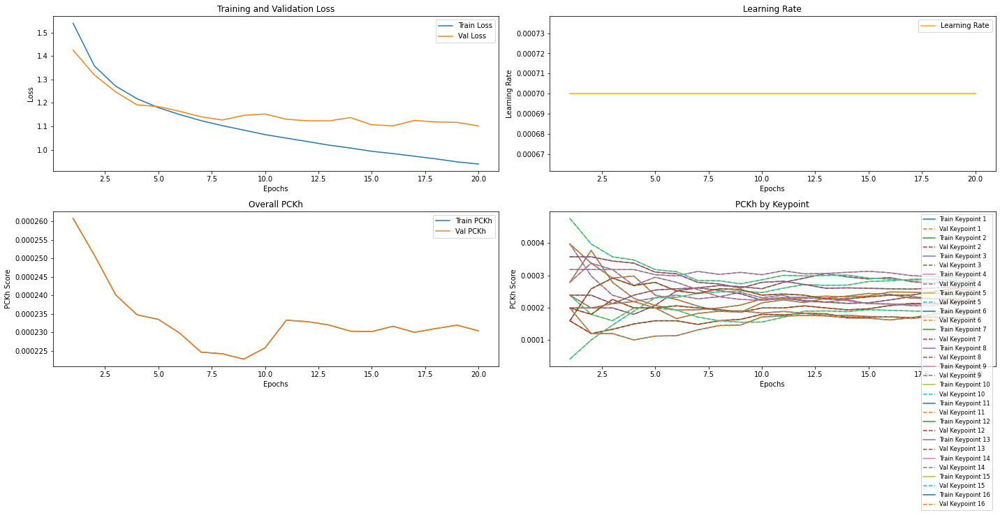

In [24]:
train_tfrecords = os.path.join(TFRECORD_PATH, 'train*')
val_tfrecords = os.path.join(TFRECORD_PATH, 'val*')
epochs = EPOCHS
batch_size = 16
num_heatmap = 16
learning_rate = 0.0007

best_model_file = train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords)

In [25]:
# WEIGHTS_PATH = os.path.join(PROJECT_PATH, 'models', 'model-v0.0.1-epoch-2-loss-1.3072.h5')

# WEIGHTS_PATH = os.path.join(PROJECT_PATH, 'models_custom', 'stacked_hourglass-epoch-15-loss-1.1075.h5')
model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1)

#model.load_weights(WEIGHTS_PATH)
model.load_weights(best_model_file)

In [26]:
R_ANKLE = 0
R_KNEE = 1
R_HIP = 2
L_HIP = 3
L_KNEE = 4
L_ANKLE = 5
PELVIS = 6
THORAX = 7
UPPER_NECK = 8
HEAD_TOP = 9
R_WRIST = 10
R_ELBOW = 11
R_SHOULDER = 12
L_SHOULDER = 13
L_ELBOW = 14
L_WRIST = 15

MPII_BONES = [
    [R_ANKLE, R_KNEE],
    [R_KNEE, R_HIP],
    [R_HIP, PELVIS],
    [L_HIP, PELVIS],
    [L_HIP, L_KNEE],
    [L_KNEE, L_ANKLE],
    [PELVIS, THORAX],
    [THORAX, UPPER_NECK],
    [UPPER_NECK, HEAD_TOP],
    [R_WRIST, R_ELBOW],
    [R_ELBOW, R_SHOULDER],
    [THORAX, R_SHOULDER],
    [THORAX, L_SHOULDER],
    [L_SHOULDER, L_ELBOW],
    [L_ELBOW, L_WRIST]
]

print('슝=3')

슝=3


In [27]:
def find_max_coordinates(heatmaps):
    flatten_heatmaps = tf.reshape(heatmaps, (-1, 16))
    indices = tf.math.argmax(flatten_heatmaps, axis=0)
    y = tf.cast(indices / 64, dtype=tf.int64)
    x = indices - 64 * y
    return tf.stack([x, y], axis=1).numpy()

print('슝=3')

슝=3


In [28]:
def extract_keypoints_from_heatmap(heatmaps):
    max_keypoints = find_max_coordinates(heatmaps)

    padded_heatmap = np.pad(heatmaps, [[1,1],[1,1],[0,0]], mode='constant')
    adjusted_keypoints = []
    for i, keypoint in enumerate(max_keypoints):
        max_y = keypoint[1]+1
        max_x = keypoint[0]+1
        
        patch = padded_heatmap[max_y-1:max_y+2, max_x-1:max_x+2, i]
        patch[1][1] = 0
        
        index = np.argmax(patch)
        
        next_y = index // 3
        next_x = index - next_y * 3
        delta_y = (next_y - 1) / 4
        delta_x = (next_x - 1) / 4
        
        adjusted_keypoint_x = keypoint[0] + delta_x
        adjusted_keypoint_y = keypoint[1] + delta_y
        adjusted_keypoints.append((adjusted_keypoint_x, adjusted_keypoint_y))
        
    adjusted_keypoints = np.clip(adjusted_keypoints, 0, 64)
    normalized_keypoints = adjusted_keypoints / 64
    return normalized_keypoints

print('슝=3')

슝=3


In [29]:
def predict(model, image_path):
    encoded = tf.io.read_file(image_path)
    image = tf.io.decode_jpeg(encoded)
    inputs = tf.image.resize(image, (256, 256))
    inputs = tf.cast(inputs, tf.float32) / 127.5 - 1
    inputs = tf.expand_dims(inputs, 0)
    outputs = model(inputs, training=False)
    if type(outputs) != list:
        outputs = [outputs]
    heatmap = tf.squeeze(outputs[-1], axis=0).numpy()
    kp = extract_keypoints_from_heatmap(heatmap)
    return image, kp

print('슝=3')

슝=3


In [30]:
def draw_keypoints_on_image(image, keypoints, index=None):
    fig,ax = plt.subplots(1)
    ax.imshow(image)
    joints = []
    for i, joint in enumerate(keypoints):
        joint_x = joint[0] * image.shape[1]
        joint_y = joint[1] * image.shape[0]
        if index is not None and index != i:
            continue
        plt.scatter(joint_x, joint_y, s=10, c='red', marker='o')
    plt.show()

def draw_skeleton_on_image(image, keypoints, index=None):
    fig,ax = plt.subplots(1)
    ax.imshow(image)
    joints = []
    for i, joint in enumerate(keypoints):
        joint_x = joint[0] * image.shape[1]
        joint_y = joint[1] * image.shape[0]
        joints.append((joint_x, joint_y))
    
    for bone in MPII_BONES:
        joint_1 = joints[bone[0]]
        joint_2 = joints[bone[1]]
        plt.plot([joint_1[0], joint_2[0]], [joint_1[1], joint_2[1]], linewidth=5, alpha=0.7)
    plt.show()

print('슝=3')

슝=3


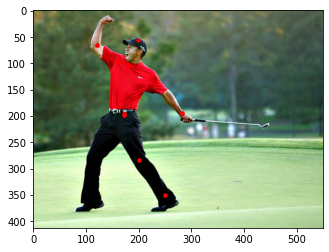

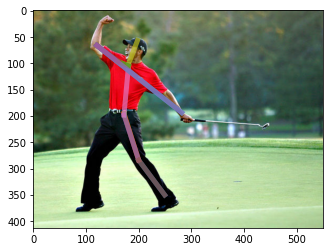

In [31]:
test_image = os.path.join(PROJECT_PATH, 'test_image.jpg')

image, keypoints = predict(model, test_image)
draw_keypoints_on_image(image, keypoints)
draw_skeleton_on_image(image, keypoints)

### STEP 1 : simplebaseline 모델 완성하기
---
simplebaseline.py 파일과 이전에 살펴본 Simplebaseline 내용을 참고하여 모델을 완성합니다.

In [32]:
def _make_deconv_layer(num_deconv_layers):
    """
    Deconvolution Layer를 생성합니다.
    Args:
        num_deconv_layers: Deconvolution 레이어의 개수
    Returns:
        Sequential model containing the deconv layers
    """
    seq_model = tf.keras.models.Sequential()

    # [[YOUR CODE]]
    for i in range(num_deconv_layers):
        # 디컨볼루션 레이어 추가
        seq_model.add(tf.keras.layers.Conv2DTranspose(256, kernel_size=(4,4), strides=(2,2), padding='same'))
        
        # Batch Normalization
        seq_model.add(tf.keras.layers.BatchNormalization())
        
        # ReLU 활성화 함수
        seq_model.add(tf.keras.layers.ReLU())
    
    return seq_model

In [33]:
train_tfrecords = os.path.join(TFRECORD_PATH, 'train*')
val_tfrecords = os.path.join(TFRECORD_PATH, 'val*')

epochs = EPOCHS
batch_size = 16
num_heatmap = 16
learning_rate = 0.0007

In [34]:
upconv = _make_deconv_layer(3)

# [[YOUR CODE]]
final_layer = tf.keras.layers.Conv2D(num_heatmap, kernel_size=(1,1), padding='same')

In [35]:
def Simplebaseline(input_shape=(256, 256, 3)):
    # resnet을 불러올 때 함수 내부에서 불러오면 정상적으로 학습
    resnet = tf.keras.applications.resnet.ResNet50(include_top=False, weights='imagenet')
    inputs = tf.keras.Input(shape=input_shape)
    
    # ResNet50을 통과
    x = resnet(inputs)
    
    # 디컨볼루션 레이어를 통과
    x = upconv(x)
    
    # 최종 컨볼루션 레이어를 통과하여 히트맵 생성
    out = final_layer(x)
    
    model = tf.keras.Model(inputs, out, name='simple_baseline')
    return model

In [36]:
# spb_model = Simplebaseline(IMAGE_SHAPE)
# spb_model.summary()

### STEP 2 : simplebaseline 모델로 변경하여 훈련하기
---
StackedHourglass를 학습시킨 코드의 모델 선언 부분을 simplebaseline 모델로 변경한 후 다시 학습을 진행합니다.

### 아래와 같은 문제가 발생하여 디버깅 
- 발생 에러
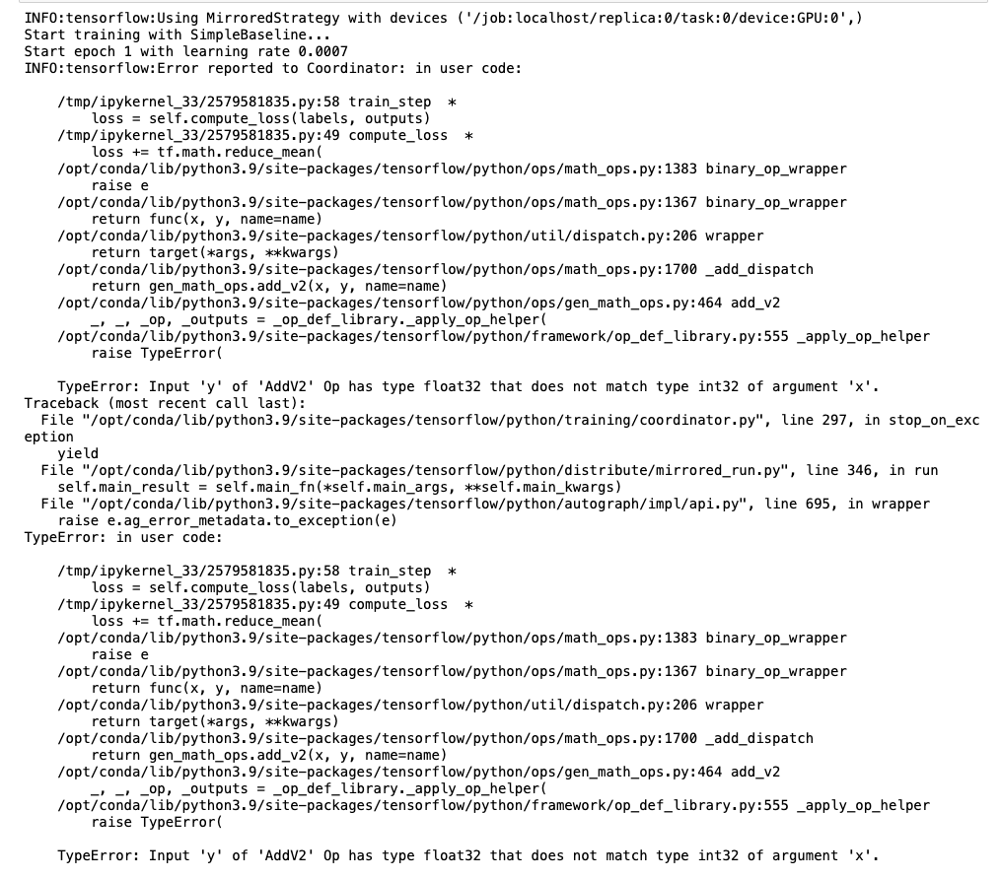

- 디버깅 과정  

1. SimpleBaseline 모델 출력 확인
    ```python
    sample_input = tf.random.normal((1, 256, 256, 3))
    sample_output = spb_model(sample_input)
    print(f"Model output dtype: {sample_output.dtype}, shape: {sample_output.shape}")
    ```
    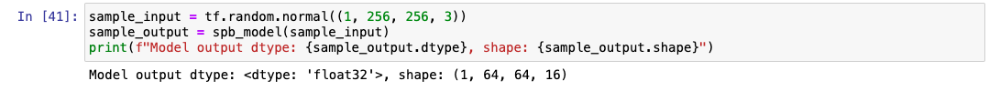
    - 데이터 타입: float32 ✅ 정상
    - 출력 형태: (1, 64, 64, 16) ✅ 정상  


2. 데이터셋 확인 결과
    ```python
    strategy = tf.distribute.MirroredStrategy()
    global_batch_size = strategy.num_replicas_in_sync * batch_size
    train_dataset = create_dataset(
            train_tfrecords, global_batch_size, num_heatmap, is_train=True)
    for images, labels in train_dataset.take(1):
        print(f"Labels dtype: {labels.dtype}, shape: {labels.shape}")
        print(f"Images dtype: {images.dtype}, shape: {images.shape}")
    ```
    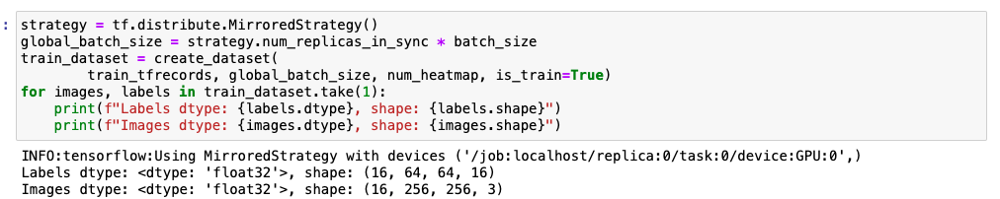
    - labels dtype: float32 → ✅ 정상
    - labels shape: (16, 64, 64, 16) → ✅ outputs와 동일
    - images dtype: float32 → ✅ 정상
    - images shape: (16, 256, 256, 3) → ✅ 정상  


3. compute_loss 의 SimpleBaseline에 맞게 outputs가 단일 텐서일 경우도 처리하도록 코드를 보완
    - Hourglass 모델 출력: 여러 단계에서 히트맵이 출력됨 → outputs는 리스트 형태로 여러 히트맵을 포함
    - SimpleBaseline 모델 출력: 마지막 히트맵만 출력됨 → outputs는 단일 텐서

### 아래 에러 발생함
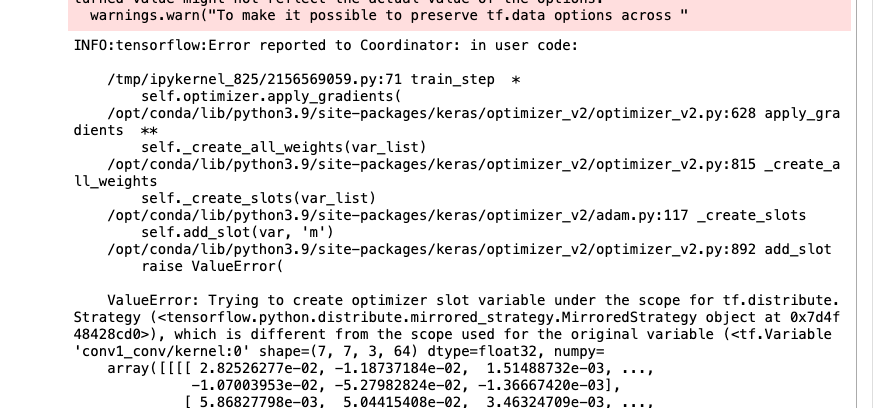
- resnet을 불러올 때 함수 내부에서 불러오도록 수정
- 커널을 완전히 초기화 하고 다시 접속 함

In [37]:
def spb_train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords):
    strategy = tf.distribute.MirroredStrategy()
    global_batch_size = strategy.num_replicas_in_sync * batch_size
    
    # 데이터셋 준비
    train_dataset = create_dataset(
        train_tfrecords, global_batch_size, num_heatmap, is_train=True)
    val_dataset = create_dataset(
        val_tfrecords, global_batch_size, num_heatmap, is_train=False)

    if not os.path.exists(MODEL_CUSTOM_PATH):
        os.makedirs(MODEL_CUSTOM_PATH)

    with strategy.scope():
        train_dist_dataset = strategy.experimental_distribute_dataset(
            train_dataset)
        val_dist_dataset = strategy.experimental_distribute_dataset(
            val_dataset)

        # 변경된 부분: StackedHourglass 대신 SimpleBaseline 사용
        spb_model = Simplebaseline(IMAGE_SHAPE)

        trainer = Trainer(
            spb_model,
            epochs,
            global_batch_size,
            strategy,
            initial_learning_rate=learning_rate
        )

        print('Start training with SimpleBaseline...')
        return trainer.run(train_dist_dataset, val_dist_dataset)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
Start training with SimpleBaseline...
Start epoch 1 with learning rate 0.0007
Start distributed traininng...
Trained batch 1 batch loss 0.683020771 epoch total loss 0.683020771
Trained batch 2 batch loss 0.660578609 epoch total loss 0.67179966
Trained batch 3 batch loss 0.54505676 epoch total loss 0.629552066
Trained batch 4 batch loss 0.50556922 epoch total loss 0.59855634
Trained batch 5 batch loss 0.478383422 epoch total loss 0.57452172
Trained batch 6 batch loss 0.442297518 epoch total loss 0.552484334
Trained batch 7 batch loss 0.460186303 epoch total loss 0.539298892
Trained batch 8 batch loss 0.412182182 epoch total loss 0.523409307
Trained batch 9 batch loss 0.420894295 epoch total loss 0.51201874
Trained batch 10 batch loss 0.449640542 epoch total loss 0.505780935
Trained batch 11 batch loss 0.464592844 epoch total loss 0.502036572
Trained batch 12 batch loss 0.450058371 epoch

Trained batch 118 batch loss 0.389697254 epoch total loss 0.399468094
Trained batch 119 batch loss 0.377588958 epoch total loss 0.399284244
Trained batch 120 batch loss 0.371937186 epoch total loss 0.399056345
Trained batch 121 batch loss 0.350184143 epoch total loss 0.398652434
Trained batch 122 batch loss 0.350299597 epoch total loss 0.398256123
Trained batch 123 batch loss 0.374152809 epoch total loss 0.398060143
Trained batch 124 batch loss 0.365986466 epoch total loss 0.397801489
Trained batch 125 batch loss 0.374727935 epoch total loss 0.397616923
Trained batch 126 batch loss 0.367546737 epoch total loss 0.397378266
Trained batch 127 batch loss 0.377516448 epoch total loss 0.397221863
Trained batch 128 batch loss 0.373351216 epoch total loss 0.39703539
Trained batch 129 batch loss 0.38396427 epoch total loss 0.396934062
Trained batch 130 batch loss 0.355701327 epoch total loss 0.396616906
Trained batch 131 batch loss 0.378939301 epoch total loss 0.396481961
Trained batch 132 batc

Trained batch 236 batch loss 0.349944592 epoch total loss 0.381313056
Trained batch 237 batch loss 0.343318731 epoch total loss 0.381152749
Trained batch 238 batch loss 0.377491385 epoch total loss 0.381137371
Trained batch 239 batch loss 0.374953598 epoch total loss 0.381111503
Trained batch 240 batch loss 0.364835083 epoch total loss 0.381043702
Trained batch 241 batch loss 0.362872 epoch total loss 0.380968273
Trained batch 242 batch loss 0.358266175 epoch total loss 0.380874485
Trained batch 243 batch loss 0.379907757 epoch total loss 0.380870491
Trained batch 244 batch loss 0.390253574 epoch total loss 0.380908936
Trained batch 245 batch loss 0.344468445 epoch total loss 0.380760193
Trained batch 246 batch loss 0.352154315 epoch total loss 0.380643934
Trained batch 247 batch loss 0.392074764 epoch total loss 0.380690187
Trained batch 248 batch loss 0.392045915 epoch total loss 0.380736
Trained batch 249 batch loss 0.373874962 epoch total loss 0.380708456
Trained batch 250 batch lo

Trained batch 354 batch loss 0.351538837 epoch total loss 0.370754182
Trained batch 355 batch loss 0.328407228 epoch total loss 0.370634884
Trained batch 356 batch loss 0.338438213 epoch total loss 0.370544434
Trained batch 357 batch loss 0.331020474 epoch total loss 0.370433718
Trained batch 358 batch loss 0.365341038 epoch total loss 0.370419502
Trained batch 359 batch loss 0.34835 epoch total loss 0.37035802
Trained batch 360 batch loss 0.342592746 epoch total loss 0.370280892
Trained batch 361 batch loss 0.358282238 epoch total loss 0.370247632
Trained batch 362 batch loss 0.350042164 epoch total loss 0.370191783
Trained batch 363 batch loss 0.374835044 epoch total loss 0.370204568
Trained batch 364 batch loss 0.32906273 epoch total loss 0.370091528
Trained batch 365 batch loss 0.310552806 epoch total loss 0.36992839
Trained batch 366 batch loss 0.332358748 epoch total loss 0.369825721
Trained batch 367 batch loss 0.380142361 epoch total loss 0.369853824
Trained batch 368 batch los

Trained batch 472 batch loss 0.334989041 epoch total loss 0.363445431
Trained batch 473 batch loss 0.339933038 epoch total loss 0.363395751
Trained batch 474 batch loss 0.337650687 epoch total loss 0.363341421
Trained batch 475 batch loss 0.330155611 epoch total loss 0.363271534
Trained batch 476 batch loss 0.34461382 epoch total loss 0.363232374
Trained batch 477 batch loss 0.336572528 epoch total loss 0.363176495
Trained batch 478 batch loss 0.353145957 epoch total loss 0.363155514
Trained batch 479 batch loss 0.337610334 epoch total loss 0.363102198
Trained batch 480 batch loss 0.323355645 epoch total loss 0.363019377
Trained batch 481 batch loss 0.315472215 epoch total loss 0.362920523
Trained batch 482 batch loss 0.319549084 epoch total loss 0.362830549
Trained batch 483 batch loss 0.318369538 epoch total loss 0.36273849
Trained batch 484 batch loss 0.315626234 epoch total loss 0.362641156
Trained batch 485 batch loss 0.350080729 epoch total loss 0.362615287
Trained batch 486 batc

Trained batch 590 batch loss 0.342293113 epoch total loss 0.358183295
Trained batch 591 batch loss 0.326344788 epoch total loss 0.358129412
Trained batch 592 batch loss 0.332999557 epoch total loss 0.358086944
Trained batch 593 batch loss 0.339021146 epoch total loss 0.358054787
Trained batch 594 batch loss 0.359061062 epoch total loss 0.358056486
Trained batch 595 batch loss 0.355504304 epoch total loss 0.358052164
Trained batch 596 batch loss 0.357698947 epoch total loss 0.358051568
Trained batch 597 batch loss 0.33731705 epoch total loss 0.358016849
Trained batch 598 batch loss 0.331585616 epoch total loss 0.357972652
Trained batch 599 batch loss 0.30835247 epoch total loss 0.357889801
Trained batch 600 batch loss 0.345375419 epoch total loss 0.357868969
Trained batch 601 batch loss 0.352347374 epoch total loss 0.357859761
Trained batch 602 batch loss 0.373923481 epoch total loss 0.357886434
Trained batch 603 batch loss 0.334914416 epoch total loss 0.357848346
Trained batch 604 batc

Trained batch 708 batch loss 0.305913538 epoch total loss 0.354139179
Trained batch 709 batch loss 0.308055609 epoch total loss 0.35407421
Trained batch 710 batch loss 0.317539275 epoch total loss 0.354022741
Trained batch 711 batch loss 0.342041045 epoch total loss 0.354005873
Trained batch 712 batch loss 0.359270304 epoch total loss 0.354013264
Trained batch 713 batch loss 0.318400532 epoch total loss 0.353963315
Trained batch 714 batch loss 0.358216137 epoch total loss 0.353969276
Trained batch 715 batch loss 0.339627594 epoch total loss 0.353949219
Trained batch 716 batch loss 0.331324339 epoch total loss 0.353917629
Trained batch 717 batch loss 0.323384017 epoch total loss 0.353875041
Trained batch 718 batch loss 0.314399123 epoch total loss 0.353820056
Trained batch 719 batch loss 0.27762863 epoch total loss 0.353714108
Trained batch 720 batch loss 0.300343 epoch total loss 0.35363996
Trained batch 721 batch loss 0.307312399 epoch total loss 0.353575706
Trained batch 722 batch lo

Trained batch 826 batch loss 0.324929744 epoch total loss 0.350392073
Trained batch 827 batch loss 0.359790981 epoch total loss 0.350403458
Trained batch 828 batch loss 0.331716359 epoch total loss 0.350380898
Trained batch 829 batch loss 0.324117661 epoch total loss 0.350349247
Trained batch 830 batch loss 0.349285156 epoch total loss 0.350347936
Trained batch 831 batch loss 0.321857393 epoch total loss 0.350313663
Trained batch 832 batch loss 0.32439509 epoch total loss 0.35028252
Trained batch 833 batch loss 0.322672844 epoch total loss 0.35024935
Trained batch 834 batch loss 0.3215442 epoch total loss 0.350214928
Trained batch 835 batch loss 0.316118956 epoch total loss 0.350174129
Trained batch 836 batch loss 0.342192858 epoch total loss 0.350164562
Trained batch 837 batch loss 0.342243075 epoch total loss 0.350155115
Trained batch 838 batch loss 0.33871302 epoch total loss 0.350141466
Trained batch 839 batch loss 0.346228689 epoch total loss 0.350136787
Trained batch 840 batch lo

Trained batch 944 batch loss 0.330215514 epoch total loss 0.348039955
Trained batch 945 batch loss 0.350338608 epoch total loss 0.348042399
Trained batch 946 batch loss 0.349481374 epoch total loss 0.348043919
Trained batch 947 batch loss 0.326353669 epoch total loss 0.348021
Trained batch 948 batch loss 0.313550264 epoch total loss 0.347984642
Trained batch 949 batch loss 0.340388209 epoch total loss 0.347976625
Trained batch 950 batch loss 0.331925 epoch total loss 0.347959757
Trained batch 951 batch loss 0.342584938 epoch total loss 0.347954094
Trained batch 952 batch loss 0.319288015 epoch total loss 0.347924
Trained batch 953 batch loss 0.317860961 epoch total loss 0.347892463
Trained batch 954 batch loss 0.321648717 epoch total loss 0.347864956
Trained batch 955 batch loss 0.341391951 epoch total loss 0.347858191
Trained batch 956 batch loss 0.320781022 epoch total loss 0.347829849
Trained batch 957 batch loss 0.296960592 epoch total loss 0.347776681
Trained batch 958 batch loss 

Trained batch 1061 batch loss 0.346200526 epoch total loss 0.345348209
Trained batch 1062 batch loss 0.350685149 epoch total loss 0.345353246
Trained batch 1063 batch loss 0.34757027 epoch total loss 0.345355302
Trained batch 1064 batch loss 0.298352897 epoch total loss 0.345311135
Trained batch 1065 batch loss 0.311066747 epoch total loss 0.345278978
Trained batch 1066 batch loss 0.361445457 epoch total loss 0.345294148
Trained batch 1067 batch loss 0.298176736 epoch total loss 0.345249981
Trained batch 1068 batch loss 0.300893486 epoch total loss 0.345208466
Trained batch 1069 batch loss 0.304007739 epoch total loss 0.345169932
Trained batch 1070 batch loss 0.313034803 epoch total loss 0.345139921
Trained batch 1071 batch loss 0.305503398 epoch total loss 0.345102906
Trained batch 1072 batch loss 0.296895772 epoch total loss 0.345057964
Trained batch 1073 batch loss 0.278181046 epoch total loss 0.344995618
Trained batch 1074 batch loss 0.295254052 epoch total loss 0.344949305
Trained

Trained batch 1177 batch loss 0.342412621 epoch total loss 0.342995167
Trained batch 1178 batch loss 0.354527146 epoch total loss 0.343004972
Trained batch 1179 batch loss 0.345361739 epoch total loss 0.343006968
Trained batch 1180 batch loss 0.306800455 epoch total loss 0.342976272
Trained batch 1181 batch loss 0.296949953 epoch total loss 0.342937291
Trained batch 1182 batch loss 0.332908839 epoch total loss 0.342928827
Trained batch 1183 batch loss 0.322652817 epoch total loss 0.34291169
Trained batch 1184 batch loss 0.318575978 epoch total loss 0.342891127
Trained batch 1185 batch loss 0.304591388 epoch total loss 0.342858821
Trained batch 1186 batch loss 0.330872864 epoch total loss 0.342848688
Trained batch 1187 batch loss 0.344637871 epoch total loss 0.342850208
Trained batch 1188 batch loss 0.341291964 epoch total loss 0.342848897
Trained batch 1189 batch loss 0.348259777 epoch total loss 0.342853427
Trained batch 1190 batch loss 0.328434914 epoch total loss 0.342841327
Trained

Trained batch 1294 batch loss 0.293062389 epoch total loss 0.341066658
Trained batch 1295 batch loss 0.33156848 epoch total loss 0.341059327
Trained batch 1296 batch loss 0.315135866 epoch total loss 0.3410393
Trained batch 1297 batch loss 0.317519963 epoch total loss 0.34102115
Trained batch 1298 batch loss 0.303774625 epoch total loss 0.340992451
Trained batch 1299 batch loss 0.316638023 epoch total loss 0.340973735
Trained batch 1300 batch loss 0.338889301 epoch total loss 0.340972126
Trained batch 1301 batch loss 0.315700918 epoch total loss 0.340952694
Trained batch 1302 batch loss 0.312383831 epoch total loss 0.34093076
Trained batch 1303 batch loss 0.323216498 epoch total loss 0.34091717
Trained batch 1304 batch loss 0.312413454 epoch total loss 0.340895295
Trained batch 1305 batch loss 0.330232412 epoch total loss 0.340887129
Trained batch 1306 batch loss 0.333125293 epoch total loss 0.340881199
Trained batch 1307 batch loss 0.328025103 epoch total loss 0.340871364
Trained batc

Validated batch 35 batch loss 0.339538276
Validated batch 36 batch loss 0.343865871
Validated batch 37 batch loss 0.317831337
Validated batch 38 batch loss 0.328803539
Validated batch 39 batch loss 0.346352577
Validated batch 40 batch loss 0.343524
Validated batch 41 batch loss 0.343322128
Validated batch 42 batch loss 0.357747763
Validated batch 43 batch loss 0.397562146
Validated batch 44 batch loss 0.358880579
Validated batch 45 batch loss 0.346513927
Validated batch 46 batch loss 0.310833454
Validated batch 47 batch loss 0.311166018
Validated batch 48 batch loss 0.311299354
Validated batch 49 batch loss 0.347810656
Validated batch 50 batch loss 0.298880517
Validated batch 51 batch loss 0.325569391
Validated batch 52 batch loss 0.339255
Validated batch 53 batch loss 0.336318016
Validated batch 54 batch loss 0.36576423
Validated batch 55 batch loss 0.352217704
Validated batch 56 batch loss 0.336740971
Validated batch 57 batch loss 0.342027
Validated batch 58 batch loss 0.362366736
Va

Trained batch 19 batch loss 0.347340673 epoch total loss 0.337339073
Trained batch 20 batch loss 0.344330877 epoch total loss 0.337688655
Trained batch 21 batch loss 0.32820341 epoch total loss 0.337236971
Trained batch 22 batch loss 0.299858958 epoch total loss 0.33553797
Trained batch 23 batch loss 0.333664298 epoch total loss 0.33545652
Trained batch 24 batch loss 0.328606546 epoch total loss 0.335171103
Trained batch 25 batch loss 0.388613045 epoch total loss 0.337308764
Trained batch 26 batch loss 0.390596122 epoch total loss 0.3393583
Trained batch 27 batch loss 0.363707632 epoch total loss 0.340260118
Trained batch 28 batch loss 0.348007351 epoch total loss 0.340536803
Trained batch 29 batch loss 0.343044817 epoch total loss 0.340623289
Trained batch 30 batch loss 0.314010471 epoch total loss 0.339736193
Trained batch 31 batch loss 0.305024743 epoch total loss 0.33861649
Trained batch 32 batch loss 0.299204618 epoch total loss 0.33738488
Trained batch 33 batch loss 0.332259029 e

Trained batch 138 batch loss 0.316438943 epoch total loss 0.314020544
Trained batch 139 batch loss 0.37048012 epoch total loss 0.31442672
Trained batch 140 batch loss 0.311688572 epoch total loss 0.31440717
Trained batch 141 batch loss 0.291870445 epoch total loss 0.31424731
Trained batch 142 batch loss 0.306510478 epoch total loss 0.314192832
Trained batch 143 batch loss 0.307289451 epoch total loss 0.314144552
Trained batch 144 batch loss 0.3312549 epoch total loss 0.314263374
Trained batch 145 batch loss 0.264000297 epoch total loss 0.313916713
Trained batch 146 batch loss 0.246162415 epoch total loss 0.313452661
Trained batch 147 batch loss 0.262459785 epoch total loss 0.313105762
Trained batch 148 batch loss 0.317234606 epoch total loss 0.313133657
Trained batch 149 batch loss 0.328696162 epoch total loss 0.313238114
Trained batch 150 batch loss 0.35069862 epoch total loss 0.313487858
Trained batch 151 batch loss 0.363664776 epoch total loss 0.313820153
Trained batch 152 batch los

Trained batch 256 batch loss 0.299129695 epoch total loss 0.31279251
Trained batch 257 batch loss 0.331195921 epoch total loss 0.312864125
Trained batch 258 batch loss 0.331139266 epoch total loss 0.312934965
Trained batch 259 batch loss 0.315537035 epoch total loss 0.312945
Trained batch 260 batch loss 0.32211861 epoch total loss 0.312980294
Trained batch 261 batch loss 0.325213492 epoch total loss 0.313027173
Trained batch 262 batch loss 0.290681124 epoch total loss 0.312941879
Trained batch 263 batch loss 0.269495338 epoch total loss 0.312776655
Trained batch 264 batch loss 0.26234 epoch total loss 0.312585592
Trained batch 265 batch loss 0.255325049 epoch total loss 0.312369525
Trained batch 266 batch loss 0.311702937 epoch total loss 0.312367022
Trained batch 267 batch loss 0.321475208 epoch total loss 0.312401146
Trained batch 268 batch loss 0.328684032 epoch total loss 0.312461883
Trained batch 269 batch loss 0.342740059 epoch total loss 0.312574446
Trained batch 270 batch loss 

Trained batch 374 batch loss 0.308420211 epoch total loss 0.310647279
Trained batch 375 batch loss 0.274414271 epoch total loss 0.31055066
Trained batch 376 batch loss 0.303830683 epoch total loss 0.310532779
Trained batch 377 batch loss 0.294994414 epoch total loss 0.310491592
Trained batch 378 batch loss 0.321713328 epoch total loss 0.310521275
Trained batch 379 batch loss 0.335656255 epoch total loss 0.310587585
Trained batch 380 batch loss 0.313738555 epoch total loss 0.31059587
Trained batch 381 batch loss 0.280287236 epoch total loss 0.310516328
Trained batch 382 batch loss 0.297418267 epoch total loss 0.310482055
Trained batch 383 batch loss 0.317655265 epoch total loss 0.310500771
Trained batch 384 batch loss 0.30977 epoch total loss 0.310498863
Trained batch 385 batch loss 0.319051743 epoch total loss 0.310521096
Trained batch 386 batch loss 0.30378449 epoch total loss 0.310503662
Trained batch 387 batch loss 0.288577229 epoch total loss 0.310446978
Trained batch 388 batch los

Trained batch 492 batch loss 0.305105 epoch total loss 0.309589207
Trained batch 493 batch loss 0.317103982 epoch total loss 0.309604466
Trained batch 494 batch loss 0.30605036 epoch total loss 0.309597254
Trained batch 495 batch loss 0.32253468 epoch total loss 0.30962339
Trained batch 496 batch loss 0.330552876 epoch total loss 0.309665591
Trained batch 497 batch loss 0.343812 epoch total loss 0.309734285
Trained batch 498 batch loss 0.373780817 epoch total loss 0.309862882
Trained batch 499 batch loss 0.315697342 epoch total loss 0.309874594
Trained batch 500 batch loss 0.313405871 epoch total loss 0.309881657
Trained batch 501 batch loss 0.320932239 epoch total loss 0.309903711
Trained batch 502 batch loss 0.306410253 epoch total loss 0.309896767
Trained batch 503 batch loss 0.292502284 epoch total loss 0.309862167
Trained batch 504 batch loss 0.286334246 epoch total loss 0.309815496
Trained batch 505 batch loss 0.297108859 epoch total loss 0.309790313
Trained batch 506 batch loss 

Trained batch 610 batch loss 0.314366549 epoch total loss 0.308994085
Trained batch 611 batch loss 0.319668829 epoch total loss 0.309011549
Trained batch 612 batch loss 0.291800022 epoch total loss 0.308983415
Trained batch 613 batch loss 0.323030651 epoch total loss 0.309006333
Trained batch 614 batch loss 0.299299121 epoch total loss 0.308990538
Trained batch 615 batch loss 0.314976484 epoch total loss 0.309000254
Trained batch 616 batch loss 0.299800456 epoch total loss 0.308985323
Trained batch 617 batch loss 0.331842184 epoch total loss 0.309022367
Trained batch 618 batch loss 0.327242464 epoch total loss 0.309051871
Trained batch 619 batch loss 0.338760465 epoch total loss 0.309099853
Trained batch 620 batch loss 0.360863805 epoch total loss 0.309183359
Trained batch 621 batch loss 0.33147496 epoch total loss 0.309219271
Trained batch 622 batch loss 0.315449417 epoch total loss 0.309229285
Trained batch 623 batch loss 0.308849633 epoch total loss 0.309228659
Trained batch 624 bat

Trained batch 728 batch loss 0.280444771 epoch total loss 0.308633745
Trained batch 729 batch loss 0.248370573 epoch total loss 0.308551073
Trained batch 730 batch loss 0.225317106 epoch total loss 0.308437049
Trained batch 731 batch loss 0.223240972 epoch total loss 0.308320493
Trained batch 732 batch loss 0.267324775 epoch total loss 0.308264464
Trained batch 733 batch loss 0.29446727 epoch total loss 0.308245659
Trained batch 734 batch loss 0.278023362 epoch total loss 0.308204472
Trained batch 735 batch loss 0.308438748 epoch total loss 0.3082048
Trained batch 736 batch loss 0.289037704 epoch total loss 0.308178753
Trained batch 737 batch loss 0.299455732 epoch total loss 0.308166921
Trained batch 738 batch loss 0.289475769 epoch total loss 0.308141589
Trained batch 739 batch loss 0.305415422 epoch total loss 0.308137894
Trained batch 740 batch loss 0.28755641 epoch total loss 0.308110088
Trained batch 741 batch loss 0.307989597 epoch total loss 0.308109909
Trained batch 742 batch 

Trained batch 846 batch loss 0.389727592 epoch total loss 0.308422923
Trained batch 847 batch loss 0.3630656 epoch total loss 0.308487415
Trained batch 848 batch loss 0.358414799 epoch total loss 0.308546305
Trained batch 849 batch loss 0.319483876 epoch total loss 0.308559209
Trained batch 850 batch loss 0.29750067 epoch total loss 0.308546215
Trained batch 851 batch loss 0.300518811 epoch total loss 0.308536768
Trained batch 852 batch loss 0.304836541 epoch total loss 0.308532417
Trained batch 853 batch loss 0.324626356 epoch total loss 0.308551282
Trained batch 854 batch loss 0.312585771 epoch total loss 0.30855602
Trained batch 855 batch loss 0.3446199 epoch total loss 0.30859822
Trained batch 856 batch loss 0.347487092 epoch total loss 0.308643639
Trained batch 857 batch loss 0.352396935 epoch total loss 0.308694661
Trained batch 858 batch loss 0.347856104 epoch total loss 0.308740318
Trained batch 859 batch loss 0.312052369 epoch total loss 0.308744162
Trained batch 860 batch los

Trained batch 964 batch loss 0.314881623 epoch total loss 0.308866441
Trained batch 965 batch loss 0.308800876 epoch total loss 0.308866382
Trained batch 966 batch loss 0.308007687 epoch total loss 0.308865488
Trained batch 967 batch loss 0.325146377 epoch total loss 0.308882326
Trained batch 968 batch loss 0.316200495 epoch total loss 0.308889866
Trained batch 969 batch loss 0.314397484 epoch total loss 0.308895558
Trained batch 970 batch loss 0.300073683 epoch total loss 0.308886468
Trained batch 971 batch loss 0.314874172 epoch total loss 0.308892637
Trained batch 972 batch loss 0.275692433 epoch total loss 0.308858484
Trained batch 973 batch loss 0.304320335 epoch total loss 0.308853835
Trained batch 974 batch loss 0.29868564 epoch total loss 0.308843374
Trained batch 975 batch loss 0.282774538 epoch total loss 0.308816642
Trained batch 976 batch loss 0.275635958 epoch total loss 0.308782637
Trained batch 977 batch loss 0.323802084 epoch total loss 0.308798015
Trained batch 978 bat

Trained batch 1081 batch loss 0.295818686 epoch total loss 0.308509767
Trained batch 1082 batch loss 0.297252387 epoch total loss 0.308499336
Trained batch 1083 batch loss 0.283204794 epoch total loss 0.308476
Trained batch 1084 batch loss 0.275883 epoch total loss 0.30844593
Trained batch 1085 batch loss 0.288298 epoch total loss 0.308427364
Trained batch 1086 batch loss 0.310052037 epoch total loss 0.308428854
Trained batch 1087 batch loss 0.290933 epoch total loss 0.30841276
Trained batch 1088 batch loss 0.331318736 epoch total loss 0.308433801
Trained batch 1089 batch loss 0.316274345 epoch total loss 0.308441
Trained batch 1090 batch loss 0.282695562 epoch total loss 0.30841738
Trained batch 1091 batch loss 0.297358841 epoch total loss 0.308407247
Trained batch 1092 batch loss 0.341084689 epoch total loss 0.308437198
Trained batch 1093 batch loss 0.301991433 epoch total loss 0.308431298
Trained batch 1094 batch loss 0.314817 epoch total loss 0.308437139
Trained batch 1095 batch lo

Trained batch 1198 batch loss 0.283644646 epoch total loss 0.307403356
Trained batch 1199 batch loss 0.257015079 epoch total loss 0.307361335
Trained batch 1200 batch loss 0.261893153 epoch total loss 0.307323456
Trained batch 1201 batch loss 0.294195712 epoch total loss 0.307312518
Trained batch 1202 batch loss 0.274202138 epoch total loss 0.307284981
Trained batch 1203 batch loss 0.271543562 epoch total loss 0.307255268
Trained batch 1204 batch loss 0.29215312 epoch total loss 0.307242721
Trained batch 1205 batch loss 0.292767406 epoch total loss 0.307230681
Trained batch 1206 batch loss 0.294899106 epoch total loss 0.307220459
Trained batch 1207 batch loss 0.355632335 epoch total loss 0.307260573
Trained batch 1208 batch loss 0.304483086 epoch total loss 0.307258248
Trained batch 1209 batch loss 0.323883891 epoch total loss 0.307272017
Trained batch 1210 batch loss 0.358410299 epoch total loss 0.307314247
Trained batch 1211 batch loss 0.32879281 epoch total loss 0.307332
Trained bat

Trained batch 1315 batch loss 0.37348491 epoch total loss 0.307225913
Trained batch 1316 batch loss 0.30509758 epoch total loss 0.307224274
Trained batch 1317 batch loss 0.315374523 epoch total loss 0.307230473
Trained batch 1318 batch loss 0.318010926 epoch total loss 0.307238668
Trained batch 1319 batch loss 0.306741863 epoch total loss 0.307238281
Trained batch 1320 batch loss 0.353700846 epoch total loss 0.307273477
Trained batch 1321 batch loss 0.314155638 epoch total loss 0.307278663
Trained batch 1322 batch loss 0.266311854 epoch total loss 0.307247698
Trained batch 1323 batch loss 0.295883685 epoch total loss 0.307239115
Trained batch 1324 batch loss 0.330854744 epoch total loss 0.307256937
Trained batch 1325 batch loss 0.313457549 epoch total loss 0.307261616
Trained batch 1326 batch loss 0.276262462 epoch total loss 0.307238251
Trained batch 1327 batch loss 0.251496613 epoch total loss 0.30719623
Trained batch 1328 batch loss 0.255547941 epoch total loss 0.307157367
Trained b

Validated batch 71 batch loss 0.305142939
Validated batch 72 batch loss 0.301955253
Validated batch 73 batch loss 0.286020845
Validated batch 74 batch loss 0.312215924
Validated batch 75 batch loss 0.347462237
Validated batch 76 batch loss 0.290323466
Validated batch 77 batch loss 0.31549263
Validated batch 78 batch loss 0.295432299
Validated batch 79 batch loss 0.307139933
Validated batch 80 batch loss 0.300219715
Validated batch 81 batch loss 0.282488644
Validated batch 82 batch loss 0.339422494
Validated batch 83 batch loss 0.30345425
Validated batch 84 batch loss 0.316313684
Validated batch 85 batch loss 0.298838317
Validated batch 86 batch loss 0.322913378
Validated batch 87 batch loss 0.27473855
Validated batch 88 batch loss 0.304478019
Validated batch 89 batch loss 0.287251711
Validated batch 90 batch loss 0.283544183
Validated batch 91 batch loss 0.298929513
Validated batch 92 batch loss 0.292541146
Validated batch 93 batch loss 0.320305616
Validated batch 94 batch loss 0.31660

Trained batch 40 batch loss 0.339222521 epoch total loss 0.308955967
Trained batch 41 batch loss 0.297347456 epoch total loss 0.308672845
Trained batch 42 batch loss 0.265684873 epoch total loss 0.307649314
Trained batch 43 batch loss 0.258174211 epoch total loss 0.306498736
Trained batch 44 batch loss 0.292633772 epoch total loss 0.306183606
Trained batch 45 batch loss 0.310138762 epoch total loss 0.306271523
Trained batch 46 batch loss 0.26018548 epoch total loss 0.305269629
Trained batch 47 batch loss 0.290494204 epoch total loss 0.304955274
Trained batch 48 batch loss 0.304294765 epoch total loss 0.304941505
Trained batch 49 batch loss 0.285046726 epoch total loss 0.304535478
Trained batch 50 batch loss 0.304082453 epoch total loss 0.304526418
Trained batch 51 batch loss 0.315164775 epoch total loss 0.304735
Trained batch 52 batch loss 0.302529901 epoch total loss 0.304692626
Trained batch 53 batch loss 0.275402457 epoch total loss 0.304139972
Trained batch 54 batch loss 0.25184181

Trained batch 159 batch loss 0.336632282 epoch total loss 0.297222048
Trained batch 160 batch loss 0.343866318 epoch total loss 0.297513545
Trained batch 161 batch loss 0.326190621 epoch total loss 0.297691673
Trained batch 162 batch loss 0.289121807 epoch total loss 0.297638774
Trained batch 163 batch loss 0.274296194 epoch total loss 0.297495574
Trained batch 164 batch loss 0.306202114 epoch total loss 0.297548652
Trained batch 165 batch loss 0.293261051 epoch total loss 0.297522694
Trained batch 166 batch loss 0.309231967 epoch total loss 0.297593206
Trained batch 167 batch loss 0.296484947 epoch total loss 0.29758659
Trained batch 168 batch loss 0.329435706 epoch total loss 0.297776163
Trained batch 169 batch loss 0.345681697 epoch total loss 0.298059642
Trained batch 170 batch loss 0.308357775 epoch total loss 0.298120201
Trained batch 171 batch loss 0.303489208 epoch total loss 0.298151612
Trained batch 172 batch loss 0.275377303 epoch total loss 0.298019201
Trained batch 173 bat

Trained batch 277 batch loss 0.34492743 epoch total loss 0.300800383
Trained batch 278 batch loss 0.342533469 epoch total loss 0.300950527
Trained batch 279 batch loss 0.329908222 epoch total loss 0.301054329
Trained batch 280 batch loss 0.339690298 epoch total loss 0.301192313
Trained batch 281 batch loss 0.315307051 epoch total loss 0.30124253
Trained batch 282 batch loss 0.329539567 epoch total loss 0.301342875
Trained batch 283 batch loss 0.327972233 epoch total loss 0.301436961
Trained batch 284 batch loss 0.329004824 epoch total loss 0.301534027
Trained batch 285 batch loss 0.31832248 epoch total loss 0.301592946
Trained batch 286 batch loss 0.299886018 epoch total loss 0.301587
Trained batch 287 batch loss 0.301493287 epoch total loss 0.301586658
Trained batch 288 batch loss 0.287241131 epoch total loss 0.301536828
Trained batch 289 batch loss 0.275219321 epoch total loss 0.301445782
Trained batch 290 batch loss 0.304839551 epoch total loss 0.301457465
Trained batch 291 batch lo

Trained batch 395 batch loss 0.23464027 epoch total loss 0.299298733
Trained batch 396 batch loss 0.300248504 epoch total loss 0.299301118
Trained batch 397 batch loss 0.323775947 epoch total loss 0.299362779
Trained batch 398 batch loss 0.294380456 epoch total loss 0.299350262
Trained batch 399 batch loss 0.291349828 epoch total loss 0.299330205
Trained batch 400 batch loss 0.288084447 epoch total loss 0.299302101
Trained batch 401 batch loss 0.302867711 epoch total loss 0.299310982
Trained batch 402 batch loss 0.287943929 epoch total loss 0.2992827
Trained batch 403 batch loss 0.276074558 epoch total loss 0.299225122
Trained batch 404 batch loss 0.296020657 epoch total loss 0.299217194
Trained batch 405 batch loss 0.281319022 epoch total loss 0.299173
Trained batch 406 batch loss 0.290862858 epoch total loss 0.299152523
Trained batch 407 batch loss 0.298182666 epoch total loss 0.299150139
Trained batch 408 batch loss 0.310344696 epoch total loss 0.299177587
Trained batch 409 batch lo

Trained batch 513 batch loss 0.371440619 epoch total loss 0.297896951
Trained batch 514 batch loss 0.355452806 epoch total loss 0.298008919
Trained batch 515 batch loss 0.312947869 epoch total loss 0.298037916
Trained batch 516 batch loss 0.276955098 epoch total loss 0.297997087
Trained batch 517 batch loss 0.297780633 epoch total loss 0.29799664
Trained batch 518 batch loss 0.311380953 epoch total loss 0.298022509
Trained batch 519 batch loss 0.327034116 epoch total loss 0.298078418
Trained batch 520 batch loss 0.300903291 epoch total loss 0.298083842
Trained batch 521 batch loss 0.31199047 epoch total loss 0.298110545
Trained batch 522 batch loss 0.299902827 epoch total loss 0.298113972
Trained batch 523 batch loss 0.281229 epoch total loss 0.298081696
Trained batch 524 batch loss 0.275814354 epoch total loss 0.298039198
Trained batch 525 batch loss 0.294909894 epoch total loss 0.298033237
Trained batch 526 batch loss 0.31286791 epoch total loss 0.29806143
Trained batch 527 batch los

Trained batch 631 batch loss 0.308324903 epoch total loss 0.297175199
Trained batch 632 batch loss 0.291514307 epoch total loss 0.297166258
Trained batch 633 batch loss 0.316311538 epoch total loss 0.297196507
Trained batch 634 batch loss 0.318887115 epoch total loss 0.297230721
Trained batch 635 batch loss 0.333000749 epoch total loss 0.297287047
Trained batch 636 batch loss 0.302309275 epoch total loss 0.297294945
Trained batch 637 batch loss 0.287522942 epoch total loss 0.297279596
Trained batch 638 batch loss 0.285223275 epoch total loss 0.297260702
Trained batch 639 batch loss 0.292103738 epoch total loss 0.297252625
Trained batch 640 batch loss 0.329756439 epoch total loss 0.297303408
Trained batch 641 batch loss 0.31844148 epoch total loss 0.29733637
Trained batch 642 batch loss 0.347307503 epoch total loss 0.297414213
Trained batch 643 batch loss 0.332805842 epoch total loss 0.297469258
Trained batch 644 batch loss 0.313869178 epoch total loss 0.297494739
Trained batch 645 batc

Trained batch 749 batch loss 0.268668115 epoch total loss 0.297443479
Trained batch 750 batch loss 0.258881688 epoch total loss 0.29739207
Trained batch 751 batch loss 0.251672029 epoch total loss 0.297331214
Trained batch 752 batch loss 0.252860337 epoch total loss 0.297272056
Trained batch 753 batch loss 0.270234019 epoch total loss 0.297236145
Trained batch 754 batch loss 0.293157756 epoch total loss 0.297230721
Trained batch 755 batch loss 0.294382632 epoch total loss 0.297226965
Trained batch 756 batch loss 0.312905341 epoch total loss 0.297247708
Trained batch 757 batch loss 0.30461216 epoch total loss 0.297257423
Trained batch 758 batch loss 0.305865467 epoch total loss 0.297268778
Trained batch 759 batch loss 0.27284044 epoch total loss 0.297236621
Trained batch 760 batch loss 0.298694968 epoch total loss 0.297238529
Trained batch 761 batch loss 0.290506274 epoch total loss 0.297229677
Trained batch 762 batch loss 0.305886209 epoch total loss 0.297241062
Trained batch 763 batch

Trained batch 867 batch loss 0.275301844 epoch total loss 0.296209395
Trained batch 868 batch loss 0.256855547 epoch total loss 0.296164066
Trained batch 869 batch loss 0.310848981 epoch total loss 0.296180964
Trained batch 870 batch loss 0.335791588 epoch total loss 0.296226472
Trained batch 871 batch loss 0.325269163 epoch total loss 0.29625982
Trained batch 872 batch loss 0.307263225 epoch total loss 0.296272427
Trained batch 873 batch loss 0.328136295 epoch total loss 0.296308905
Trained batch 874 batch loss 0.297890306 epoch total loss 0.296310693
Trained batch 875 batch loss 0.29766053 epoch total loss 0.296312243
Trained batch 876 batch loss 0.25054729 epoch total loss 0.296260029
Trained batch 877 batch loss 0.318833202 epoch total loss 0.296285778
Trained batch 878 batch loss 0.294248253 epoch total loss 0.296283454
Trained batch 879 batch loss 0.271986485 epoch total loss 0.296255797
Trained batch 880 batch loss 0.255069375 epoch total loss 0.296208978
Trained batch 881 batch

Trained batch 985 batch loss 0.309712797 epoch total loss 0.295604676
Trained batch 986 batch loss 0.300189734 epoch total loss 0.295609325
Trained batch 987 batch loss 0.295806587 epoch total loss 0.295609534
Trained batch 988 batch loss 0.320349276 epoch total loss 0.295634568
Trained batch 989 batch loss 0.331609 epoch total loss 0.295670927
Trained batch 990 batch loss 0.302613288 epoch total loss 0.29567793
Trained batch 991 batch loss 0.311275542 epoch total loss 0.295693696
Trained batch 992 batch loss 0.296955884 epoch total loss 0.295694977
Trained batch 993 batch loss 0.263548017 epoch total loss 0.295662582
Trained batch 994 batch loss 0.270405859 epoch total loss 0.29563719
Trained batch 995 batch loss 0.283775598 epoch total loss 0.295625269
Trained batch 996 batch loss 0.297850966 epoch total loss 0.295627505
Trained batch 997 batch loss 0.275510311 epoch total loss 0.295607328
Trained batch 998 batch loss 0.293630093 epoch total loss 0.295605361
Trained batch 999 batch l

Trained batch 1102 batch loss 0.29525727 epoch total loss 0.295141071
Trained batch 1103 batch loss 0.292641968 epoch total loss 0.295138776
Trained batch 1104 batch loss 0.285366505 epoch total loss 0.295129955
Trained batch 1105 batch loss 0.303629726 epoch total loss 0.295137614
Trained batch 1106 batch loss 0.308815628 epoch total loss 0.295149982
Trained batch 1107 batch loss 0.293002814 epoch total loss 0.295148045
Trained batch 1108 batch loss 0.274512082 epoch total loss 0.295129418
Trained batch 1109 batch loss 0.289234191 epoch total loss 0.295124114
Trained batch 1110 batch loss 0.271626383 epoch total loss 0.295102954
Trained batch 1111 batch loss 0.273000211 epoch total loss 0.295083046
Trained batch 1112 batch loss 0.296396375 epoch total loss 0.295084238
Trained batch 1113 batch loss 0.245003819 epoch total loss 0.295039237
Trained batch 1114 batch loss 0.283759534 epoch total loss 0.295029104
Trained batch 1115 batch loss 0.274600357 epoch total loss 0.295010775
Trained

Trained batch 1218 batch loss 0.332738787 epoch total loss 0.295182765
Trained batch 1219 batch loss 0.330141932 epoch total loss 0.295211464
Trained batch 1220 batch loss 0.338978142 epoch total loss 0.295247346
Trained batch 1221 batch loss 0.306957841 epoch total loss 0.295256913
Trained batch 1222 batch loss 0.310937047 epoch total loss 0.295269758
Trained batch 1223 batch loss 0.283159882 epoch total loss 0.295259863
Trained batch 1224 batch loss 0.292136788 epoch total loss 0.29525733
Trained batch 1225 batch loss 0.293608963 epoch total loss 0.295256
Trained batch 1226 batch loss 0.292155236 epoch total loss 0.295253426
Trained batch 1227 batch loss 0.292196542 epoch total loss 0.295250952
Trained batch 1228 batch loss 0.273432642 epoch total loss 0.29523319
Trained batch 1229 batch loss 0.270262331 epoch total loss 0.295212865
Trained batch 1230 batch loss 0.262115389 epoch total loss 0.295185953
Trained batch 1231 batch loss 0.276180267 epoch total loss 0.295170516
Trained bat

Trained batch 1334 batch loss 0.28823936 epoch total loss 0.29484883
Trained batch 1335 batch loss 0.301744342 epoch total loss 0.294854015
Trained batch 1336 batch loss 0.310169637 epoch total loss 0.294865489
Trained batch 1337 batch loss 0.30909878 epoch total loss 0.294876128
Trained batch 1338 batch loss 0.286858529 epoch total loss 0.294870138
Trained batch 1339 batch loss 0.297874689 epoch total loss 0.294872403
Trained batch 1340 batch loss 0.274378181 epoch total loss 0.294857115
Trained batch 1341 batch loss 0.270448148 epoch total loss 0.294838905
Trained batch 1342 batch loss 0.296668828 epoch total loss 0.294840246
Trained batch 1343 batch loss 0.288876206 epoch total loss 0.294835836
Trained batch 1344 batch loss 0.238271445 epoch total loss 0.294793755
Trained batch 1345 batch loss 0.274102 epoch total loss 0.294778377
Trained batch 1346 batch loss 0.278252572 epoch total loss 0.294766098
Trained batch 1347 batch loss 0.278225839 epoch total loss 0.29475382
Trained batch

Validated batch 103 batch loss 0.303547531
Validated batch 104 batch loss 0.288726
Validated batch 105 batch loss 0.323170125
Validated batch 106 batch loss 0.304089725
Validated batch 107 batch loss 0.32137081
Validated batch 108 batch loss 0.304319441
Validated batch 109 batch loss 0.316627085
Validated batch 110 batch loss 0.277045101
Validated batch 111 batch loss 0.299977899
Validated batch 112 batch loss 0.29665044
Validated batch 113 batch loss 0.29087165
Validated batch 114 batch loss 0.305894077
Validated batch 115 batch loss 0.300863981
Validated batch 116 batch loss 0.318875849
Validated batch 117 batch loss 0.270423561
Validated batch 118 batch loss 0.289021015
Validated batch 119 batch loss 0.284309
Validated batch 120 batch loss 0.291526616
Validated batch 121 batch loss 0.325440943
Validated batch 122 batch loss 0.29783991
Validated batch 123 batch loss 0.310232818
Validated batch 124 batch loss 0.314204931
Validated batch 125 batch loss 0.316209555
Validated batch 126 b

Trained batch 60 batch loss 0.287249953 epoch total loss 0.284509361
Trained batch 61 batch loss 0.256380826 epoch total loss 0.284048229
Trained batch 62 batch loss 0.275678694 epoch total loss 0.283913255
Trained batch 63 batch loss 0.271706372 epoch total loss 0.28371948
Trained batch 64 batch loss 0.281305909 epoch total loss 0.28368175
Trained batch 65 batch loss 0.273003131 epoch total loss 0.28351745
Trained batch 66 batch loss 0.293187797 epoch total loss 0.283664
Trained batch 67 batch loss 0.280586302 epoch total loss 0.283618033
Trained batch 68 batch loss 0.295472234 epoch total loss 0.283792377
Trained batch 69 batch loss 0.301043779 epoch total loss 0.284042418
Trained batch 70 batch loss 0.318845421 epoch total loss 0.28453961
Trained batch 71 batch loss 0.286489308 epoch total loss 0.284567058
Trained batch 72 batch loss 0.273574203 epoch total loss 0.284414411
Trained batch 73 batch loss 0.308657169 epoch total loss 0.284746498
Trained batch 74 batch loss 0.305867523 e

Trained batch 179 batch loss 0.284864336 epoch total loss 0.289987683
Trained batch 180 batch loss 0.309793979 epoch total loss 0.290097713
Trained batch 181 batch loss 0.321001649 epoch total loss 0.290268481
Trained batch 182 batch loss 0.295281112 epoch total loss 0.290296018
Trained batch 183 batch loss 0.304743141 epoch total loss 0.290374964
Trained batch 184 batch loss 0.27672264 epoch total loss 0.290300757
Trained batch 185 batch loss 0.285843581 epoch total loss 0.290276676
Trained batch 186 batch loss 0.241916239 epoch total loss 0.290016681
Trained batch 187 batch loss 0.262243748 epoch total loss 0.289868146
Trained batch 188 batch loss 0.260993838 epoch total loss 0.289714575
Trained batch 189 batch loss 0.321216285 epoch total loss 0.289881259
Trained batch 190 batch loss 0.303124905 epoch total loss 0.289950937
Trained batch 191 batch loss 0.296418 epoch total loss 0.289984792
Trained batch 192 batch loss 0.280587375 epoch total loss 0.289935857
Trained batch 193 batch 

Trained batch 297 batch loss 0.310438216 epoch total loss 0.287033945
Trained batch 298 batch loss 0.315476328 epoch total loss 0.287129402
Trained batch 299 batch loss 0.281618088 epoch total loss 0.287110955
Trained batch 300 batch loss 0.292491853 epoch total loss 0.287128896
Trained batch 301 batch loss 0.333165109 epoch total loss 0.287281841
Trained batch 302 batch loss 0.310027778 epoch total loss 0.287357152
Trained batch 303 batch loss 0.242038772 epoch total loss 0.287207603
Trained batch 304 batch loss 0.262206405 epoch total loss 0.287125349
Trained batch 305 batch loss 0.27638489 epoch total loss 0.287090153
Trained batch 306 batch loss 0.258714795 epoch total loss 0.286997408
Trained batch 307 batch loss 0.253321528 epoch total loss 0.286887705
Trained batch 308 batch loss 0.305382341 epoch total loss 0.286947757
Trained batch 309 batch loss 0.286098182 epoch total loss 0.286945
Trained batch 310 batch loss 0.289551288 epoch total loss 0.28695339
Trained batch 311 batch l

Trained batch 415 batch loss 0.287549257 epoch total loss 0.28549993
Trained batch 416 batch loss 0.284022868 epoch total loss 0.285496354
Trained batch 417 batch loss 0.263714701 epoch total loss 0.28544414
Trained batch 418 batch loss 0.290042818 epoch total loss 0.285455137
Trained batch 419 batch loss 0.264491 epoch total loss 0.285405099
Trained batch 420 batch loss 0.250242978 epoch total loss 0.285321385
Trained batch 421 batch loss 0.273733616 epoch total loss 0.285293847
Trained batch 422 batch loss 0.28438279 epoch total loss 0.285291702
Trained batch 423 batch loss 0.258309156 epoch total loss 0.285227895
Trained batch 424 batch loss 0.252750158 epoch total loss 0.285151303
Trained batch 425 batch loss 0.281559318 epoch total loss 0.285142869
Trained batch 426 batch loss 0.267281294 epoch total loss 0.285100937
Trained batch 427 batch loss 0.309524417 epoch total loss 0.285158128
Trained batch 428 batch loss 0.265979409 epoch total loss 0.285113305
Trained batch 429 batch lo

Trained batch 533 batch loss 0.311720312 epoch total loss 0.28492105
Trained batch 534 batch loss 0.285590589 epoch total loss 0.284922272
Trained batch 535 batch loss 0.297029316 epoch total loss 0.284944922
Trained batch 536 batch loss 0.293156713 epoch total loss 0.28496021
Trained batch 537 batch loss 0.2957654 epoch total loss 0.284980327
Trained batch 538 batch loss 0.264011353 epoch total loss 0.284941345
Trained batch 539 batch loss 0.28240031 epoch total loss 0.284936637
Trained batch 540 batch loss 0.289046168 epoch total loss 0.284944236
Trained batch 541 batch loss 0.295458347 epoch total loss 0.284963667
Trained batch 542 batch loss 0.255667686 epoch total loss 0.284909606
Trained batch 543 batch loss 0.220543936 epoch total loss 0.284791082
Trained batch 544 batch loss 0.260778278 epoch total loss 0.284746915
Trained batch 545 batch loss 0.311306775 epoch total loss 0.284795672
Trained batch 546 batch loss 0.312519848 epoch total loss 0.284846425
Trained batch 547 batch l

Trained batch 651 batch loss 0.319188774 epoch total loss 0.28511712
Trained batch 652 batch loss 0.25600791 epoch total loss 0.285072476
Trained batch 653 batch loss 0.317934722 epoch total loss 0.285122812
Trained batch 654 batch loss 0.295456886 epoch total loss 0.285138607
Trained batch 655 batch loss 0.300281405 epoch total loss 0.285161734
Trained batch 656 batch loss 0.351227611 epoch total loss 0.285262436
Trained batch 657 batch loss 0.30617404 epoch total loss 0.285294265
Trained batch 658 batch loss 0.286284715 epoch total loss 0.285295755
Trained batch 659 batch loss 0.29632017 epoch total loss 0.285312504
Trained batch 660 batch loss 0.286177307 epoch total loss 0.285313815
Trained batch 661 batch loss 0.301161438 epoch total loss 0.285337776
Trained batch 662 batch loss 0.298823833 epoch total loss 0.285358161
Trained batch 663 batch loss 0.302732468 epoch total loss 0.285384387
Trained batch 664 batch loss 0.335241586 epoch total loss 0.285459459
Trained batch 665 batch 

Trained batch 769 batch loss 0.227499634 epoch total loss 0.285464972
Trained batch 770 batch loss 0.2359301 epoch total loss 0.285400659
Trained batch 771 batch loss 0.26497978 epoch total loss 0.285374165
Trained batch 772 batch loss 0.244692847 epoch total loss 0.285321474
Trained batch 773 batch loss 0.243494123 epoch total loss 0.285267353
Trained batch 774 batch loss 0.261891 epoch total loss 0.285237163
Trained batch 775 batch loss 0.262948751 epoch total loss 0.285208404
Trained batch 776 batch loss 0.25965786 epoch total loss 0.285175472
Trained batch 777 batch loss 0.311568 epoch total loss 0.285209447
Trained batch 778 batch loss 0.306301713 epoch total loss 0.285236567
Trained batch 779 batch loss 0.312899262 epoch total loss 0.285272062
Trained batch 780 batch loss 0.294239104 epoch total loss 0.285283566
Trained batch 781 batch loss 0.256500423 epoch total loss 0.2852467
Trained batch 782 batch loss 0.228353724 epoch total loss 0.285173953
Trained batch 783 batch loss 0.2

Trained batch 887 batch loss 0.208370328 epoch total loss 0.285091251
Trained batch 888 batch loss 0.204233736 epoch total loss 0.285000205
Trained batch 889 batch loss 0.259373575 epoch total loss 0.284971386
Trained batch 890 batch loss 0.285004854 epoch total loss 0.284971416
Trained batch 891 batch loss 0.282779396 epoch total loss 0.284968942
Trained batch 892 batch loss 0.284163415 epoch total loss 0.284968048
Trained batch 893 batch loss 0.294807851 epoch total loss 0.284979075
Trained batch 894 batch loss 0.302606761 epoch total loss 0.284998804
Trained batch 895 batch loss 0.297454417 epoch total loss 0.285012722
Trained batch 896 batch loss 0.295131654 epoch total loss 0.285024017
Trained batch 897 batch loss 0.295605838 epoch total loss 0.285035819
Trained batch 898 batch loss 0.283494711 epoch total loss 0.28503409
Trained batch 899 batch loss 0.278160393 epoch total loss 0.285026431
Trained batch 900 batch loss 0.294550955 epoch total loss 0.285037041
Trained batch 901 bat

Trained batch 1005 batch loss 0.277356505 epoch total loss 0.285173953
Trained batch 1006 batch loss 0.263227582 epoch total loss 0.285152137
Trained batch 1007 batch loss 0.312612414 epoch total loss 0.285179406
Trained batch 1008 batch loss 0.313004613 epoch total loss 0.285207033
Trained batch 1009 batch loss 0.259408176 epoch total loss 0.285181433
Trained batch 1010 batch loss 0.261575967 epoch total loss 0.285158068
Trained batch 1011 batch loss 0.27685684 epoch total loss 0.285149843
Trained batch 1012 batch loss 0.277374089 epoch total loss 0.285142154
Trained batch 1013 batch loss 0.285104901 epoch total loss 0.285142124
Trained batch 1014 batch loss 0.295281112 epoch total loss 0.285152137
Trained batch 1015 batch loss 0.273411274 epoch total loss 0.285140544
Trained batch 1016 batch loss 0.25001061 epoch total loss 0.285105973
Trained batch 1017 batch loss 0.282324165 epoch total loss 0.285103232
Trained batch 1018 batch loss 0.268833131 epoch total loss 0.285087228
Trained 

Trained batch 1121 batch loss 0.26084137 epoch total loss 0.284721017
Trained batch 1122 batch loss 0.268805712 epoch total loss 0.284706831
Trained batch 1123 batch loss 0.299343944 epoch total loss 0.284719884
Trained batch 1124 batch loss 0.278157949 epoch total loss 0.284714043
Trained batch 1125 batch loss 0.255050898 epoch total loss 0.284687698
Trained batch 1126 batch loss 0.261648804 epoch total loss 0.284667224
Trained batch 1127 batch loss 0.320931733 epoch total loss 0.28469941
Trained batch 1128 batch loss 0.266967684 epoch total loss 0.284683675
Trained batch 1129 batch loss 0.286224097 epoch total loss 0.284685045
Trained batch 1130 batch loss 0.286862016 epoch total loss 0.284686983
Trained batch 1131 batch loss 0.3090446 epoch total loss 0.28470853
Trained batch 1132 batch loss 0.271911979 epoch total loss 0.284697205
Trained batch 1133 batch loss 0.291228622 epoch total loss 0.284703
Trained batch 1134 batch loss 0.260626376 epoch total loss 0.284681737
Trained batch 

Trained batch 1238 batch loss 0.268137932 epoch total loss 0.28515172
Trained batch 1239 batch loss 0.295870513 epoch total loss 0.285160363
Trained batch 1240 batch loss 0.288966626 epoch total loss 0.285163432
Trained batch 1241 batch loss 0.311038285 epoch total loss 0.285184294
Trained batch 1242 batch loss 0.298272 epoch total loss 0.285194814
Trained batch 1243 batch loss 0.257807493 epoch total loss 0.28517279
Trained batch 1244 batch loss 0.278895855 epoch total loss 0.285167754
Trained batch 1245 batch loss 0.25835982 epoch total loss 0.285146236
Trained batch 1246 batch loss 0.232132837 epoch total loss 0.285103679
Trained batch 1247 batch loss 0.285123348 epoch total loss 0.285103709
Trained batch 1248 batch loss 0.251818597 epoch total loss 0.285077035
Trained batch 1249 batch loss 0.277802229 epoch total loss 0.285071224
Trained batch 1250 batch loss 0.275431126 epoch total loss 0.285063505
Trained batch 1251 batch loss 0.25615862 epoch total loss 0.285040408
Trained batch

Trained batch 1354 batch loss 0.305599391 epoch total loss 0.285492331
Trained batch 1355 batch loss 0.308307558 epoch total loss 0.285509169
Trained batch 1356 batch loss 0.292300463 epoch total loss 0.285514176
Trained batch 1357 batch loss 0.322609723 epoch total loss 0.285541505
Trained batch 1358 batch loss 0.290867865 epoch total loss 0.285545439
Trained batch 1359 batch loss 0.290658325 epoch total loss 0.285549194
Trained batch 1360 batch loss 0.269962907 epoch total loss 0.28553772
Trained batch 1361 batch loss 0.256288618 epoch total loss 0.285516232
Trained batch 1362 batch loss 0.264091432 epoch total loss 0.285500497
Trained batch 1363 batch loss 0.25627622 epoch total loss 0.285479069
Trained batch 1364 batch loss 0.287787 epoch total loss 0.285480767
Trained batch 1365 batch loss 0.311867714 epoch total loss 0.285500079
Trained batch 1366 batch loss 0.311075568 epoch total loss 0.285518795
Trained batch 1367 batch loss 0.290037811 epoch total loss 0.285522103
Trained bat

Validated batch 136 batch loss 0.290762722
Validated batch 137 batch loss 0.296075344
Validated batch 138 batch loss 0.287973851
Validated batch 139 batch loss 0.308205366
Validated batch 140 batch loss 0.307423919
Validated batch 141 batch loss 0.302241981
Validated batch 142 batch loss 0.302490592
Validated batch 143 batch loss 0.321055621
Validated batch 144 batch loss 0.343134731
Validated batch 145 batch loss 0.295897156
Validated batch 146 batch loss 0.312078655
Validated batch 147 batch loss 0.274930865
Validated batch 148 batch loss 0.319928259
Validated batch 149 batch loss 0.302991152
Validated batch 150 batch loss 0.289776385
Validated batch 151 batch loss 0.311032832
Validated batch 152 batch loss 0.30452022
Validated batch 153 batch loss 0.323337227
Validated batch 154 batch loss 0.3055861
Validated batch 155 batch loss 0.317480952
Validated batch 156 batch loss 0.294303954
Validated batch 157 batch loss 0.287678063
Validated batch 158 batch loss 0.307636887
Validated batc

Trained batch 80 batch loss 0.254839122 epoch total loss 0.282472163
Trained batch 81 batch loss 0.288976967 epoch total loss 0.282552451
Trained batch 82 batch loss 0.305777848 epoch total loss 0.282835692
Trained batch 83 batch loss 0.285871029 epoch total loss 0.282872289
Trained batch 84 batch loss 0.287159264 epoch total loss 0.282923311
Trained batch 85 batch loss 0.265032 epoch total loss 0.282712817
Trained batch 86 batch loss 0.254147321 epoch total loss 0.28238067
Trained batch 87 batch loss 0.304458171 epoch total loss 0.282634437
Trained batch 88 batch loss 0.299453348 epoch total loss 0.282825559
Trained batch 89 batch loss 0.282381892 epoch total loss 0.282820553
Trained batch 90 batch loss 0.293783873 epoch total loss 0.282942355
Trained batch 91 batch loss 0.287546754 epoch total loss 0.282992959
Trained batch 92 batch loss 0.266745329 epoch total loss 0.28281635
Trained batch 93 batch loss 0.28500396 epoch total loss 0.282839864
Trained batch 94 batch loss 0.304540485 

Trained batch 199 batch loss 0.288433 epoch total loss 0.280285507
Trained batch 200 batch loss 0.311008811 epoch total loss 0.280439138
Trained batch 201 batch loss 0.27823025 epoch total loss 0.280428141
Trained batch 202 batch loss 0.281351089 epoch total loss 0.280432701
Trained batch 203 batch loss 0.262133241 epoch total loss 0.280342579
Trained batch 204 batch loss 0.246088386 epoch total loss 0.280174673
Trained batch 205 batch loss 0.249244556 epoch total loss 0.280023783
Trained batch 206 batch loss 0.224915937 epoch total loss 0.279756278
Trained batch 207 batch loss 0.235649109 epoch total loss 0.279543191
Trained batch 208 batch loss 0.237643316 epoch total loss 0.279341757
Trained batch 209 batch loss 0.192065448 epoch total loss 0.278924167
Trained batch 210 batch loss 0.218659252 epoch total loss 0.278637201
Trained batch 211 batch loss 0.203561664 epoch total loss 0.278281361
Trained batch 212 batch loss 0.23330164 epoch total loss 0.278069198
Trained batch 213 batch l

Trained batch 317 batch loss 0.245630339 epoch total loss 0.277354866
Trained batch 318 batch loss 0.277045578 epoch total loss 0.277353913
Trained batch 319 batch loss 0.275287747 epoch total loss 0.277347445
Trained batch 320 batch loss 0.296952963 epoch total loss 0.277408689
Trained batch 321 batch loss 0.28272295 epoch total loss 0.277425259
Trained batch 322 batch loss 0.289171487 epoch total loss 0.277461708
Trained batch 323 batch loss 0.31364274 epoch total loss 0.277573735
Trained batch 324 batch loss 0.3029989 epoch total loss 0.277652234
Trained batch 325 batch loss 0.332665205 epoch total loss 0.277821481
Trained batch 326 batch loss 0.279127 epoch total loss 0.277825505
Trained batch 327 batch loss 0.26795733 epoch total loss 0.277795345
Trained batch 328 batch loss 0.279530108 epoch total loss 0.27780062
Trained batch 329 batch loss 0.267281234 epoch total loss 0.277768642
Trained batch 330 batch loss 0.27388376 epoch total loss 0.27775687
Trained batch 331 batch loss 0.

Trained batch 435 batch loss 0.276133537 epoch total loss 0.278227687
Trained batch 436 batch loss 0.274022162 epoch total loss 0.278218031
Trained batch 437 batch loss 0.286687076 epoch total loss 0.278237432
Trained batch 438 batch loss 0.282377511 epoch total loss 0.27824688
Trained batch 439 batch loss 0.282555103 epoch total loss 0.278256685
Trained batch 440 batch loss 0.280268401 epoch total loss 0.278261244
Trained batch 441 batch loss 0.308358282 epoch total loss 0.278329492
Trained batch 442 batch loss 0.318483084 epoch total loss 0.278420329
Trained batch 443 batch loss 0.283189356 epoch total loss 0.278431088
Trained batch 444 batch loss 0.302023023 epoch total loss 0.278484255
Trained batch 445 batch loss 0.274422288 epoch total loss 0.278475106
Trained batch 446 batch loss 0.251767337 epoch total loss 0.278415233
Trained batch 447 batch loss 0.262316108 epoch total loss 0.278379202
Trained batch 448 batch loss 0.262768209 epoch total loss 0.278344363
Trained batch 449 bat

Trained batch 553 batch loss 0.275050938 epoch total loss 0.279202
Trained batch 554 batch loss 0.280416131 epoch total loss 0.27920419
Trained batch 555 batch loss 0.314359456 epoch total loss 0.27926755
Trained batch 556 batch loss 0.304571629 epoch total loss 0.279313028
Trained batch 557 batch loss 0.313004673 epoch total loss 0.279373527
Trained batch 558 batch loss 0.318414241 epoch total loss 0.279443502
Trained batch 559 batch loss 0.324210286 epoch total loss 0.279523581
Trained batch 560 batch loss 0.325256824 epoch total loss 0.27960524
Trained batch 561 batch loss 0.330295622 epoch total loss 0.2796956
Trained batch 562 batch loss 0.299242437 epoch total loss 0.27973038
Trained batch 563 batch loss 0.298262775 epoch total loss 0.279763281
Trained batch 564 batch loss 0.303329498 epoch total loss 0.279805064
Trained batch 565 batch loss 0.297319502 epoch total loss 0.279836059
Trained batch 566 batch loss 0.295435578 epoch total loss 0.279863626
Trained batch 567 batch loss 

Trained batch 671 batch loss 0.254111081 epoch total loss 0.278265387
Trained batch 672 batch loss 0.230360717 epoch total loss 0.2781941
Trained batch 673 batch loss 0.299685508 epoch total loss 0.278226048
Trained batch 674 batch loss 0.287985086 epoch total loss 0.278240502
Trained batch 675 batch loss 0.302283406 epoch total loss 0.278276116
Trained batch 676 batch loss 0.267166138 epoch total loss 0.278259695
Trained batch 677 batch loss 0.258154452 epoch total loss 0.278229982
Trained batch 678 batch loss 0.276742935 epoch total loss 0.278227806
Trained batch 679 batch loss 0.269199461 epoch total loss 0.278214484
Trained batch 680 batch loss 0.297651708 epoch total loss 0.278243065
Trained batch 681 batch loss 0.276573598 epoch total loss 0.278240621
Trained batch 682 batch loss 0.276179463 epoch total loss 0.278237611
Trained batch 683 batch loss 0.27791369 epoch total loss 0.278237134
Trained batch 684 batch loss 0.275780737 epoch total loss 0.278233558
Trained batch 685 batch

Trained batch 789 batch loss 0.250617296 epoch total loss 0.278326541
Trained batch 790 batch loss 0.244141161 epoch total loss 0.278283268
Trained batch 791 batch loss 0.231532246 epoch total loss 0.27822417
Trained batch 792 batch loss 0.234066784 epoch total loss 0.27816841
Trained batch 793 batch loss 0.275015473 epoch total loss 0.278164446
Trained batch 794 batch loss 0.233166948 epoch total loss 0.278107762
Trained batch 795 batch loss 0.248965293 epoch total loss 0.278071105
Trained batch 796 batch loss 0.261430353 epoch total loss 0.278050184
Trained batch 797 batch loss 0.259515762 epoch total loss 0.278026938
Trained batch 798 batch loss 0.264756292 epoch total loss 0.278010309
Trained batch 799 batch loss 0.296022713 epoch total loss 0.278032869
Trained batch 800 batch loss 0.313599139 epoch total loss 0.278077304
Trained batch 801 batch loss 0.283224374 epoch total loss 0.278083742
Trained batch 802 batch loss 0.283724546 epoch total loss 0.278090775
Trained batch 803 batc

Trained batch 907 batch loss 0.273929894 epoch total loss 0.277539074
Trained batch 908 batch loss 0.318422288 epoch total loss 0.277584106
Trained batch 909 batch loss 0.288278192 epoch total loss 0.277595878
Trained batch 910 batch loss 0.292326093 epoch total loss 0.27761206
Trained batch 911 batch loss 0.275528967 epoch total loss 0.277609766
Trained batch 912 batch loss 0.262568206 epoch total loss 0.277593285
Trained batch 913 batch loss 0.282075644 epoch total loss 0.277598172
Trained batch 914 batch loss 0.27084893 epoch total loss 0.277590781
Trained batch 915 batch loss 0.269400656 epoch total loss 0.277581841
Trained batch 916 batch loss 0.276063144 epoch total loss 0.277580172
Trained batch 917 batch loss 0.255679578 epoch total loss 0.2775563
Trained batch 918 batch loss 0.272860736 epoch total loss 0.277551174
Trained batch 919 batch loss 0.292946935 epoch total loss 0.277567923
Trained batch 920 batch loss 0.286378026 epoch total loss 0.277577519
Trained batch 921 batch 

Trained batch 1025 batch loss 0.279036611 epoch total loss 0.277620673
Trained batch 1026 batch loss 0.283268869 epoch total loss 0.277626157
Trained batch 1027 batch loss 0.253117085 epoch total loss 0.277602315
Trained batch 1028 batch loss 0.29317534 epoch total loss 0.277617455
Trained batch 1029 batch loss 0.295388967 epoch total loss 0.27763471
Trained batch 1030 batch loss 0.322622359 epoch total loss 0.2776784
Trained batch 1031 batch loss 0.302534819 epoch total loss 0.27770251
Trained batch 1032 batch loss 0.272376448 epoch total loss 0.277697325
Trained batch 1033 batch loss 0.306080669 epoch total loss 0.277724832
Trained batch 1034 batch loss 0.321112335 epoch total loss 0.277766764
Trained batch 1035 batch loss 0.285379201 epoch total loss 0.277774125
Trained batch 1036 batch loss 0.288090497 epoch total loss 0.277784079
Trained batch 1037 batch loss 0.287002474 epoch total loss 0.27779296
Trained batch 1038 batch loss 0.263393074 epoch total loss 0.277779073
Trained batc

Trained batch 1141 batch loss 0.277909 epoch total loss 0.277918637
Trained batch 1142 batch loss 0.314805388 epoch total loss 0.277950943
Trained batch 1143 batch loss 0.294721216 epoch total loss 0.277965605
Trained batch 1144 batch loss 0.304677755 epoch total loss 0.27798897
Trained batch 1145 batch loss 0.284650177 epoch total loss 0.277994782
Trained batch 1146 batch loss 0.302792221 epoch total loss 0.278016418
Trained batch 1147 batch loss 0.317868233 epoch total loss 0.278051168
Trained batch 1148 batch loss 0.290758193 epoch total loss 0.278062254
Trained batch 1149 batch loss 0.284908444 epoch total loss 0.278068215
Trained batch 1150 batch loss 0.290853709 epoch total loss 0.278079331
Trained batch 1151 batch loss 0.263692 epoch total loss 0.278066844
Trained batch 1152 batch loss 0.231923565 epoch total loss 0.278026789
Trained batch 1153 batch loss 0.262239039 epoch total loss 0.27801311
Trained batch 1154 batch loss 0.271421343 epoch total loss 0.278007388
Trained batch 

Trained batch 1258 batch loss 0.300376236 epoch total loss 0.2780568
Trained batch 1259 batch loss 0.305767089 epoch total loss 0.278078794
Trained batch 1260 batch loss 0.263785124 epoch total loss 0.27806744
Trained batch 1261 batch loss 0.283724695 epoch total loss 0.27807194
Trained batch 1262 batch loss 0.303946555 epoch total loss 0.278092444
Trained batch 1263 batch loss 0.259509742 epoch total loss 0.278077751
Trained batch 1264 batch loss 0.257946968 epoch total loss 0.278061807
Trained batch 1265 batch loss 0.309702069 epoch total loss 0.278086811
Trained batch 1266 batch loss 0.318290502 epoch total loss 0.278118581
Trained batch 1267 batch loss 0.26948902 epoch total loss 0.278111786
Trained batch 1268 batch loss 0.228819892 epoch total loss 0.278072894
Trained batch 1269 batch loss 0.23197557 epoch total loss 0.278036565
Trained batch 1270 batch loss 0.2644144 epoch total loss 0.278025836
Trained batch 1271 batch loss 0.244441271 epoch total loss 0.277999401
Trained batch 

Trained batch 1375 batch loss 0.256087631 epoch total loss 0.277979821
Trained batch 1376 batch loss 0.26498583 epoch total loss 0.277970374
Trained batch 1377 batch loss 0.281272829 epoch total loss 0.277972788
Trained batch 1378 batch loss 0.232973933 epoch total loss 0.277940124
Trained batch 1379 batch loss 0.24805285 epoch total loss 0.277918458
Trained batch 1380 batch loss 0.245984793 epoch total loss 0.277895302
Trained batch 1381 batch loss 0.24732843 epoch total loss 0.277873158
Trained batch 1382 batch loss 0.230594426 epoch total loss 0.277838945
Trained batch 1383 batch loss 0.240840346 epoch total loss 0.277812183
Trained batch 1384 batch loss 0.248076633 epoch total loss 0.277790695
Trained batch 1385 batch loss 0.29275167 epoch total loss 0.277801514
Trained batch 1386 batch loss 0.22901696 epoch total loss 0.277766317
Trained batch 1387 batch loss 0.225413591 epoch total loss 0.277728558
Trained batch 1388 batch loss 0.242186978 epoch total loss 0.277702957
Epoch 5 com

Validated batch 170 batch loss 0.270340055
Validated batch 171 batch loss 0.330206811
Validated batch 172 batch loss 0.283366084
Validated batch 173 batch loss 0.237863585
Validated batch 174 batch loss 0.279459357
Validated batch 175 batch loss 0.323265105
Validated batch 176 batch loss 0.316433281
Validated batch 177 batch loss 0.313964814
Validated batch 178 batch loss 0.285687774
Validated batch 179 batch loss 0.337021381
Validated batch 180 batch loss 0.283162713
Validated batch 181 batch loss 0.315321594
Validated batch 182 batch loss 0.28513962
Validated batch 183 batch loss 0.232425392
Validated batch 184 batch loss 0.249966592
Validated batch 185 batch loss 0.327333719
Epoch 5 val loss 0.2900159955024719
Epoch 5 train loss 0.2777029573917389, PCKh [0.04478537 0.04435612 0.03004769 0.03125596 0.04516693 0.04830684
 0.05423689 0.1372178  0.15206677 0.1249682  0.065      0.07831479
 0.080938   0.08149444 0.07777424 0.06507949]
Epoch 5 val loss 0.2900159955024719, PCKh [0.04478537

Trained batch 102 batch loss 0.270858824 epoch total loss 0.277309924
Trained batch 103 batch loss 0.251734704 epoch total loss 0.277061611
Trained batch 104 batch loss 0.278052151 epoch total loss 0.277071118
Trained batch 105 batch loss 0.253936678 epoch total loss 0.27685079
Trained batch 106 batch loss 0.233045757 epoch total loss 0.276437551
Trained batch 107 batch loss 0.258222222 epoch total loss 0.27626732
Trained batch 108 batch loss 0.267642021 epoch total loss 0.27618745
Trained batch 109 batch loss 0.245310158 epoch total loss 0.275904149
Trained batch 110 batch loss 0.245712161 epoch total loss 0.275629699
Trained batch 111 batch loss 0.262162656 epoch total loss 0.275508374
Trained batch 112 batch loss 0.28148067 epoch total loss 0.27556169
Trained batch 113 batch loss 0.231739253 epoch total loss 0.275173873
Trained batch 114 batch loss 0.238003194 epoch total loss 0.274847806
Trained batch 115 batch loss 0.264417112 epoch total loss 0.274757117
Trained batch 116 batch l

Trained batch 220 batch loss 0.249085665 epoch total loss 0.270483255
Trained batch 221 batch loss 0.234834492 epoch total loss 0.270321935
Trained batch 222 batch loss 0.220211416 epoch total loss 0.270096213
Trained batch 223 batch loss 0.236136079 epoch total loss 0.269943953
Trained batch 224 batch loss 0.240039513 epoch total loss 0.269810438
Trained batch 225 batch loss 0.230635881 epoch total loss 0.269636333
Trained batch 226 batch loss 0.238491744 epoch total loss 0.269498527
Trained batch 227 batch loss 0.234477788 epoch total loss 0.26934424
Trained batch 228 batch loss 0.275270879 epoch total loss 0.269370258
Trained batch 229 batch loss 0.240639627 epoch total loss 0.26924479
Trained batch 230 batch loss 0.255191922 epoch total loss 0.269183695
Trained batch 231 batch loss 0.285586685 epoch total loss 0.269254684
Trained batch 232 batch loss 0.263901651 epoch total loss 0.269231617
Trained batch 233 batch loss 0.292498529 epoch total loss 0.269331485
Trained batch 234 batc

Trained batch 338 batch loss 0.291804314 epoch total loss 0.268166095
Trained batch 339 batch loss 0.2628811 epoch total loss 0.268150479
Trained batch 340 batch loss 0.288656503 epoch total loss 0.268210799
Trained batch 341 batch loss 0.257308275 epoch total loss 0.268178821
Trained batch 342 batch loss 0.308803856 epoch total loss 0.268297642
Trained batch 343 batch loss 0.322985291 epoch total loss 0.268457055
Trained batch 344 batch loss 0.305030316 epoch total loss 0.26856339
Trained batch 345 batch loss 0.263754904 epoch total loss 0.268549442
Trained batch 346 batch loss 0.236170903 epoch total loss 0.268455863
Trained batch 347 batch loss 0.2498703 epoch total loss 0.268402308
Trained batch 348 batch loss 0.252609491 epoch total loss 0.268356919
Trained batch 349 batch loss 0.26379779 epoch total loss 0.268343866
Trained batch 350 batch loss 0.283781826 epoch total loss 0.268387973
Trained batch 351 batch loss 0.251564831 epoch total loss 0.268340051
Trained batch 352 batch lo

Trained batch 456 batch loss 0.288901567 epoch total loss 0.269660711
Trained batch 457 batch loss 0.267215937 epoch total loss 0.269655377
Trained batch 458 batch loss 0.288595 epoch total loss 0.269696742
Trained batch 459 batch loss 0.266471833 epoch total loss 0.269689709
Trained batch 460 batch loss 0.307374954 epoch total loss 0.269771636
Trained batch 461 batch loss 0.312101483 epoch total loss 0.269863456
Trained batch 462 batch loss 0.275462329 epoch total loss 0.269875556
Trained batch 463 batch loss 0.307357222 epoch total loss 0.269956529
Trained batch 464 batch loss 0.297816247 epoch total loss 0.270016551
Trained batch 465 batch loss 0.285044283 epoch total loss 0.270048857
Trained batch 466 batch loss 0.275697291 epoch total loss 0.270061
Trained batch 467 batch loss 0.283466965 epoch total loss 0.270089686
Trained batch 468 batch loss 0.25046289 epoch total loss 0.270047754
Trained batch 469 batch loss 0.27470696 epoch total loss 0.270057708
Trained batch 470 batch loss

Trained batch 574 batch loss 0.297043055 epoch total loss 0.269782394
Trained batch 575 batch loss 0.312118113 epoch total loss 0.269856
Trained batch 576 batch loss 0.269823879 epoch total loss 0.269855946
Trained batch 577 batch loss 0.274914503 epoch total loss 0.269864708
Trained batch 578 batch loss 0.2563954 epoch total loss 0.269841403
Trained batch 579 batch loss 0.26015535 epoch total loss 0.269824684
Trained batch 580 batch loss 0.284914732 epoch total loss 0.269850701
Trained batch 581 batch loss 0.258662909 epoch total loss 0.269831449
Trained batch 582 batch loss 0.276057899 epoch total loss 0.269842178
Trained batch 583 batch loss 0.23903048 epoch total loss 0.269789308
Trained batch 584 batch loss 0.265166342 epoch total loss 0.269781411
Trained batch 585 batch loss 0.238905802 epoch total loss 0.269728631
Trained batch 586 batch loss 0.263329327 epoch total loss 0.269717723
Trained batch 587 batch loss 0.266382337 epoch total loss 0.269712031
Trained batch 588 batch los

Trained batch 692 batch loss 0.304094017 epoch total loss 0.270306
Trained batch 693 batch loss 0.269341379 epoch total loss 0.27030459
Trained batch 694 batch loss 0.273162961 epoch total loss 0.270308733
Trained batch 695 batch loss 0.252733767 epoch total loss 0.270283431
Trained batch 696 batch loss 0.271447033 epoch total loss 0.2702851
Trained batch 697 batch loss 0.272033542 epoch total loss 0.270287633
Trained batch 698 batch loss 0.286261946 epoch total loss 0.270310491
Trained batch 699 batch loss 0.251081198 epoch total loss 0.270282984
Trained batch 700 batch loss 0.257703871 epoch total loss 0.270265
Trained batch 701 batch loss 0.263552517 epoch total loss 0.270255446
Trained batch 702 batch loss 0.278986216 epoch total loss 0.270267874
Trained batch 703 batch loss 0.286350697 epoch total loss 0.270290762
Trained batch 704 batch loss 0.26595366 epoch total loss 0.270284623
Trained batch 705 batch loss 0.304360718 epoch total loss 0.270332962
Trained batch 706 batch loss 0

Trained batch 810 batch loss 0.26431793 epoch total loss 0.270913661
Trained batch 811 batch loss 0.286242366 epoch total loss 0.270932555
Trained batch 812 batch loss 0.266242892 epoch total loss 0.270926774
Trained batch 813 batch loss 0.271434128 epoch total loss 0.270927399
Trained batch 814 batch loss 0.296331942 epoch total loss 0.270958602
Trained batch 815 batch loss 0.276682615 epoch total loss 0.270965636
Trained batch 816 batch loss 0.265698403 epoch total loss 0.270959169
Trained batch 817 batch loss 0.266679794 epoch total loss 0.270953953
Trained batch 818 batch loss 0.29387787 epoch total loss 0.270981967
Trained batch 819 batch loss 0.272785425 epoch total loss 0.270984173
Trained batch 820 batch loss 0.268741816 epoch total loss 0.270981431
Trained batch 821 batch loss 0.246129096 epoch total loss 0.270951152
Trained batch 822 batch loss 0.242417544 epoch total loss 0.270916432
Trained batch 823 batch loss 0.27422747 epoch total loss 0.270920455
Trained batch 824 batch

Trained batch 928 batch loss 0.317475051 epoch total loss 0.27054733
Trained batch 929 batch loss 0.273271322 epoch total loss 0.270550251
Trained batch 930 batch loss 0.296769619 epoch total loss 0.270578444
Trained batch 931 batch loss 0.324965954 epoch total loss 0.270636857
Trained batch 932 batch loss 0.31524089 epoch total loss 0.270684719
Trained batch 933 batch loss 0.294338882 epoch total loss 0.270710081
Trained batch 934 batch loss 0.303785861 epoch total loss 0.270745486
Trained batch 935 batch loss 0.255494893 epoch total loss 0.270729184
Trained batch 936 batch loss 0.25305593 epoch total loss 0.270710289
Trained batch 937 batch loss 0.238212466 epoch total loss 0.2706756
Trained batch 938 batch loss 0.262598366 epoch total loss 0.270667017
Trained batch 939 batch loss 0.257472187 epoch total loss 0.27065295
Trained batch 940 batch loss 0.311419785 epoch total loss 0.270696312
Trained batch 941 batch loss 0.270806223 epoch total loss 0.270696461
Trained batch 942 batch lo

Trained batch 1045 batch loss 0.272613227 epoch total loss 0.271264553
Trained batch 1046 batch loss 0.277343482 epoch total loss 0.271270365
Trained batch 1047 batch loss 0.292013466 epoch total loss 0.271290183
Trained batch 1048 batch loss 0.27267 epoch total loss 0.271291524
Trained batch 1049 batch loss 0.25113368 epoch total loss 0.271272302
Trained batch 1050 batch loss 0.264258593 epoch total loss 0.271265596
Trained batch 1051 batch loss 0.277983755 epoch total loss 0.271272
Trained batch 1052 batch loss 0.272073805 epoch total loss 0.271272749
Trained batch 1053 batch loss 0.298839 epoch total loss 0.271298915
Trained batch 1054 batch loss 0.291576892 epoch total loss 0.271318138
Trained batch 1055 batch loss 0.278523713 epoch total loss 0.271325
Trained batch 1056 batch loss 0.268599808 epoch total loss 0.271322399
Trained batch 1057 batch loss 0.276276439 epoch total loss 0.271327078
Trained batch 1058 batch loss 0.257056475 epoch total loss 0.271313578
Trained batch 1059 b

Trained batch 1161 batch loss 0.290409684 epoch total loss 0.271403342
Trained batch 1162 batch loss 0.262905806 epoch total loss 0.271396041
Trained batch 1163 batch loss 0.27218619 epoch total loss 0.271396697
Trained batch 1164 batch loss 0.2526052 epoch total loss 0.271380544
Trained batch 1165 batch loss 0.302449346 epoch total loss 0.271407217
Trained batch 1166 batch loss 0.285319895 epoch total loss 0.271419138
Trained batch 1167 batch loss 0.271823347 epoch total loss 0.271419495
Trained batch 1168 batch loss 0.284792364 epoch total loss 0.271430939
Trained batch 1169 batch loss 0.258507311 epoch total loss 0.271419883
Trained batch 1170 batch loss 0.261806369 epoch total loss 0.271411687
Trained batch 1171 batch loss 0.268593669 epoch total loss 0.271409273
Trained batch 1172 batch loss 0.286990196 epoch total loss 0.271422565
Trained batch 1173 batch loss 0.280396312 epoch total loss 0.271430194
Trained batch 1174 batch loss 0.311416119 epoch total loss 0.271464258
Trained b

Trained batch 1277 batch loss 0.289169341 epoch total loss 0.271129429
Trained batch 1278 batch loss 0.334585279 epoch total loss 0.27117908
Trained batch 1279 batch loss 0.290274471 epoch total loss 0.271194
Trained batch 1280 batch loss 0.239012077 epoch total loss 0.271168888
Trained batch 1281 batch loss 0.246263042 epoch total loss 0.271149457
Trained batch 1282 batch loss 0.252628952 epoch total loss 0.271135
Trained batch 1283 batch loss 0.241309553 epoch total loss 0.271111757
Trained batch 1284 batch loss 0.294916213 epoch total loss 0.271130294
Trained batch 1285 batch loss 0.27007395 epoch total loss 0.271129459
Trained batch 1286 batch loss 0.261954516 epoch total loss 0.271122336
Trained batch 1287 batch loss 0.27430892 epoch total loss 0.27112484
Trained batch 1288 batch loss 0.230723694 epoch total loss 0.271093458
Trained batch 1289 batch loss 0.244108766 epoch total loss 0.271072507
Trained batch 1290 batch loss 0.268606871 epoch total loss 0.2710706
Trained batch 1291

Validated batch 7 batch loss 0.309468806
Validated batch 8 batch loss 0.257448792
Validated batch 9 batch loss 0.298334181
Validated batch 10 batch loss 0.272933334
Validated batch 11 batch loss 0.308694035
Validated batch 12 batch loss 0.287908942
Validated batch 13 batch loss 0.291755915
Validated batch 14 batch loss 0.281813771
Validated batch 15 batch loss 0.2742396
Validated batch 16 batch loss 0.282143831
Validated batch 17 batch loss 0.274863124
Validated batch 18 batch loss 0.296964198
Validated batch 19 batch loss 0.298609525
Validated batch 20 batch loss 0.338783175
Validated batch 21 batch loss 0.296852738
Validated batch 22 batch loss 0.291044444
Validated batch 23 batch loss 0.248719633
Validated batch 24 batch loss 0.297219217
Validated batch 25 batch loss 0.290917575
Validated batch 26 batch loss 0.284249246
Validated batch 27 batch loss 0.285800457
Validated batch 28 batch loss 0.311820745
Validated batch 29 batch loss 0.343743593
Validated batch 30 batch loss 0.2775132

Trained batch 1 batch loss 0.271944374 epoch total loss 0.271944374
Trained batch 2 batch loss 0.265813321 epoch total loss 0.268878847
Trained batch 3 batch loss 0.230525166 epoch total loss 0.256094307
Trained batch 4 batch loss 0.25077334 epoch total loss 0.25476405
Trained batch 5 batch loss 0.227756381 epoch total loss 0.249362513
Trained batch 6 batch loss 0.242242515 epoch total loss 0.248175859
Trained batch 7 batch loss 0.23052381 epoch total loss 0.245654136
Trained batch 8 batch loss 0.240700781 epoch total loss 0.245034963
Trained batch 9 batch loss 0.264985085 epoch total loss 0.247251645
Trained batch 10 batch loss 0.248641029 epoch total loss 0.247390583
Trained batch 11 batch loss 0.241013065 epoch total loss 0.246810809
Trained batch 12 batch loss 0.228212297 epoch total loss 0.245260939
Trained batch 13 batch loss 0.254893571 epoch total loss 0.246001899
Trained batch 14 batch loss 0.269981384 epoch total loss 0.247714728
Trained batch 15 batch loss 0.269310862 epoch 

Trained batch 121 batch loss 0.276952744 epoch total loss 0.258723974
Trained batch 122 batch loss 0.255194157 epoch total loss 0.258695036
Trained batch 123 batch loss 0.274517179 epoch total loss 0.258823663
Trained batch 124 batch loss 0.267016739 epoch total loss 0.258889735
Trained batch 125 batch loss 0.2573587 epoch total loss 0.258877486
Trained batch 126 batch loss 0.248601571 epoch total loss 0.258795917
Trained batch 127 batch loss 0.226927549 epoch total loss 0.258544981
Trained batch 128 batch loss 0.248925775 epoch total loss 0.25846982
Trained batch 129 batch loss 0.233171925 epoch total loss 0.258273721
Trained batch 130 batch loss 0.264546394 epoch total loss 0.258321971
Trained batch 131 batch loss 0.253412366 epoch total loss 0.258284509
Trained batch 132 batch loss 0.277632505 epoch total loss 0.258431077
Trained batch 133 batch loss 0.270031154 epoch total loss 0.258518308
Trained batch 134 batch loss 0.274642557 epoch total loss 0.25863865
Trained batch 135 batch 

Trained batch 239 batch loss 0.276095152 epoch total loss 0.259383976
Trained batch 240 batch loss 0.26103732 epoch total loss 0.259390861
Trained batch 241 batch loss 0.295524657 epoch total loss 0.259540766
Trained batch 242 batch loss 0.279536456 epoch total loss 0.259623408
Trained batch 243 batch loss 0.25842467 epoch total loss 0.259618461
Trained batch 244 batch loss 0.258359194 epoch total loss 0.259613305
Trained batch 245 batch loss 0.271984398 epoch total loss 0.25966379
Trained batch 246 batch loss 0.285544395 epoch total loss 0.259769
Trained batch 247 batch loss 0.285420477 epoch total loss 0.259872884
Trained batch 248 batch loss 0.253849089 epoch total loss 0.259848595
Trained batch 249 batch loss 0.238629043 epoch total loss 0.25976339
Trained batch 250 batch loss 0.226197094 epoch total loss 0.25962913
Trained batch 251 batch loss 0.282995015 epoch total loss 0.259722233
Trained batch 252 batch loss 0.242634714 epoch total loss 0.259654433
Trained batch 253 batch loss

Trained batch 357 batch loss 0.271404743 epoch total loss 0.260835886
Trained batch 358 batch loss 0.264504492 epoch total loss 0.260846108
Trained batch 359 batch loss 0.275031686 epoch total loss 0.260885626
Trained batch 360 batch loss 0.241558447 epoch total loss 0.260831952
Trained batch 361 batch loss 0.25045681 epoch total loss 0.260803223
Trained batch 362 batch loss 0.276144862 epoch total loss 0.260845602
Trained batch 363 batch loss 0.29576692 epoch total loss 0.260941803
Trained batch 364 batch loss 0.281915367 epoch total loss 0.260999441
Trained batch 365 batch loss 0.30839476 epoch total loss 0.26112929
Trained batch 366 batch loss 0.291876763 epoch total loss 0.261213303
Trained batch 367 batch loss 0.283566594 epoch total loss 0.261274219
Trained batch 368 batch loss 0.261142731 epoch total loss 0.261273831
Trained batch 369 batch loss 0.258495897 epoch total loss 0.261266321
Trained batch 370 batch loss 0.240958884 epoch total loss 0.261211425
Trained batch 371 batch 

Trained batch 475 batch loss 0.247485608 epoch total loss 0.260389626
Trained batch 476 batch loss 0.202645436 epoch total loss 0.260268301
Trained batch 477 batch loss 0.245612621 epoch total loss 0.260237604
Trained batch 478 batch loss 0.220085025 epoch total loss 0.260153592
Trained batch 479 batch loss 0.300856084 epoch total loss 0.260238558
Trained batch 480 batch loss 0.304942 epoch total loss 0.26033169
Trained batch 481 batch loss 0.263851255 epoch total loss 0.260339022
Trained batch 482 batch loss 0.234746158 epoch total loss 0.260285914
Trained batch 483 batch loss 0.196438611 epoch total loss 0.260153741
Trained batch 484 batch loss 0.225107849 epoch total loss 0.260081321
Trained batch 485 batch loss 0.254073352 epoch total loss 0.260068953
Trained batch 486 batch loss 0.306694061 epoch total loss 0.260164887
Trained batch 487 batch loss 0.278692394 epoch total loss 0.260202914
Trained batch 488 batch loss 0.264161825 epoch total loss 0.260211051
Trained batch 489 batch 

Trained batch 593 batch loss 0.289921343 epoch total loss 0.261473
Trained batch 594 batch loss 0.274186105 epoch total loss 0.261494398
Trained batch 595 batch loss 0.294307053 epoch total loss 0.261549532
Trained batch 596 batch loss 0.269242197 epoch total loss 0.261562437
Trained batch 597 batch loss 0.273978651 epoch total loss 0.261583239
Trained batch 598 batch loss 0.266797751 epoch total loss 0.261591971
Trained batch 599 batch loss 0.291637361 epoch total loss 0.261642128
Trained batch 600 batch loss 0.281599402 epoch total loss 0.261675388
Trained batch 601 batch loss 0.241470098 epoch total loss 0.261641771
Trained batch 602 batch loss 0.276706845 epoch total loss 0.261666775
Trained batch 603 batch loss 0.272374481 epoch total loss 0.261684537
Trained batch 604 batch loss 0.248963445 epoch total loss 0.261663467
Trained batch 605 batch loss 0.267694443 epoch total loss 0.26167345
Trained batch 606 batch loss 0.255001724 epoch total loss 0.261662453
Trained batch 607 batch 

Trained batch 711 batch loss 0.263551831 epoch total loss 0.2617203
Trained batch 712 batch loss 0.233176872 epoch total loss 0.261680186
Trained batch 713 batch loss 0.279353201 epoch total loss 0.261704981
Trained batch 714 batch loss 0.25717 epoch total loss 0.261698633
Trained batch 715 batch loss 0.288703322 epoch total loss 0.261736393
Trained batch 716 batch loss 0.260186344 epoch total loss 0.261734247
Trained batch 717 batch loss 0.255991161 epoch total loss 0.26172623
Trained batch 718 batch loss 0.247145191 epoch total loss 0.261705935
Trained batch 719 batch loss 0.254811108 epoch total loss 0.261696339
Trained batch 720 batch loss 0.264143825 epoch total loss 0.261699736
Trained batch 721 batch loss 0.257001311 epoch total loss 0.261693239
Trained batch 722 batch loss 0.318320215 epoch total loss 0.261771649
Trained batch 723 batch loss 0.282732904 epoch total loss 0.261800647
Trained batch 724 batch loss 0.295391977 epoch total loss 0.261847049
Trained batch 725 batch los

Trained batch 829 batch loss 0.27662167 epoch total loss 0.262274981
Trained batch 830 batch loss 0.288845509 epoch total loss 0.262307018
Trained batch 831 batch loss 0.258291185 epoch total loss 0.26230216
Trained batch 832 batch loss 0.254882306 epoch total loss 0.262293249
Trained batch 833 batch loss 0.236555845 epoch total loss 0.262262344
Trained batch 834 batch loss 0.24192363 epoch total loss 0.262237966
Trained batch 835 batch loss 0.250612706 epoch total loss 0.262224048
Trained batch 836 batch loss 0.263120383 epoch total loss 0.262225121
Trained batch 837 batch loss 0.273510844 epoch total loss 0.262238592
Trained batch 838 batch loss 0.270339847 epoch total loss 0.262248278
Trained batch 839 batch loss 0.269870043 epoch total loss 0.262257367
Trained batch 840 batch loss 0.249585301 epoch total loss 0.262242258
Trained batch 841 batch loss 0.254895866 epoch total loss 0.262233526
Trained batch 842 batch loss 0.258409 epoch total loss 0.262229
Trained batch 843 batch loss 

Trained batch 947 batch loss 0.225875914 epoch total loss 0.262527287
Trained batch 948 batch loss 0.255579025 epoch total loss 0.262519956
Trained batch 949 batch loss 0.255232155 epoch total loss 0.262512296
Trained batch 950 batch loss 0.245918334 epoch total loss 0.262494832
Trained batch 951 batch loss 0.247432381 epoch total loss 0.262479
Trained batch 952 batch loss 0.2684367 epoch total loss 0.262485236
Trained batch 953 batch loss 0.267066121 epoch total loss 0.262490034
Trained batch 954 batch loss 0.279666245 epoch total loss 0.262508035
Trained batch 955 batch loss 0.230446488 epoch total loss 0.262474477
Trained batch 956 batch loss 0.243853197 epoch total loss 0.262455016
Trained batch 957 batch loss 0.272830307 epoch total loss 0.262465835
Trained batch 958 batch loss 0.281803668 epoch total loss 0.262486
Trained batch 959 batch loss 0.281837076 epoch total loss 0.262506187
Trained batch 960 batch loss 0.261857837 epoch total loss 0.262505502
Trained batch 961 batch loss

Trained batch 1065 batch loss 0.319716871 epoch total loss 0.263406366
Trained batch 1066 batch loss 0.329809964 epoch total loss 0.263468653
Trained batch 1067 batch loss 0.315689445 epoch total loss 0.263517588
Trained batch 1068 batch loss 0.298144162 epoch total loss 0.263550043
Trained batch 1069 batch loss 0.281713247 epoch total loss 0.26356703
Trained batch 1070 batch loss 0.290851355 epoch total loss 0.263592541
Trained batch 1071 batch loss 0.264358729 epoch total loss 0.263593256
Trained batch 1072 batch loss 0.282280266 epoch total loss 0.263610691
Trained batch 1073 batch loss 0.273000747 epoch total loss 0.263619453
Trained batch 1074 batch loss 0.296666175 epoch total loss 0.263650209
Trained batch 1075 batch loss 0.271094263 epoch total loss 0.263657153
Trained batch 1076 batch loss 0.259800225 epoch total loss 0.263653547
Trained batch 1077 batch loss 0.247824892 epoch total loss 0.263638854
Trained batch 1078 batch loss 0.23289527 epoch total loss 0.263610363
Trained 

Trained batch 1181 batch loss 0.208052382 epoch total loss 0.264374942
Trained batch 1182 batch loss 0.236058027 epoch total loss 0.264350981
Trained batch 1183 batch loss 0.238460958 epoch total loss 0.264329106
Trained batch 1184 batch loss 0.188402668 epoch total loss 0.264264971
Trained batch 1185 batch loss 0.191763073 epoch total loss 0.264203817
Trained batch 1186 batch loss 0.19488965 epoch total loss 0.264145374
Trained batch 1187 batch loss 0.217621922 epoch total loss 0.264106154
Trained batch 1188 batch loss 0.235693857 epoch total loss 0.264082253
Trained batch 1189 batch loss 0.253309727 epoch total loss 0.264073163
Trained batch 1190 batch loss 0.244988009 epoch total loss 0.26405713
Trained batch 1191 batch loss 0.26212886 epoch total loss 0.26405552
Trained batch 1192 batch loss 0.278782785 epoch total loss 0.264067858
Trained batch 1193 batch loss 0.278220087 epoch total loss 0.26407972
Trained batch 1194 batch loss 0.25843218 epoch total loss 0.264074981
Trained batc

Trained batch 1297 batch loss 0.267691463 epoch total loss 0.264852077
Trained batch 1298 batch loss 0.218251109 epoch total loss 0.264816195
Trained batch 1299 batch loss 0.258996964 epoch total loss 0.264811724
Trained batch 1300 batch loss 0.260126531 epoch total loss 0.264808118
Trained batch 1301 batch loss 0.218992025 epoch total loss 0.264772892
Trained batch 1302 batch loss 0.201170161 epoch total loss 0.264724046
Trained batch 1303 batch loss 0.224825174 epoch total loss 0.264693439
Trained batch 1304 batch loss 0.255480289 epoch total loss 0.264686376
Trained batch 1305 batch loss 0.22541751 epoch total loss 0.264656276
Trained batch 1306 batch loss 0.240553722 epoch total loss 0.264637798
Trained batch 1307 batch loss 0.222552851 epoch total loss 0.264605612
Trained batch 1308 batch loss 0.227234349 epoch total loss 0.264577031
Trained batch 1309 batch loss 0.243539616 epoch total loss 0.264560968
Trained batch 1310 batch loss 0.277766526 epoch total loss 0.264571041
Trained

Validated batch 40 batch loss 0.326721817
Validated batch 41 batch loss 0.263903
Validated batch 42 batch loss 0.316561818
Validated batch 43 batch loss 0.23157
Validated batch 44 batch loss 0.27742815
Validated batch 45 batch loss 0.306105375
Validated batch 46 batch loss 0.252568275
Validated batch 47 batch loss 0.293392837
Validated batch 48 batch loss 0.281266868
Validated batch 49 batch loss 0.272591531
Validated batch 50 batch loss 0.269097865
Validated batch 51 batch loss 0.286173582
Validated batch 52 batch loss 0.288336098
Validated batch 53 batch loss 0.271764725
Validated batch 54 batch loss 0.279039711
Validated batch 55 batch loss 0.292606771
Validated batch 56 batch loss 0.308569729
Validated batch 57 batch loss 0.260119677
Validated batch 58 batch loss 0.252684742
Validated batch 59 batch loss 0.303294182
Validated batch 60 batch loss 0.309597582
Validated batch 61 batch loss 0.318089128
Validated batch 62 batch loss 0.317194849
Validated batch 63 batch loss 0.286862373


Trained batch 22 batch loss 0.207503021 epoch total loss 0.255323827
Trained batch 23 batch loss 0.215540871 epoch total loss 0.25359413
Trained batch 24 batch loss 0.248492524 epoch total loss 0.25338158
Trained batch 25 batch loss 0.259566635 epoch total loss 0.253628969
Trained batch 26 batch loss 0.278601706 epoch total loss 0.254589468
Trained batch 27 batch loss 0.281518966 epoch total loss 0.255586863
Trained batch 28 batch loss 0.270455092 epoch total loss 0.256117851
Trained batch 29 batch loss 0.26286 epoch total loss 0.256350338
Trained batch 30 batch loss 0.20886901 epoch total loss 0.254767627
Trained batch 31 batch loss 0.234046936 epoch total loss 0.25409922
Trained batch 32 batch loss 0.254006326 epoch total loss 0.254096299
Trained batch 33 batch loss 0.227464795 epoch total loss 0.253289282
Trained batch 34 batch loss 0.268638223 epoch total loss 0.253740728
Trained batch 35 batch loss 0.285720974 epoch total loss 0.254654437
Trained batch 36 batch loss 0.269862741 ep

Trained batch 141 batch loss 0.304901391 epoch total loss 0.257730722
Trained batch 142 batch loss 0.305935264 epoch total loss 0.258070171
Trained batch 143 batch loss 0.263828546 epoch total loss 0.258110434
Trained batch 144 batch loss 0.261313528 epoch total loss 0.258132696
Trained batch 145 batch loss 0.256858617 epoch total loss 0.258123904
Trained batch 146 batch loss 0.280831397 epoch total loss 0.258279443
Trained batch 147 batch loss 0.264278322 epoch total loss 0.258320242
Trained batch 148 batch loss 0.274895132 epoch total loss 0.258432239
Trained batch 149 batch loss 0.279033422 epoch total loss 0.258570492
Trained batch 150 batch loss 0.222102448 epoch total loss 0.258327395
Trained batch 151 batch loss 0.243258551 epoch total loss 0.258227587
Trained batch 152 batch loss 0.246863276 epoch total loss 0.258152843
Trained batch 153 batch loss 0.263984561 epoch total loss 0.25819096
Trained batch 154 batch loss 0.27802971 epoch total loss 0.258319795
Trained batch 155 batc

Trained batch 259 batch loss 0.255197763 epoch total loss 0.252939075
Trained batch 260 batch loss 0.281494468 epoch total loss 0.253048897
Trained batch 261 batch loss 0.248823389 epoch total loss 0.253032714
Trained batch 262 batch loss 0.251994938 epoch total loss 0.25302875
Trained batch 263 batch loss 0.240387216 epoch total loss 0.252980679
Trained batch 264 batch loss 0.239219651 epoch total loss 0.252928555
Trained batch 265 batch loss 0.257035792 epoch total loss 0.252944052
Trained batch 266 batch loss 0.264821351 epoch total loss 0.252988726
Trained batch 267 batch loss 0.269156724 epoch total loss 0.253049284
Trained batch 268 batch loss 0.256935567 epoch total loss 0.253063768
Trained batch 269 batch loss 0.287649304 epoch total loss 0.253192335
Trained batch 270 batch loss 0.259167194 epoch total loss 0.253214478
Trained batch 271 batch loss 0.290065229 epoch total loss 0.253350466
Trained batch 272 batch loss 0.266196907 epoch total loss 0.253397703
Trained batch 273 bat

Trained batch 377 batch loss 0.242242217 epoch total loss 0.253887296
Trained batch 378 batch loss 0.28131488 epoch total loss 0.253959864
Trained batch 379 batch loss 0.278232515 epoch total loss 0.25402391
Trained batch 380 batch loss 0.280898869 epoch total loss 0.25409463
Trained batch 381 batch loss 0.284334451 epoch total loss 0.254174
Trained batch 382 batch loss 0.2788046 epoch total loss 0.254238456
Trained batch 383 batch loss 0.302327603 epoch total loss 0.254364043
Trained batch 384 batch loss 0.27214843 epoch total loss 0.254410356
Trained batch 385 batch loss 0.237888768 epoch total loss 0.254367441
Trained batch 386 batch loss 0.248185188 epoch total loss 0.254351437
Trained batch 387 batch loss 0.279012144 epoch total loss 0.254415154
Trained batch 388 batch loss 0.252704889 epoch total loss 0.254410744
Trained batch 389 batch loss 0.192682698 epoch total loss 0.254252076
Trained batch 390 batch loss 0.259489 epoch total loss 0.254265487
Trained batch 391 batch loss 0.2

Trained batch 495 batch loss 0.279056907 epoch total loss 0.256521881
Trained batch 496 batch loss 0.263628304 epoch total loss 0.256536186
Trained batch 497 batch loss 0.290150255 epoch total loss 0.256603837
Trained batch 498 batch loss 0.276362687 epoch total loss 0.256643504
Trained batch 499 batch loss 0.270643115 epoch total loss 0.256671548
Trained batch 500 batch loss 0.267308384 epoch total loss 0.256692797
Trained batch 501 batch loss 0.268676 epoch total loss 0.256716728
Trained batch 502 batch loss 0.264503032 epoch total loss 0.256732225
Trained batch 503 batch loss 0.270291924 epoch total loss 0.256759197
Trained batch 504 batch loss 0.228300631 epoch total loss 0.256702721
Trained batch 505 batch loss 0.235221386 epoch total loss 0.256660163
Trained batch 506 batch loss 0.232100591 epoch total loss 0.256611645
Trained batch 507 batch loss 0.282849967 epoch total loss 0.256663382
Trained batch 508 batch loss 0.27622208 epoch total loss 0.256701887
Trained batch 509 batch 

Trained batch 613 batch loss 0.287326604 epoch total loss 0.257562846
Trained batch 614 batch loss 0.304838479 epoch total loss 0.257639855
Trained batch 615 batch loss 0.284739316 epoch total loss 0.257683933
Trained batch 616 batch loss 0.271592438 epoch total loss 0.257706493
Trained batch 617 batch loss 0.275825292 epoch total loss 0.257735848
Trained batch 618 batch loss 0.27138707 epoch total loss 0.257757962
Trained batch 619 batch loss 0.252948284 epoch total loss 0.257750183
Trained batch 620 batch loss 0.280680329 epoch total loss 0.257787168
Trained batch 621 batch loss 0.248659253 epoch total loss 0.257772475
Trained batch 622 batch loss 0.252771765 epoch total loss 0.257764429
Trained batch 623 batch loss 0.260831714 epoch total loss 0.257769376
Trained batch 624 batch loss 0.255227983 epoch total loss 0.257765293
Trained batch 625 batch loss 0.27961427 epoch total loss 0.257800281
Trained batch 626 batch loss 0.273623496 epoch total loss 0.257825553
Trained batch 627 batc

Trained batch 731 batch loss 0.221344694 epoch total loss 0.25780946
Trained batch 732 batch loss 0.25022018 epoch total loss 0.257799089
Trained batch 733 batch loss 0.248363435 epoch total loss 0.257786214
Trained batch 734 batch loss 0.244831026 epoch total loss 0.257768571
Trained batch 735 batch loss 0.265645206 epoch total loss 0.25777927
Trained batch 736 batch loss 0.259094417 epoch total loss 0.257781059
Trained batch 737 batch loss 0.25053364 epoch total loss 0.257771224
Trained batch 738 batch loss 0.24663192 epoch total loss 0.257756144
Trained batch 739 batch loss 0.254416019 epoch total loss 0.257751614
Trained batch 740 batch loss 0.262946606 epoch total loss 0.257758617
Trained batch 741 batch loss 0.265737534 epoch total loss 0.257769376
Trained batch 742 batch loss 0.305417627 epoch total loss 0.2578336
Trained batch 743 batch loss 0.323284268 epoch total loss 0.257921696
Trained batch 744 batch loss 0.330643207 epoch total loss 0.258019447
Trained batch 745 batch los

Trained batch 849 batch loss 0.231182739 epoch total loss 0.257509261
Trained batch 850 batch loss 0.23919028 epoch total loss 0.257487714
Trained batch 851 batch loss 0.237739295 epoch total loss 0.257464498
Trained batch 852 batch loss 0.23621355 epoch total loss 0.257439554
Trained batch 853 batch loss 0.234956637 epoch total loss 0.257413208
Trained batch 854 batch loss 0.220641911 epoch total loss 0.257370144
Trained batch 855 batch loss 0.242979407 epoch total loss 0.257353306
Trained batch 856 batch loss 0.259084195 epoch total loss 0.257355332
Trained batch 857 batch loss 0.235038981 epoch total loss 0.257329285
Trained batch 858 batch loss 0.226824671 epoch total loss 0.257293731
Trained batch 859 batch loss 0.264400721 epoch total loss 0.257302016
Trained batch 860 batch loss 0.260702342 epoch total loss 0.25730595
Trained batch 861 batch loss 0.298599839 epoch total loss 0.257353932
Trained batch 862 batch loss 0.276447147 epoch total loss 0.257376075
Trained batch 863 batch

Trained batch 967 batch loss 0.254437298 epoch total loss 0.257308602
Trained batch 968 batch loss 0.27181071 epoch total loss 0.257323593
Trained batch 969 batch loss 0.297286749 epoch total loss 0.257364839
Trained batch 970 batch loss 0.276907653 epoch total loss 0.257384956
Trained batch 971 batch loss 0.315589607 epoch total loss 0.257444918
Trained batch 972 batch loss 0.27487427 epoch total loss 0.257462829
Trained batch 973 batch loss 0.294113129 epoch total loss 0.257500499
Trained batch 974 batch loss 0.297526568 epoch total loss 0.257541597
Trained batch 975 batch loss 0.276888311 epoch total loss 0.257561445
Trained batch 976 batch loss 0.258115739 epoch total loss 0.257562
Trained batch 977 batch loss 0.271153182 epoch total loss 0.257575929
Trained batch 978 batch loss 0.248298258 epoch total loss 0.257566422
Trained batch 979 batch loss 0.271207541 epoch total loss 0.25758037
Trained batch 980 batch loss 0.261614978 epoch total loss 0.257584482
Trained batch 981 batch lo

Trained batch 1084 batch loss 0.299170613 epoch total loss 0.2574628
Trained batch 1085 batch loss 0.283033729 epoch total loss 0.257486343
Trained batch 1086 batch loss 0.287067592 epoch total loss 0.257513583
Trained batch 1087 batch loss 0.264669 epoch total loss 0.257520169
Trained batch 1088 batch loss 0.26100862 epoch total loss 0.257523388
Trained batch 1089 batch loss 0.296733975 epoch total loss 0.257559389
Trained batch 1090 batch loss 0.274758518 epoch total loss 0.257575154
Trained batch 1091 batch loss 0.277136594 epoch total loss 0.257593095
Trained batch 1092 batch loss 0.245956525 epoch total loss 0.257582456
Trained batch 1093 batch loss 0.250209093 epoch total loss 0.257575691
Trained batch 1094 batch loss 0.245767742 epoch total loss 0.257564902
Trained batch 1095 batch loss 0.240780175 epoch total loss 0.257549584
Trained batch 1096 batch loss 0.252058923 epoch total loss 0.257544547
Trained batch 1097 batch loss 0.294796884 epoch total loss 0.257578522
Trained batc

Trained batch 1200 batch loss 0.253130168 epoch total loss 0.257579535
Trained batch 1201 batch loss 0.272743255 epoch total loss 0.257592142
Trained batch 1202 batch loss 0.304319292 epoch total loss 0.257631034
Trained batch 1203 batch loss 0.255780697 epoch total loss 0.257629484
Trained batch 1204 batch loss 0.279340446 epoch total loss 0.257647485
Trained batch 1205 batch loss 0.278003573 epoch total loss 0.257664382
Trained batch 1206 batch loss 0.244600743 epoch total loss 0.257653564
Trained batch 1207 batch loss 0.225640252 epoch total loss 0.25762704
Trained batch 1208 batch loss 0.276633412 epoch total loss 0.257642776
Trained batch 1209 batch loss 0.289729 epoch total loss 0.25766933
Trained batch 1210 batch loss 0.312597066 epoch total loss 0.257714719
Trained batch 1211 batch loss 0.286424875 epoch total loss 0.257738441
Trained batch 1212 batch loss 0.259101361 epoch total loss 0.257739544
Trained batch 1213 batch loss 0.240590155 epoch total loss 0.257725418
Trained bat

Trained batch 1317 batch loss 0.267747551 epoch total loss 0.257869035
Trained batch 1318 batch loss 0.255513519 epoch total loss 0.257867247
Trained batch 1319 batch loss 0.228933513 epoch total loss 0.257845342
Trained batch 1320 batch loss 0.24327144 epoch total loss 0.257834315
Trained batch 1321 batch loss 0.217859432 epoch total loss 0.257804036
Trained batch 1322 batch loss 0.276284665 epoch total loss 0.257818
Trained batch 1323 batch loss 0.267038226 epoch total loss 0.257825
Trained batch 1324 batch loss 0.253444761 epoch total loss 0.257821679
Trained batch 1325 batch loss 0.259969145 epoch total loss 0.257823288
Trained batch 1326 batch loss 0.266670227 epoch total loss 0.257829964
Trained batch 1327 batch loss 0.269405 epoch total loss 0.257838696
Trained batch 1328 batch loss 0.30240953 epoch total loss 0.257872254
Trained batch 1329 batch loss 0.287908435 epoch total loss 0.257894844
Trained batch 1330 batch loss 0.272819638 epoch total loss 0.257906079
Trained batch 133

Validated batch 74 batch loss 0.301670045
Validated batch 75 batch loss 0.346815854
Validated batch 76 batch loss 0.277334481
Validated batch 77 batch loss 0.302424073
Validated batch 78 batch loss 0.277603358
Validated batch 79 batch loss 0.298332691
Validated batch 80 batch loss 0.294993699
Validated batch 81 batch loss 0.261774629
Validated batch 82 batch loss 0.328574508
Validated batch 83 batch loss 0.29693982
Validated batch 84 batch loss 0.311689049
Validated batch 85 batch loss 0.293091476
Validated batch 86 batch loss 0.302256346
Validated batch 87 batch loss 0.261683047
Validated batch 88 batch loss 0.305591911
Validated batch 89 batch loss 0.277931184
Validated batch 90 batch loss 0.284254
Validated batch 91 batch loss 0.290125728
Validated batch 92 batch loss 0.281142205
Validated batch 93 batch loss 0.299530953
Validated batch 94 batch loss 0.288426697
Validated batch 95 batch loss 0.282772809
Validated batch 96 batch loss 0.25977236
Validated batch 97 batch loss 0.2843676

Trained batch 42 batch loss 0.202734619 epoch total loss 0.242438674
Trained batch 43 batch loss 0.213068679 epoch total loss 0.241755664
Trained batch 44 batch loss 0.286549509 epoch total loss 0.242773712
Trained batch 45 batch loss 0.305573672 epoch total loss 0.24416925
Trained batch 46 batch loss 0.291199923 epoch total loss 0.245191664
Trained batch 47 batch loss 0.260087281 epoch total loss 0.245508581
Trained batch 48 batch loss 0.239273027 epoch total loss 0.245378673
Trained batch 49 batch loss 0.294627964 epoch total loss 0.246383771
Trained batch 50 batch loss 0.257074893 epoch total loss 0.246597588
Trained batch 51 batch loss 0.264997661 epoch total loss 0.246958375
Trained batch 52 batch loss 0.255292982 epoch total loss 0.247118652
Trained batch 53 batch loss 0.283104181 epoch total loss 0.247797623
Trained batch 54 batch loss 0.307582498 epoch total loss 0.248904765
Trained batch 55 batch loss 0.327809155 epoch total loss 0.250339389
Trained batch 56 batch loss 0.26001

Trained batch 161 batch loss 0.223838151 epoch total loss 0.24904497
Trained batch 162 batch loss 0.249124765 epoch total loss 0.249045476
Trained batch 163 batch loss 0.246673346 epoch total loss 0.249030933
Trained batch 164 batch loss 0.282426476 epoch total loss 0.249234542
Trained batch 165 batch loss 0.25540027 epoch total loss 0.249271929
Trained batch 166 batch loss 0.252035469 epoch total loss 0.249288589
Trained batch 167 batch loss 0.224717617 epoch total loss 0.24914144
Trained batch 168 batch loss 0.22244072 epoch total loss 0.248982519
Trained batch 169 batch loss 0.20234251 epoch total loss 0.248706549
Trained batch 170 batch loss 0.232456058 epoch total loss 0.248610958
Trained batch 171 batch loss 0.22732757 epoch total loss 0.248486504
Trained batch 172 batch loss 0.225175798 epoch total loss 0.248350963
Trained batch 173 batch loss 0.238777667 epoch total loss 0.24829562
Trained batch 174 batch loss 0.213663757 epoch total loss 0.2480966
Trained batch 175 batch loss 

Trained batch 279 batch loss 0.223480448 epoch total loss 0.250299126
Trained batch 280 batch loss 0.254166454 epoch total loss 0.250312954
Trained batch 281 batch loss 0.250215858 epoch total loss 0.250312597
Trained batch 282 batch loss 0.267547041 epoch total loss 0.250373691
Trained batch 283 batch loss 0.252892703 epoch total loss 0.250382602
Trained batch 284 batch loss 0.249909356 epoch total loss 0.250380933
Trained batch 285 batch loss 0.282769561 epoch total loss 0.25049457
Trained batch 286 batch loss 0.220258489 epoch total loss 0.250388861
Trained batch 287 batch loss 0.255658895 epoch total loss 0.250407219
Trained batch 288 batch loss 0.274278313 epoch total loss 0.250490099
Trained batch 289 batch loss 0.255554914 epoch total loss 0.250507623
Trained batch 290 batch loss 0.232219189 epoch total loss 0.250444561
Trained batch 291 batch loss 0.248703137 epoch total loss 0.250438571
Trained batch 292 batch loss 0.283940315 epoch total loss 0.25055331
Trained batch 293 batc

Trained batch 397 batch loss 0.248523787 epoch total loss 0.251892775
Trained batch 398 batch loss 0.25636375 epoch total loss 0.251903981
Trained batch 399 batch loss 0.24346894 epoch total loss 0.251882851
Trained batch 400 batch loss 0.258176148 epoch total loss 0.251898587
Trained batch 401 batch loss 0.273441225 epoch total loss 0.25195232
Trained batch 402 batch loss 0.272243142 epoch total loss 0.252002776
Trained batch 403 batch loss 0.273703158 epoch total loss 0.252056628
Trained batch 404 batch loss 0.292712778 epoch total loss 0.252157241
Trained batch 405 batch loss 0.268104076 epoch total loss 0.25219664
Trained batch 406 batch loss 0.2316605 epoch total loss 0.252146035
Trained batch 407 batch loss 0.245848447 epoch total loss 0.252130568
Trained batch 408 batch loss 0.248217553 epoch total loss 0.252120972
Trained batch 409 batch loss 0.243252844 epoch total loss 0.252099305
Trained batch 410 batch loss 0.215079919 epoch total loss 0.252009
Trained batch 411 batch loss 

Trained batch 515 batch loss 0.254668564 epoch total loss 0.252244383
Trained batch 516 batch loss 0.269266874 epoch total loss 0.252277374
Trained batch 517 batch loss 0.296375304 epoch total loss 0.252362669
Trained batch 518 batch loss 0.291943908 epoch total loss 0.252439082
Trained batch 519 batch loss 0.263677537 epoch total loss 0.252460718
Trained batch 520 batch loss 0.253471971 epoch total loss 0.252462685
Trained batch 521 batch loss 0.261208892 epoch total loss 0.252479494
Trained batch 522 batch loss 0.231946915 epoch total loss 0.252440155
Trained batch 523 batch loss 0.246943682 epoch total loss 0.252429634
Trained batch 524 batch loss 0.275090754 epoch total loss 0.252472878
Trained batch 525 batch loss 0.235630602 epoch total loss 0.25244081
Trained batch 526 batch loss 0.232232198 epoch total loss 0.252402395
Trained batch 527 batch loss 0.242340356 epoch total loss 0.252383292
Trained batch 528 batch loss 0.237285554 epoch total loss 0.252354711
Trained batch 529 bat

Trained batch 633 batch loss 0.23684074 epoch total loss 0.250311315
Trained batch 634 batch loss 0.2355946 epoch total loss 0.250288099
Trained batch 635 batch loss 0.276631147 epoch total loss 0.250329584
Trained batch 636 batch loss 0.264077157 epoch total loss 0.25035122
Trained batch 637 batch loss 0.261303037 epoch total loss 0.250368416
Trained batch 638 batch loss 0.247171193 epoch total loss 0.25036341
Trained batch 639 batch loss 0.255641788 epoch total loss 0.250371665
Trained batch 640 batch loss 0.243520573 epoch total loss 0.250360966
Trained batch 641 batch loss 0.236297786 epoch total loss 0.250339031
Trained batch 642 batch loss 0.246326342 epoch total loss 0.250332773
Trained batch 643 batch loss 0.280319 epoch total loss 0.250379413
Trained batch 644 batch loss 0.265880913 epoch total loss 0.250403494
Trained batch 645 batch loss 0.237828106 epoch total loss 0.250383973
Trained batch 646 batch loss 0.280302316 epoch total loss 0.250430286
Trained batch 647 batch loss

Trained batch 751 batch loss 0.243190289 epoch total loss 0.250768751
Trained batch 752 batch loss 0.267336398 epoch total loss 0.250790775
Trained batch 753 batch loss 0.269237697 epoch total loss 0.250815272
Trained batch 754 batch loss 0.247971773 epoch total loss 0.250811517
Trained batch 755 batch loss 0.271645099 epoch total loss 0.250839114
Trained batch 756 batch loss 0.286213815 epoch total loss 0.250885904
Trained batch 757 batch loss 0.278787374 epoch total loss 0.250922769
Trained batch 758 batch loss 0.288496524 epoch total loss 0.250972331
Trained batch 759 batch loss 0.261451691 epoch total loss 0.250986129
Trained batch 760 batch loss 0.260970712 epoch total loss 0.250999272
Trained batch 761 batch loss 0.257705778 epoch total loss 0.251008093
Trained batch 762 batch loss 0.2368588 epoch total loss 0.250989527
Trained batch 763 batch loss 0.3052966 epoch total loss 0.251060694
Trained batch 764 batch loss 0.293218046 epoch total loss 0.251115859
Trained batch 765 batch 

Trained batch 869 batch loss 0.268981159 epoch total loss 0.252553046
Trained batch 870 batch loss 0.250307351 epoch total loss 0.252550453
Trained batch 871 batch loss 0.207516387 epoch total loss 0.252498776
Trained batch 872 batch loss 0.219866931 epoch total loss 0.252461344
Trained batch 873 batch loss 0.225597665 epoch total loss 0.252430558
Trained batch 874 batch loss 0.287958205 epoch total loss 0.252471238
Trained batch 875 batch loss 0.269026 epoch total loss 0.252490133
Trained batch 876 batch loss 0.237112939 epoch total loss 0.252472579
Trained batch 877 batch loss 0.243899629 epoch total loss 0.252462804
Trained batch 878 batch loss 0.25289917 epoch total loss 0.252463311
Trained batch 879 batch loss 0.220203817 epoch total loss 0.252426594
Trained batch 880 batch loss 0.242962644 epoch total loss 0.252415836
Trained batch 881 batch loss 0.249959469 epoch total loss 0.252413064
Trained batch 882 batch loss 0.244293243 epoch total loss 0.252403855
Trained batch 883 batch 

Trained batch 1024 batch loss 0.218677521 epoch total loss 0.252351046
Trained batch 1025 batch loss 0.264608 epoch total loss 0.252363026
Trained batch 1026 batch loss 0.235501066 epoch total loss 0.252346575
Trained batch 1027 batch loss 0.274503052 epoch total loss 0.252368152
Trained batch 1028 batch loss 0.264178663 epoch total loss 0.252379656
Trained batch 1029 batch loss 0.246031269 epoch total loss 0.252373487
Trained batch 1030 batch loss 0.233091891 epoch total loss 0.252354771
Trained batch 1031 batch loss 0.259273916 epoch total loss 0.252361476
Trained batch 1032 batch loss 0.269345045 epoch total loss 0.252377957
Trained batch 1033 batch loss 0.271586418 epoch total loss 0.252396524
Trained batch 1034 batch loss 0.27483198 epoch total loss 0.25241825
Trained batch 1035 batch loss 0.259694487 epoch total loss 0.252425283
Trained batch 1036 batch loss 0.238014802 epoch total loss 0.252411366
Trained batch 1037 batch loss 0.24599272 epoch total loss 0.252405167
Trained batc

Trained batch 1141 batch loss 0.228178322 epoch total loss 0.251799852
Trained batch 1142 batch loss 0.241654694 epoch total loss 0.251790971
Trained batch 1143 batch loss 0.212387651 epoch total loss 0.251756519
Trained batch 1144 batch loss 0.195999697 epoch total loss 0.251707792
Trained batch 1145 batch loss 0.237753 epoch total loss 0.251695603
Trained batch 1146 batch loss 0.239368424 epoch total loss 0.251684844
Trained batch 1147 batch loss 0.222073629 epoch total loss 0.251659036
Trained batch 1148 batch loss 0.215152174 epoch total loss 0.251627237
Trained batch 1149 batch loss 0.263948888 epoch total loss 0.251637965
Trained batch 1150 batch loss 0.281815201 epoch total loss 0.251664221
Trained batch 1151 batch loss 0.241387308 epoch total loss 0.251655281
Trained batch 1152 batch loss 0.269759327 epoch total loss 0.251671
Trained batch 1153 batch loss 0.245132804 epoch total loss 0.251665324
Trained batch 1154 batch loss 0.235854417 epoch total loss 0.251651615
Trained batc

Trained batch 1257 batch loss 0.285286546 epoch total loss 0.251711339
Trained batch 1258 batch loss 0.253351569 epoch total loss 0.25171265
Trained batch 1259 batch loss 0.255393535 epoch total loss 0.251715571
Trained batch 1260 batch loss 0.248453587 epoch total loss 0.251712978
Trained batch 1261 batch loss 0.234365284 epoch total loss 0.251699239
Trained batch 1262 batch loss 0.225670844 epoch total loss 0.251678616
Trained batch 1263 batch loss 0.211270973 epoch total loss 0.251646608
Trained batch 1264 batch loss 0.227202669 epoch total loss 0.251627296
Trained batch 1265 batch loss 0.264583439 epoch total loss 0.251637518
Trained batch 1266 batch loss 0.248952731 epoch total loss 0.251635402
Trained batch 1267 batch loss 0.29667294 epoch total loss 0.251670957
Trained batch 1268 batch loss 0.272967845 epoch total loss 0.251687765
Trained batch 1269 batch loss 0.298473597 epoch total loss 0.251724631
Trained batch 1270 batch loss 0.266020328 epoch total loss 0.251735866
Trained 

Trained batch 1373 batch loss 0.263933063 epoch total loss 0.25218904
Trained batch 1374 batch loss 0.267272025 epoch total loss 0.2522
Trained batch 1375 batch loss 0.293565631 epoch total loss 0.252230108
Trained batch 1376 batch loss 0.276835591 epoch total loss 0.252248
Trained batch 1377 batch loss 0.250202 epoch total loss 0.252246499
Trained batch 1378 batch loss 0.277950108 epoch total loss 0.252265155
Trained batch 1379 batch loss 0.289163291 epoch total loss 0.252291918
Trained batch 1380 batch loss 0.274246693 epoch total loss 0.252307832
Trained batch 1381 batch loss 0.268668592 epoch total loss 0.252319694
Trained batch 1382 batch loss 0.247497261 epoch total loss 0.252316207
Trained batch 1383 batch loss 0.228782341 epoch total loss 0.25229919
Trained batch 1384 batch loss 0.229230493 epoch total loss 0.2522825
Trained batch 1385 batch loss 0.223958835 epoch total loss 0.252262056
Trained batch 1386 batch loss 0.264452428 epoch total loss 0.252270877
Trained batch 1387 ba

Validated batch 168 batch loss 0.2785317
Validated batch 169 batch loss 0.304435492
Validated batch 170 batch loss 0.301466465
Validated batch 171 batch loss 0.263126224
Validated batch 172 batch loss 0.290602624
Validated batch 173 batch loss 0.28622058
Validated batch 174 batch loss 0.255602479
Validated batch 175 batch loss 0.298199922
Validated batch 176 batch loss 0.288373053
Validated batch 177 batch loss 0.269855618
Validated batch 178 batch loss 0.311578512
Validated batch 179 batch loss 0.287413269
Validated batch 180 batch loss 0.304470092
Validated batch 181 batch loss 0.25951156
Validated batch 182 batch loss 0.298345208
Validated batch 183 batch loss 0.285345644
Validated batch 184 batch loss 0.272688359
Validated batch 185 batch loss 0.279711604
Epoch 9 val loss 0.291385680437088
Epoch 9 train loss 0.2523276209831238, PCKh [0.05290143 0.05610316 0.04302685 0.04468292 0.05798887 0.05643437
 0.07382088 0.169652   0.1885621  0.1511173  0.08783342 0.10224783
 0.10718513 0.106

Trained batch 102 batch loss 0.226358801 epoch total loss 0.246651947
Trained batch 103 batch loss 0.219784439 epoch total loss 0.246391088
Trained batch 104 batch loss 0.205489412 epoch total loss 0.245997816
Trained batch 105 batch loss 0.237386495 epoch total loss 0.2459158
Trained batch 106 batch loss 0.223158151 epoch total loss 0.245701104
Trained batch 107 batch loss 0.266459882 epoch total loss 0.245895118
Trained batch 108 batch loss 0.253806919 epoch total loss 0.245968372
Trained batch 109 batch loss 0.221915781 epoch total loss 0.245747715
Trained batch 110 batch loss 0.230241075 epoch total loss 0.24560675
Trained batch 111 batch loss 0.21438463 epoch total loss 0.245325461
Trained batch 112 batch loss 0.208966896 epoch total loss 0.245000839
Trained batch 113 batch loss 0.235806406 epoch total loss 0.244919464
Trained batch 114 batch loss 0.224660546 epoch total loss 0.244741753
Trained batch 115 batch loss 0.198286012 epoch total loss 0.244337797
Trained batch 116 batch 

Trained batch 220 batch loss 0.258400857 epoch total loss 0.243807033
Trained batch 221 batch loss 0.25445 epoch total loss 0.243855193
Trained batch 222 batch loss 0.252974868 epoch total loss 0.243896276
Trained batch 223 batch loss 0.252317548 epoch total loss 0.24393405
Trained batch 224 batch loss 0.231019557 epoch total loss 0.243876383
Trained batch 225 batch loss 0.193609908 epoch total loss 0.243652984
Trained batch 226 batch loss 0.22773762 epoch total loss 0.243582562
Trained batch 227 batch loss 0.243919671 epoch total loss 0.243584052
Trained batch 228 batch loss 0.248387754 epoch total loss 0.243605107
Trained batch 229 batch loss 0.209419191 epoch total loss 0.243455827
Trained batch 230 batch loss 0.198383421 epoch total loss 0.243259862
Trained batch 231 batch loss 0.2384772 epoch total loss 0.243239149
Trained batch 232 batch loss 0.258985847 epoch total loss 0.243307024
Trained batch 233 batch loss 0.287727296 epoch total loss 0.24349767
Trained batch 234 batch loss 

Trained batch 338 batch loss 0.275007337 epoch total loss 0.243130609
Trained batch 339 batch loss 0.232878253 epoch total loss 0.243100375
Trained batch 340 batch loss 0.223028436 epoch total loss 0.243041337
Trained batch 341 batch loss 0.234342813 epoch total loss 0.243015841
Trained batch 342 batch loss 0.277743727 epoch total loss 0.243117377
Trained batch 343 batch loss 0.274838358 epoch total loss 0.243209854
Trained batch 344 batch loss 0.289949566 epoch total loss 0.243345723
Trained batch 345 batch loss 0.251075834 epoch total loss 0.243368134
Trained batch 346 batch loss 0.237828583 epoch total loss 0.24335213
Trained batch 347 batch loss 0.22688964 epoch total loss 0.243304685
Trained batch 348 batch loss 0.235689819 epoch total loss 0.243282795
Trained batch 349 batch loss 0.252649367 epoch total loss 0.243309632
Trained batch 350 batch loss 0.240903541 epoch total loss 0.243302763
Trained batch 351 batch loss 0.238269061 epoch total loss 0.243288413
Trained batch 352 batc

Trained batch 456 batch loss 0.215252057 epoch total loss 0.243979409
Trained batch 457 batch loss 0.1949597 epoch total loss 0.243872151
Trained batch 458 batch loss 0.229152516 epoch total loss 0.24384
Trained batch 459 batch loss 0.227482319 epoch total loss 0.243804365
Trained batch 460 batch loss 0.245841756 epoch total loss 0.243808791
Trained batch 461 batch loss 0.224039406 epoch total loss 0.243765905
Trained batch 462 batch loss 0.200116694 epoch total loss 0.243671432
Trained batch 463 batch loss 0.236211494 epoch total loss 0.243655324
Trained batch 464 batch loss 0.244547591 epoch total loss 0.243657246
Trained batch 465 batch loss 0.211387515 epoch total loss 0.243587852
Trained batch 466 batch loss 0.246790051 epoch total loss 0.243594721
Trained batch 467 batch loss 0.197728857 epoch total loss 0.243496507
Trained batch 468 batch loss 0.218686 epoch total loss 0.243443504
Trained batch 469 batch loss 0.225786358 epoch total loss 0.243405849
Trained batch 470 batch loss 

Trained batch 574 batch loss 0.279195 epoch total loss 0.244610637
Trained batch 575 batch loss 0.240308285 epoch total loss 0.244603172
Trained batch 576 batch loss 0.259194136 epoch total loss 0.244628504
Trained batch 577 batch loss 0.228661969 epoch total loss 0.244600847
Trained batch 578 batch loss 0.232913598 epoch total loss 0.244580626
Trained batch 579 batch loss 0.261275 epoch total loss 0.24460946
Trained batch 580 batch loss 0.236654729 epoch total loss 0.244595736
Trained batch 581 batch loss 0.269135684 epoch total loss 0.244637966
Trained batch 582 batch loss 0.253782928 epoch total loss 0.244653687
Trained batch 583 batch loss 0.20919174 epoch total loss 0.24459286
Trained batch 584 batch loss 0.231682733 epoch total loss 0.244570777
Trained batch 585 batch loss 0.255627304 epoch total loss 0.244589671
Trained batch 586 batch loss 0.25580126 epoch total loss 0.244608805
Trained batch 587 batch loss 0.262645423 epoch total loss 0.244639531
Trained batch 588 batch loss 0

Trained batch 692 batch loss 0.239304617 epoch total loss 0.244745836
Trained batch 693 batch loss 0.244743675 epoch total loss 0.244745851
Trained batch 694 batch loss 0.22006464 epoch total loss 0.244710281
Trained batch 695 batch loss 0.259651899 epoch total loss 0.244731784
Trained batch 696 batch loss 0.239210203 epoch total loss 0.244723856
Trained batch 697 batch loss 0.235863626 epoch total loss 0.244711161
Trained batch 698 batch loss 0.201110706 epoch total loss 0.244648695
Trained batch 699 batch loss 0.260502964 epoch total loss 0.24467136
Trained batch 700 batch loss 0.273269325 epoch total loss 0.244712219
Trained batch 701 batch loss 0.27747798 epoch total loss 0.244758964
Trained batch 702 batch loss 0.27634 epoch total loss 0.24480395
Trained batch 703 batch loss 0.259206831 epoch total loss 0.244824424
Trained batch 704 batch loss 0.243433893 epoch total loss 0.244822457
Trained batch 705 batch loss 0.269235224 epoch total loss 0.244857103
Trained batch 706 batch loss

Trained batch 810 batch loss 0.284359127 epoch total loss 0.245343581
Trained batch 811 batch loss 0.260295898 epoch total loss 0.245362028
Trained batch 812 batch loss 0.262092113 epoch total loss 0.245382622
Trained batch 813 batch loss 0.270985395 epoch total loss 0.245414108
Trained batch 814 batch loss 0.257490665 epoch total loss 0.24542895
Trained batch 815 batch loss 0.203415841 epoch total loss 0.245377392
Trained batch 816 batch loss 0.223867327 epoch total loss 0.245351031
Trained batch 817 batch loss 0.242599815 epoch total loss 0.245347664
Trained batch 818 batch loss 0.276074797 epoch total loss 0.24538523
Trained batch 819 batch loss 0.280799478 epoch total loss 0.245428458
Trained batch 820 batch loss 0.258691728 epoch total loss 0.245444641
Trained batch 821 batch loss 0.227178633 epoch total loss 0.245422378
Trained batch 822 batch loss 0.246875793 epoch total loss 0.245424151
Trained batch 823 batch loss 0.24793306 epoch total loss 0.245427206
Trained batch 824 batch

Trained batch 928 batch loss 0.265618742 epoch total loss 0.246220112
Trained batch 929 batch loss 0.283903897 epoch total loss 0.246260673
Trained batch 930 batch loss 0.247408897 epoch total loss 0.24626191
Trained batch 931 batch loss 0.218652979 epoch total loss 0.246232256
Trained batch 932 batch loss 0.230279446 epoch total loss 0.24621515
Trained batch 933 batch loss 0.22802946 epoch total loss 0.246195659
Trained batch 934 batch loss 0.240708932 epoch total loss 0.246189773
Trained batch 935 batch loss 0.272444546 epoch total loss 0.246217862
Trained batch 936 batch loss 0.221774846 epoch total loss 0.24619174
Trained batch 937 batch loss 0.231580153 epoch total loss 0.246176153
Trained batch 938 batch loss 0.26403597 epoch total loss 0.246195197
Trained batch 939 batch loss 0.245173693 epoch total loss 0.246194109
Trained batch 940 batch loss 0.287032425 epoch total loss 0.246237561
Trained batch 941 batch loss 0.245432556 epoch total loss 0.246236712
Trained batch 942 batch l

Trained batch 1045 batch loss 0.212765753 epoch total loss 0.246939689
Trained batch 1046 batch loss 0.253786415 epoch total loss 0.246946231
Trained batch 1047 batch loss 0.250895768 epoch total loss 0.246949986
Trained batch 1048 batch loss 0.281659812 epoch total loss 0.246983096
Trained batch 1049 batch loss 0.275215656 epoch total loss 0.247010008
Trained batch 1050 batch loss 0.295047075 epoch total loss 0.247055754
Trained batch 1051 batch loss 0.257734507 epoch total loss 0.247065902
Trained batch 1052 batch loss 0.248139471 epoch total loss 0.247066915
Trained batch 1053 batch loss 0.256472886 epoch total loss 0.247075841
Trained batch 1054 batch loss 0.240773842 epoch total loss 0.24706988
Trained batch 1055 batch loss 0.268780529 epoch total loss 0.247090444
Trained batch 1056 batch loss 0.23128 epoch total loss 0.247075483
Trained batch 1057 batch loss 0.184011713 epoch total loss 0.247015834
Trained batch 1058 batch loss 0.191194221 epoch total loss 0.246963069
Trained bat

Trained batch 1161 batch loss 0.230106 epoch total loss 0.246828273
Trained batch 1162 batch loss 0.214055508 epoch total loss 0.246800065
Trained batch 1163 batch loss 0.210830718 epoch total loss 0.246769145
Trained batch 1164 batch loss 0.206238151 epoch total loss 0.246734336
Trained batch 1165 batch loss 0.200090945 epoch total loss 0.246694311
Trained batch 1166 batch loss 0.207290396 epoch total loss 0.246660501
Trained batch 1167 batch loss 0.230561242 epoch total loss 0.246646702
Trained batch 1168 batch loss 0.230079025 epoch total loss 0.246632516
Trained batch 1169 batch loss 0.232228667 epoch total loss 0.246620193
Trained batch 1170 batch loss 0.219234541 epoch total loss 0.246596798
Trained batch 1171 batch loss 0.222454697 epoch total loss 0.24657616
Trained batch 1172 batch loss 0.255469769 epoch total loss 0.246583745
Trained batch 1173 batch loss 0.261517912 epoch total loss 0.24659647
Trained batch 1174 batch loss 0.288808584 epoch total loss 0.246632442
Trained bat

Trained batch 1277 batch loss 0.280395687 epoch total loss 0.246896893
Trained batch 1278 batch loss 0.273111433 epoch total loss 0.246917397
Trained batch 1279 batch loss 0.238568455 epoch total loss 0.246910855
Trained batch 1280 batch loss 0.213729382 epoch total loss 0.246884912
Trained batch 1281 batch loss 0.193436876 epoch total loss 0.246843204
Trained batch 1282 batch loss 0.223955512 epoch total loss 0.246825367
Trained batch 1283 batch loss 0.273042679 epoch total loss 0.246845797
Trained batch 1284 batch loss 0.27917707 epoch total loss 0.24687098
Trained batch 1285 batch loss 0.297762126 epoch total loss 0.246910572
Trained batch 1286 batch loss 0.275049925 epoch total loss 0.246932462
Trained batch 1287 batch loss 0.241760358 epoch total loss 0.246928439
Trained batch 1288 batch loss 0.259989887 epoch total loss 0.246938571
Trained batch 1289 batch loss 0.267636925 epoch total loss 0.246954635
Trained batch 1290 batch loss 0.268480688 epoch total loss 0.246971324
Trained 

Validated batch 7 batch loss 0.282159299
Validated batch 8 batch loss 0.303560644
Validated batch 9 batch loss 0.302645922
Validated batch 10 batch loss 0.281519473
Validated batch 11 batch loss 0.3079862
Validated batch 12 batch loss 0.312503874
Validated batch 13 batch loss 0.311304808
Validated batch 14 batch loss 0.312978774
Validated batch 15 batch loss 0.301268458
Validated batch 16 batch loss 0.321395844
Validated batch 17 batch loss 0.314696282
Validated batch 18 batch loss 0.274309456
Validated batch 19 batch loss 0.304342717
Validated batch 20 batch loss 0.318451881
Validated batch 21 batch loss 0.285172
Validated batch 22 batch loss 0.290617973
Validated batch 23 batch loss 0.279285342
Validated batch 24 batch loss 0.283893704
Validated batch 25 batch loss 0.283834696
Validated batch 26 batch loss 0.278698981
Validated batch 27 batch loss 0.275557965
Validated batch 28 batch loss 0.313905895
Validated batch 29 batch loss 0.329197377
Validated batch 30 batch loss 0.278361112


Trained batch 1 batch loss 0.22735481 epoch total loss 0.22735481
Trained batch 2 batch loss 0.230056882 epoch total loss 0.228705853
Trained batch 3 batch loss 0.227032229 epoch total loss 0.228147984
Trained batch 4 batch loss 0.241861641 epoch total loss 0.231576398
Trained batch 5 batch loss 0.234691992 epoch total loss 0.23219952
Trained batch 6 batch loss 0.237150967 epoch total loss 0.233024761
Trained batch 7 batch loss 0.252473265 epoch total loss 0.235803112
Trained batch 8 batch loss 0.273706019 epoch total loss 0.240540981
Trained batch 9 batch loss 0.231665879 epoch total loss 0.239554852
Trained batch 10 batch loss 0.254258633 epoch total loss 0.241025239
Trained batch 11 batch loss 0.240000546 epoch total loss 0.240932077
Trained batch 12 batch loss 0.234600961 epoch total loss 0.240404487
Trained batch 13 batch loss 0.248325318 epoch total loss 0.24101378
Trained batch 14 batch loss 0.2552917 epoch total loss 0.242033631
Trained batch 15 batch loss 0.279854983 epoch tot

Trained batch 121 batch loss 0.242296368 epoch total loss 0.232226744
Trained batch 122 batch loss 0.240297139 epoch total loss 0.232292891
Trained batch 123 batch loss 0.231172636 epoch total loss 0.232283786
Trained batch 124 batch loss 0.239769801 epoch total loss 0.232344151
Trained batch 125 batch loss 0.253150612 epoch total loss 0.232510611
Trained batch 126 batch loss 0.219225764 epoch total loss 0.232405156
Trained batch 127 batch loss 0.246509403 epoch total loss 0.232516214
Trained batch 128 batch loss 0.25004977 epoch total loss 0.232653201
Trained batch 129 batch loss 0.257007778 epoch total loss 0.232842
Trained batch 130 batch loss 0.224015653 epoch total loss 0.232774109
Trained batch 131 batch loss 0.248225853 epoch total loss 0.232892051
Trained batch 132 batch loss 0.221470639 epoch total loss 0.23280552
Trained batch 133 batch loss 0.209088519 epoch total loss 0.232627213
Trained batch 134 batch loss 0.222506091 epoch total loss 0.232551679
Trained batch 135 batch l

Trained batch 239 batch loss 0.230220824 epoch total loss 0.235403612
Trained batch 240 batch loss 0.27464664 epoch total loss 0.235567123
Trained batch 241 batch loss 0.234065756 epoch total loss 0.235560894
Trained batch 242 batch loss 0.216925 epoch total loss 0.2354839
Trained batch 243 batch loss 0.254364043 epoch total loss 0.235561594
Trained batch 244 batch loss 0.232745752 epoch total loss 0.235550046
Trained batch 245 batch loss 0.226099804 epoch total loss 0.235511482
Trained batch 246 batch loss 0.213604361 epoch total loss 0.235422432
Trained batch 247 batch loss 0.234333396 epoch total loss 0.235418022
Trained batch 248 batch loss 0.236713424 epoch total loss 0.235423237
Trained batch 249 batch loss 0.216521785 epoch total loss 0.235347331
Trained batch 250 batch loss 0.239533424 epoch total loss 0.235364079
Trained batch 251 batch loss 0.232289985 epoch total loss 0.235351816
Trained batch 252 batch loss 0.250698298 epoch total loss 0.235412717
Trained batch 253 batch lo

Trained batch 357 batch loss 0.270679921 epoch total loss 0.237170398
Trained batch 358 batch loss 0.259304583 epoch total loss 0.237232223
Trained batch 359 batch loss 0.24578324 epoch total loss 0.237256035
Trained batch 360 batch loss 0.265539467 epoch total loss 0.237334609
Trained batch 361 batch loss 0.248232812 epoch total loss 0.237364799
Trained batch 362 batch loss 0.238165736 epoch total loss 0.237367
Trained batch 363 batch loss 0.238011181 epoch total loss 0.237368792
Trained batch 364 batch loss 0.236481637 epoch total loss 0.237366349
Trained batch 365 batch loss 0.245031655 epoch total loss 0.237387359
Trained batch 366 batch loss 0.26291272 epoch total loss 0.237457082
Trained batch 367 batch loss 0.219045043 epoch total loss 0.237406924
Trained batch 368 batch loss 0.221577361 epoch total loss 0.23736392
Trained batch 369 batch loss 0.225318536 epoch total loss 0.237331271
Trained batch 370 batch loss 0.226302117 epoch total loss 0.237301469
Trained batch 371 batch lo

Trained batch 670 batch loss 0.244191 epoch total loss 0.237515733
Trained batch 671 batch loss 0.284800261 epoch total loss 0.237586215
Trained batch 672 batch loss 0.24769251 epoch total loss 0.23760125
Trained batch 673 batch loss 0.233734891 epoch total loss 0.237595513
Trained batch 674 batch loss 0.249414206 epoch total loss 0.237613052
Trained batch 675 batch loss 0.244121134 epoch total loss 0.237622708
Trained batch 676 batch loss 0.242816627 epoch total loss 0.237630382
Trained batch 677 batch loss 0.251778781 epoch total loss 0.237651289
Trained batch 678 batch loss 0.257499754 epoch total loss 0.237680569
Trained batch 679 batch loss 0.243133962 epoch total loss 0.237688601
Trained batch 680 batch loss 0.235413283 epoch total loss 0.237685263
Trained batch 681 batch loss 0.241330132 epoch total loss 0.237690613
Trained batch 682 batch loss 0.255651116 epoch total loss 0.237716943
Trained batch 683 batch loss 0.218849555 epoch total loss 0.237689331
Trained batch 684 batch l

Trained batch 788 batch loss 0.262627274 epoch total loss 0.237272933
Trained batch 789 batch loss 0.242982596 epoch total loss 0.23728016
Trained batch 790 batch loss 0.261402398 epoch total loss 0.237310693
Trained batch 791 batch loss 0.242342621 epoch total loss 0.237317055
Trained batch 792 batch loss 0.245786905 epoch total loss 0.237327754
Trained batch 793 batch loss 0.264610529 epoch total loss 0.237362161
Trained batch 794 batch loss 0.259085119 epoch total loss 0.23738952
Trained batch 795 batch loss 0.245239735 epoch total loss 0.237399384
Trained batch 796 batch loss 0.260341 epoch total loss 0.237428218
Trained batch 797 batch loss 0.200152904 epoch total loss 0.237381443
Trained batch 798 batch loss 0.212775216 epoch total loss 0.237350598
Trained batch 799 batch loss 0.228209168 epoch total loss 0.237339154
Trained batch 800 batch loss 0.226175576 epoch total loss 0.237325206
Trained batch 801 batch loss 0.245858982 epoch total loss 0.237335876
Trained batch 802 batch l

Trained batch 906 batch loss 0.240969345 epoch total loss 0.237882748
Trained batch 907 batch loss 0.219359726 epoch total loss 0.237862334
Trained batch 908 batch loss 0.164831311 epoch total loss 0.237781897
Trained batch 909 batch loss 0.159460694 epoch total loss 0.237695724
Trained batch 910 batch loss 0.147151351 epoch total loss 0.237596229
Trained batch 911 batch loss 0.210587963 epoch total loss 0.237566575
Trained batch 912 batch loss 0.192322448 epoch total loss 0.237516969
Trained batch 913 batch loss 0.19546105 epoch total loss 0.23747091
Trained batch 914 batch loss 0.219757289 epoch total loss 0.237451538
Trained batch 915 batch loss 0.244437054 epoch total loss 0.237459153
Trained batch 916 batch loss 0.235737026 epoch total loss 0.237457275
Trained batch 917 batch loss 0.261677682 epoch total loss 0.23748368
Trained batch 918 batch loss 0.227536321 epoch total loss 0.237472847
Trained batch 919 batch loss 0.205912963 epoch total loss 0.237438515
Trained batch 920 batch

Trained batch 1024 batch loss 0.207988828 epoch total loss 0.237728149
Trained batch 1025 batch loss 0.24073261 epoch total loss 0.237731084
Trained batch 1026 batch loss 0.228696138 epoch total loss 0.237722278
Trained batch 1027 batch loss 0.233868152 epoch total loss 0.237718537
Trained batch 1028 batch loss 0.238501251 epoch total loss 0.237719283
Trained batch 1029 batch loss 0.214706808 epoch total loss 0.237696916
Trained batch 1030 batch loss 0.217387646 epoch total loss 0.237677217
Trained batch 1031 batch loss 0.240527749 epoch total loss 0.237679973
Trained batch 1032 batch loss 0.226767033 epoch total loss 0.237669393
Trained batch 1033 batch loss 0.219455928 epoch total loss 0.23765175
Trained batch 1034 batch loss 0.221393704 epoch total loss 0.23763603
Trained batch 1035 batch loss 0.241198853 epoch total loss 0.237639472
Trained batch 1036 batch loss 0.227097258 epoch total loss 0.237629294
Trained batch 1037 batch loss 0.237578183 epoch total loss 0.237629235
Trained b

Trained batch 1140 batch loss 0.201145604 epoch total loss 0.238670453
Trained batch 1141 batch loss 0.169566184 epoch total loss 0.23860988
Trained batch 1142 batch loss 0.171048507 epoch total loss 0.238550723
Trained batch 1143 batch loss 0.17073679 epoch total loss 0.238491401
Trained batch 1144 batch loss 0.196990296 epoch total loss 0.238455132
Trained batch 1145 batch loss 0.196146473 epoch total loss 0.238418162
Trained batch 1146 batch loss 0.213177279 epoch total loss 0.238396123
Trained batch 1147 batch loss 0.210099086 epoch total loss 0.238371477
Trained batch 1148 batch loss 0.204679355 epoch total loss 0.238342121
Trained batch 1149 batch loss 0.242609799 epoch total loss 0.238345847
Trained batch 1150 batch loss 0.232954532 epoch total loss 0.238341138
Trained batch 1151 batch loss 0.23112464 epoch total loss 0.238334864
Trained batch 1152 batch loss 0.276002526 epoch total loss 0.238367558
Trained batch 1153 batch loss 0.265039325 epoch total loss 0.238390699
Trained b

Trained batch 1256 batch loss 0.261877954 epoch total loss 0.239738688
Trained batch 1257 batch loss 0.2652435 epoch total loss 0.239758968
Trained batch 1258 batch loss 0.234603316 epoch total loss 0.239754856
Trained batch 1259 batch loss 0.264582336 epoch total loss 0.23977457
Trained batch 1260 batch loss 0.258626699 epoch total loss 0.239789546
Trained batch 1261 batch loss 0.247792035 epoch total loss 0.239795893
Trained batch 1262 batch loss 0.241717219 epoch total loss 0.239797428
Trained batch 1263 batch loss 0.2806952 epoch total loss 0.239829823
Trained batch 1264 batch loss 0.233519465 epoch total loss 0.239824831
Trained batch 1265 batch loss 0.226837918 epoch total loss 0.239814565
Trained batch 1266 batch loss 0.260253876 epoch total loss 0.239830703
Trained batch 1267 batch loss 0.306986064 epoch total loss 0.239883706
Trained batch 1268 batch loss 0.267313808 epoch total loss 0.239905328
Trained batch 1269 batch loss 0.26146704 epoch total loss 0.239922315
Trained batc

Trained batch 1372 batch loss 0.257544309 epoch total loss 0.240497038
Trained batch 1373 batch loss 0.262075543 epoch total loss 0.240512773
Trained batch 1374 batch loss 0.289849699 epoch total loss 0.240548685
Trained batch 1375 batch loss 0.256640732 epoch total loss 0.240560398
Trained batch 1376 batch loss 0.247254699 epoch total loss 0.240565255
Trained batch 1377 batch loss 0.279527783 epoch total loss 0.240593567
Trained batch 1378 batch loss 0.236776322 epoch total loss 0.240590796
Trained batch 1379 batch loss 0.222510219 epoch total loss 0.240577683
Trained batch 1380 batch loss 0.22363995 epoch total loss 0.240565404
Trained batch 1381 batch loss 0.185757369 epoch total loss 0.240525723
Trained batch 1382 batch loss 0.21884878 epoch total loss 0.240510032
Trained batch 1383 batch loss 0.222292602 epoch total loss 0.240496859
Trained batch 1384 batch loss 0.22510834 epoch total loss 0.240485728
Trained batch 1385 batch loss 0.251173347 epoch total loss 0.240493432
Trained b

Validated batch 165 batch loss 0.255554
Validated batch 166 batch loss 0.298275828
Validated batch 167 batch loss 0.292162895
Validated batch 168 batch loss 0.30563134
Validated batch 169 batch loss 0.326288
Validated batch 170 batch loss 0.285360247
Validated batch 171 batch loss 0.272131562
Validated batch 172 batch loss 0.274906158
Validated batch 173 batch loss 0.28879118
Validated batch 174 batch loss 0.285467267
Validated batch 175 batch loss 0.313754201
Validated batch 176 batch loss 0.343070328
Validated batch 177 batch loss 0.284312844
Validated batch 178 batch loss 0.309974432
Validated batch 179 batch loss 0.288954318
Validated batch 180 batch loss 0.26841414
Validated batch 181 batch loss 0.298180223
Validated batch 182 batch loss 0.24934265
Validated batch 183 batch loss 0.30250749
Validated batch 184 batch loss 0.255963832
Validated batch 185 batch loss 0.279482156
Epoch 11 val loss 0.2869366705417633
Epoch 11 train loss 0.24053114652633667, PCKh [0.05642795 0.06252348 0.

Trained batch 100 batch loss 0.238895625 epoch total loss 0.222831726
Trained batch 101 batch loss 0.248305425 epoch total loss 0.223083943
Trained batch 102 batch loss 0.2138623 epoch total loss 0.222993538
Trained batch 103 batch loss 0.197665513 epoch total loss 0.222747639
Trained batch 104 batch loss 0.231584176 epoch total loss 0.222832605
Trained batch 105 batch loss 0.206344754 epoch total loss 0.222675577
Trained batch 106 batch loss 0.247869387 epoch total loss 0.22291325
Trained batch 107 batch loss 0.228741124 epoch total loss 0.222967714
Trained batch 108 batch loss 0.21115078 epoch total loss 0.22285831
Trained batch 109 batch loss 0.201893866 epoch total loss 0.22266598
Trained batch 110 batch loss 0.191334292 epoch total loss 0.222381145
Trained batch 111 batch loss 0.253598571 epoch total loss 0.222662389
Trained batch 112 batch loss 0.258425832 epoch total loss 0.222981706
Trained batch 113 batch loss 0.219434351 epoch total loss 0.222950324
Trained batch 114 batch lo

Trained batch 218 batch loss 0.258577704 epoch total loss 0.22984013
Trained batch 219 batch loss 0.24175863 epoch total loss 0.229894564
Trained batch 220 batch loss 0.246754736 epoch total loss 0.229971185
Trained batch 221 batch loss 0.231139168 epoch total loss 0.229976475
Trained batch 222 batch loss 0.262005895 epoch total loss 0.230120748
Trained batch 223 batch loss 0.237274915 epoch total loss 0.23015283
Trained batch 224 batch loss 0.231624067 epoch total loss 0.230159402
Trained batch 225 batch loss 0.266061246 epoch total loss 0.230318964
Trained batch 226 batch loss 0.229434669 epoch total loss 0.230315045
Trained batch 227 batch loss 0.26516816 epoch total loss 0.230468586
Trained batch 228 batch loss 0.237510726 epoch total loss 0.230499461
Trained batch 229 batch loss 0.215023726 epoch total loss 0.230431885
Trained batch 230 batch loss 0.201037973 epoch total loss 0.230304092
Trained batch 231 batch loss 0.261068463 epoch total loss 0.230437279
Trained batch 232 batch 

Trained batch 336 batch loss 0.242400587 epoch total loss 0.230726197
Trained batch 337 batch loss 0.266228259 epoch total loss 0.230831549
Trained batch 338 batch loss 0.24970457 epoch total loss 0.230887368
Trained batch 339 batch loss 0.265102953 epoch total loss 0.230988309
Trained batch 340 batch loss 0.242926776 epoch total loss 0.231023431
Trained batch 341 batch loss 0.240885466 epoch total loss 0.231052339
Trained batch 342 batch loss 0.209198833 epoch total loss 0.230988443
Trained batch 343 batch loss 0.242472321 epoch total loss 0.231021911
Trained batch 344 batch loss 0.186558351 epoch total loss 0.230892673
Trained batch 345 batch loss 0.219021499 epoch total loss 0.230858266
Trained batch 346 batch loss 0.225425303 epoch total loss 0.230842575
Trained batch 347 batch loss 0.242120057 epoch total loss 0.23087506
Trained batch 348 batch loss 0.218501836 epoch total loss 0.230839506
Trained batch 349 batch loss 0.22659415 epoch total loss 0.230827332
Trained batch 350 batch

Trained batch 454 batch loss 0.208821595 epoch total loss 0.229871854
Trained batch 455 batch loss 0.206353143 epoch total loss 0.229820162
Trained batch 456 batch loss 0.223904207 epoch total loss 0.229807198
Trained batch 457 batch loss 0.21747157 epoch total loss 0.229780197
Trained batch 458 batch loss 0.256824821 epoch total loss 0.229839265
Trained batch 459 batch loss 0.24718304 epoch total loss 0.229877055
Trained batch 460 batch loss 0.256224096 epoch total loss 0.229934335
Trained batch 461 batch loss 0.232776567 epoch total loss 0.229940489
Trained batch 462 batch loss 0.210528508 epoch total loss 0.229898468
Trained batch 463 batch loss 0.197299793 epoch total loss 0.229828045
Trained batch 464 batch loss 0.222392619 epoch total loss 0.229812011
Trained batch 465 batch loss 0.226042271 epoch total loss 0.229803905
Trained batch 466 batch loss 0.243286192 epoch total loss 0.229832843
Trained batch 467 batch loss 0.192074 epoch total loss 0.229751989
Trained batch 468 batch l

Trained batch 572 batch loss 0.251483738 epoch total loss 0.229127333
Trained batch 573 batch loss 0.257179409 epoch total loss 0.229176313
Trained batch 574 batch loss 0.245109707 epoch total loss 0.229204074
Trained batch 575 batch loss 0.229740292 epoch total loss 0.229205
Trained batch 576 batch loss 0.259099394 epoch total loss 0.229256898
Trained batch 577 batch loss 0.261366248 epoch total loss 0.229312539
Trained batch 578 batch loss 0.243304238 epoch total loss 0.229336753
Trained batch 579 batch loss 0.26210174 epoch total loss 0.229393333
Trained batch 580 batch loss 0.250518322 epoch total loss 0.229429752
Trained batch 581 batch loss 0.249793664 epoch total loss 0.229464799
Trained batch 582 batch loss 0.255206525 epoch total loss 0.229509026
Trained batch 583 batch loss 0.26984331 epoch total loss 0.229578197
Trained batch 584 batch loss 0.278803378 epoch total loss 0.229662493
Trained batch 585 batch loss 0.222866863 epoch total loss 0.229650885
Trained batch 586 batch l

Trained batch 690 batch loss 0.203305811 epoch total loss 0.23082459
Trained batch 691 batch loss 0.223276794 epoch total loss 0.230813667
Trained batch 692 batch loss 0.200717017 epoch total loss 0.230770171
Trained batch 693 batch loss 0.186723724 epoch total loss 0.230706617
Trained batch 694 batch loss 0.17250891 epoch total loss 0.230622768
Trained batch 695 batch loss 0.217551902 epoch total loss 0.230603948
Trained batch 696 batch loss 0.235238522 epoch total loss 0.230610624
Trained batch 697 batch loss 0.237897515 epoch total loss 0.23062107
Trained batch 698 batch loss 0.255911589 epoch total loss 0.230657294
Trained batch 699 batch loss 0.269039035 epoch total loss 0.23071222
Trained batch 700 batch loss 0.27129373 epoch total loss 0.2307702
Trained batch 701 batch loss 0.248809338 epoch total loss 0.230795935
Trained batch 702 batch loss 0.211769626 epoch total loss 0.230768844
Trained batch 703 batch loss 0.208231106 epoch total loss 0.230736792
Trained batch 704 batch los

Trained batch 808 batch loss 0.234269992 epoch total loss 0.231880814
Trained batch 809 batch loss 0.225339234 epoch total loss 0.231872723
Trained batch 810 batch loss 0.25556159 epoch total loss 0.231901959
Trained batch 811 batch loss 0.225693464 epoch total loss 0.231894314
Trained batch 812 batch loss 0.23905611 epoch total loss 0.231903136
Trained batch 813 batch loss 0.214436546 epoch total loss 0.231881648
Trained batch 814 batch loss 0.247533679 epoch total loss 0.231900871
Trained batch 815 batch loss 0.255553 epoch total loss 0.231929883
Trained batch 816 batch loss 0.23694247 epoch total loss 0.231936023
Trained batch 817 batch loss 0.255127 epoch total loss 0.231964409
Trained batch 818 batch loss 0.258334816 epoch total loss 0.231996641
Trained batch 819 batch loss 0.238929421 epoch total loss 0.232005104
Trained batch 820 batch loss 0.214396447 epoch total loss 0.231983632
Trained batch 821 batch loss 0.232679158 epoch total loss 0.231984481
Trained batch 822 batch loss 

Trained batch 926 batch loss 0.229349852 epoch total loss 0.232661009
Trained batch 927 batch loss 0.204294562 epoch total loss 0.232630417
Trained batch 928 batch loss 0.196029931 epoch total loss 0.232590973
Trained batch 929 batch loss 0.216087192 epoch total loss 0.232573196
Trained batch 930 batch loss 0.248688564 epoch total loss 0.232590526
Trained batch 931 batch loss 0.257429 epoch total loss 0.232617214
Trained batch 932 batch loss 0.244220763 epoch total loss 0.232629657
Trained batch 933 batch loss 0.258247554 epoch total loss 0.23265712
Trained batch 934 batch loss 0.243222684 epoch total loss 0.23266843
Trained batch 935 batch loss 0.217683017 epoch total loss 0.232652411
Trained batch 936 batch loss 0.231546015 epoch total loss 0.232651234
Trained batch 937 batch loss 0.237016886 epoch total loss 0.232655883
Trained batch 938 batch loss 0.264597178 epoch total loss 0.232689947
Trained batch 939 batch loss 0.267585874 epoch total loss 0.23272711
Trained batch 940 batch lo

Trained batch 1043 batch loss 0.229682714 epoch total loss 0.233754337
Trained batch 1044 batch loss 0.187695414 epoch total loss 0.233710214
Trained batch 1045 batch loss 0.193878666 epoch total loss 0.233672097
Trained batch 1046 batch loss 0.215646535 epoch total loss 0.233654872
Trained batch 1047 batch loss 0.254025131 epoch total loss 0.233674332
Trained batch 1048 batch loss 0.25593859 epoch total loss 0.233695582
Trained batch 1049 batch loss 0.261531353 epoch total loss 0.233722121
Trained batch 1050 batch loss 0.248059392 epoch total loss 0.23373577
Trained batch 1051 batch loss 0.262932807 epoch total loss 0.233763561
Trained batch 1052 batch loss 0.239772975 epoch total loss 0.233769283
Trained batch 1053 batch loss 0.235869259 epoch total loss 0.233771265
Trained batch 1054 batch loss 0.243564233 epoch total loss 0.233780563
Trained batch 1055 batch loss 0.242588848 epoch total loss 0.233788908
Trained batch 1056 batch loss 0.207590878 epoch total loss 0.233764097
Trained 

Trained batch 1159 batch loss 0.24391526 epoch total loss 0.23407723
Trained batch 1160 batch loss 0.263263226 epoch total loss 0.234102398
Trained batch 1161 batch loss 0.233198494 epoch total loss 0.234101608
Trained batch 1162 batch loss 0.256841302 epoch total loss 0.234121174
Trained batch 1163 batch loss 0.247761369 epoch total loss 0.234132901
Trained batch 1164 batch loss 0.246100873 epoch total loss 0.234143183
Trained batch 1165 batch loss 0.253997 epoch total loss 0.23416023
Trained batch 1166 batch loss 0.199690565 epoch total loss 0.234130651
Trained batch 1167 batch loss 0.222279429 epoch total loss 0.234120503
Trained batch 1168 batch loss 0.209914535 epoch total loss 0.234099761
Trained batch 1169 batch loss 0.248127148 epoch total loss 0.234111771
Trained batch 1170 batch loss 0.24577111 epoch total loss 0.234121725
Trained batch 1171 batch loss 0.235985324 epoch total loss 0.234123334
Trained batch 1172 batch loss 0.234710738 epoch total loss 0.234123826
Trained batch

Trained batch 1276 batch loss 0.216487601 epoch total loss 0.234311149
Trained batch 1277 batch loss 0.228169829 epoch total loss 0.234306335
Trained batch 1278 batch loss 0.218450159 epoch total loss 0.234293923
Trained batch 1279 batch loss 0.204302683 epoch total loss 0.234270498
Trained batch 1280 batch loss 0.238098741 epoch total loss 0.234273478
Trained batch 1281 batch loss 0.262710929 epoch total loss 0.234295696
Trained batch 1282 batch loss 0.215157613 epoch total loss 0.23428075
Trained batch 1283 batch loss 0.245117068 epoch total loss 0.234289199
Trained batch 1284 batch loss 0.263118565 epoch total loss 0.234311655
Trained batch 1285 batch loss 0.216139525 epoch total loss 0.234297514
Trained batch 1286 batch loss 0.261322677 epoch total loss 0.234318525
Trained batch 1287 batch loss 0.267708927 epoch total loss 0.234344453
Trained batch 1288 batch loss 0.256958157 epoch total loss 0.234362021
Trained batch 1289 batch loss 0.248579085 epoch total loss 0.234373033
Trained

Validated batch 5 batch loss 0.27437517
Validated batch 6 batch loss 0.313334852
Validated batch 7 batch loss 0.281055808
Validated batch 8 batch loss 0.290689409
Validated batch 9 batch loss 0.269096285
Validated batch 10 batch loss 0.291838348
Validated batch 11 batch loss 0.267974973
Validated batch 12 batch loss 0.287453741
Validated batch 13 batch loss 0.270818949
Validated batch 14 batch loss 0.276057512
Validated batch 15 batch loss 0.280870855
Validated batch 16 batch loss 0.275173694
Validated batch 17 batch loss 0.330691129
Validated batch 18 batch loss 0.293894172
Validated batch 19 batch loss 0.25271216
Validated batch 20 batch loss 0.31187731
Validated batch 21 batch loss 0.271720827
Validated batch 22 batch loss 0.262419015
Validated batch 23 batch loss 0.271178484
Validated batch 24 batch loss 0.248569205
Validated batch 25 batch loss 0.264714301
Validated batch 26 batch loss 0.302406847
Validated batch 27 batch loss 0.283915401
Validated batch 28 batch loss 0.315442204


Trained batch 1 batch loss 0.218639314 epoch total loss 0.218639314
Trained batch 2 batch loss 0.249497116 epoch total loss 0.234068215
Trained batch 3 batch loss 0.21844472 epoch total loss 0.228860378
Trained batch 4 batch loss 0.221456885 epoch total loss 0.227009505
Trained batch 5 batch loss 0.242898062 epoch total loss 0.230187222
Trained batch 6 batch loss 0.226952672 epoch total loss 0.229648128
Trained batch 7 batch loss 0.216467515 epoch total loss 0.227765188
Trained batch 8 batch loss 0.198875964 epoch total loss 0.224154025
Trained batch 9 batch loss 0.195833862 epoch total loss 0.221007347
Trained batch 10 batch loss 0.226230726 epoch total loss 0.221529678
Trained batch 11 batch loss 0.196585938 epoch total loss 0.219262064
Trained batch 12 batch loss 0.195791751 epoch total loss 0.217306197
Trained batch 13 batch loss 0.162355572 epoch total loss 0.213079229
Trained batch 14 batch loss 0.182083756 epoch total loss 0.210865274
Trained batch 15 batch loss 0.205702752 epoc

Trained batch 121 batch loss 0.238577902 epoch total loss 0.22528097
Trained batch 122 batch loss 0.20887126 epoch total loss 0.225146472
Trained batch 123 batch loss 0.212254182 epoch total loss 0.225041643
Trained batch 124 batch loss 0.204211518 epoch total loss 0.224873662
Trained batch 125 batch loss 0.228646025 epoch total loss 0.224903837
Trained batch 126 batch loss 0.203507 epoch total loss 0.224734023
Trained batch 127 batch loss 0.190590948 epoch total loss 0.224465176
Trained batch 128 batch loss 0.175513953 epoch total loss 0.224082753
Trained batch 129 batch loss 0.203533232 epoch total loss 0.22392346
Trained batch 130 batch loss 0.189255461 epoch total loss 0.223656774
Trained batch 131 batch loss 0.190947771 epoch total loss 0.22340709
Trained batch 132 batch loss 0.21449092 epoch total loss 0.223339543
Trained batch 133 batch loss 0.215607598 epoch total loss 0.223281398
Trained batch 134 batch loss 0.229703009 epoch total loss 0.223329335
Trained batch 135 batch loss

Trained batch 239 batch loss 0.272119671 epoch total loss 0.222947881
Trained batch 240 batch loss 0.270126015 epoch total loss 0.223144457
Trained batch 241 batch loss 0.228865236 epoch total loss 0.223168194
Trained batch 242 batch loss 0.200725928 epoch total loss 0.223075449
Trained batch 243 batch loss 0.231185272 epoch total loss 0.223108828
Trained batch 244 batch loss 0.270810634 epoch total loss 0.223304331
Trained batch 245 batch loss 0.236958921 epoch total loss 0.223360047
Trained batch 246 batch loss 0.266158342 epoch total loss 0.223534033
Trained batch 247 batch loss 0.242399946 epoch total loss 0.223610416
Trained batch 248 batch loss 0.274159849 epoch total loss 0.223814234
Trained batch 249 batch loss 0.250909358 epoch total loss 0.223923057
Trained batch 250 batch loss 0.234866172 epoch total loss 0.223966822
Trained batch 251 batch loss 0.214399517 epoch total loss 0.22392872
Trained batch 252 batch loss 0.252323061 epoch total loss 0.224041387
Trained batch 253 bat

Trained batch 357 batch loss 0.230229527 epoch total loss 0.223818541
Trained batch 358 batch loss 0.260283917 epoch total loss 0.223920405
Trained batch 359 batch loss 0.257447243 epoch total loss 0.22401379
Trained batch 360 batch loss 0.247797191 epoch total loss 0.224079847
Trained batch 361 batch loss 0.239744887 epoch total loss 0.224123254
Trained batch 362 batch loss 0.202428266 epoch total loss 0.224063322
Trained batch 363 batch loss 0.212636277 epoch total loss 0.224031851
Trained batch 364 batch loss 0.248779461 epoch total loss 0.224099845
Trained batch 365 batch loss 0.283178866 epoch total loss 0.224261701
Trained batch 366 batch loss 0.252367973 epoch total loss 0.224338487
Trained batch 367 batch loss 0.261071 epoch total loss 0.224438578
Trained batch 368 batch loss 0.22235769 epoch total loss 0.22443293
Trained batch 369 batch loss 0.218872696 epoch total loss 0.22441785
Trained batch 370 batch loss 0.237777412 epoch total loss 0.224453956
Trained batch 371 batch los

Trained batch 475 batch loss 0.259979159 epoch total loss 0.223723516
Trained batch 476 batch loss 0.249529675 epoch total loss 0.223777726
Trained batch 477 batch loss 0.218666 epoch total loss 0.223767012
Trained batch 478 batch loss 0.253594667 epoch total loss 0.223829404
Trained batch 479 batch loss 0.234261543 epoch total loss 0.223851189
Trained batch 480 batch loss 0.244130179 epoch total loss 0.223893434
Trained batch 481 batch loss 0.238318741 epoch total loss 0.22392343
Trained batch 482 batch loss 0.216400668 epoch total loss 0.223907813
Trained batch 483 batch loss 0.236415267 epoch total loss 0.223933712
Trained batch 484 batch loss 0.229447797 epoch total loss 0.223945096
Trained batch 485 batch loss 0.200949386 epoch total loss 0.223897681
Trained batch 486 batch loss 0.205626309 epoch total loss 0.2238601
Trained batch 487 batch loss 0.249927908 epoch total loss 0.223913625
Trained batch 488 batch loss 0.259889066 epoch total loss 0.223987341
Trained batch 489 batch lo

Trained batch 593 batch loss 0.214050233 epoch total loss 0.223565862
Trained batch 594 batch loss 0.194922209 epoch total loss 0.223517627
Trained batch 595 batch loss 0.195361227 epoch total loss 0.2234703
Trained batch 596 batch loss 0.173080221 epoch total loss 0.223385751
Trained batch 597 batch loss 0.209255889 epoch total loss 0.223362088
Trained batch 598 batch loss 0.215536088 epoch total loss 0.22334899
Trained batch 599 batch loss 0.216212153 epoch total loss 0.223337084
Trained batch 600 batch loss 0.20789431 epoch total loss 0.223311365
Trained batch 601 batch loss 0.20016782 epoch total loss 0.223272845
Trained batch 602 batch loss 0.211207718 epoch total loss 0.223252818
Trained batch 603 batch loss 0.201304317 epoch total loss 0.223216429
Trained batch 604 batch loss 0.232333809 epoch total loss 0.223231509
Trained batch 605 batch loss 0.223232716 epoch total loss 0.223231524
Trained batch 606 batch loss 0.240498513 epoch total loss 0.22326
Trained batch 607 batch loss 

Trained batch 711 batch loss 0.215173483 epoch total loss 0.225116685
Trained batch 712 batch loss 0.235594556 epoch total loss 0.225131407
Trained batch 713 batch loss 0.234589219 epoch total loss 0.225144669
Trained batch 714 batch loss 0.240618527 epoch total loss 0.225166336
Trained batch 715 batch loss 0.229253232 epoch total loss 0.225172058
Trained batch 716 batch loss 0.222457483 epoch total loss 0.225168258
Trained batch 717 batch loss 0.218372911 epoch total loss 0.225158781
Trained batch 718 batch loss 0.222513348 epoch total loss 0.2251551
Trained batch 719 batch loss 0.243671834 epoch total loss 0.225180849
Trained batch 720 batch loss 0.266415626 epoch total loss 0.225238115
Trained batch 721 batch loss 0.272844821 epoch total loss 0.225304142
Trained batch 722 batch loss 0.297654271 epoch total loss 0.225404352
Trained batch 723 batch loss 0.268068969 epoch total loss 0.225463361
Trained batch 724 batch loss 0.220627964 epoch total loss 0.225456685
Trained batch 725 batc

Trained batch 829 batch loss 0.22231476 epoch total loss 0.224611819
Trained batch 830 batch loss 0.210958481 epoch total loss 0.224595368
Trained batch 831 batch loss 0.23128362 epoch total loss 0.224603415
Trained batch 832 batch loss 0.249254301 epoch total loss 0.224633038
Trained batch 833 batch loss 0.215096354 epoch total loss 0.224621594
Trained batch 834 batch loss 0.232425958 epoch total loss 0.224630952
Trained batch 835 batch loss 0.239270061 epoch total loss 0.224648476
Trained batch 836 batch loss 0.223011434 epoch total loss 0.224646524
Trained batch 837 batch loss 0.222588331 epoch total loss 0.224644065
Trained batch 838 batch loss 0.246234238 epoch total loss 0.224669829
Trained batch 839 batch loss 0.196269915 epoch total loss 0.224635988
Trained batch 840 batch loss 0.225631118 epoch total loss 0.224637166
Trained batch 841 batch loss 0.235777348 epoch total loss 0.224650413
Trained batch 842 batch loss 0.229331613 epoch total loss 0.224655971
Trained batch 843 batc

Trained batch 947 batch loss 0.228027299 epoch total loss 0.225824505
Trained batch 948 batch loss 0.238938883 epoch total loss 0.225838333
Trained batch 949 batch loss 0.247294232 epoch total loss 0.225860953
Trained batch 950 batch loss 0.242635965 epoch total loss 0.225878596
Trained batch 951 batch loss 0.242999539 epoch total loss 0.225896597
Trained batch 952 batch loss 0.273895413 epoch total loss 0.225947022
Trained batch 953 batch loss 0.227894574 epoch total loss 0.225949064
Trained batch 954 batch loss 0.240230456 epoch total loss 0.22596404
Trained batch 955 batch loss 0.230784953 epoch total loss 0.225969091
Trained batch 956 batch loss 0.244007424 epoch total loss 0.225987956
Trained batch 957 batch loss 0.233433574 epoch total loss 0.225995719
Trained batch 958 batch loss 0.241491318 epoch total loss 0.226011887
Trained batch 959 batch loss 0.21137026 epoch total loss 0.225996614
Trained batch 960 batch loss 0.252196819 epoch total loss 0.226023912
Trained batch 961 batc

Trained batch 1064 batch loss 0.192883581 epoch total loss 0.226279527
Trained batch 1065 batch loss 0.247062862 epoch total loss 0.226299047
Trained batch 1066 batch loss 0.228309989 epoch total loss 0.22630094
Trained batch 1067 batch loss 0.285784721 epoch total loss 0.226356685
Trained batch 1068 batch loss 0.274584502 epoch total loss 0.226401836
Trained batch 1069 batch loss 0.265895426 epoch total loss 0.226438791
Trained batch 1070 batch loss 0.227199718 epoch total loss 0.226439506
Trained batch 1071 batch loss 0.238594696 epoch total loss 0.226450861
Trained batch 1072 batch loss 0.215465724 epoch total loss 0.226440609
Trained batch 1073 batch loss 0.270489246 epoch total loss 0.226481676
Trained batch 1074 batch loss 0.227092236 epoch total loss 0.226482242
Trained batch 1075 batch loss 0.253282398 epoch total loss 0.226507172
Trained batch 1076 batch loss 0.265794069 epoch total loss 0.22654368
Trained batch 1077 batch loss 0.266179472 epoch total loss 0.226580486
Trained 

Trained batch 1180 batch loss 0.213221937 epoch total loss 0.227846622
Trained batch 1181 batch loss 0.215133071 epoch total loss 0.227835834
Trained batch 1182 batch loss 0.247903824 epoch total loss 0.227852806
Trained batch 1183 batch loss 0.201756239 epoch total loss 0.227830753
Trained batch 1184 batch loss 0.213623166 epoch total loss 0.227818742
Trained batch 1185 batch loss 0.20731692 epoch total loss 0.227801442
Trained batch 1186 batch loss 0.252647847 epoch total loss 0.227822393
Trained batch 1187 batch loss 0.23262082 epoch total loss 0.227826446
Trained batch 1188 batch loss 0.214183643 epoch total loss 0.227814957
Trained batch 1189 batch loss 0.233603388 epoch total loss 0.22781983
Trained batch 1190 batch loss 0.282689244 epoch total loss 0.227865934
Trained batch 1191 batch loss 0.258108 epoch total loss 0.227891341
Trained batch 1192 batch loss 0.236756265 epoch total loss 0.227898777
Trained batch 1193 batch loss 0.228846669 epoch total loss 0.227899566
Trained batc

Trained batch 1296 batch loss 0.196133152 epoch total loss 0.228455812
Trained batch 1297 batch loss 0.181870162 epoch total loss 0.228419915
Trained batch 1298 batch loss 0.201458141 epoch total loss 0.228399128
Trained batch 1299 batch loss 0.200054228 epoch total loss 0.228377298
Trained batch 1300 batch loss 0.200904712 epoch total loss 0.228356153
Trained batch 1301 batch loss 0.237159133 epoch total loss 0.228362918
Trained batch 1302 batch loss 0.261701465 epoch total loss 0.228388518
Trained batch 1303 batch loss 0.22278823 epoch total loss 0.228384212
Trained batch 1304 batch loss 0.237385243 epoch total loss 0.228391126
Trained batch 1305 batch loss 0.220222905 epoch total loss 0.228384852
Trained batch 1306 batch loss 0.219556317 epoch total loss 0.228378087
Trained batch 1307 batch loss 0.245079502 epoch total loss 0.228390872
Trained batch 1308 batch loss 0.236209586 epoch total loss 0.228396848
Trained batch 1309 batch loss 0.241356269 epoch total loss 0.228406757
Trained

Validated batch 39 batch loss 0.283001095
Validated batch 40 batch loss 0.266437203
Validated batch 41 batch loss 0.307794333
Validated batch 42 batch loss 0.226972282
Validated batch 43 batch loss 0.263128757
Validated batch 44 batch loss 0.242275819
Validated batch 45 batch loss 0.273309708
Validated batch 46 batch loss 0.328338563
Validated batch 47 batch loss 0.27027154
Validated batch 48 batch loss 0.275482237
Validated batch 49 batch loss 0.283924103
Validated batch 50 batch loss 0.253837645
Validated batch 51 batch loss 0.264696687
Validated batch 52 batch loss 0.302814722
Validated batch 53 batch loss 0.291410446
Validated batch 54 batch loss 0.308356583
Validated batch 55 batch loss 0.287563801
Validated batch 56 batch loss 0.273756921
Validated batch 57 batch loss 0.311566651
Validated batch 58 batch loss 0.327233881
Validated batch 59 batch loss 0.320035696
Validated batch 60 batch loss 0.314068973
Validated batch 61 batch loss 0.30974403
Validated batch 62 batch loss 0.3323

Trained batch 22 batch loss 0.256898016 epoch total loss 0.232768521
Trained batch 23 batch loss 0.238851026 epoch total loss 0.233032972
Trained batch 24 batch loss 0.251094609 epoch total loss 0.233785555
Trained batch 25 batch loss 0.293494254 epoch total loss 0.236173898
Trained batch 26 batch loss 0.262838215 epoch total loss 0.237199455
Trained batch 27 batch loss 0.225058109 epoch total loss 0.236749768
Trained batch 28 batch loss 0.245937645 epoch total loss 0.237077922
Trained batch 29 batch loss 0.221844316 epoch total loss 0.236552611
Trained batch 30 batch loss 0.217755392 epoch total loss 0.235926047
Trained batch 31 batch loss 0.2064711 epoch total loss 0.234975874
Trained batch 32 batch loss 0.251040697 epoch total loss 0.235477895
Trained batch 33 batch loss 0.240622088 epoch total loss 0.235633776
Trained batch 34 batch loss 0.257208079 epoch total loss 0.236268327
Trained batch 35 batch loss 0.230781034 epoch total loss 0.236111537
Trained batch 36 batch loss 0.223775

Trained batch 141 batch loss 0.16062589 epoch total loss 0.21922794
Trained batch 142 batch loss 0.181352571 epoch total loss 0.218961209
Trained batch 143 batch loss 0.220003337 epoch total loss 0.218968496
Trained batch 144 batch loss 0.255322069 epoch total loss 0.219220936
Trained batch 145 batch loss 0.232819527 epoch total loss 0.219314724
Trained batch 146 batch loss 0.220126346 epoch total loss 0.219320267
Trained batch 147 batch loss 0.235205844 epoch total loss 0.219428346
Trained batch 148 batch loss 0.238660425 epoch total loss 0.219558284
Trained batch 149 batch loss 0.20399262 epoch total loss 0.219453797
Trained batch 150 batch loss 0.211873904 epoch total loss 0.219403252
Trained batch 151 batch loss 0.191247195 epoch total loss 0.219216779
Trained batch 152 batch loss 0.186688423 epoch total loss 0.219002768
Trained batch 153 batch loss 0.188084751 epoch total loss 0.218800694
Trained batch 154 batch loss 0.250693738 epoch total loss 0.21900779
Trained batch 155 batch 

Trained batch 259 batch loss 0.209484294 epoch total loss 0.223056465
Trained batch 260 batch loss 0.170342311 epoch total loss 0.22285372
Trained batch 261 batch loss 0.215113431 epoch total loss 0.222824067
Trained batch 262 batch loss 0.226127803 epoch total loss 0.222836673
Trained batch 263 batch loss 0.212948874 epoch total loss 0.222799078
Trained batch 264 batch loss 0.248985797 epoch total loss 0.22289826
Trained batch 265 batch loss 0.219570041 epoch total loss 0.222885713
Trained batch 266 batch loss 0.241162166 epoch total loss 0.222954407
Trained batch 267 batch loss 0.221711934 epoch total loss 0.222949758
Trained batch 268 batch loss 0.196342468 epoch total loss 0.222850472
Trained batch 269 batch loss 0.220976114 epoch total loss 0.222843513
Trained batch 270 batch loss 0.227325082 epoch total loss 0.222860113
Trained batch 271 batch loss 0.244130522 epoch total loss 0.222938597
Trained batch 272 batch loss 0.217134282 epoch total loss 0.222917244
Trained batch 273 batc

Trained batch 377 batch loss 0.217642054 epoch total loss 0.221705616
Trained batch 378 batch loss 0.217500344 epoch total loss 0.221694484
Trained batch 379 batch loss 0.226031721 epoch total loss 0.221705914
Trained batch 380 batch loss 0.218102813 epoch total loss 0.221696436
Trained batch 381 batch loss 0.174683094 epoch total loss 0.22157304
Trained batch 382 batch loss 0.199977085 epoch total loss 0.22151649
Trained batch 383 batch loss 0.192940235 epoch total loss 0.22144188
Trained batch 384 batch loss 0.236311391 epoch total loss 0.221480608
Trained batch 385 batch loss 0.245117992 epoch total loss 0.221542
Trained batch 386 batch loss 0.252039254 epoch total loss 0.221621
Trained batch 387 batch loss 0.25706017 epoch total loss 0.221712574
Trained batch 388 batch loss 0.231972545 epoch total loss 0.221739009
Trained batch 389 batch loss 0.25559634 epoch total loss 0.221826062
Trained batch 390 batch loss 0.272850931 epoch total loss 0.221956894
Trained batch 391 batch loss 0.

Trained batch 495 batch loss 0.247471035 epoch total loss 0.220698327
Trained batch 496 batch loss 0.256403744 epoch total loss 0.220770314
Trained batch 497 batch loss 0.246829882 epoch total loss 0.220822737
Trained batch 498 batch loss 0.226523817 epoch total loss 0.220834196
Trained batch 499 batch loss 0.214509785 epoch total loss 0.220821515
Trained batch 500 batch loss 0.2233091 epoch total loss 0.220826492
Trained batch 501 batch loss 0.233618721 epoch total loss 0.220852032
Trained batch 502 batch loss 0.250887752 epoch total loss 0.22091186
Trained batch 503 batch loss 0.227747336 epoch total loss 0.220925435
Trained batch 504 batch loss 0.241453141 epoch total loss 0.220966175
Trained batch 505 batch loss 0.229284793 epoch total loss 0.220982641
Trained batch 506 batch loss 0.215498537 epoch total loss 0.220971808
Trained batch 507 batch loss 0.206860632 epoch total loss 0.220943987
Trained batch 508 batch loss 0.215404868 epoch total loss 0.220933095
Trained batch 509 batch

Trained batch 613 batch loss 0.277753055 epoch total loss 0.221127704
Trained batch 614 batch loss 0.231420696 epoch total loss 0.221144468
Trained batch 615 batch loss 0.235078871 epoch total loss 0.221167117
Trained batch 616 batch loss 0.219190493 epoch total loss 0.221163914
Trained batch 617 batch loss 0.235150203 epoch total loss 0.221186578
Trained batch 618 batch loss 0.227436289 epoch total loss 0.221196696
Trained batch 619 batch loss 0.244736701 epoch total loss 0.221234724
Trained batch 620 batch loss 0.26836133 epoch total loss 0.22131072
Trained batch 621 batch loss 0.233348683 epoch total loss 0.221330106
Trained batch 622 batch loss 0.259736031 epoch total loss 0.221391857
Trained batch 623 batch loss 0.259907722 epoch total loss 0.221453667
Trained batch 624 batch loss 0.251447797 epoch total loss 0.221501738
Trained batch 625 batch loss 0.259915501 epoch total loss 0.221563205
Trained batch 626 batch loss 0.244797647 epoch total loss 0.221600324
Trained batch 627 batc

Trained batch 731 batch loss 0.221089363 epoch total loss 0.221493348
Trained batch 732 batch loss 0.212274894 epoch total loss 0.221480757
Trained batch 733 batch loss 0.217909917 epoch total loss 0.221475884
Trained batch 734 batch loss 0.203380302 epoch total loss 0.221451238
Trained batch 735 batch loss 0.201357871 epoch total loss 0.221423894
Trained batch 736 batch loss 0.221946031 epoch total loss 0.221424595
Trained batch 737 batch loss 0.212785333 epoch total loss 0.221412882
Trained batch 738 batch loss 0.238898978 epoch total loss 0.22143656
Trained batch 739 batch loss 0.207006514 epoch total loss 0.221417025
Trained batch 740 batch loss 0.243734077 epoch total loss 0.22144717
Trained batch 741 batch loss 0.257323176 epoch total loss 0.221495599
Trained batch 742 batch loss 0.218148425 epoch total loss 0.221491098
Trained batch 743 batch loss 0.246896476 epoch total loss 0.221525297
Trained batch 744 batch loss 0.216468468 epoch total loss 0.221518487
Trained batch 745 batc

Trained batch 849 batch loss 0.211063 epoch total loss 0.221137062
Trained batch 850 batch loss 0.211330459 epoch total loss 0.221125528
Trained batch 851 batch loss 0.218287081 epoch total loss 0.22112219
Trained batch 852 batch loss 0.200625435 epoch total loss 0.22109814
Trained batch 853 batch loss 0.220726579 epoch total loss 0.221097708
Trained batch 854 batch loss 0.247284323 epoch total loss 0.221128374
Trained batch 855 batch loss 0.242849052 epoch total loss 0.221153766
Trained batch 856 batch loss 0.232220292 epoch total loss 0.2211667
Trained batch 857 batch loss 0.236712381 epoch total loss 0.221184835
Trained batch 858 batch loss 0.210195318 epoch total loss 0.22117202
Trained batch 859 batch loss 0.23070839 epoch total loss 0.221183121
Trained batch 860 batch loss 0.215862945 epoch total loss 0.221176952
Trained batch 861 batch loss 0.205551744 epoch total loss 0.221158803
Trained batch 862 batch loss 0.216451541 epoch total loss 0.221153334
Trained batch 863 batch loss 

Trained batch 967 batch loss 0.228431 epoch total loss 0.220950395
Trained batch 968 batch loss 0.244978756 epoch total loss 0.22097522
Trained batch 969 batch loss 0.222368583 epoch total loss 0.220976651
Trained batch 970 batch loss 0.218701899 epoch total loss 0.220974311
Trained batch 971 batch loss 0.222410977 epoch total loss 0.220975786
Trained batch 972 batch loss 0.214378655 epoch total loss 0.220969
Trained batch 973 batch loss 0.194556445 epoch total loss 0.220941857
Trained batch 974 batch loss 0.239203423 epoch total loss 0.220960602
Trained batch 975 batch loss 0.199676752 epoch total loss 0.220938772
Trained batch 976 batch loss 0.194627851 epoch total loss 0.220911801
Trained batch 977 batch loss 0.243696928 epoch total loss 0.220935136
Trained batch 978 batch loss 0.264834404 epoch total loss 0.220980018
Trained batch 979 batch loss 0.250000417 epoch total loss 0.221009657
Trained batch 980 batch loss 0.293994546 epoch total loss 0.221084133
Trained batch 981 batch los

Trained batch 1084 batch loss 0.252814978 epoch total loss 0.222581536
Trained batch 1085 batch loss 0.236226678 epoch total loss 0.222594097
Trained batch 1086 batch loss 0.225902915 epoch total loss 0.222597152
Trained batch 1087 batch loss 0.273412764 epoch total loss 0.222643897
Trained batch 1088 batch loss 0.218488365 epoch total loss 0.222640082
Trained batch 1089 batch loss 0.222484738 epoch total loss 0.222639933
Trained batch 1090 batch loss 0.251400411 epoch total loss 0.222666323
Trained batch 1091 batch loss 0.228810444 epoch total loss 0.222671956
Trained batch 1092 batch loss 0.216475949 epoch total loss 0.222666278
Trained batch 1093 batch loss 0.219022721 epoch total loss 0.222662956
Trained batch 1094 batch loss 0.212204158 epoch total loss 0.222653389
Trained batch 1095 batch loss 0.19277133 epoch total loss 0.22262609
Trained batch 1096 batch loss 0.204390496 epoch total loss 0.22260946
Trained batch 1097 batch loss 0.210499242 epoch total loss 0.222598419
Trained b

Trained batch 1200 batch loss 0.2315211 epoch total loss 0.222826153
Trained batch 1201 batch loss 0.235316783 epoch total loss 0.222836554
Trained batch 1202 batch loss 0.260482341 epoch total loss 0.222867861
Trained batch 1203 batch loss 0.281924844 epoch total loss 0.222916961
Trained batch 1204 batch loss 0.222795159 epoch total loss 0.222916871
Trained batch 1205 batch loss 0.256502748 epoch total loss 0.222944736
Trained batch 1206 batch loss 0.219078422 epoch total loss 0.222941533
Trained batch 1207 batch loss 0.217785299 epoch total loss 0.222937256
Trained batch 1208 batch loss 0.210749 epoch total loss 0.222927168
Trained batch 1209 batch loss 0.209232301 epoch total loss 0.222915843
Trained batch 1210 batch loss 0.244997367 epoch total loss 0.222934082
Trained batch 1211 batch loss 0.236606643 epoch total loss 0.222945377
Trained batch 1212 batch loss 0.243412554 epoch total loss 0.22296226
Trained batch 1213 batch loss 0.238173082 epoch total loss 0.222974792
Trained batc

Trained batch 1317 batch loss 0.180159047 epoch total loss 0.223165989
Trained batch 1318 batch loss 0.193281576 epoch total loss 0.223143309
Trained batch 1319 batch loss 0.207471669 epoch total loss 0.223131418
Trained batch 1320 batch loss 0.202755749 epoch total loss 0.223115981
Trained batch 1321 batch loss 0.209781677 epoch total loss 0.223105878
Trained batch 1322 batch loss 0.206920341 epoch total loss 0.223093629
Trained batch 1323 batch loss 0.186554223 epoch total loss 0.223066017
Trained batch 1324 batch loss 0.266865849 epoch total loss 0.223099098
Trained batch 1325 batch loss 0.215027094 epoch total loss 0.223093
Trained batch 1326 batch loss 0.218516394 epoch total loss 0.223089546
Trained batch 1327 batch loss 0.261171669 epoch total loss 0.223118246
Trained batch 1328 batch loss 0.208558589 epoch total loss 0.223107278
Trained batch 1329 batch loss 0.218708977 epoch total loss 0.223103985
Trained batch 1330 batch loss 0.254855335 epoch total loss 0.223127857
Trained b

Validated batch 74 batch loss 0.28995204
Validated batch 75 batch loss 0.289615929
Validated batch 76 batch loss 0.292353213
Validated batch 77 batch loss 0.279937804
Validated batch 78 batch loss 0.282858759
Validated batch 79 batch loss 0.321677625
Validated batch 80 batch loss 0.255132288
Validated batch 81 batch loss 0.249782711
Validated batch 82 batch loss 0.292270482
Validated batch 83 batch loss 0.312470585
Validated batch 84 batch loss 0.326983511
Validated batch 85 batch loss 0.332855225
Validated batch 86 batch loss 0.284429
Validated batch 87 batch loss 0.330977827
Validated batch 88 batch loss 0.272507161
Validated batch 89 batch loss 0.310986876
Validated batch 90 batch loss 0.285319507
Validated batch 91 batch loss 0.225373387
Validated batch 92 batch loss 0.266653478
Validated batch 93 batch loss 0.24223724
Validated batch 94 batch loss 0.263226569
Validated batch 95 batch loss 0.310266733
Validated batch 96 batch loss 0.284176677
Validated batch 97 batch loss 0.3112016

Trained batch 43 batch loss 0.209585249 epoch total loss 0.22036472
Trained batch 44 batch loss 0.194553167 epoch total loss 0.219778106
Trained batch 45 batch loss 0.221338 epoch total loss 0.219812781
Trained batch 46 batch loss 0.201456606 epoch total loss 0.219413742
Trained batch 47 batch loss 0.208218366 epoch total loss 0.219175547
Trained batch 48 batch loss 0.185820669 epoch total loss 0.218480647
Trained batch 49 batch loss 0.203162134 epoch total loss 0.21816802
Trained batch 50 batch loss 0.179130062 epoch total loss 0.217387259
Trained batch 51 batch loss 0.192950711 epoch total loss 0.216908097
Trained batch 52 batch loss 0.201779485 epoch total loss 0.216617167
Trained batch 53 batch loss 0.232972741 epoch total loss 0.21692577
Trained batch 54 batch loss 0.212800235 epoch total loss 0.216849357
Trained batch 55 batch loss 0.181811556 epoch total loss 0.216212302
Trained batch 56 batch loss 0.203923941 epoch total loss 0.215992883
Trained batch 57 batch loss 0.202732816 

Trained batch 162 batch loss 0.217826724 epoch total loss 0.21891354
Trained batch 163 batch loss 0.237380013 epoch total loss 0.219026834
Trained batch 164 batch loss 0.221330643 epoch total loss 0.2190409
Trained batch 165 batch loss 0.23627767 epoch total loss 0.219145358
Trained batch 166 batch loss 0.241150469 epoch total loss 0.219277918
Trained batch 167 batch loss 0.169169798 epoch total loss 0.218977883
Trained batch 168 batch loss 0.152442992 epoch total loss 0.21858184
Trained batch 169 batch loss 0.190296322 epoch total loss 0.218414471
Trained batch 170 batch loss 0.238201678 epoch total loss 0.218530864
Trained batch 171 batch loss 0.239206567 epoch total loss 0.218651772
Trained batch 172 batch loss 0.246774063 epoch total loss 0.218815267
Trained batch 173 batch loss 0.219734117 epoch total loss 0.218820587
Trained batch 174 batch loss 0.211514711 epoch total loss 0.218778595
Trained batch 175 batch loss 0.244425505 epoch total loss 0.218925148
Trained batch 176 batch l

Trained batch 280 batch loss 0.190476581 epoch total loss 0.218429
Trained batch 281 batch loss 0.213749975 epoch total loss 0.21841234
Trained batch 282 batch loss 0.20837377 epoch total loss 0.218376741
Trained batch 283 batch loss 0.196135506 epoch total loss 0.218298152
Trained batch 284 batch loss 0.22911939 epoch total loss 0.218336254
Trained batch 285 batch loss 0.24834685 epoch total loss 0.218441561
Trained batch 286 batch loss 0.220005468 epoch total loss 0.21844703
Trained batch 287 batch loss 0.17426461 epoch total loss 0.218293071
Trained batch 288 batch loss 0.171773523 epoch total loss 0.218131542
Trained batch 289 batch loss 0.182379797 epoch total loss 0.218007833
Trained batch 290 batch loss 0.220426336 epoch total loss 0.218016177
Trained batch 291 batch loss 0.212244451 epoch total loss 0.217996344
Trained batch 292 batch loss 0.233789325 epoch total loss 0.21805042
Trained batch 293 batch loss 0.197884083 epoch total loss 0.217981592
Trained batch 294 batch loss 0

Trained batch 398 batch loss 0.222699836 epoch total loss 0.217058629
Trained batch 399 batch loss 0.231671274 epoch total loss 0.217095256
Trained batch 400 batch loss 0.214305609 epoch total loss 0.217088282
Trained batch 401 batch loss 0.243459225 epoch total loss 0.217154056
Trained batch 402 batch loss 0.230417714 epoch total loss 0.217187032
Trained batch 403 batch loss 0.222587481 epoch total loss 0.217200443
Trained batch 404 batch loss 0.220789239 epoch total loss 0.217209309
Trained batch 405 batch loss 0.225867584 epoch total loss 0.217230693
Trained batch 406 batch loss 0.20142889 epoch total loss 0.217191786
Trained batch 407 batch loss 0.20498085 epoch total loss 0.217161775
Trained batch 408 batch loss 0.197956696 epoch total loss 0.217114717
Trained batch 409 batch loss 0.217185289 epoch total loss 0.217114881
Trained batch 410 batch loss 0.226310015 epoch total loss 0.217137307
Trained batch 411 batch loss 0.204367191 epoch total loss 0.217106253
Trained batch 412 batc

Trained batch 516 batch loss 0.227158055 epoch total loss 0.216925
Trained batch 517 batch loss 0.268523753 epoch total loss 0.217024803
Trained batch 518 batch loss 0.228336498 epoch total loss 0.217046648
Trained batch 519 batch loss 0.252229929 epoch total loss 0.217114434
Trained batch 520 batch loss 0.203990057 epoch total loss 0.217089176
Trained batch 521 batch loss 0.228206605 epoch total loss 0.217110515
Trained batch 522 batch loss 0.20839496 epoch total loss 0.217093825
Trained batch 523 batch loss 0.209060431 epoch total loss 0.217078462
Trained batch 524 batch loss 0.15629977 epoch total loss 0.216962487
Trained batch 525 batch loss 0.187967598 epoch total loss 0.216907248
Trained batch 526 batch loss 0.208141893 epoch total loss 0.216890588
Trained batch 527 batch loss 0.193871513 epoch total loss 0.216846913
Trained batch 528 batch loss 0.213502407 epoch total loss 0.216840565
Trained batch 529 batch loss 0.195633113 epoch total loss 0.216800481
Trained batch 530 batch l

Trained batch 634 batch loss 0.213670075 epoch total loss 0.216503829
Trained batch 635 batch loss 0.170819074 epoch total loss 0.216431886
Trained batch 636 batch loss 0.192072287 epoch total loss 0.21639359
Trained batch 637 batch loss 0.206799865 epoch total loss 0.21637854
Trained batch 638 batch loss 0.199358702 epoch total loss 0.216351852
Trained batch 639 batch loss 0.192152143 epoch total loss 0.216313988
Trained batch 640 batch loss 0.190920874 epoch total loss 0.216274306
Trained batch 641 batch loss 0.175789356 epoch total loss 0.216211155
Trained batch 642 batch loss 0.229854286 epoch total loss 0.216232419
Trained batch 643 batch loss 0.267354846 epoch total loss 0.216311917
Trained batch 644 batch loss 0.230007216 epoch total loss 0.216333181
Trained batch 645 batch loss 0.202149123 epoch total loss 0.216311201
Trained batch 646 batch loss 0.246181071 epoch total loss 0.21635744
Trained batch 647 batch loss 0.227442235 epoch total loss 0.216374576
Trained batch 648 batch

Trained batch 752 batch loss 0.223671421 epoch total loss 0.216727763
Trained batch 753 batch loss 0.216372728 epoch total loss 0.216727287
Trained batch 754 batch loss 0.222358704 epoch total loss 0.216734752
Trained batch 755 batch loss 0.230602413 epoch total loss 0.216753125
Trained batch 756 batch loss 0.248770833 epoch total loss 0.216795459
Trained batch 757 batch loss 0.248943731 epoch total loss 0.216837928
Trained batch 758 batch loss 0.200267464 epoch total loss 0.216816083
Trained batch 759 batch loss 0.193041012 epoch total loss 0.216784745
Trained batch 760 batch loss 0.189116225 epoch total loss 0.216748342
Trained batch 761 batch loss 0.229779884 epoch total loss 0.216765478
Trained batch 762 batch loss 0.231440455 epoch total loss 0.216784745
Trained batch 763 batch loss 0.200723097 epoch total loss 0.216763705
Trained batch 764 batch loss 0.222351477 epoch total loss 0.216771
Trained batch 765 batch loss 0.225639969 epoch total loss 0.216782615
Trained batch 766 batch

Trained batch 870 batch loss 0.230897427 epoch total loss 0.217404574
Trained batch 871 batch loss 0.204906672 epoch total loss 0.217390239
Trained batch 872 batch loss 0.226028681 epoch total loss 0.217400134
Trained batch 873 batch loss 0.216228113 epoch total loss 0.217398807
Trained batch 874 batch loss 0.219419017 epoch total loss 0.217401117
Trained batch 875 batch loss 0.215359926 epoch total loss 0.217398793
Trained batch 876 batch loss 0.247660905 epoch total loss 0.217433333
Trained batch 877 batch loss 0.236957267 epoch total loss 0.217455596
Trained batch 878 batch loss 0.237562656 epoch total loss 0.217478499
Trained batch 879 batch loss 0.244898111 epoch total loss 0.217509702
Trained batch 880 batch loss 0.211734176 epoch total loss 0.21750313
Trained batch 881 batch loss 0.191977561 epoch total loss 0.217474148
Trained batch 882 batch loss 0.235037848 epoch total loss 0.217494056
Trained batch 883 batch loss 0.218645111 epoch total loss 0.217495352
Trained batch 884 bat

Trained batch 988 batch loss 0.186750427 epoch total loss 0.21716848
Trained batch 989 batch loss 0.214008197 epoch total loss 0.217165276
Trained batch 990 batch loss 0.233504713 epoch total loss 0.217181787
Trained batch 991 batch loss 0.237229556 epoch total loss 0.217202008
Trained batch 992 batch loss 0.196565568 epoch total loss 0.217181206
Trained batch 993 batch loss 0.186234266 epoch total loss 0.217150033
Trained batch 994 batch loss 0.165274307 epoch total loss 0.217097849
Trained batch 995 batch loss 0.153448358 epoch total loss 0.217033863
Trained batch 996 batch loss 0.174912214 epoch total loss 0.216991574
Trained batch 997 batch loss 0.188447028 epoch total loss 0.216962948
Trained batch 998 batch loss 0.207686976 epoch total loss 0.21695365
Trained batch 999 batch loss 0.221677363 epoch total loss 0.216958389
Trained batch 1000 batch loss 0.216436177 epoch total loss 0.216957852
Trained batch 1001 batch loss 0.22502546 epoch total loss 0.216965914
Trained batch 1002 ba

Trained batch 1104 batch loss 0.19766216 epoch total loss 0.217383072
Trained batch 1105 batch loss 0.163179874 epoch total loss 0.217334017
Trained batch 1106 batch loss 0.218601063 epoch total loss 0.21733515
Trained batch 1107 batch loss 0.235562265 epoch total loss 0.217351615
Trained batch 1108 batch loss 0.226449907 epoch total loss 0.217359841
Trained batch 1109 batch loss 0.228355184 epoch total loss 0.21736975
Trained batch 1110 batch loss 0.24906835 epoch total loss 0.217398301
Trained batch 1111 batch loss 0.234224588 epoch total loss 0.217413455
Trained batch 1112 batch loss 0.24181965 epoch total loss 0.217435405
Trained batch 1113 batch loss 0.24051635 epoch total loss 0.217456132
Trained batch 1114 batch loss 0.200808346 epoch total loss 0.217441186
Trained batch 1115 batch loss 0.195759982 epoch total loss 0.217421725
Trained batch 1116 batch loss 0.191181362 epoch total loss 0.217398211
Trained batch 1117 batch loss 0.24035722 epoch total loss 0.217418775
Trained batch

Trained batch 1220 batch loss 0.212575316 epoch total loss 0.217584908
Trained batch 1221 batch loss 0.231285647 epoch total loss 0.217596129
Trained batch 1222 batch loss 0.219794795 epoch total loss 0.217597917
Trained batch 1223 batch loss 0.226479709 epoch total loss 0.217605174
Trained batch 1224 batch loss 0.227331266 epoch total loss 0.217613116
Trained batch 1225 batch loss 0.241371617 epoch total loss 0.217632502
Trained batch 1226 batch loss 0.210144728 epoch total loss 0.217626408
Trained batch 1227 batch loss 0.249527842 epoch total loss 0.21765241
Trained batch 1228 batch loss 0.231875956 epoch total loss 0.217663988
Trained batch 1229 batch loss 0.205557108 epoch total loss 0.217654154
Trained batch 1230 batch loss 0.231027871 epoch total loss 0.217665017
Trained batch 1231 batch loss 0.22851412 epoch total loss 0.217673823
Trained batch 1232 batch loss 0.215336323 epoch total loss 0.217671931
Trained batch 1233 batch loss 0.23198621 epoch total loss 0.217683539
Trained b

Trained batch 1336 batch loss 0.199883908 epoch total loss 0.217886537
Trained batch 1337 batch loss 0.233357161 epoch total loss 0.217898116
Trained batch 1338 batch loss 0.224467769 epoch total loss 0.217903018
Trained batch 1339 batch loss 0.219329268 epoch total loss 0.217904076
Trained batch 1340 batch loss 0.224185109 epoch total loss 0.21790877
Trained batch 1341 batch loss 0.239486933 epoch total loss 0.217924863
Trained batch 1342 batch loss 0.246662378 epoch total loss 0.217946291
Trained batch 1343 batch loss 0.208650947 epoch total loss 0.217939362
Trained batch 1344 batch loss 0.223237619 epoch total loss 0.217943311
Trained batch 1345 batch loss 0.206196934 epoch total loss 0.217934579
Trained batch 1346 batch loss 0.166736782 epoch total loss 0.217896551
Trained batch 1347 batch loss 0.200154155 epoch total loss 0.217883393
Trained batch 1348 batch loss 0.207291469 epoch total loss 0.21787554
Trained batch 1349 batch loss 0.198713 epoch total loss 0.217861325
Trained bat

Validated batch 106 batch loss 0.272301614
Validated batch 107 batch loss 0.312232673
Validated batch 108 batch loss 0.328948319
Validated batch 109 batch loss 0.256072521
Validated batch 110 batch loss 0.305553049
Validated batch 111 batch loss 0.231494382
Validated batch 112 batch loss 0.273757041
Validated batch 113 batch loss 0.254099071
Validated batch 114 batch loss 0.260488153
Validated batch 115 batch loss 0.328013867
Validated batch 116 batch loss 0.298297703
Validated batch 117 batch loss 0.286384791
Validated batch 118 batch loss 0.278599173
Validated batch 119 batch loss 0.283499688
Validated batch 120 batch loss 0.287905514
Validated batch 121 batch loss 0.295938671
Validated batch 122 batch loss 0.298324764
Validated batch 123 batch loss 0.293095827
Validated batch 124 batch loss 0.279248327
Validated batch 125 batch loss 0.32673341
Validated batch 126 batch loss 0.267376125
Validated batch 127 batch loss 0.26152131
Validated batch 128 batch loss 0.274044394
Validated bat

Trained batch 63 batch loss 0.198321551 epoch total loss 0.198410645
Trained batch 64 batch loss 0.195517942 epoch total loss 0.198365435
Trained batch 65 batch loss 0.19927603 epoch total loss 0.198379442
Trained batch 66 batch loss 0.199082196 epoch total loss 0.198390096
Trained batch 67 batch loss 0.17544736 epoch total loss 0.198047668
Trained batch 68 batch loss 0.215795293 epoch total loss 0.198308662
Trained batch 69 batch loss 0.22379674 epoch total loss 0.198678061
Trained batch 70 batch loss 0.218662292 epoch total loss 0.198963553
Trained batch 71 batch loss 0.198134184 epoch total loss 0.19895187
Trained batch 72 batch loss 0.172609091 epoch total loss 0.198586
Trained batch 73 batch loss 0.231298909 epoch total loss 0.19903411
Trained batch 74 batch loss 0.209493086 epoch total loss 0.199175447
Trained batch 75 batch loss 0.224229559 epoch total loss 0.199509501
Trained batch 76 batch loss 0.178620979 epoch total loss 0.199234664
Trained batch 77 batch loss 0.194979072 ep

Trained batch 181 batch loss 0.191935867 epoch total loss 0.204219118
Trained batch 182 batch loss 0.242878944 epoch total loss 0.204431534
Trained batch 183 batch loss 0.253021538 epoch total loss 0.204697058
Trained batch 184 batch loss 0.21034728 epoch total loss 0.204727754
Trained batch 185 batch loss 0.234604329 epoch total loss 0.204889253
Trained batch 186 batch loss 0.207389966 epoch total loss 0.204902694
Trained batch 187 batch loss 0.210638165 epoch total loss 0.204933375
Trained batch 188 batch loss 0.215167299 epoch total loss 0.204987809
Trained batch 189 batch loss 0.21942696 epoch total loss 0.205064192
Trained batch 190 batch loss 0.223008499 epoch total loss 0.205158636
Trained batch 191 batch loss 0.220376119 epoch total loss 0.205238298
Trained batch 192 batch loss 0.21611312 epoch total loss 0.205294952
Trained batch 193 batch loss 0.201056659 epoch total loss 0.205272987
Trained batch 194 batch loss 0.238996327 epoch total loss 0.20544681
Trained batch 195 batch 

Trained batch 299 batch loss 0.229514569 epoch total loss 0.206227675
Trained batch 300 batch loss 0.175322428 epoch total loss 0.206124663
Trained batch 301 batch loss 0.193295449 epoch total loss 0.206082031
Trained batch 302 batch loss 0.196952015 epoch total loss 0.206051812
Trained batch 303 batch loss 0.220404238 epoch total loss 0.206099182
Trained batch 304 batch loss 0.253647774 epoch total loss 0.206255585
Trained batch 305 batch loss 0.268734753 epoch total loss 0.206460431
Trained batch 306 batch loss 0.269067407 epoch total loss 0.206665024
Trained batch 307 batch loss 0.197110474 epoch total loss 0.206633896
Trained batch 308 batch loss 0.206682652 epoch total loss 0.20663406
Trained batch 309 batch loss 0.2153579 epoch total loss 0.206662297
Trained batch 310 batch loss 0.205275238 epoch total loss 0.206657827
Trained batch 311 batch loss 0.233116508 epoch total loss 0.206742898
Trained batch 312 batch loss 0.223917127 epoch total loss 0.206797943
Trained batch 313 batch

Trained batch 417 batch loss 0.171629772 epoch total loss 0.20702894
Trained batch 418 batch loss 0.178399399 epoch total loss 0.206960455
Trained batch 419 batch loss 0.200088173 epoch total loss 0.206944048
Trained batch 420 batch loss 0.248062581 epoch total loss 0.207041949
Trained batch 421 batch loss 0.237927794 epoch total loss 0.207115322
Trained batch 422 batch loss 0.196704775 epoch total loss 0.207090646
Trained batch 423 batch loss 0.245839074 epoch total loss 0.207182243
Trained batch 424 batch loss 0.193668008 epoch total loss 0.20715037
Trained batch 425 batch loss 0.210943565 epoch total loss 0.207159296
Trained batch 426 batch loss 0.198264062 epoch total loss 0.207138419
Trained batch 427 batch loss 0.227180496 epoch total loss 0.207185358
Trained batch 428 batch loss 0.260283947 epoch total loss 0.207309425
Trained batch 429 batch loss 0.198858082 epoch total loss 0.207289726
Trained batch 430 batch loss 0.160513759 epoch total loss 0.207180947
Trained batch 431 batc

Trained batch 535 batch loss 0.260474 epoch total loss 0.209271193
Trained batch 536 batch loss 0.260229439 epoch total loss 0.209366277
Trained batch 537 batch loss 0.202934608 epoch total loss 0.209354296
Trained batch 538 batch loss 0.21434696 epoch total loss 0.20936358
Trained batch 539 batch loss 0.226467848 epoch total loss 0.209395319
Trained batch 540 batch loss 0.239809364 epoch total loss 0.209451631
Trained batch 541 batch loss 0.218203336 epoch total loss 0.209467798
Trained batch 542 batch loss 0.220363826 epoch total loss 0.209487915
Trained batch 543 batch loss 0.190955967 epoch total loss 0.209453791
Trained batch 544 batch loss 0.191516012 epoch total loss 0.2094208
Trained batch 545 batch loss 0.186223626 epoch total loss 0.209378242
Trained batch 546 batch loss 0.228989124 epoch total loss 0.209414169
Trained batch 547 batch loss 0.222621605 epoch total loss 0.209438309
Trained batch 548 batch loss 0.26123637 epoch total loss 0.209532827
Trained batch 549 batch loss

Trained batch 653 batch loss 0.230708703 epoch total loss 0.211070418
Trained batch 654 batch loss 0.227013171 epoch total loss 0.211094797
Trained batch 655 batch loss 0.254948139 epoch total loss 0.211161748
Trained batch 656 batch loss 0.256337702 epoch total loss 0.211230606
Trained batch 657 batch loss 0.282600582 epoch total loss 0.21133925
Trained batch 658 batch loss 0.25997442 epoch total loss 0.21141316
Trained batch 659 batch loss 0.193204254 epoch total loss 0.211385533
Trained batch 660 batch loss 0.199591547 epoch total loss 0.211367652
Trained batch 661 batch loss 0.193829462 epoch total loss 0.211341128
Trained batch 662 batch loss 0.214015454 epoch total loss 0.211345181
Trained batch 663 batch loss 0.182782352 epoch total loss 0.211302102
Trained batch 664 batch loss 0.169139251 epoch total loss 0.211238608
Trained batch 665 batch loss 0.202396721 epoch total loss 0.211225301
Trained batch 666 batch loss 0.186452135 epoch total loss 0.211188108
Trained batch 667 batch

Trained batch 771 batch loss 0.257383287 epoch total loss 0.210582614
Trained batch 772 batch loss 0.225762784 epoch total loss 0.210602283
Trained batch 773 batch loss 0.195679367 epoch total loss 0.210582972
Trained batch 774 batch loss 0.192658514 epoch total loss 0.210559815
Trained batch 775 batch loss 0.218173325 epoch total loss 0.210569635
Trained batch 776 batch loss 0.231301 epoch total loss 0.210596353
Trained batch 777 batch loss 0.259319127 epoch total loss 0.210659072
Trained batch 778 batch loss 0.229718655 epoch total loss 0.210683569
Trained batch 779 batch loss 0.250654519 epoch total loss 0.210734889
Trained batch 780 batch loss 0.22191456 epoch total loss 0.210749209
Trained batch 781 batch loss 0.223371819 epoch total loss 0.210765377
Trained batch 782 batch loss 0.225641713 epoch total loss 0.210784405
Trained batch 783 batch loss 0.219419181 epoch total loss 0.210795432
Trained batch 784 batch loss 0.218757719 epoch total loss 0.210805595
Trained batch 785 batch 

Trained batch 889 batch loss 0.241356939 epoch total loss 0.210661948
Trained batch 890 batch loss 0.237469047 epoch total loss 0.210692078
Trained batch 891 batch loss 0.223758578 epoch total loss 0.210706741
Trained batch 892 batch loss 0.179279849 epoch total loss 0.210671499
Trained batch 893 batch loss 0.210631907 epoch total loss 0.210671455
Trained batch 894 batch loss 0.231344715 epoch total loss 0.210694566
Trained batch 895 batch loss 0.221468374 epoch total loss 0.210706607
Trained batch 896 batch loss 0.186030298 epoch total loss 0.210679069
Trained batch 897 batch loss 0.218874618 epoch total loss 0.210688204
Trained batch 898 batch loss 0.21345292 epoch total loss 0.210691288
Trained batch 899 batch loss 0.237625316 epoch total loss 0.210721239
Trained batch 900 batch loss 0.222552165 epoch total loss 0.210734382
Trained batch 901 batch loss 0.231405541 epoch total loss 0.21075733
Trained batch 902 batch loss 0.235909209 epoch total loss 0.21078521
Trained batch 903 batch

Trained batch 1007 batch loss 0.196264192 epoch total loss 0.210886344
Trained batch 1008 batch loss 0.242583111 epoch total loss 0.210917786
Trained batch 1009 batch loss 0.232331648 epoch total loss 0.210939
Trained batch 1010 batch loss 0.252043873 epoch total loss 0.210979715
Trained batch 1011 batch loss 0.202424169 epoch total loss 0.210971251
Trained batch 1012 batch loss 0.231712565 epoch total loss 0.210991755
Trained batch 1013 batch loss 0.25608018 epoch total loss 0.21103625
Trained batch 1014 batch loss 0.24622485 epoch total loss 0.211070955
Trained batch 1015 batch loss 0.254722655 epoch total loss 0.211113974
Trained batch 1016 batch loss 0.240643591 epoch total loss 0.211143047
Trained batch 1017 batch loss 0.277880311 epoch total loss 0.211208656
Trained batch 1018 batch loss 0.215404794 epoch total loss 0.211212784
Trained batch 1019 batch loss 0.243233517 epoch total loss 0.211244226
Trained batch 1020 batch loss 0.190604836 epoch total loss 0.211223975
Trained batc

Trained batch 1123 batch loss 0.172137499 epoch total loss 0.212026715
Trained batch 1124 batch loss 0.21842742 epoch total loss 0.212032408
Trained batch 1125 batch loss 0.221625 epoch total loss 0.212040931
Trained batch 1126 batch loss 0.227021962 epoch total loss 0.212054238
Trained batch 1127 batch loss 0.22949177 epoch total loss 0.212069705
Trained batch 1128 batch loss 0.223631412 epoch total loss 0.212079957
Trained batch 1129 batch loss 0.210944861 epoch total loss 0.212078944
Trained batch 1130 batch loss 0.21546343 epoch total loss 0.212081954
Trained batch 1131 batch loss 0.206174523 epoch total loss 0.212076724
Trained batch 1132 batch loss 0.19748418 epoch total loss 0.212063834
Trained batch 1133 batch loss 0.197901964 epoch total loss 0.212051332
Trained batch 1134 batch loss 0.19470419 epoch total loss 0.212036043
Trained batch 1135 batch loss 0.184136778 epoch total loss 0.212011456
Trained batch 1136 batch loss 0.194460317 epoch total loss 0.211996
Trained batch 113

Trained batch 1240 batch loss 0.200913474 epoch total loss 0.211994171
Trained batch 1241 batch loss 0.220245585 epoch total loss 0.212000817
Trained batch 1242 batch loss 0.222344562 epoch total loss 0.212009147
Trained batch 1243 batch loss 0.231390968 epoch total loss 0.212024748
Trained batch 1244 batch loss 0.224705368 epoch total loss 0.212034926
Trained batch 1245 batch loss 0.20413059 epoch total loss 0.212028578
Trained batch 1246 batch loss 0.215619892 epoch total loss 0.212031454
Trained batch 1247 batch loss 0.218478 epoch total loss 0.212036625
Trained batch 1248 batch loss 0.211489618 epoch total loss 0.212036178
Trained batch 1249 batch loss 0.229712546 epoch total loss 0.212050334
Trained batch 1250 batch loss 0.229143456 epoch total loss 0.212064013
Trained batch 1251 batch loss 0.23879537 epoch total loss 0.212085381
Trained batch 1252 batch loss 0.201606169 epoch total loss 0.212077
Trained batch 1253 batch loss 0.202055365 epoch total loss 0.21206902
Trained batch 1

Trained batch 1356 batch loss 0.229499787 epoch total loss 0.212344542
Trained batch 1357 batch loss 0.192723557 epoch total loss 0.212330088
Trained batch 1358 batch loss 0.198755443 epoch total loss 0.212320089
Trained batch 1359 batch loss 0.197102755 epoch total loss 0.212308899
Trained batch 1360 batch loss 0.167151436 epoch total loss 0.212275699
Trained batch 1361 batch loss 0.173059255 epoch total loss 0.21224688
Trained batch 1362 batch loss 0.171907559 epoch total loss 0.212217271
Trained batch 1363 batch loss 0.195259377 epoch total loss 0.212204814
Trained batch 1364 batch loss 0.170836836 epoch total loss 0.21217449
Trained batch 1365 batch loss 0.184111342 epoch total loss 0.212153926
Trained batch 1366 batch loss 0.196233824 epoch total loss 0.212142274
Trained batch 1367 batch loss 0.226024404 epoch total loss 0.212152421
Trained batch 1368 batch loss 0.219445854 epoch total loss 0.212157756
Trained batch 1369 batch loss 0.22179082 epoch total loss 0.212164804
Trained b

Validated batch 139 batch loss 0.27541551
Validated batch 140 batch loss 0.255579501
Validated batch 141 batch loss 0.277583271
Validated batch 142 batch loss 0.263597578
Validated batch 143 batch loss 0.254965693
Validated batch 144 batch loss 0.289369136
Validated batch 145 batch loss 0.272415608
Validated batch 146 batch loss 0.300011575
Validated batch 147 batch loss 0.31041193
Validated batch 148 batch loss 0.244088188
Validated batch 149 batch loss 0.311626226
Validated batch 150 batch loss 0.286852807
Validated batch 151 batch loss 0.259393781
Validated batch 152 batch loss 0.296826035
Validated batch 153 batch loss 0.274516881
Validated batch 154 batch loss 0.254864067
Validated batch 155 batch loss 0.320551217
Validated batch 156 batch loss 0.293986648
Validated batch 157 batch loss 0.298131913
Validated batch 158 batch loss 0.256630719
Validated batch 159 batch loss 0.279703289
Validated batch 160 batch loss 0.263152093
Validated batch 161 batch loss 0.268597543
Validated bat

Trained batch 84 batch loss 0.190647349 epoch total loss 0.198227286
Trained batch 85 batch loss 0.19021216 epoch total loss 0.198132992
Trained batch 86 batch loss 0.204478681 epoch total loss 0.198206797
Trained batch 87 batch loss 0.212303668 epoch total loss 0.198368818
Trained batch 88 batch loss 0.205701381 epoch total loss 0.198452145
Trained batch 89 batch loss 0.229451105 epoch total loss 0.198800445
Trained batch 90 batch loss 0.220948607 epoch total loss 0.199046537
Trained batch 91 batch loss 0.206744045 epoch total loss 0.199131116
Trained batch 92 batch loss 0.239440992 epoch total loss 0.19956927
Trained batch 93 batch loss 0.194206595 epoch total loss 0.199511603
Trained batch 94 batch loss 0.197005123 epoch total loss 0.199484929
Trained batch 95 batch loss 0.25475952 epoch total loss 0.20006676
Trained batch 96 batch loss 0.223831922 epoch total loss 0.200314298
Trained batch 97 batch loss 0.182346925 epoch total loss 0.200129062
Trained batch 98 batch loss 0.22737199

Trained batch 202 batch loss 0.20608595 epoch total loss 0.204935521
Trained batch 203 batch loss 0.194762915 epoch total loss 0.204885423
Trained batch 204 batch loss 0.216762528 epoch total loss 0.204943642
Trained batch 205 batch loss 0.214624763 epoch total loss 0.204990864
Trained batch 206 batch loss 0.162530228 epoch total loss 0.204784751
Trained batch 207 batch loss 0.214625582 epoch total loss 0.204832286
Trained batch 208 batch loss 0.233652517 epoch total loss 0.204970852
Trained batch 209 batch loss 0.237422869 epoch total loss 0.205126122
Trained batch 210 batch loss 0.216605037 epoch total loss 0.205180794
Trained batch 211 batch loss 0.219032943 epoch total loss 0.205246449
Trained batch 212 batch loss 0.212052301 epoch total loss 0.205278546
Trained batch 213 batch loss 0.201176196 epoch total loss 0.205259278
Trained batch 214 batch loss 0.188833624 epoch total loss 0.205182537
Trained batch 215 batch loss 0.140698865 epoch total loss 0.204882607
Trained batch 216 bat

Trained batch 320 batch loss 0.18337068 epoch total loss 0.205367893
Trained batch 321 batch loss 0.183928743 epoch total loss 0.205301106
Trained batch 322 batch loss 0.203023553 epoch total loss 0.205294043
Trained batch 323 batch loss 0.207321942 epoch total loss 0.205300316
Trained batch 324 batch loss 0.169071823 epoch total loss 0.205188513
Trained batch 325 batch loss 0.153219879 epoch total loss 0.205028623
Trained batch 326 batch loss 0.211703748 epoch total loss 0.205049083
Trained batch 327 batch loss 0.207873464 epoch total loss 0.20505771
Trained batch 328 batch loss 0.176138252 epoch total loss 0.20496954
Trained batch 329 batch loss 0.24999994 epoch total loss 0.205106422
Trained batch 330 batch loss 0.194962218 epoch total loss 0.205075681
Trained batch 331 batch loss 0.172712326 epoch total loss 0.2049779
Trained batch 332 batch loss 0.199049175 epoch total loss 0.204960048
Trained batch 333 batch loss 0.250091374 epoch total loss 0.205095589
Trained batch 334 batch lo

Trained batch 438 batch loss 0.216920078 epoch total loss 0.204818606
Trained batch 439 batch loss 0.2456429 epoch total loss 0.204911605
Trained batch 440 batch loss 0.251560628 epoch total loss 0.205017626
Trained batch 441 batch loss 0.230874449 epoch total loss 0.205076262
Trained batch 442 batch loss 0.183812827 epoch total loss 0.205028161
Trained batch 443 batch loss 0.183562011 epoch total loss 0.204979703
Trained batch 444 batch loss 0.195408076 epoch total loss 0.204958156
Trained batch 445 batch loss 0.225352436 epoch total loss 0.205003977
Trained batch 446 batch loss 0.221912086 epoch total loss 0.20504187
Trained batch 447 batch loss 0.270715088 epoch total loss 0.205188796
Trained batch 448 batch loss 0.242982507 epoch total loss 0.205273151
Trained batch 449 batch loss 0.185946077 epoch total loss 0.205230102
Trained batch 450 batch loss 0.192528814 epoch total loss 0.205201879
Trained batch 451 batch loss 0.194065928 epoch total loss 0.205177188
Trained batch 452 batch

Trained batch 556 batch loss 0.143487826 epoch total loss 0.205391943
Trained batch 557 batch loss 0.135350198 epoch total loss 0.205266207
Trained batch 558 batch loss 0.120948464 epoch total loss 0.205115095
Trained batch 559 batch loss 0.157323912 epoch total loss 0.205029607
Trained batch 560 batch loss 0.173576117 epoch total loss 0.204973444
Trained batch 561 batch loss 0.193235755 epoch total loss 0.204952523
Trained batch 562 batch loss 0.186830595 epoch total loss 0.204920277
Trained batch 563 batch loss 0.194083273 epoch total loss 0.204901025
Trained batch 564 batch loss 0.184105426 epoch total loss 0.204864144
Trained batch 565 batch loss 0.17455703 epoch total loss 0.204810515
Trained batch 566 batch loss 0.180375069 epoch total loss 0.204767346
Trained batch 567 batch loss 0.172371164 epoch total loss 0.2047102
Trained batch 568 batch loss 0.204757199 epoch total loss 0.20471029
Trained batch 569 batch loss 0.199430987 epoch total loss 0.204701
Trained batch 570 batch los

Trained batch 674 batch loss 0.247813091 epoch total loss 0.203650638
Trained batch 675 batch loss 0.265831083 epoch total loss 0.203742772
Trained batch 676 batch loss 0.209474981 epoch total loss 0.203751236
Trained batch 677 batch loss 0.211990029 epoch total loss 0.20376341
Trained batch 678 batch loss 0.22359255 epoch total loss 0.203792647
Trained batch 679 batch loss 0.214901596 epoch total loss 0.203809023
Trained batch 680 batch loss 0.197703183 epoch total loss 0.203800038
Trained batch 681 batch loss 0.166881293 epoch total loss 0.203745842
Trained batch 682 batch loss 0.189530656 epoch total loss 0.203725
Trained batch 683 batch loss 0.203504 epoch total loss 0.203724667
Trained batch 684 batch loss 0.178072736 epoch total loss 0.203687161
Trained batch 685 batch loss 0.165421322 epoch total loss 0.203631297
Trained batch 686 batch loss 0.207403839 epoch total loss 0.203636795
Trained batch 687 batch loss 0.210514486 epoch total loss 0.203646794
Trained batch 688 batch loss

Trained batch 792 batch loss 0.186919153 epoch total loss 0.204204842
Trained batch 793 batch loss 0.183430254 epoch total loss 0.204178646
Trained batch 794 batch loss 0.198836297 epoch total loss 0.204171911
Trained batch 795 batch loss 0.223302245 epoch total loss 0.204195976
Trained batch 796 batch loss 0.22033222 epoch total loss 0.204216257
Trained batch 797 batch loss 0.216936827 epoch total loss 0.204232216
Trained batch 798 batch loss 0.22986789 epoch total loss 0.204264343
Trained batch 799 batch loss 0.224166483 epoch total loss 0.204289258
Trained batch 800 batch loss 0.206405848 epoch total loss 0.204291895
Trained batch 801 batch loss 0.235161722 epoch total loss 0.204330444
Trained batch 802 batch loss 0.214553282 epoch total loss 0.204343185
Trained batch 803 batch loss 0.192969143 epoch total loss 0.204329014
Trained batch 804 batch loss 0.209012076 epoch total loss 0.20433484
Trained batch 805 batch loss 0.183007836 epoch total loss 0.204308361
Trained batch 806 batch

Trained batch 910 batch loss 0.240478367 epoch total loss 0.204762205
Trained batch 911 batch loss 0.248831674 epoch total loss 0.204810575
Trained batch 912 batch loss 0.217667788 epoch total loss 0.204824671
Trained batch 913 batch loss 0.215055451 epoch total loss 0.204835877
Trained batch 914 batch loss 0.209701508 epoch total loss 0.204841197
Trained batch 915 batch loss 0.220352769 epoch total loss 0.204858154
Trained batch 916 batch loss 0.234077021 epoch total loss 0.204890043
Trained batch 917 batch loss 0.224097043 epoch total loss 0.204910979
Trained batch 918 batch loss 0.240269691 epoch total loss 0.204949483
Trained batch 919 batch loss 0.251101404 epoch total loss 0.2049997
Trained batch 920 batch loss 0.234311655 epoch total loss 0.205031574
Trained batch 921 batch loss 0.235964686 epoch total loss 0.205065146
Trained batch 922 batch loss 0.242967293 epoch total loss 0.205106258
Trained batch 923 batch loss 0.228243083 epoch total loss 0.205131322
Trained batch 924 batc

Trained batch 1027 batch loss 0.237462878 epoch total loss 0.205631092
Trained batch 1028 batch loss 0.223638952 epoch total loss 0.205648601
Trained batch 1029 batch loss 0.247766182 epoch total loss 0.205689549
Trained batch 1030 batch loss 0.221437171 epoch total loss 0.205704838
Trained batch 1031 batch loss 0.276941329 epoch total loss 0.205773935
Trained batch 1032 batch loss 0.244197756 epoch total loss 0.205811173
Trained batch 1033 batch loss 0.251416802 epoch total loss 0.205855325
Trained batch 1034 batch loss 0.213158846 epoch total loss 0.205862388
Trained batch 1035 batch loss 0.211400792 epoch total loss 0.205867738
Trained batch 1036 batch loss 0.2151099 epoch total loss 0.205876648
Trained batch 1037 batch loss 0.238351911 epoch total loss 0.205907971
Trained batch 1038 batch loss 0.228847 epoch total loss 0.205930069
Trained batch 1039 batch loss 0.220568225 epoch total loss 0.205944166
Trained batch 1040 batch loss 0.245640844 epoch total loss 0.205982327
Trained bat

Trained batch 1143 batch loss 0.199563369 epoch total loss 0.206264988
Trained batch 1144 batch loss 0.157908648 epoch total loss 0.206222728
Trained batch 1145 batch loss 0.182434037 epoch total loss 0.206201941
Trained batch 1146 batch loss 0.206349254 epoch total loss 0.206202075
Trained batch 1147 batch loss 0.220782295 epoch total loss 0.206214786
Trained batch 1148 batch loss 0.219022661 epoch total loss 0.206225932
Trained batch 1149 batch loss 0.241708279 epoch total loss 0.206256822
Trained batch 1150 batch loss 0.231780574 epoch total loss 0.206279024
Trained batch 1151 batch loss 0.226436079 epoch total loss 0.206296533
Trained batch 1152 batch loss 0.241554379 epoch total loss 0.20632714
Trained batch 1153 batch loss 0.222237661 epoch total loss 0.206340954
Trained batch 1154 batch loss 0.207579926 epoch total loss 0.206342027
Trained batch 1155 batch loss 0.223409146 epoch total loss 0.206356794
Trained batch 1156 batch loss 0.208677292 epoch total loss 0.206358805
Trained

Trained batch 1259 batch loss 0.1957127 epoch total loss 0.206561685
Trained batch 1260 batch loss 0.179191172 epoch total loss 0.206539959
Trained batch 1261 batch loss 0.170920312 epoch total loss 0.206511721
Trained batch 1262 batch loss 0.172272637 epoch total loss 0.206484601
Trained batch 1263 batch loss 0.181542858 epoch total loss 0.206464857
Trained batch 1264 batch loss 0.17827338 epoch total loss 0.20644255
Trained batch 1265 batch loss 0.174096808 epoch total loss 0.206417
Trained batch 1266 batch loss 0.182289362 epoch total loss 0.206397921
Trained batch 1267 batch loss 0.203076795 epoch total loss 0.206395298
Trained batch 1268 batch loss 0.170444191 epoch total loss 0.206366941
Trained batch 1269 batch loss 0.167094648 epoch total loss 0.206335977
Trained batch 1270 batch loss 0.165842265 epoch total loss 0.206304088
Trained batch 1271 batch loss 0.221447244 epoch total loss 0.206316
Trained batch 1272 batch loss 0.254201621 epoch total loss 0.206353649
Trained batch 12

Trained batch 1376 batch loss 0.231841877 epoch total loss 0.206961617
Trained batch 1377 batch loss 0.174453735 epoch total loss 0.206937984
Trained batch 1378 batch loss 0.196242094 epoch total loss 0.20693022
Trained batch 1379 batch loss 0.212025523 epoch total loss 0.206933916
Trained batch 1380 batch loss 0.21779339 epoch total loss 0.206941798
Trained batch 1381 batch loss 0.212146133 epoch total loss 0.206945568
Trained batch 1382 batch loss 0.234767064 epoch total loss 0.206965715
Trained batch 1383 batch loss 0.209329441 epoch total loss 0.206967413
Trained batch 1384 batch loss 0.275623262 epoch total loss 0.207017034
Trained batch 1385 batch loss 0.226831317 epoch total loss 0.207031339
Trained batch 1386 batch loss 0.240838587 epoch total loss 0.207055733
Trained batch 1387 batch loss 0.249117613 epoch total loss 0.207086056
Trained batch 1388 batch loss 0.257549435 epoch total loss 0.2071224
Epoch 17 completed in 788.85 seconds
Epoch 17 train loss 0.20712240040302277
Vali

Validated batch 172 batch loss 0.300078034
Validated batch 173 batch loss 0.288066506
Validated batch 174 batch loss 0.253942341
Validated batch 175 batch loss 0.294402182
Validated batch 176 batch loss 0.285496891
Validated batch 177 batch loss 0.267745852
Validated batch 178 batch loss 0.31301713
Validated batch 179 batch loss 0.304162592
Validated batch 180 batch loss 0.304074287
Validated batch 181 batch loss 0.259267539
Validated batch 182 batch loss 0.296142
Validated batch 183 batch loss 0.267616034
Validated batch 184 batch loss 0.257754624
Validated batch 185 batch loss 0.27766341
Epoch 17 val loss 0.28972503542900085
Epoch 17 train loss 0.20712240040302277, PCKh [0.06691761 0.08388198 0.07955906 0.07978117 0.08625503 0.07039418
 0.1271673  0.22845787 0.24466239 0.19007061 0.1272164  0.14652343
 0.1499018  0.14816937 0.14480034 0.12500468]
Epoch 17 val loss 0.28972503542900085, PCKh [0.06691761 0.08388198 0.07955906 0.07978117 0.08625503 0.07039418
 0.1271673  0.22845787 0.244

Trained batch 104 batch loss 0.200886294 epoch total loss 0.193339482
Trained batch 105 batch loss 0.182555556 epoch total loss 0.193236783
Trained batch 106 batch loss 0.178862125 epoch total loss 0.193101168
Trained batch 107 batch loss 0.191813439 epoch total loss 0.193089113
Trained batch 108 batch loss 0.181838736 epoch total loss 0.192984954
Trained batch 109 batch loss 0.198435009 epoch total loss 0.193034947
Trained batch 110 batch loss 0.216655254 epoch total loss 0.193249688
Trained batch 111 batch loss 0.217097521 epoch total loss 0.193464532
Trained batch 112 batch loss 0.196029454 epoch total loss 0.193487436
Trained batch 113 batch loss 0.226849481 epoch total loss 0.193782672
Trained batch 114 batch loss 0.195645198 epoch total loss 0.193799
Trained batch 115 batch loss 0.227176547 epoch total loss 0.194089249
Trained batch 116 batch loss 0.194651976 epoch total loss 0.194094092
Trained batch 117 batch loss 0.230091706 epoch total loss 0.194401771
Trained batch 118 batch

Trained batch 222 batch loss 0.180018127 epoch total loss 0.196483418
Trained batch 223 batch loss 0.203071132 epoch total loss 0.196512967
Trained batch 224 batch loss 0.165323824 epoch total loss 0.196373731
Trained batch 225 batch loss 0.180986658 epoch total loss 0.196305349
Trained batch 226 batch loss 0.147631377 epoch total loss 0.196089983
Trained batch 227 batch loss 0.129008085 epoch total loss 0.195794478
Trained batch 228 batch loss 0.190937579 epoch total loss 0.195773169
Trained batch 229 batch loss 0.229120672 epoch total loss 0.195918798
Trained batch 230 batch loss 0.188728988 epoch total loss 0.195887536
Trained batch 231 batch loss 0.203064501 epoch total loss 0.195918605
Trained batch 232 batch loss 0.180246487 epoch total loss 0.195851058
Trained batch 233 batch loss 0.176023483 epoch total loss 0.195765972
Trained batch 234 batch loss 0.155036598 epoch total loss 0.195591912
Trained batch 235 batch loss 0.177835047 epoch total loss 0.195516348
Trained batch 236 ba

Trained batch 340 batch loss 0.21033144 epoch total loss 0.198496848
Trained batch 341 batch loss 0.208518609 epoch total loss 0.198526248
Trained batch 342 batch loss 0.186300144 epoch total loss 0.1984905
Trained batch 343 batch loss 0.158784389 epoch total loss 0.198374733
Trained batch 344 batch loss 0.186106861 epoch total loss 0.19833906
Trained batch 345 batch loss 0.242126405 epoch total loss 0.198465988
Trained batch 346 batch loss 0.183763206 epoch total loss 0.19842349
Trained batch 347 batch loss 0.166496068 epoch total loss 0.198331475
Trained batch 348 batch loss 0.17877166 epoch total loss 0.198275268
Trained batch 349 batch loss 0.198595509 epoch total loss 0.198276177
Trained batch 350 batch loss 0.237913921 epoch total loss 0.198389441
Trained batch 351 batch loss 0.186162069 epoch total loss 0.198354602
Trained batch 352 batch loss 0.190069333 epoch total loss 0.198331073
Trained batch 353 batch loss 0.17977041 epoch total loss 0.198278502
Trained batch 354 batch los

Trained batch 458 batch loss 0.194264755 epoch total loss 0.196816579
Trained batch 459 batch loss 0.217974901 epoch total loss 0.196862668
Trained batch 460 batch loss 0.25092417 epoch total loss 0.196980193
Trained batch 461 batch loss 0.23280783 epoch total loss 0.197057903
Trained batch 462 batch loss 0.23639366 epoch total loss 0.197143063
Trained batch 463 batch loss 0.190312937 epoch total loss 0.197128311
Trained batch 464 batch loss 0.215940207 epoch total loss 0.197168857
Trained batch 465 batch loss 0.184928879 epoch total loss 0.197142541
Trained batch 466 batch loss 0.214355797 epoch total loss 0.197179481
Trained batch 467 batch loss 0.213087976 epoch total loss 0.197213545
Trained batch 468 batch loss 0.196477577 epoch total loss 0.197211981
Trained batch 469 batch loss 0.240709692 epoch total loss 0.197304711
Trained batch 470 batch loss 0.238036737 epoch total loss 0.197391376
Trained batch 471 batch loss 0.256512344 epoch total loss 0.197516903
Trained batch 472 batch

Trained batch 576 batch loss 0.177681282 epoch total loss 0.199074686
Trained batch 577 batch loss 0.187235668 epoch total loss 0.199054167
Trained batch 578 batch loss 0.180623293 epoch total loss 0.199022293
Trained batch 579 batch loss 0.155341923 epoch total loss 0.198946849
Trained batch 580 batch loss 0.161719918 epoch total loss 0.198882669
Trained batch 581 batch loss 0.180982023 epoch total loss 0.198851854
Trained batch 582 batch loss 0.20634456 epoch total loss 0.198864728
Trained batch 583 batch loss 0.198707685 epoch total loss 0.19886446
Trained batch 584 batch loss 0.207718387 epoch total loss 0.198879614
Trained batch 585 batch loss 0.214055747 epoch total loss 0.198905572
Trained batch 586 batch loss 0.185959458 epoch total loss 0.198883474
Trained batch 587 batch loss 0.178738788 epoch total loss 0.198849156
Trained batch 588 batch loss 0.190575972 epoch total loss 0.19883509
Trained batch 589 batch loss 0.185651153 epoch total loss 0.198812708
Trained batch 590 batch

Trained batch 694 batch loss 0.199808478 epoch total loss 0.199932754
Trained batch 695 batch loss 0.186875701 epoch total loss 0.199913964
Trained batch 696 batch loss 0.185577035 epoch total loss 0.199893355
Trained batch 697 batch loss 0.198748708 epoch total loss 0.199891716
Trained batch 698 batch loss 0.201977223 epoch total loss 0.199894711
Trained batch 699 batch loss 0.188038304 epoch total loss 0.199877739
Trained batch 700 batch loss 0.184847653 epoch total loss 0.199856266
Trained batch 701 batch loss 0.190373406 epoch total loss 0.199842721
Trained batch 702 batch loss 0.178371951 epoch total loss 0.199812144
Trained batch 703 batch loss 0.163415194 epoch total loss 0.199760377
Trained batch 704 batch loss 0.164422467 epoch total loss 0.19971019
Trained batch 705 batch loss 0.150810272 epoch total loss 0.19964084
Trained batch 706 batch loss 0.169980302 epoch total loss 0.199598834
Trained batch 707 batch loss 0.170397967 epoch total loss 0.199557528
Trained batch 708 batc

Trained batch 812 batch loss 0.215879381 epoch total loss 0.199632585
Trained batch 813 batch loss 0.22830084 epoch total loss 0.199667841
Trained batch 814 batch loss 0.201445967 epoch total loss 0.199670032
Trained batch 815 batch loss 0.221284136 epoch total loss 0.199696541
Trained batch 816 batch loss 0.232813284 epoch total loss 0.199737132
Trained batch 817 batch loss 0.23304303 epoch total loss 0.199777916
Trained batch 818 batch loss 0.224945009 epoch total loss 0.199808672
Trained batch 819 batch loss 0.203320518 epoch total loss 0.199812964
Trained batch 820 batch loss 0.219358742 epoch total loss 0.199836805
Trained batch 821 batch loss 0.200156569 epoch total loss 0.199837193
Trained batch 822 batch loss 0.196716875 epoch total loss 0.199833393
Trained batch 823 batch loss 0.131205603 epoch total loss 0.19975
Trained batch 824 batch loss 0.217221603 epoch total loss 0.199771211
Trained batch 825 batch loss 0.179622799 epoch total loss 0.199746802
Trained batch 826 batch lo

Trained batch 930 batch loss 0.21572724 epoch total loss 0.200579405
Trained batch 931 batch loss 0.210490063 epoch total loss 0.200590059
Trained batch 932 batch loss 0.222743705 epoch total loss 0.200613827
Trained batch 933 batch loss 0.240098909 epoch total loss 0.200656146
Trained batch 934 batch loss 0.226511836 epoch total loss 0.200683832
Trained batch 935 batch loss 0.219847068 epoch total loss 0.200704336
Trained batch 936 batch loss 0.214580759 epoch total loss 0.200719163
Trained batch 937 batch loss 0.215174273 epoch total loss 0.2007346
Trained batch 938 batch loss 0.221942395 epoch total loss 0.200757205
Trained batch 939 batch loss 0.20364888 epoch total loss 0.200760275
Trained batch 940 batch loss 0.226044118 epoch total loss 0.200787172
Trained batch 941 batch loss 0.236308962 epoch total loss 0.200824931
Trained batch 942 batch loss 0.224681064 epoch total loss 0.200850263
Trained batch 943 batch loss 0.247519374 epoch total loss 0.200899735
Trained batch 944 batch 

Trained batch 1048 batch loss 0.19039619 epoch total loss 0.200996131
Trained batch 1049 batch loss 0.182062775 epoch total loss 0.200978085
Trained batch 1050 batch loss 0.181545898 epoch total loss 0.200959593
Trained batch 1051 batch loss 0.227715194 epoch total loss 0.200985059
Trained batch 1052 batch loss 0.212152466 epoch total loss 0.200995669
Trained batch 1053 batch loss 0.186522618 epoch total loss 0.20098193
Trained batch 1054 batch loss 0.175204024 epoch total loss 0.200957477
Trained batch 1055 batch loss 0.206885144 epoch total loss 0.20096308
Trained batch 1056 batch loss 0.271534652 epoch total loss 0.201029912
Trained batch 1057 batch loss 0.216544718 epoch total loss 0.201044574
Trained batch 1058 batch loss 0.184935123 epoch total loss 0.20102936
Trained batch 1059 batch loss 0.177777737 epoch total loss 0.201007396
Trained batch 1060 batch loss 0.149630532 epoch total loss 0.200958923
Trained batch 1061 batch loss 0.143945083 epoch total loss 0.200905204
Trained ba

Trained batch 1164 batch loss 0.205412909 epoch total loss 0.201765284
Trained batch 1165 batch loss 0.210980177 epoch total loss 0.201773196
Trained batch 1166 batch loss 0.186664134 epoch total loss 0.201760232
Trained batch 1167 batch loss 0.223284945 epoch total loss 0.201778665
Trained batch 1168 batch loss 0.207986534 epoch total loss 0.201783985
Trained batch 1169 batch loss 0.246844321 epoch total loss 0.201822534
Trained batch 1170 batch loss 0.234693378 epoch total loss 0.201850623
Trained batch 1171 batch loss 0.193426415 epoch total loss 0.201843426
Trained batch 1172 batch loss 0.214967281 epoch total loss 0.201854631
Trained batch 1173 batch loss 0.228536367 epoch total loss 0.20187737
Trained batch 1174 batch loss 0.237824872 epoch total loss 0.201907992
Trained batch 1175 batch loss 0.215459093 epoch total loss 0.201919511
Trained batch 1176 batch loss 0.207105681 epoch total loss 0.201923922
Trained batch 1177 batch loss 0.206747323 epoch total loss 0.20192802
Trained 

Trained batch 1280 batch loss 0.220146373 epoch total loss 0.202137738
Trained batch 1281 batch loss 0.196906939 epoch total loss 0.202133641
Trained batch 1282 batch loss 0.180689096 epoch total loss 0.202116922
Trained batch 1283 batch loss 0.228368342 epoch total loss 0.202137381
Trained batch 1284 batch loss 0.184362695 epoch total loss 0.202123523
Trained batch 1285 batch loss 0.198331833 epoch total loss 0.202120587
Trained batch 1286 batch loss 0.174236074 epoch total loss 0.202098891
Trained batch 1287 batch loss 0.188846424 epoch total loss 0.202088594
Trained batch 1288 batch loss 0.19694519 epoch total loss 0.202084601
Trained batch 1289 batch loss 0.207184359 epoch total loss 0.202088565
Trained batch 1290 batch loss 0.214517981 epoch total loss 0.202098191
Trained batch 1291 batch loss 0.209989533 epoch total loss 0.2021043
Trained batch 1292 batch loss 0.179732144 epoch total loss 0.20208697
Trained batch 1293 batch loss 0.181660965 epoch total loss 0.20207119
Trained bat

Validated batch 12 batch loss 0.297467113
Validated batch 13 batch loss 0.298493266
Validated batch 14 batch loss 0.281427115
Validated batch 15 batch loss 0.27623862
Validated batch 16 batch loss 0.288597673
Validated batch 17 batch loss 0.280759752
Validated batch 18 batch loss 0.305279076
Validated batch 19 batch loss 0.294842899
Validated batch 20 batch loss 0.34207356
Validated batch 21 batch loss 0.312576532
Validated batch 22 batch loss 0.289520711
Validated batch 23 batch loss 0.254447848
Validated batch 24 batch loss 0.286193758
Validated batch 25 batch loss 0.279280841
Validated batch 26 batch loss 0.290102
Validated batch 27 batch loss 0.274849445
Validated batch 28 batch loss 0.296341717
Validated batch 29 batch loss 0.305214942
Validated batch 30 batch loss 0.290325493
Validated batch 31 batch loss 0.297139
Validated batch 32 batch loss 0.311272264
Validated batch 33 batch loss 0.321669728
Validated batch 34 batch loss 0.267104477
Validated batch 35 batch loss 0.26104939
V

Trained batch 5 batch loss 0.215589702 epoch total loss 0.201056
Trained batch 6 batch loss 0.18245022 epoch total loss 0.197955027
Trained batch 7 batch loss 0.1490383 epoch total loss 0.190966934
Trained batch 8 batch loss 0.168694153 epoch total loss 0.188182831
Trained batch 9 batch loss 0.202478111 epoch total loss 0.189771205
Trained batch 10 batch loss 0.193213806 epoch total loss 0.190115467
Trained batch 11 batch loss 0.207123533 epoch total loss 0.191661656
Trained batch 12 batch loss 0.156776741 epoch total loss 0.188754573
Trained batch 13 batch loss 0.170242235 epoch total loss 0.187330559
Trained batch 14 batch loss 0.162231833 epoch total loss 0.1855378
Trained batch 15 batch loss 0.204684362 epoch total loss 0.186814234
Trained batch 16 batch loss 0.216553837 epoch total loss 0.18867296
Trained batch 17 batch loss 0.198084116 epoch total loss 0.189226553
Trained batch 18 batch loss 0.189034969 epoch total loss 0.189215913
Trained batch 19 batch loss 0.134062946 epoch to

Trained batch 124 batch loss 0.178605735 epoch total loss 0.194771379
Trained batch 125 batch loss 0.168607071 epoch total loss 0.194562078
Trained batch 126 batch loss 0.192261785 epoch total loss 0.194543824
Trained batch 127 batch loss 0.192975849 epoch total loss 0.194531485
Trained batch 128 batch loss 0.22145164 epoch total loss 0.194741786
Trained batch 129 batch loss 0.216623768 epoch total loss 0.194911405
Trained batch 130 batch loss 0.213798374 epoch total loss 0.195056692
Trained batch 131 batch loss 0.203740463 epoch total loss 0.195122987
Trained batch 132 batch loss 0.170562714 epoch total loss 0.194936931
Trained batch 133 batch loss 0.190983891 epoch total loss 0.194907203
Trained batch 134 batch loss 0.219903171 epoch total loss 0.195093751
Trained batch 135 batch loss 0.197373047 epoch total loss 0.195110634
Trained batch 136 batch loss 0.159095824 epoch total loss 0.194845811
Trained batch 137 batch loss 0.17230694 epoch total loss 0.194681287
Trained batch 138 batc

Trained batch 242 batch loss 0.228965 epoch total loss 0.194939807
Trained batch 243 batch loss 0.206881821 epoch total loss 0.194988951
Trained batch 244 batch loss 0.207377911 epoch total loss 0.195039734
Trained batch 245 batch loss 0.197641939 epoch total loss 0.195050359
Trained batch 246 batch loss 0.224347085 epoch total loss 0.195169449
Trained batch 247 batch loss 0.198636562 epoch total loss 0.195183486
Trained batch 248 batch loss 0.220266238 epoch total loss 0.19528462
Trained batch 249 batch loss 0.228023648 epoch total loss 0.195416093
Trained batch 250 batch loss 0.190228909 epoch total loss 0.195395336
Trained batch 251 batch loss 0.247605309 epoch total loss 0.195603341
Trained batch 252 batch loss 0.181309551 epoch total loss 0.195546612
Trained batch 253 batch loss 0.211304575 epoch total loss 0.195608899
Trained batch 254 batch loss 0.194815472 epoch total loss 0.195605785
Trained batch 255 batch loss 0.198021308 epoch total loss 0.195615247
Trained batch 256 batch 

Trained batch 360 batch loss 0.206037417 epoch total loss 0.196879923
Trained batch 361 batch loss 0.203828514 epoch total loss 0.196899161
Trained batch 362 batch loss 0.23670432 epoch total loss 0.197009116
Trained batch 363 batch loss 0.198890463 epoch total loss 0.197014302
Trained batch 364 batch loss 0.203597412 epoch total loss 0.197032377
Trained batch 365 batch loss 0.19030264 epoch total loss 0.197013944
Trained batch 366 batch loss 0.175937742 epoch total loss 0.196956366
Trained batch 367 batch loss 0.174315453 epoch total loss 0.196894675
Trained batch 368 batch loss 0.186415359 epoch total loss 0.196866199
Trained batch 369 batch loss 0.166448981 epoch total loss 0.196783781
Trained batch 370 batch loss 0.192763418 epoch total loss 0.196772903
Trained batch 371 batch loss 0.201947451 epoch total loss 0.196786866
Trained batch 372 batch loss 0.176832154 epoch total loss 0.196733221
Trained batch 373 batch loss 0.176075563 epoch total loss 0.196677849
Trained batch 374 batc

Trained batch 478 batch loss 0.140282661 epoch total loss 0.195796832
Trained batch 479 batch loss 0.15764223 epoch total loss 0.195717171
Trained batch 480 batch loss 0.224225223 epoch total loss 0.195776567
Trained batch 481 batch loss 0.186989918 epoch total loss 0.195758298
Trained batch 482 batch loss 0.200109333 epoch total loss 0.195767328
Trained batch 483 batch loss 0.225408837 epoch total loss 0.195828706
Trained batch 484 batch loss 0.254938394 epoch total loss 0.195950836
Trained batch 485 batch loss 0.210613698 epoch total loss 0.19598107
Trained batch 486 batch loss 0.199013814 epoch total loss 0.195987314
Trained batch 487 batch loss 0.216569617 epoch total loss 0.196029574
Trained batch 488 batch loss 0.217641756 epoch total loss 0.19607386
Trained batch 489 batch loss 0.186144039 epoch total loss 0.19605355
Trained batch 490 batch loss 0.167677432 epoch total loss 0.195995644
Trained batch 491 batch loss 0.176615298 epoch total loss 0.195956171
Trained batch 492 batch 

Trained batch 596 batch loss 0.170483366 epoch total loss 0.195466578
Trained batch 597 batch loss 0.181669936 epoch total loss 0.195443466
Trained batch 598 batch loss 0.15712966 epoch total loss 0.195379391
Trained batch 599 batch loss 0.194836095 epoch total loss 0.195378497
Trained batch 600 batch loss 0.239258379 epoch total loss 0.195451617
Trained batch 601 batch loss 0.194236159 epoch total loss 0.195449606
Trained batch 602 batch loss 0.221228734 epoch total loss 0.195492432
Trained batch 603 batch loss 0.218235582 epoch total loss 0.195530146
Trained batch 604 batch loss 0.175236449 epoch total loss 0.195496559
Trained batch 605 batch loss 0.21537596 epoch total loss 0.195529416
Trained batch 606 batch loss 0.173446044 epoch total loss 0.195492968
Trained batch 607 batch loss 0.177734569 epoch total loss 0.195463717
Trained batch 608 batch loss 0.195347458 epoch total loss 0.195463538
Trained batch 609 batch loss 0.19446671 epoch total loss 0.195461899
Trained batch 610 batch

Trained batch 714 batch loss 0.239557058 epoch total loss 0.195297644
Trained batch 715 batch loss 0.210139021 epoch total loss 0.195318416
Trained batch 716 batch loss 0.210169286 epoch total loss 0.195339158
Trained batch 717 batch loss 0.177282512 epoch total loss 0.195313975
Trained batch 718 batch loss 0.211077183 epoch total loss 0.195335925
Trained batch 719 batch loss 0.177817389 epoch total loss 0.195311546
Trained batch 720 batch loss 0.207996845 epoch total loss 0.195329159
Trained batch 721 batch loss 0.192463338 epoch total loss 0.195325181
Trained batch 722 batch loss 0.189508587 epoch total loss 0.195317134
Trained batch 723 batch loss 0.16699937 epoch total loss 0.195277944
Trained batch 724 batch loss 0.218599051 epoch total loss 0.195310161
Trained batch 725 batch loss 0.218473822 epoch total loss 0.195342109
Trained batch 726 batch loss 0.230212316 epoch total loss 0.195390135
Trained batch 727 batch loss 0.188031822 epoch total loss 0.195380017
Trained batch 728 bat

Trained batch 832 batch loss 0.191956744 epoch total loss 0.195886061
Trained batch 833 batch loss 0.221164763 epoch total loss 0.195916399
Trained batch 834 batch loss 0.223920017 epoch total loss 0.195949987
Trained batch 835 batch loss 0.193691462 epoch total loss 0.195947289
Trained batch 836 batch loss 0.163055897 epoch total loss 0.195907936
Trained batch 837 batch loss 0.161840811 epoch total loss 0.195867226
Trained batch 838 batch loss 0.179964155 epoch total loss 0.195848256
Trained batch 839 batch loss 0.155692756 epoch total loss 0.195800379
Trained batch 840 batch loss 0.181493849 epoch total loss 0.195783347
Trained batch 841 batch loss 0.182060689 epoch total loss 0.19576703
Trained batch 842 batch loss 0.153627589 epoch total loss 0.195716992
Trained batch 843 batch loss 0.200140178 epoch total loss 0.195722222
Trained batch 844 batch loss 0.179315686 epoch total loss 0.195702791
Trained batch 845 batch loss 0.166364312 epoch total loss 0.195668072
Trained batch 846 bat

Trained batch 950 batch loss 0.215924859 epoch total loss 0.196552753
Trained batch 951 batch loss 0.222292051 epoch total loss 0.196579814
Trained batch 952 batch loss 0.189623296 epoch total loss 0.196572497
Trained batch 953 batch loss 0.159253523 epoch total loss 0.196533352
Trained batch 954 batch loss 0.164730668 epoch total loss 0.196500018
Trained batch 955 batch loss 0.193023264 epoch total loss 0.196496367
Trained batch 956 batch loss 0.169015154 epoch total loss 0.196467638
Trained batch 957 batch loss 0.164985061 epoch total loss 0.196434736
Trained batch 958 batch loss 0.200357273 epoch total loss 0.196438834
Trained batch 959 batch loss 0.184868693 epoch total loss 0.196426779
Trained batch 960 batch loss 0.184960306 epoch total loss 0.196414843
Trained batch 961 batch loss 0.198187768 epoch total loss 0.196416676
Trained batch 962 batch loss 0.169880837 epoch total loss 0.196389079
Trained batch 963 batch loss 0.144509032 epoch total loss 0.196335226
Trained batch 964 ba

Trained batch 1067 batch loss 0.175623611 epoch total loss 0.195764
Trained batch 1068 batch loss 0.150026962 epoch total loss 0.195721179
Trained batch 1069 batch loss 0.196600646 epoch total loss 0.195721984
Trained batch 1070 batch loss 0.204082608 epoch total loss 0.195729807
Trained batch 1071 batch loss 0.166871503 epoch total loss 0.195702866
Trained batch 1072 batch loss 0.241502166 epoch total loss 0.195745587
Trained batch 1073 batch loss 0.223520637 epoch total loss 0.195771471
Trained batch 1074 batch loss 0.203454047 epoch total loss 0.195778638
Trained batch 1075 batch loss 0.182261884 epoch total loss 0.195766062
Trained batch 1076 batch loss 0.190704703 epoch total loss 0.195761353
Trained batch 1077 batch loss 0.211231202 epoch total loss 0.195775717
Trained batch 1078 batch loss 0.197019756 epoch total loss 0.19577688
Trained batch 1079 batch loss 0.217924759 epoch total loss 0.195797399
Trained batch 1080 batch loss 0.204058617 epoch total loss 0.195805043
Trained ba

Trained batch 1183 batch loss 0.148726717 epoch total loss 0.195906699
Trained batch 1184 batch loss 0.204629347 epoch total loss 0.195914075
Trained batch 1185 batch loss 0.184779808 epoch total loss 0.195904687
Trained batch 1186 batch loss 0.186619505 epoch total loss 0.195896849
Trained batch 1187 batch loss 0.193141371 epoch total loss 0.195894539
Trained batch 1188 batch loss 0.148219675 epoch total loss 0.195854411
Trained batch 1189 batch loss 0.197330832 epoch total loss 0.195855647
Trained batch 1190 batch loss 0.183704495 epoch total loss 0.195845425
Trained batch 1191 batch loss 0.234352082 epoch total loss 0.195877761
Trained batch 1192 batch loss 0.191880941 epoch total loss 0.195874393
Trained batch 1193 batch loss 0.203280717 epoch total loss 0.195880607
Trained batch 1194 batch loss 0.24406597 epoch total loss 0.195920959
Trained batch 1195 batch loss 0.215951011 epoch total loss 0.195937723
Trained batch 1196 batch loss 0.245117113 epoch total loss 0.19597885
Trained 

Trained batch 1300 batch loss 0.187883601 epoch total loss 0.196705565
Trained batch 1301 batch loss 0.196045145 epoch total loss 0.196705058
Trained batch 1302 batch loss 0.207654908 epoch total loss 0.196713477
Trained batch 1303 batch loss 0.206113264 epoch total loss 0.19672069
Trained batch 1304 batch loss 0.19670333 epoch total loss 0.19672069
Trained batch 1305 batch loss 0.222526506 epoch total loss 0.196740463
Trained batch 1306 batch loss 0.23961924 epoch total loss 0.196773306
Trained batch 1307 batch loss 0.252803952 epoch total loss 0.196816176
Trained batch 1308 batch loss 0.207622886 epoch total loss 0.196824431
Trained batch 1309 batch loss 0.199029639 epoch total loss 0.196826115
Trained batch 1310 batch loss 0.183635846 epoch total loss 0.196816042
Trained batch 1311 batch loss 0.189649403 epoch total loss 0.196810558
Trained batch 1312 batch loss 0.21307683 epoch total loss 0.196822956
Trained batch 1313 batch loss 0.225146741 epoch total loss 0.196844533
Trained bat

Validated batch 45 batch loss 0.288045824
Validated batch 46 batch loss 0.294593871
Validated batch 47 batch loss 0.31435582
Validated batch 48 batch loss 0.293854564
Validated batch 49 batch loss 0.300144702
Validated batch 50 batch loss 0.297691941
Validated batch 51 batch loss 0.333708435
Validated batch 52 batch loss 0.348675
Validated batch 53 batch loss 0.301411927
Validated batch 54 batch loss 0.324765861
Validated batch 55 batch loss 0.268212944
Validated batch 56 batch loss 0.307821155
Validated batch 57 batch loss 0.319801331
Validated batch 58 batch loss 0.27908653
Validated batch 59 batch loss 0.345540494
Validated batch 60 batch loss 0.288659811
Validated batch 61 batch loss 0.326205224
Validated batch 62 batch loss 0.304512054
Validated batch 63 batch loss 0.340970963
Validated batch 64 batch loss 0.26497069
Validated batch 65 batch loss 0.32039687
Validated batch 66 batch loss 0.301595241
Validated batch 67 batch loss 0.303364545
Validated batch 68 batch loss 0.309553415

Trained batch 26 batch loss 0.186181515 epoch total loss 0.188278943
Trained batch 27 batch loss 0.194065437 epoch total loss 0.188493267
Trained batch 28 batch loss 0.225562915 epoch total loss 0.18981719
Trained batch 29 batch loss 0.166443825 epoch total loss 0.189011216
Trained batch 30 batch loss 0.198238283 epoch total loss 0.189318791
Trained batch 31 batch loss 0.198299676 epoch total loss 0.189608499
Trained batch 32 batch loss 0.203006491 epoch total loss 0.190027177
Trained batch 33 batch loss 0.163242772 epoch total loss 0.189215526
Trained batch 34 batch loss 0.174738333 epoch total loss 0.188789725
Trained batch 35 batch loss 0.156551674 epoch total loss 0.187868655
Trained batch 36 batch loss 0.198313236 epoch total loss 0.18815878
Trained batch 37 batch loss 0.134806365 epoch total loss 0.18671681
Trained batch 38 batch loss 0.162129626 epoch total loss 0.186069772
Trained batch 39 batch loss 0.173685461 epoch total loss 0.185752228
Trained batch 40 batch loss 0.1562357

Trained batch 145 batch loss 0.154618725 epoch total loss 0.186834052
Trained batch 146 batch loss 0.146967173 epoch total loss 0.186561
Trained batch 147 batch loss 0.163170412 epoch total loss 0.186401874
Trained batch 148 batch loss 0.182169 epoch total loss 0.186373278
Trained batch 149 batch loss 0.189068615 epoch total loss 0.186391354
Trained batch 150 batch loss 0.183769867 epoch total loss 0.186373875
Trained batch 151 batch loss 0.185309082 epoch total loss 0.186366826
Trained batch 152 batch loss 0.199267268 epoch total loss 0.186451688
Trained batch 153 batch loss 0.224162459 epoch total loss 0.186698169
Trained batch 154 batch loss 0.153230369 epoch total loss 0.18648085
Trained batch 155 batch loss 0.188215643 epoch total loss 0.186492041
Trained batch 156 batch loss 0.169918895 epoch total loss 0.186385795
Trained batch 157 batch loss 0.161532164 epoch total loss 0.186227486
Trained batch 158 batch loss 0.182463974 epoch total loss 0.186203673
Trained batch 159 batch los

Trained batch 263 batch loss 0.192710489 epoch total loss 0.187373295
Trained batch 264 batch loss 0.226446062 epoch total loss 0.187521279
Trained batch 265 batch loss 0.202336371 epoch total loss 0.187577188
Trained batch 266 batch loss 0.225047112 epoch total loss 0.187718049
Trained batch 267 batch loss 0.220754772 epoch total loss 0.187841788
Trained batch 268 batch loss 0.216120183 epoch total loss 0.187947318
Trained batch 269 batch loss 0.205931783 epoch total loss 0.188014179
Trained batch 270 batch loss 0.210135266 epoch total loss 0.188096106
Trained batch 271 batch loss 0.207963958 epoch total loss 0.188169435
Trained batch 272 batch loss 0.195753053 epoch total loss 0.1881973
Trained batch 273 batch loss 0.185209215 epoch total loss 0.188186347
Trained batch 274 batch loss 0.167495191 epoch total loss 0.188110843
Trained batch 275 batch loss 0.136807397 epoch total loss 0.187924281
Trained batch 276 batch loss 0.166081384 epoch total loss 0.187845141
Trained batch 277 batc

Trained batch 381 batch loss 0.179670379 epoch total loss 0.188077912
Trained batch 382 batch loss 0.197362646 epoch total loss 0.188102216
Trained batch 383 batch loss 0.219859943 epoch total loss 0.188185126
Trained batch 384 batch loss 0.181647673 epoch total loss 0.188168108
Trained batch 385 batch loss 0.167801932 epoch total loss 0.188115209
Trained batch 386 batch loss 0.162024692 epoch total loss 0.188047618
Trained batch 387 batch loss 0.156876236 epoch total loss 0.187967062
Trained batch 388 batch loss 0.140792102 epoch total loss 0.187845483
Trained batch 389 batch loss 0.14881748 epoch total loss 0.187745154
Trained batch 390 batch loss 0.157444939 epoch total loss 0.187667474
Trained batch 391 batch loss 0.235417411 epoch total loss 0.187789604
Trained batch 392 batch loss 0.230365053 epoch total loss 0.187898204
Trained batch 393 batch loss 0.20324862 epoch total loss 0.18793726
Trained batch 394 batch loss 0.219805941 epoch total loss 0.188018143
Trained batch 395 batch

Trained batch 499 batch loss 0.174724266 epoch total loss 0.190214664
Trained batch 500 batch loss 0.187913 epoch total loss 0.190210059
Trained batch 501 batch loss 0.202505603 epoch total loss 0.190234601
Trained batch 502 batch loss 0.192646176 epoch total loss 0.190239415
Trained batch 503 batch loss 0.235161841 epoch total loss 0.190328717
Trained batch 504 batch loss 0.195671141 epoch total loss 0.190339312
Trained batch 505 batch loss 0.25776729 epoch total loss 0.190472841
Trained batch 506 batch loss 0.24163352 epoch total loss 0.190573931
Trained batch 507 batch loss 0.19655323 epoch total loss 0.190585732
Trained batch 508 batch loss 0.183899075 epoch total loss 0.190572575
Trained batch 509 batch loss 0.207045645 epoch total loss 0.19060494
Trained batch 510 batch loss 0.158955559 epoch total loss 0.190542892
Trained batch 511 batch loss 0.16615057 epoch total loss 0.190495163
Trained batch 512 batch loss 0.145609245 epoch total loss 0.190407485
Trained batch 513 batch loss

Trained batch 617 batch loss 0.202825248 epoch total loss 0.190000325
Trained batch 618 batch loss 0.207081974 epoch total loss 0.190027967
Trained batch 619 batch loss 0.231012359 epoch total loss 0.190094173
Trained batch 620 batch loss 0.165442884 epoch total loss 0.190054417
Trained batch 621 batch loss 0.166623116 epoch total loss 0.190016687
Trained batch 622 batch loss 0.224998206 epoch total loss 0.190072939
Trained batch 623 batch loss 0.217460424 epoch total loss 0.190116897
Trained batch 624 batch loss 0.245329469 epoch total loss 0.19020538
Trained batch 625 batch loss 0.208602563 epoch total loss 0.19023481
Trained batch 626 batch loss 0.202645242 epoch total loss 0.190254644
Trained batch 627 batch loss 0.16607815 epoch total loss 0.190216079
Trained batch 628 batch loss 0.190116838 epoch total loss 0.190215915
Trained batch 629 batch loss 0.187858894 epoch total loss 0.190212175
Trained batch 630 batch loss 0.18017529 epoch total loss 0.190196246
Trained batch 631 batch 

Trained batch 735 batch loss 0.187147707 epoch total loss 0.191185147
Trained batch 736 batch loss 0.22532025 epoch total loss 0.191231534
Trained batch 737 batch loss 0.216852054 epoch total loss 0.191266313
Trained batch 738 batch loss 0.192397967 epoch total loss 0.191267848
Trained batch 739 batch loss 0.212646693 epoch total loss 0.191296771
Trained batch 740 batch loss 0.193257853 epoch total loss 0.191299424
Trained batch 741 batch loss 0.182080537 epoch total loss 0.191286981
Trained batch 742 batch loss 0.208132118 epoch total loss 0.191309676
Trained batch 743 batch loss 0.21541965 epoch total loss 0.19134213
Trained batch 744 batch loss 0.192781821 epoch total loss 0.191344067
Trained batch 745 batch loss 0.164192796 epoch total loss 0.191307634
Trained batch 746 batch loss 0.144240737 epoch total loss 0.191244543
Trained batch 747 batch loss 0.152597472 epoch total loss 0.191192806
Trained batch 748 batch loss 0.154692039 epoch total loss 0.191144019
Trained batch 749 batch

Trained batch 853 batch loss 0.208020881 epoch total loss 0.192313135
Trained batch 854 batch loss 0.209893778 epoch total loss 0.192333728
Trained batch 855 batch loss 0.194977909 epoch total loss 0.192336828
Trained batch 856 batch loss 0.183768183 epoch total loss 0.192326799
Trained batch 857 batch loss 0.215713799 epoch total loss 0.192354098
Trained batch 858 batch loss 0.191955268 epoch total loss 0.192353636
Trained batch 859 batch loss 0.201966047 epoch total loss 0.192364812
Trained batch 860 batch loss 0.175770774 epoch total loss 0.192345515
Trained batch 861 batch loss 0.165790796 epoch total loss 0.192314669
Trained batch 862 batch loss 0.175104499 epoch total loss 0.192294717
Trained batch 863 batch loss 0.19205755 epoch total loss 0.192294449
Trained batch 864 batch loss 0.180079818 epoch total loss 0.192280307
Trained batch 865 batch loss 0.165164188 epoch total loss 0.192248955
Trained batch 866 batch loss 0.146178246 epoch total loss 0.192195758
Trained batch 867 bat

Trained batch 971 batch loss 0.207363009 epoch total loss 0.192118406
Trained batch 972 batch loss 0.22485 epoch total loss 0.192152083
Trained batch 973 batch loss 0.223793224 epoch total loss 0.192184612
Trained batch 974 batch loss 0.208709836 epoch total loss 0.19220157
Trained batch 975 batch loss 0.204431921 epoch total loss 0.192214116
Trained batch 976 batch loss 0.183542609 epoch total loss 0.192205235
Trained batch 977 batch loss 0.187727779 epoch total loss 0.192200661
Trained batch 978 batch loss 0.191506833 epoch total loss 0.19219996
Trained batch 979 batch loss 0.204076305 epoch total loss 0.192212075
Trained batch 980 batch loss 0.193234682 epoch total loss 0.192213133
Trained batch 981 batch loss 0.259556442 epoch total loss 0.192281768
Trained batch 982 batch loss 0.225457981 epoch total loss 0.192315564
Trained batch 983 batch loss 0.198876053 epoch total loss 0.192322239
Trained batch 984 batch loss 0.187263221 epoch total loss 0.192317098
Trained batch 985 batch lo

Trained batch 1088 batch loss 0.218013957 epoch total loss 0.192526922
Trained batch 1089 batch loss 0.199219435 epoch total loss 0.192533061
Trained batch 1090 batch loss 0.198263317 epoch total loss 0.192538306
Trained batch 1091 batch loss 0.179518759 epoch total loss 0.192526385
Trained batch 1092 batch loss 0.17448616 epoch total loss 0.19250986
Trained batch 1093 batch loss 0.164070815 epoch total loss 0.192483842
Trained batch 1094 batch loss 0.176416904 epoch total loss 0.192469165
Trained batch 1095 batch loss 0.146149933 epoch total loss 0.19242686
Trained batch 1096 batch loss 0.185187891 epoch total loss 0.192420244
Trained batch 1097 batch loss 0.159442082 epoch total loss 0.192390189
Trained batch 1098 batch loss 0.136593387 epoch total loss 0.192339376
Trained batch 1099 batch loss 0.128773466 epoch total loss 0.192281529
Trained batch 1100 batch loss 0.120653868 epoch total loss 0.192216411
Trained batch 1101 batch loss 0.150310442 epoch total loss 0.192178354
Trained b

Trained batch 1204 batch loss 0.183821201 epoch total loss 0.192448109
Trained batch 1205 batch loss 0.201183408 epoch total loss 0.192455351
Trained batch 1206 batch loss 0.196941808 epoch total loss 0.192459077
Trained batch 1207 batch loss 0.177509129 epoch total loss 0.192446694
Trained batch 1208 batch loss 0.175401106 epoch total loss 0.192432582
Trained batch 1209 batch loss 0.182860613 epoch total loss 0.19242467
Trained batch 1210 batch loss 0.160532415 epoch total loss 0.19239831
Trained batch 1211 batch loss 0.177170351 epoch total loss 0.192385733
Trained batch 1212 batch loss 0.177021235 epoch total loss 0.192373052
Trained batch 1213 batch loss 0.180570871 epoch total loss 0.192363322
Trained batch 1214 batch loss 0.19090271 epoch total loss 0.19236213
Trained batch 1215 batch loss 0.205195248 epoch total loss 0.192372695
Trained batch 1216 batch loss 0.20126754 epoch total loss 0.19238
Trained batch 1217 batch loss 0.192979455 epoch total loss 0.192380488
Trained batch 1

Trained batch 1320 batch loss 0.185265854 epoch total loss 0.193124235
Trained batch 1321 batch loss 0.190873176 epoch total loss 0.193122536
Trained batch 1322 batch loss 0.207380265 epoch total loss 0.193133324
Trained batch 1323 batch loss 0.178301916 epoch total loss 0.193122104
Trained batch 1324 batch loss 0.216823831 epoch total loss 0.193140015
Trained batch 1325 batch loss 0.183004528 epoch total loss 0.193132356
Trained batch 1326 batch loss 0.21143651 epoch total loss 0.193146169
Trained batch 1327 batch loss 0.193378299 epoch total loss 0.193146348
Trained batch 1328 batch loss 0.253435493 epoch total loss 0.193191752
Trained batch 1329 batch loss 0.236489475 epoch total loss 0.193224326
Trained batch 1330 batch loss 0.217015207 epoch total loss 0.193242222
Trained batch 1331 batch loss 0.216312259 epoch total loss 0.193259552
Trained batch 1332 batch loss 0.249036476 epoch total loss 0.193301409
Trained batch 1333 batch loss 0.210027218 epoch total loss 0.193313956
Trained

Validated batch 79 batch loss 0.289839327
Validated batch 80 batch loss 0.286732495
Validated batch 81 batch loss 0.316208541
Validated batch 82 batch loss 0.285631895
Validated batch 83 batch loss 0.291718274
Validated batch 84 batch loss 0.293146819
Validated batch 85 batch loss 0.28581053
Validated batch 86 batch loss 0.339306831
Validated batch 87 batch loss 0.30553
Validated batch 88 batch loss 0.283487052
Validated batch 89 batch loss 0.298603654
Validated batch 90 batch loss 0.294657856
Validated batch 91 batch loss 0.258385777
Validated batch 92 batch loss 0.286597401
Validated batch 93 batch loss 0.334762424
Validated batch 94 batch loss 0.302891374
Validated batch 95 batch loss 0.280425876
Validated batch 96 batch loss 0.319699228
Validated batch 97 batch loss 0.275812536
Validated batch 98 batch loss 0.32831645
Validated batch 99 batch loss 0.318608552
Validated batch 100 batch loss 0.299424142
Validated batch 101 batch loss 0.302275777
Validated batch 102 batch loss 0.31419

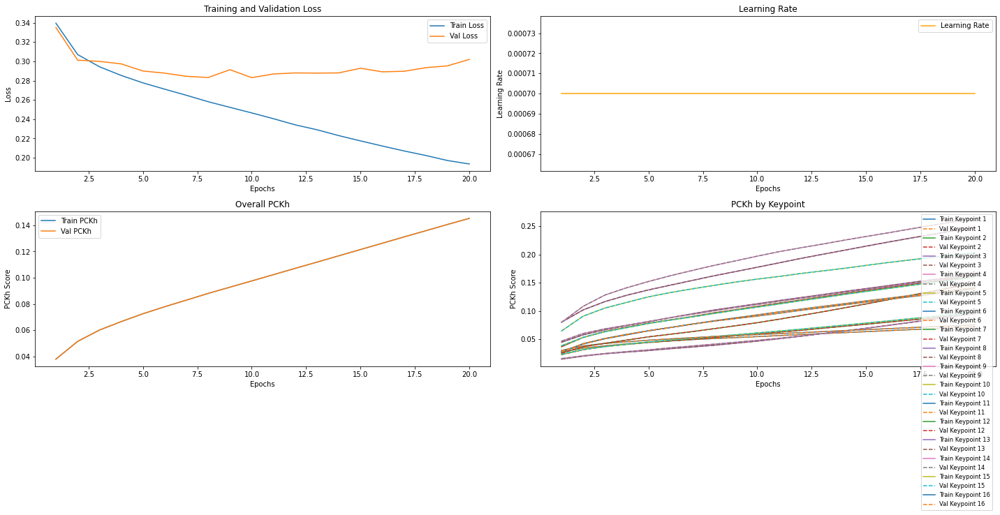

In [38]:
best_spb_model_file = spb_train(
    epochs=epochs,
    learning_rate=learning_rate,
    num_heatmap=num_heatmap,
    batch_size=batch_size,
    train_tfrecords=train_tfrecords,
    val_tfrecords=val_tfrecords
)

In [39]:
spb_model = Simplebaseline(IMAGE_SHAPE)
spb_model.load_weights(best_spb_model_file)

# WEIGHTS_PATH = os.path.join(PROJECT_PATH, 'models_custom', 'simple_baseline-epoch-10-loss-0.2831.h5')
# spb_model = Simplebaseline(IMAGE_SHAPE)
# spb_model.load_weights(WEIGHTS_PATH)

### STEP 3 : 두 모델의 비교
---
실습에서 다룬 StackedHourglass Network와 Simplebaseline 모델을 둘 다 동일한 Epoch 수만큼 학습하여 그 결과를 비교해 봅니다.

- Pose Estimation 결과 시각화 (정성적 비교)
- 학습 진행 경과 (loss 감소 현황)  

가급적 두 모델 모두 최소 3epoch 이상, (5epoch 이상 권장)을 학습하기 바랍니다.

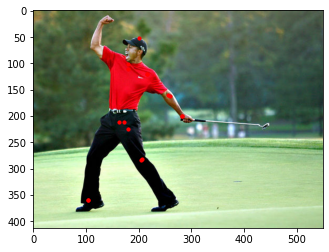

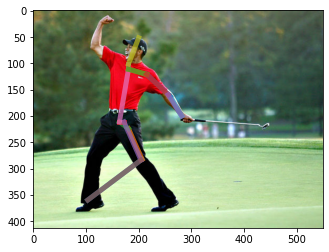

In [40]:
test_image = os.path.join(PROJECT_PATH, 'test_image.jpg')

image, keypoints = predict(spb_model, test_image)
draw_keypoints_on_image(image, keypoints)
draw_skeleton_on_image(image, keypoints)

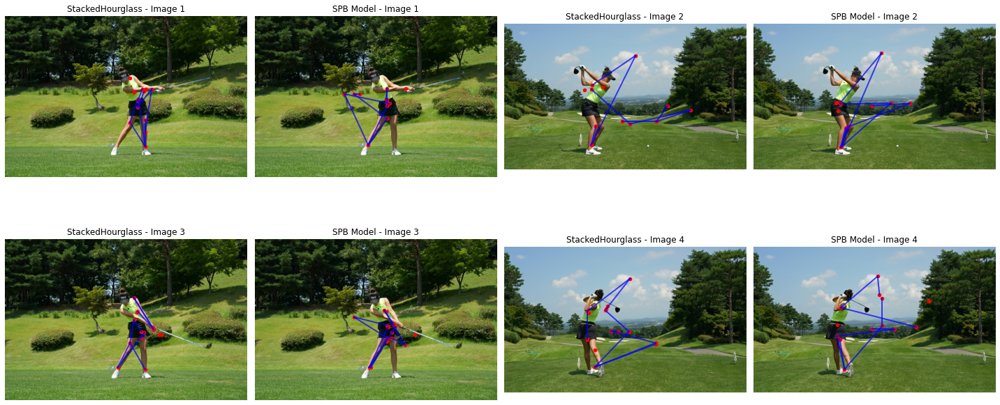

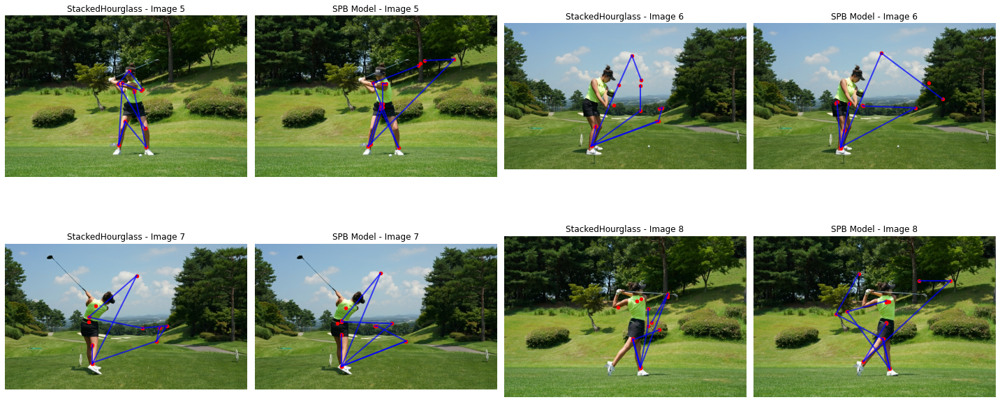

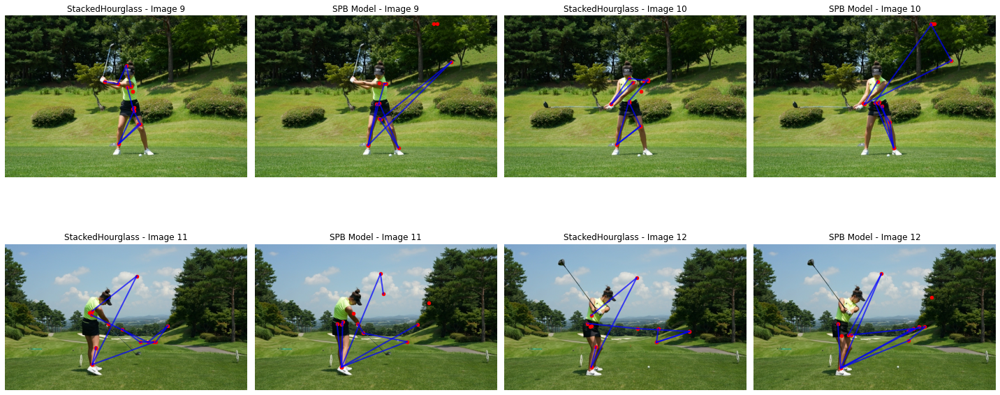

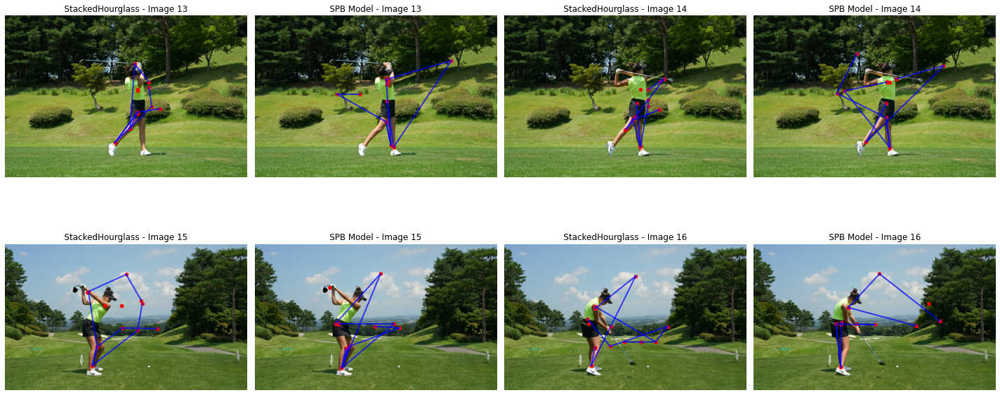

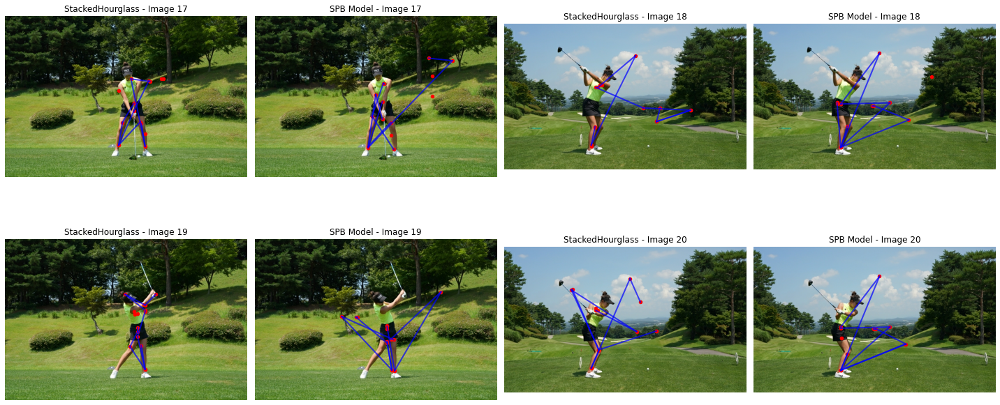

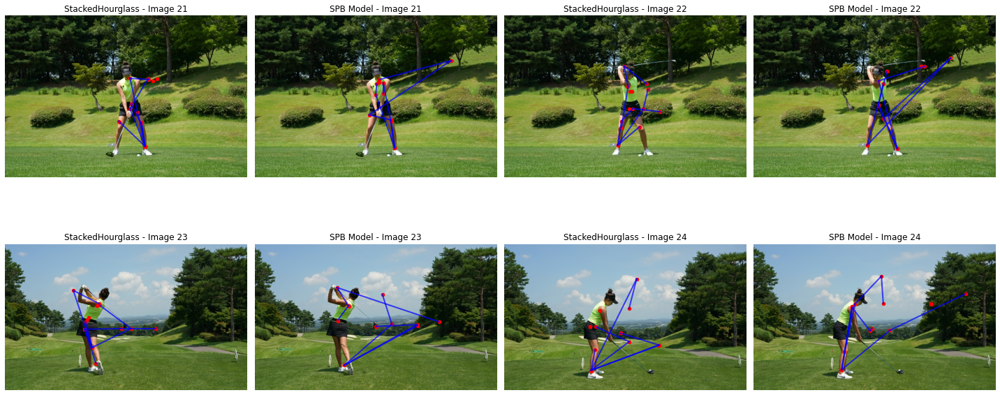

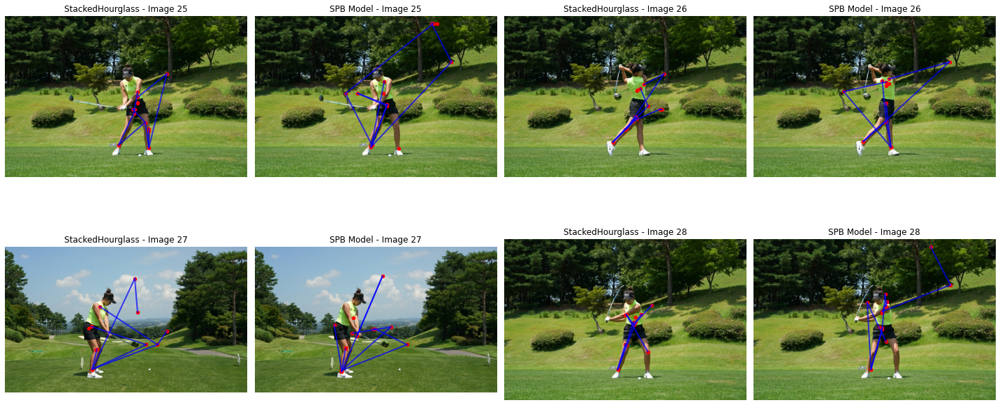

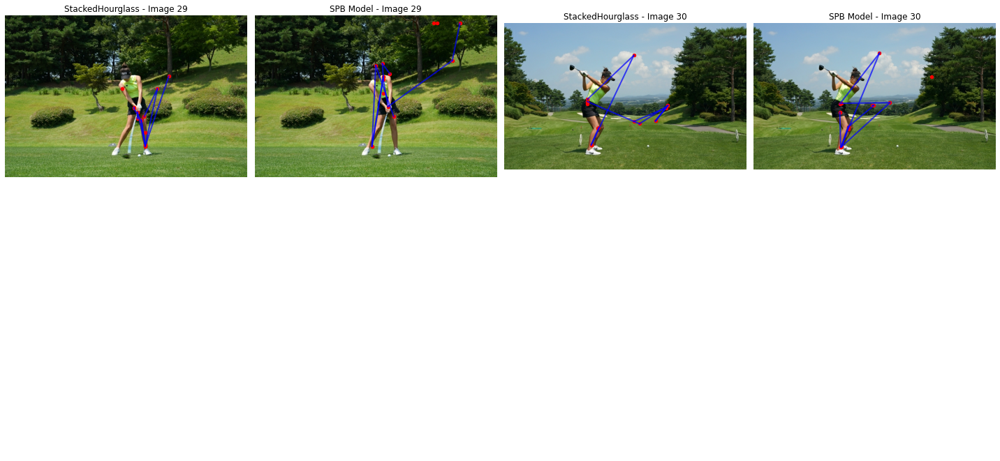

In [41]:
import os
import matplotlib.pyplot as plt
from glob import glob
import numpy as np

# Keypoint 연결 정의 (MPII 포맷 예시)
MPII_BONES = [
    (0, 1), (1, 2), (2, 3),  # 팔
    (4, 5), (5, 6), (6, 7),  # 다리
    (8, 9), (9, 10), (10, 11)  # 몸통
]

# Tensor → NumPy 변환 함수
def tensor_to_numpy(tensor):
    if hasattr(tensor, 'numpy'):
        return tensor.numpy()
    return np.array(tensor)

# 이미지 포맷 보장
def ensure_image_format(image):
    image = tensor_to_numpy(image)
    if image.dtype != np.uint8 and image.dtype != np.float32:
        image = image.astype(np.float32)
    return image

# Keypoints 시각화
def draw_keypoints_and_skeleton_on_image(ax, image, keypoints):
    """
    주어진 ax에 이미지에 keypoints 및 skeleton을 그립니다.
    """
    image = ensure_image_format(image)
    ax.imshow(image)
    joints = []
    
    # Keypoints 그리기
    for i, joint in enumerate(keypoints):
        joint_x = joint[0] * image.shape[1]
        joint_y = joint[1] * image.shape[0]
        ax.scatter(joint_x, joint_y, s=20, c='red', marker='o')
        joints.append((joint_x, joint_y))
    
    # Skeleton 그리기
    for bone in MPII_BONES:
        if bone[0] < len(joints) and bone[1] < len(joints):
            joint_1 = joints[bone[0]]
            joint_2 = joints[bone[1]]
            ax.plot(
                [joint_1[0], joint_2[0]],
                [joint_1[1], joint_2[1]],
                linewidth=2,
                alpha=0.7,
                color='blue'
            )
    ax.axis('off')

# 모델 비교 시각화
def visualize_model_comparisons(model1, model2, image_dir):
    """
    두 모델의 예측 결과를 2행 4열로 비교 시각화합니다.
    """
    # 이미지 파일 목록 가져오기
    image_files = glob(os.path.join(image_dir, '*.jpg')) + \
                  glob(os.path.join(image_dir, '*.jpeg')) + \
                  glob(os.path.join(image_dir, '*.png'))
    
    images_per_figure = 4  # 한 번에 최대 4장 표시
    
    for start_idx in range(0, len(image_files), images_per_figure):
        # 현재 처리할 이미지
        current_files = image_files[start_idx:start_idx + images_per_figure]
        
        # 새로운 figure 생성 (2행 4열)
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
        axes = axes.flatten()  # 2차원 배열을 1차원으로 변환
        
        for i, image_file in enumerate(current_files):
            # 모델 1 예측 결과
            ax_model = axes[i * 2]
            image1, keypoints1 = predict(model1, image_file)
            draw_keypoints_and_skeleton_on_image(ax_model, image1, keypoints1)
            ax_model.set_title(f'StackedHourglass - Image {start_idx + i + 1}')
            
            # 모델 2 예측 결과
            ax_spb = axes[i * 2 + 1]
            image2, keypoints2 = predict(model2, image_file)
            draw_keypoints_and_skeleton_on_image(ax_spb, image2, keypoints2)
            ax_spb.set_title(f'SPB Model - Image {start_idx + i + 1}')
        
        # 남은 빈 subplot 숨기기
        for j in range(len(current_files) * 2, len(axes)):
            axes[j].axis('off')
        
        plt.tight_layout()
        plt.show()
        plt.close()  # 메모리 해제

# 사용 예시
test_image_dir = os.path.join(PROJECT_PATH, 'test_image')
visualize_model_comparisons(model, spb_model, test_image_dir)

### Test 결과 기록
---

#### 각 모델 1 epoch 결과  

- StackedHourglass Network
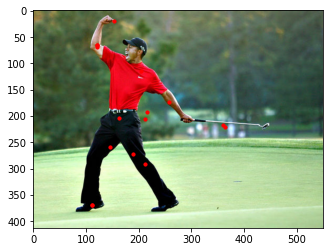
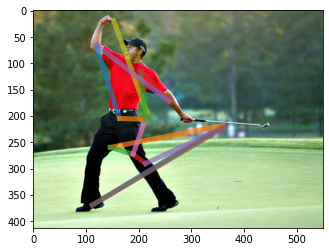  

- Simplebaseline  
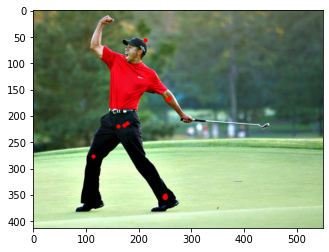
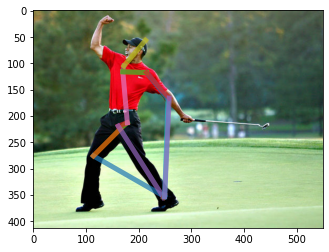

#### 각 모델 10 epoch 결과
- StackedHourglass Network
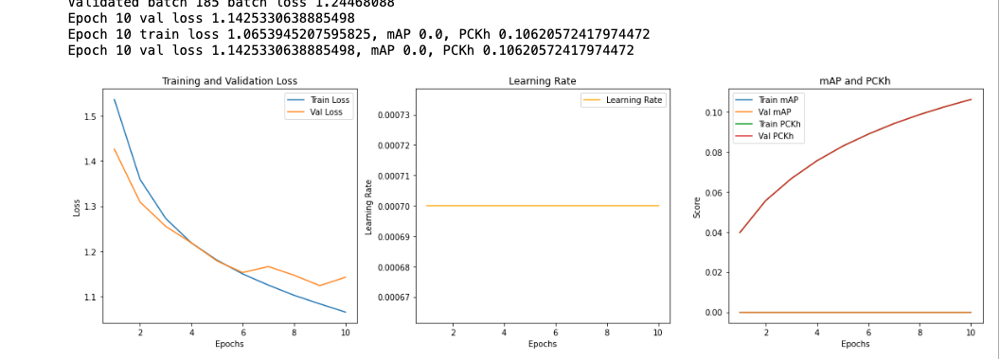
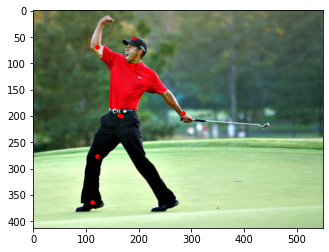
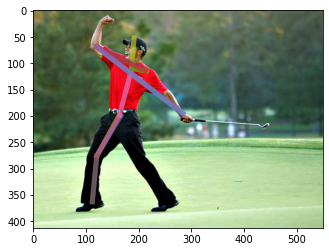

- Simplebaseline  
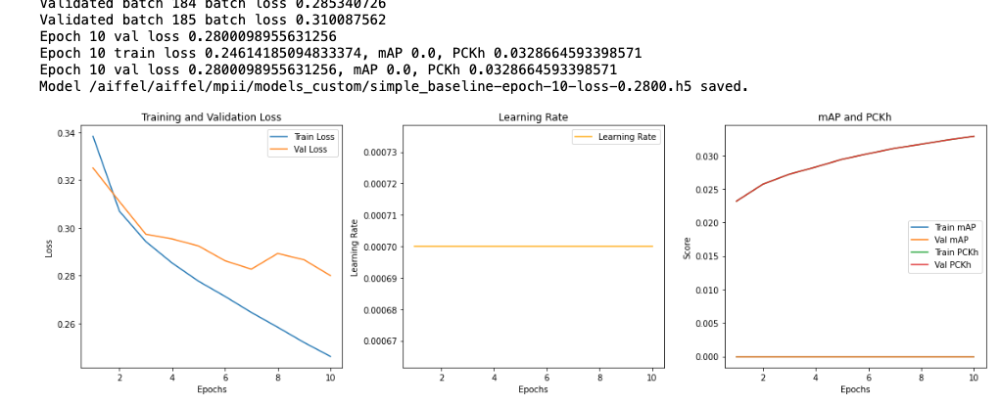
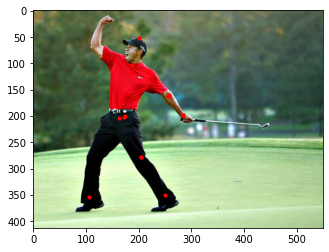
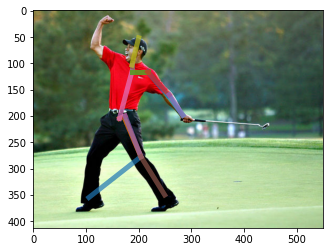

#### 각 모델 15 epoch 결과
- StackedHourglass Network
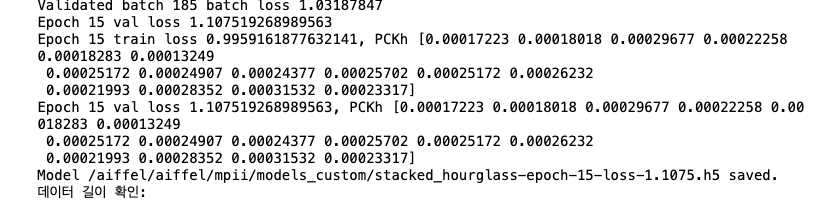
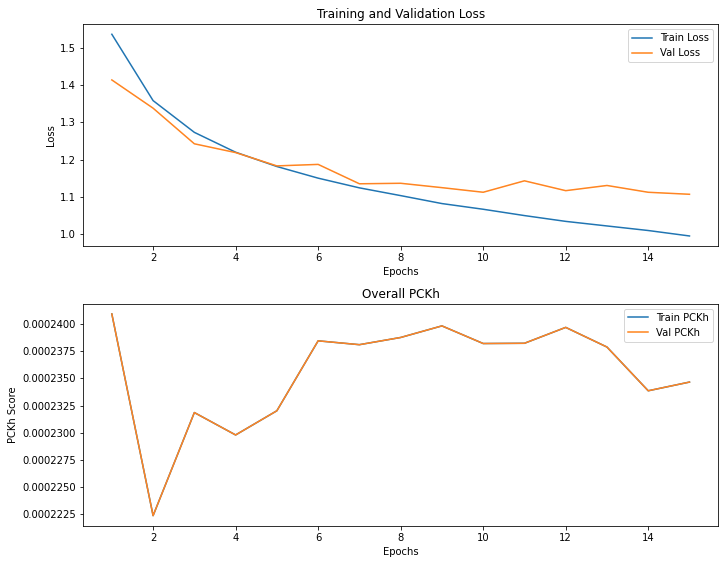
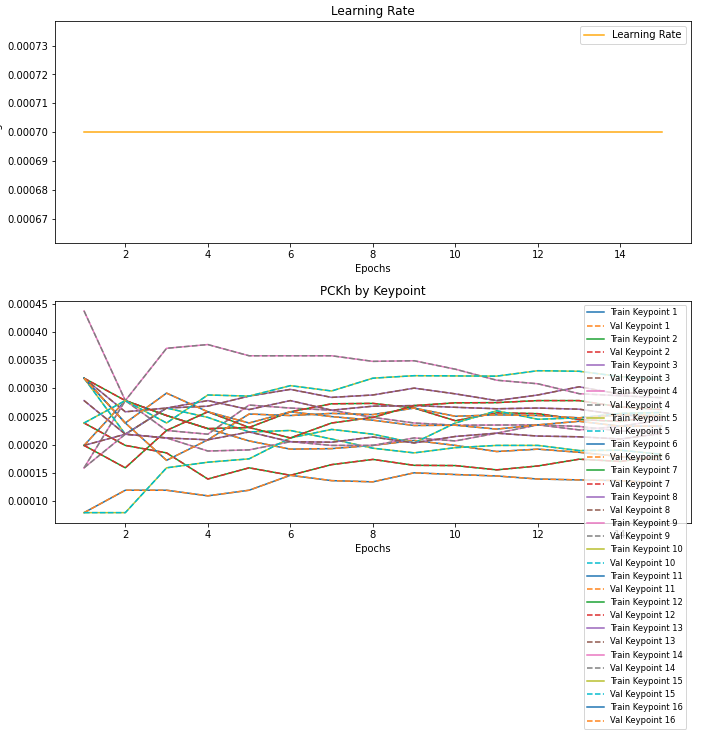
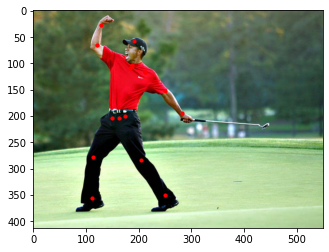
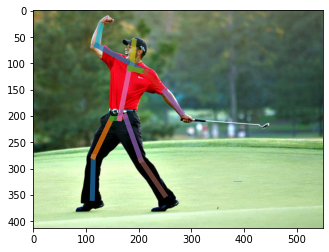  


- Simplebaseline
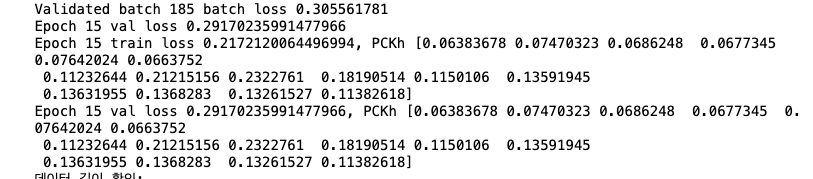
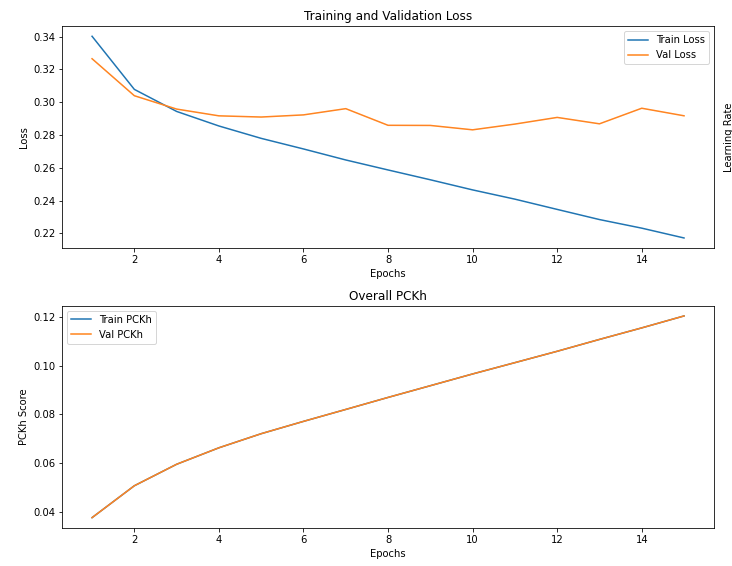
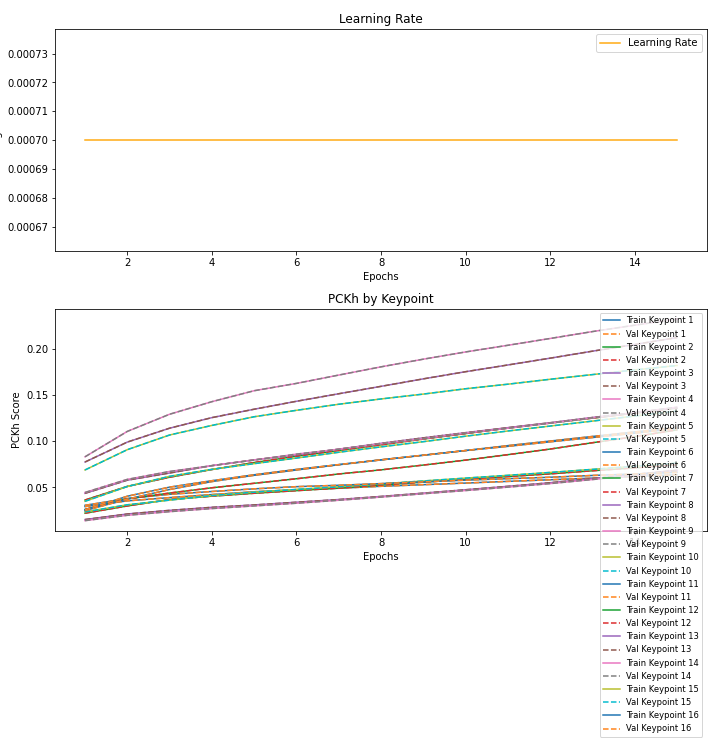
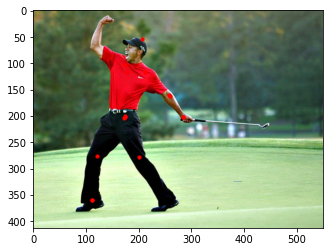
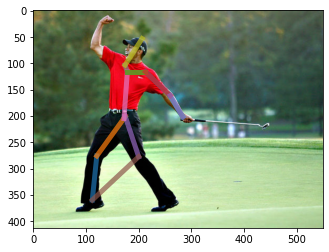

#### 각 모델 20 epoch 결과
- StackedHourglass Network  
Epoch 20 val loss 1.1019706726074219
Epoch 20 train loss 0.9398172497749329, PCKh [0.00024046 0.00016892 0.00028418 0.00021264 0.0001868  0.00016693
 0.00023052 0.0002186  0.00021463 0.00027226 0.00022258 0.00025238
 0.00026232 0.00028816 0.00028021 0.00018482]
Epoch 20 val loss 1.1019706726074219, PCKh [0.00024046 0.00016892 0.00028418 0.00021264 0.0001868  0.00016693
 0.00023052 0.0002186  0.00021463 0.00027226 0.00022258 0.00025238
 0.00026232 0.00028816 0.00028021 0.00018482]
Model /aiffel/aiffel/mpii/models_custom/stacked_hourglass-epoch-20-loss-1.1020.h5 saved.
 
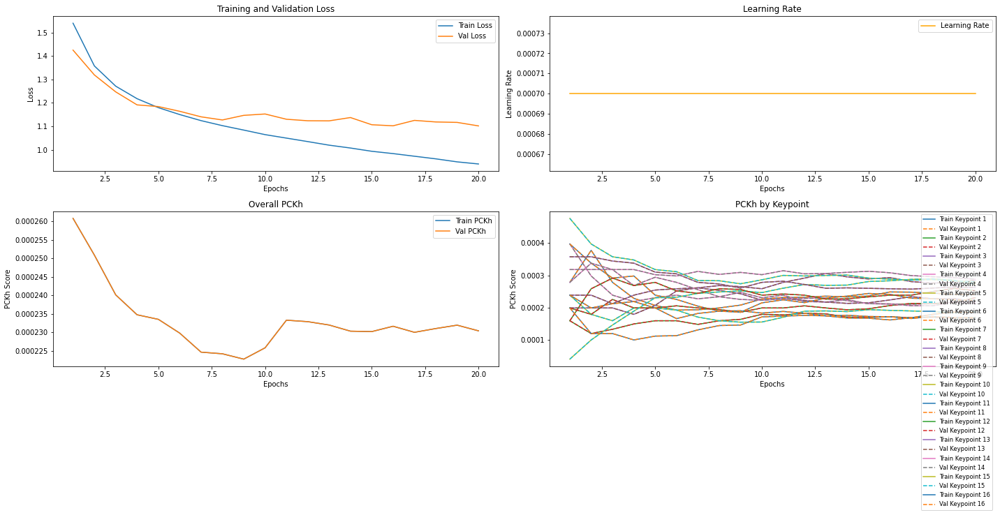
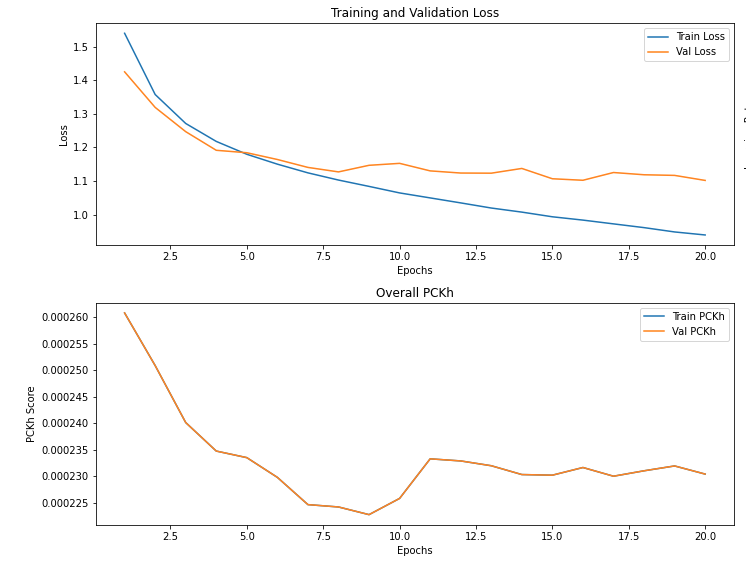
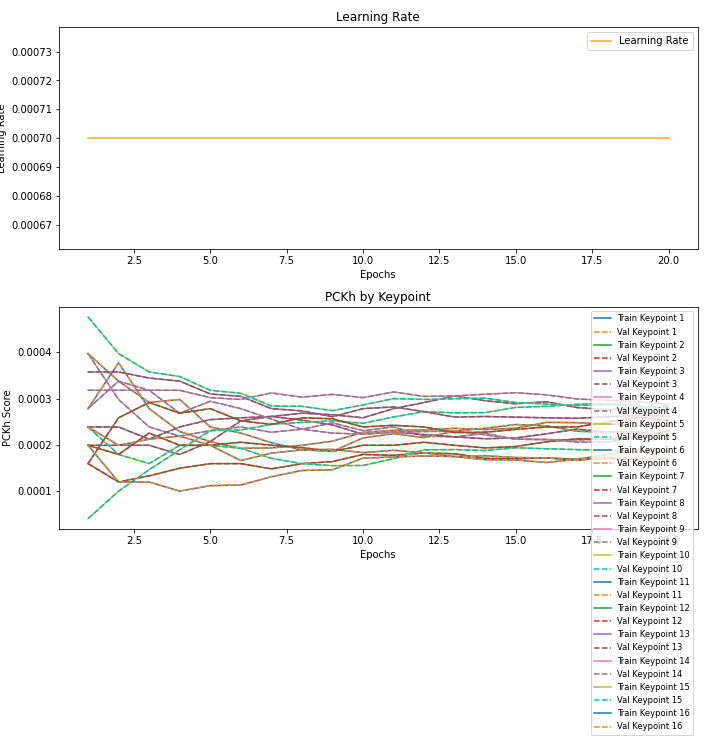

- Simplebaseline  
    Epoch 10 val loss 0.2831353545188904
Epoch 10 train loss 0.24655762314796448, PCKh [0.05468203 0.05933625 0.04670111 0.04802862 0.06119237 0.05836646
 0.07928855 0.17729332 0.19690779 0.15633148 0.09310016 0.10806041
 0.1127027  0.11145072 0.10681637 0.09099761]
Epoch 10 val loss 0.2831353545188904, PCKh [0.05468203 0.05933625 0.04670111 0.04802862 0.06119237 0.05836646
 0.07928855 0.17729332 0.19690779 0.15633148 0.09310016 0.10806041
 0.1127027  0.11145072 0.10681637 0.09099761]
Model /aiffel/aiffel/mpii/models_custom/simple_baseline-epoch-10-loss-0.2831.h5 saved.

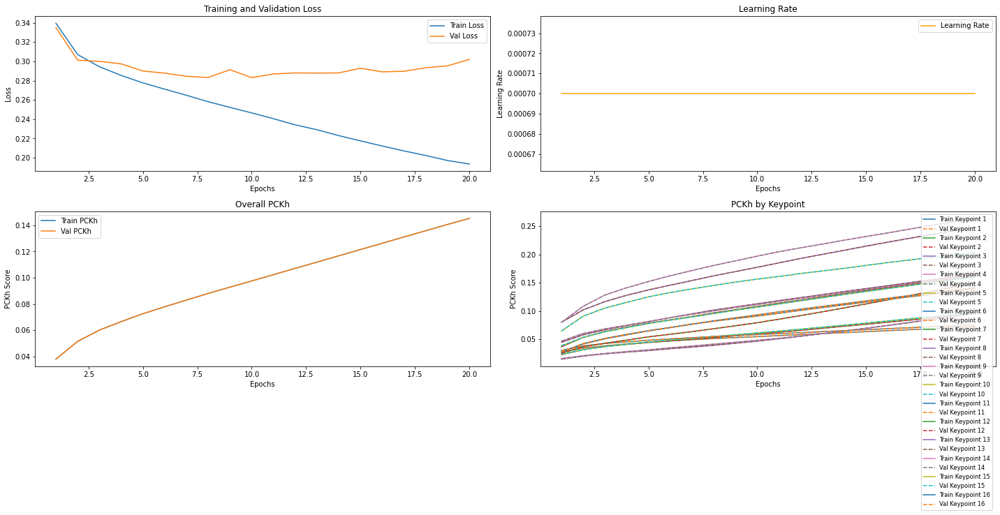
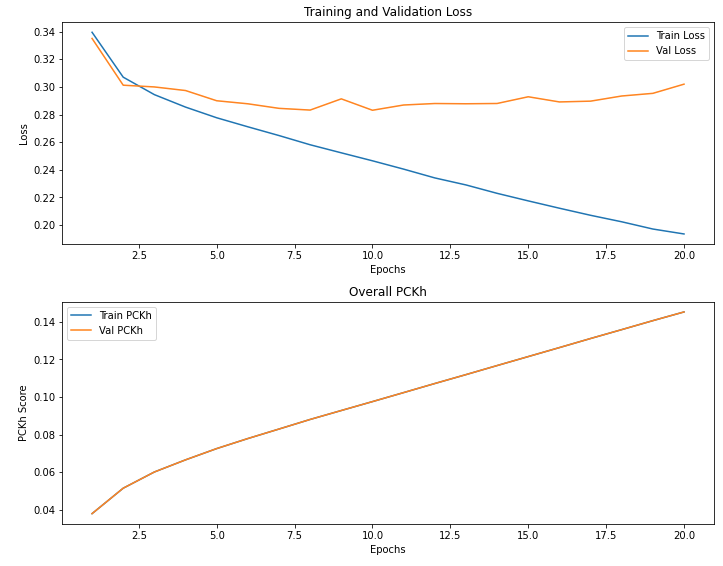
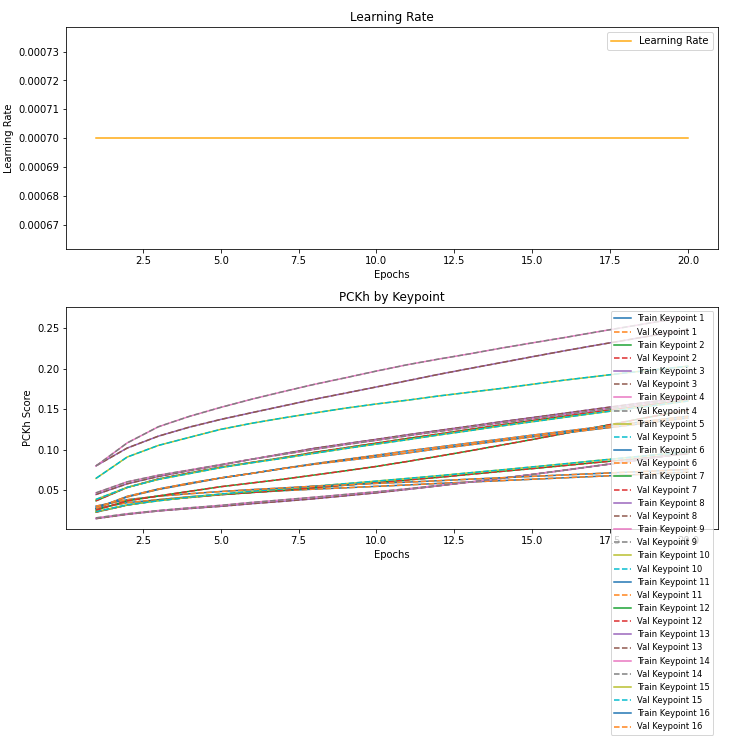

### 모델별 1 epoch 당 Train 시간
- StackedHourglass Network
    - Epoch 1 completed in 1783.27 seconds
    - Epoch 1 train loss 1.5394090414047241
      
    - Epoch 2 completed in 1659.95 seconds
    - Epoch 2 train loss 1.3573967218399048
      
    - Epoch 3 completed in 1648.77 seconds
    - Epoch 3 train loss 1.271268606185913
      
    - Epoch 4 completed in 1641.31 seconds
    - Epoch 4 train loss 1.2179170846939087
      
    - Epoch 5 completed in 1703.94 seconds
    - Epoch 5 train loss 1.1796796321868896

- Simplebaseline
    - Epoch 1 completed in 828.63 seconds
    - Epoch 1 train loss 0.33957308530807495
    
    - Epoch 2 completed in 816.67 seconds
    - Epoch 2 train loss 0.3070753216743469
    
    - Epoch 3 completed in 816.83 seconds
    - Epoch 3 train loss 0.29444175958633423
    
    - Epoch 4 completed in 839.62 seconds
    - Epoch 4 train loss 0.2854270040988922
    
    - Epoch 5 completed in 823.38 seconds
    - Epoch 5 train loss 0.2777029573917389

### 회고
- 이번 노드에서 Simplebaseline 을 학습 시키기 위해서 디버깅을 해야할 부분이 많이 있어 시간이 많이 부족했다.
- 두 모델다 10 epoch 씩 학습을 했는데 Simplebaseline loss 그래프를 보면 아직 학습이 덜 되어 보인다.
- 타이거 우즈 사진 결과를 보면 두 모델다 성능이 그리 좋게 나오지 않았다.
- metric 으로 mAP 와 PCKh 를 적용 하였는데 logic 에 문제인지 mAP는 결과가 0으로 나왔는데 정상적이지 않아 보인다.
- 디버깅이 필요한데 학습과 관련되어 있어서 시간이 필요 할 거 같다.
- 이번 노드가 프로토콜 버퍼, GPU 병렬 처리등 모델외 적인 부분이 많이 있어서 학습할 부분이 많았다. 조금더 학습이 필요하다.
- 추가 실험으로 각 모델을 15 epoch 으로 테스트를 진행 하였다.
- PCKh-0.5 에서 각 keypoint 점수와 시각화를 추가 하였다.
- StackedHourglass 의 값이 정상적이지 않아 보인다. 

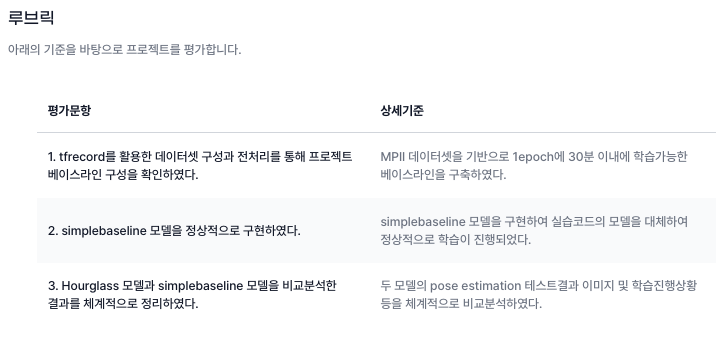